In [422]:
import sys, os
sys.path.append("../..")
sys.path.append("..")
sys.path.append(os.getcwd())

from matplotlib import pyplot as plt
from sklearn.metrics import r2_score
import numpy as np
import pandas as pd
import copy
import pickle

import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Conv1D, Flatten, Dropout

In [544]:
"""
import data
"""
print("*** importing data ***")

annual_pred = pd.read_pickle("annual_pred_2016.pkl")
target_players = list(annual_pred.columns)

data = pd.read_csv("../data/nba-enhanced-stats/2012-18_playerBoxScore.csv")

game_metrics = ['playPTS', 'playAST', 'playTO','playFG%','playFT%','play3PM','playTRB','playSTL', 'playBLK']
year_metrics = ['PTS_G','AST_G','TOV_G','TRB_G','STL_G','BLK_G','3P_G','FG%','FT%']
colname_dict = {'playPTS': 'PTS_G', 'playAST': 'AST_G', 'playTO':'TOV_G',
                'playFG%': 'FG%','playFT%':'FT%','play3PM':'3P_G',
                'playTRB':'TRB_G','playSTL':'STL_G','playBLK':'BLK_G'}

# edit column names to fit with the yearly data
data = data.rename(columns=colname_dict)

date_col = pd.to_datetime(data.gmDate + " " + data.gmTime, format='%Y-%m-%d %H:%M').rename("date")
data = pd.concat([date_col,data], axis=1)

stats_game = data[["date","gmDate","playDispNm"]+year_metrics]
stats_game = stats_game.rename(columns={"playDispNm": "Player"})

df = pd.read_pickle("../data/nba-hosoi/nba_scores_2103-2018.pkl")
df = df[["nbaId","path","game_date","home","away","season"]].drop_duplicates().reset_index(drop=True)

a = pd.concat([df,(df["game_date"] + str(" ") + df["home"]).rename("key")], axis=1)
b = pd.concat([df,(df["game_date"] + str(" ") + df["away"]).rename("key")], axis=1)
appended = pd.concat([a,b], axis=0)

new_data = pd.concat([data, (data["gmDate"] + str(" ") + data["teamAbbr"]).rename("key")], axis=1)
data_fin = new_data.merge(appended, how='left', left_on='key', right_on='key')


stats_game = data_fin[["date","gmDate","gmTime","nbaId","playDispNm"]+year_metrics]
stats_game = stats_game.rename(columns={"playDispNm": "Player"})


player_list_1 = ['Stephen Curry', 'Kevin Durant', 'LeBron James', 'Russell Westbrook', 'James Harden', 'Paul George', 'Kyrie Irving', 'Chris Paul']
player_list_2 = ['Al Horford','Trevor Ariza','Eric Gordon']

*** importing data ***


# first model
- the same input as tslib univariate time series prediction
- no repetitive use of the data
- only using PTS_G

In [641]:
# player_name = "LeBron James"
player_name = player_list_2[0]
trainDate = "2017-08-01"
size=6

############
player_stat = stats_game[stats_game.Player == player_name]
player_stat.index= player_stat.date
trainDF = player_stat[player_stat.index < trainDate].iloc[:,5:]
testDF = player_stat[player_stat.index >= trainDate].iloc[:,5:]
testDF = pd.concat([trainDF[-size:], testDF])

# train
data_train = np.array([[]])
data_train.shape = (0,size)
label_train = np.array([[]])
label_train.shape = (0,1)
for i in range(int(trainDF.shape[0]/size)):
    data_train = np.vstack((data_train,trainDF["PTS_G"].values[i*(size):(i+1)*size]))
    label_train = np.vstack((label_train, trainDF["PTS_G"].values[(i+1)*size]))

# test
data_test = np.array([[[]]])
data_test.shape = (0,size)
for i in range(testDF.shape[0]-size):
    data_test = np.vstack((data_test, testDF["PTS_G"].values[i:i+size]))
label_test = testDF.iloc[size:].PTS_G.values

print(data_train.shape)
print(label_train.shape)
print(data_test.shape)
print(label_test.shape)

model_1 = Sequential([
    Dense(32, activation = 'relu', input_shape = (size,)),
    Dense(64, activation = 'relu'),
#     Dropout(0.2),
    Dense(32, activation = 'relu'),
    Dense(16, activation ='relu'),
    Dense(1, activation = 'relu')
])

# For a mean squared error regression problem
model_1.compile(optimizer='rmsprop',loss='mse')
model_1.summary()

(54, 6)
(54, 1)
(72, 6)
(72,)
Model: "sequential_218"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1010 (Dense)           (None, 32)                224       
_________________________________________________________________
dense_1011 (Dense)           (None, 64)                2112      
_________________________________________________________________
dense_1012 (Dense)           (None, 32)                2080      
_________________________________________________________________
dense_1013 (Dense)           (None, 16)                528       
_________________________________________________________________
dense_1014 (Dense)           (None, 1)                 17        
Total params: 4,961
Trainable params: 4,961
Non-trainable params: 0
_________________________________________________________________


Epoch 1/10
54/54 [==============================] - 1s 12ms/step - loss: 96.4967
Epoch 2/10
54/54 [==============================] - 0s 454us/step - loss: 42.0410
Epoch 3/10
54/54 [==============================] - 0s 130us/step - loss: 36.9589
Epoch 4/10
54/54 [==============================] - 0s 201us/step - loss: 35.9179
Epoch 5/10
54/54 [==============================] - 0s 158us/step - loss: 38.9436
Epoch 6/10
54/54 [==============================] - 0s 116us/step - loss: 35.8080
Epoch 7/10
54/54 [==============================] - 0s 163us/step - loss: 34.2763
Epoch 8/10
54/54 [==============================] - 0s 116us/step - loss: 35.1353
Epoch 9/10
54/54 [==============================] - 0s 126us/step - loss: 36.8223
Epoch 10/10
54/54 [==============================] - 0s 104us/step - loss: 33.8988


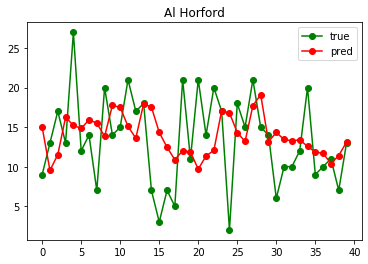

RMSE for the first 10 games
10/10 [==============================] - 0s 4ms/step
6.0299754006562525
RMSE for the the whole test set
72/72 [==============================] - 0s 54us/step
5.66870579775328


In [642]:
model_1.fit(data_train, label_train, epochs=10, batch_size=32)

pred = model_1.predict(data_test).T.flatten()

plt.plot(label_test[:40], color="green", label ="true", marker='o')
plt.plot(pred[:40], color="red", label="pred", marker='o')
plt.legend()
plt.title(player_name)
plt.show()

print("RMSE for the first 10 games")
print(np.sqrt(model_1.evaluate(data_test[:10], label_test[:10])))
print("RMSE for the the whole test set")
print(np.sqrt(model_1.evaluate(data_test, label_test)))

# second model
- the same input as tslib univariate time series prediction
- but repetitive use of the data (sliding window)
- only using PTS_G

In [568]:
# player_name = "LeBron James"
trainDate = "2017-08-01"
size=10
# num_of_features=1
############
player_stat = stats_game[stats_game.Player == player_name]
player_stat.index= player_stat.date
trainDF = player_stat[player_stat.index < trainDate].iloc[:,5:]
testDF = player_stat[player_stat.index >= trainDate].iloc[:,5:]
testDF = pd.concat([trainDF[-size:], testDF])

data_train = np.array([[]])
data_train.shape = (0,size)
for i in range(trainDF.shape[0]-size):
    data_train = np.vstack((data_train,trainDF["PTS_G"].values[i:i+size]))

label_train = trainDF.iloc[size:].PTS_G.values

data_test = np.array([[[]]])
data_test.shape = (0,size)
for i in range(testDF.shape[0]-size):
    data_test = np.vstack((data_test, testDF["PTS_G"].values[i:i+size]))

label_test = testDF.iloc[size:].PTS_G.values

print(data_train.shape)
print(label_train.shape)
print(data_test.shape)
print(label_test.shape)

model_2 = Sequential([
    Dense(32, activation = 'relu', input_shape = (size,)),
    Dense(64, activation = 'relu'),
#     Dropout(0.2),
    Dense(32, activation = 'relu'),
    Dense(16, activation ='relu'),
    Dense(1, activation = 'relu')
])

# For a mean squared error regression problem
model_2.compile(optimizer='rmsprop',loss='mse')

model_2.summary()

(319, 10)
(319,)
(72, 10)
(72,)
Model: "sequential_140"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_620 (Dense)            (None, 32)                352       
_________________________________________________________________
dense_621 (Dense)            (None, 64)                2112      
_________________________________________________________________
dense_622 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_623 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_624 (Dense)            (None, 1)                 17        
Total params: 5,089
Trainable params: 5,089
Non-trainable params: 0
_________________________________________________________________


Epoch 1/100000
319/319 [==============================] - 0s 86us/step - loss: 12.0310
Epoch 2/100000
319/319 [==============================] - 0s 38us/step - loss: 11.1818
Epoch 3/100000
319/319 [==============================] - 0s 41us/step - loss: 9.6023
Epoch 4/100000
319/319 [==============================] - 0s 42us/step - loss: 9.0559
Epoch 5/100000
319/319 [==============================] - 0s 38us/step - loss: 9.1802
Epoch 6/100000
319/319 [==============================] - 0s 41us/step - loss: 8.2443
Epoch 7/100000
319/319 [==============================] - 0s 41us/step - loss: 7.8891
Epoch 8/100000
319/319 [==============================] - 0s 40us/step - loss: 8.2541
Epoch 9/100000
319/319 [==============================] - 0s 37us/step - loss: 7.8343
Epoch 10/100000
319/319 [==============================] - 0s 39us/step - loss: 8.2034
Epoch 11/100000
319/319 [==============================] - 0s 42us/step - loss: 6.6868
Epoch 12/100000
319/319 [=========================

319/319 [==============================] - 0s 97us/step - loss: 3.2160
Epoch 96/100000
319/319 [==============================] - 0s 84us/step - loss: 3.0317
Epoch 97/100000
319/319 [==============================] - 0s 72us/step - loss: 3.2441
Epoch 98/100000
319/319 [==============================] - 0s 53us/step - loss: 3.7421
Epoch 99/100000
319/319 [==============================] - 0s 49us/step - loss: 3.3033
Epoch 100/100000
319/319 [==============================] - 0s 42us/step - loss: 3.1321
Epoch 101/100000
319/319 [==============================] - 0s 38us/step - loss: 3.1583
Epoch 102/100000
319/319 [==============================] - 0s 38us/step - loss: 3.4678
Epoch 103/100000
319/319 [==============================] - 0s 53us/step - loss: 3.1734
Epoch 104/100000
319/319 [==============================] - 0s 48us/step - loss: 2.9121
Epoch 105/100000
319/319 [==============================] - 0s 44us/step - loss: 2.9358
Epoch 106/100000
319/319 [===========================

319/319 [==============================] - 0s 39us/step - loss: 2.4134
Epoch 189/100000
319/319 [==============================] - 0s 46us/step - loss: 1.6867
Epoch 190/100000
319/319 [==============================] - 0s 39us/step - loss: 2.2176
Epoch 191/100000
319/319 [==============================] - 0s 39us/step - loss: 2.0127
Epoch 192/100000
319/319 [==============================] - 0s 36us/step - loss: 1.9980
Epoch 193/100000
319/319 [==============================] - 0s 37us/step - loss: 1.8094
Epoch 194/100000
319/319 [==============================] - 0s 36us/step - loss: 1.9663
Epoch 195/100000
319/319 [==============================] - 0s 38us/step - loss: 2.3562
Epoch 196/100000
319/319 [==============================] - 0s 35us/step - loss: 1.2854
Epoch 197/100000
319/319 [==============================] - 0s 35us/step - loss: 2.3967
Epoch 198/100000
319/319 [==============================] - 0s 36us/step - loss: 1.8850
Epoch 199/100000
319/319 [=======================

319/319 [==============================] - 0s 40us/step - loss: 1.4345
Epoch 282/100000
319/319 [==============================] - 0s 36us/step - loss: 1.7131
Epoch 283/100000
319/319 [==============================] - 0s 37us/step - loss: 0.6814
Epoch 284/100000
319/319 [==============================] - 0s 38us/step - loss: 1.8829
Epoch 285/100000
319/319 [==============================] - 0s 36us/step - loss: 1.3425
Epoch 286/100000
319/319 [==============================] - 0s 38us/step - loss: 0.9780
Epoch 287/100000
319/319 [==============================] - 0s 33us/step - loss: 1.9740
Epoch 288/100000
319/319 [==============================] - 0s 39us/step - loss: 0.4589
Epoch 289/100000
319/319 [==============================] - 0s 37us/step - loss: 1.9623
Epoch 290/100000
319/319 [==============================] - 0s 35us/step - loss: 0.6024
Epoch 291/100000
319/319 [==============================] - 0s 34us/step - loss: 2.3494
Epoch 292/100000
319/319 [=======================

319/319 [==============================] - 0s 35us/step - loss: 0.9614
Epoch 375/100000
319/319 [==============================] - 0s 36us/step - loss: 1.1494
Epoch 376/100000
319/319 [==============================] - 0s 34us/step - loss: 1.1861
Epoch 377/100000
319/319 [==============================] - 0s 36us/step - loss: 1.3074
Epoch 378/100000
319/319 [==============================] - 0s 33us/step - loss: 0.5832
Epoch 379/100000
319/319 [==============================] - 0s 41us/step - loss: 1.6383
Epoch 380/100000
319/319 [==============================] - 0s 37us/step - loss: 0.6879
Epoch 381/100000
319/319 [==============================] - 0s 38us/step - loss: 1.1012
Epoch 382/100000
319/319 [==============================] - 0s 34us/step - loss: 1.2472
Epoch 383/100000
319/319 [==============================] - 0s 40us/step - loss: 0.6590
Epoch 384/100000
319/319 [==============================] - 0s 36us/step - loss: 1.4605
Epoch 385/100000
319/319 [=======================

319/319 [==============================] - 0s 37us/step - loss: 1.4694
Epoch 468/100000
319/319 [==============================] - 0s 36us/step - loss: 0.6202
Epoch 469/100000
319/319 [==============================] - 0s 36us/step - loss: 1.0278
Epoch 470/100000
319/319 [==============================] - 0s 38us/step - loss: 1.1445
Epoch 471/100000
319/319 [==============================] - 0s 35us/step - loss: 0.6516
Epoch 472/100000
319/319 [==============================] - 0s 37us/step - loss: 0.9091
Epoch 473/100000
319/319 [==============================] - 0s 33us/step - loss: 1.3614
Epoch 474/100000
319/319 [==============================] - 0s 37us/step - loss: 0.6388
Epoch 475/100000
319/319 [==============================] - 0s 35us/step - loss: 1.1074
Epoch 476/100000
319/319 [==============================] - 0s 36us/step - loss: 0.5973
Epoch 477/100000
319/319 [==============================] - 0s 35us/step - loss: 1.5141
Epoch 478/100000
319/319 [=======================

319/319 [==============================] - 0s 34us/step - loss: 1.0408
Epoch 561/100000
319/319 [==============================] - 0s 36us/step - loss: 0.7692
Epoch 562/100000
319/319 [==============================] - 0s 38us/step - loss: 0.7760
Epoch 563/100000
319/319 [==============================] - 0s 35us/step - loss: 0.8914
Epoch 564/100000
319/319 [==============================] - 0s 36us/step - loss: 0.9779
Epoch 565/100000
319/319 [==============================] - 0s 33us/step - loss: 0.3126
Epoch 566/100000
319/319 [==============================] - 0s 37us/step - loss: 1.3233
Epoch 567/100000
319/319 [==============================] - 0s 34us/step - loss: 0.8287
Epoch 568/100000
319/319 [==============================] - 0s 35us/step - loss: 0.5587
Epoch 569/100000
319/319 [==============================] - 0s 43us/step - loss: 1.1541
Epoch 570/100000
319/319 [==============================] - 0s 35us/step - loss: 0.5748
Epoch 571/100000
319/319 [=======================

319/319 [==============================] - 0s 34us/step - loss: 0.8655
Epoch 654/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5920
Epoch 655/100000
319/319 [==============================] - 0s 36us/step - loss: 1.0943
Epoch 656/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5840
Epoch 657/100000
319/319 [==============================] - 0s 35us/step - loss: 0.7458
Epoch 658/100000
319/319 [==============================] - 0s 36us/step - loss: 0.7299
Epoch 659/100000
319/319 [==============================] - 0s 42us/step - loss: 0.7874
Epoch 660/100000
319/319 [==============================] - 0s 35us/step - loss: 0.8415
Epoch 661/100000
319/319 [==============================] - 0s 39us/step - loss: 0.4260
Epoch 662/100000
319/319 [==============================] - 0s 33us/step - loss: 1.2487
Epoch 663/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2430
Epoch 664/100000
319/319 [=======================

319/319 [==============================] - 0s 38us/step - loss: 0.4405
Epoch 747/100000
319/319 [==============================] - 0s 35us/step - loss: 0.6900
Epoch 748/100000
319/319 [==============================] - 0s 36us/step - loss: 0.7580
Epoch 749/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4714
Epoch 750/100000
319/319 [==============================] - 0s 44us/step - loss: 0.8409
Epoch 751/100000
319/319 [==============================] - 0s 36us/step - loss: 0.5613
Epoch 752/100000
319/319 [==============================] - 0s 42us/step - loss: 0.8155
Epoch 753/100000
319/319 [==============================] - 0s 35us/step - loss: 0.4350
Epoch 754/100000
319/319 [==============================] - 0s 39us/step - loss: 0.9766
Epoch 755/100000
319/319 [==============================] - 0s 36us/step - loss: 0.9081
Epoch 756/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3640
Epoch 757/100000
319/319 [=======================

319/319 [==============================] - 0s 39us/step - loss: 0.3125
Epoch 840/100000
319/319 [==============================] - 0s 36us/step - loss: 0.9959
Epoch 841/100000
319/319 [==============================] - 0s 35us/step - loss: 0.4026
Epoch 842/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5005
Epoch 843/100000
319/319 [==============================] - 0s 35us/step - loss: 0.8553
Epoch 844/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5817
Epoch 845/100000
319/319 [==============================] - 0s 37us/step - loss: 0.9193
Epoch 846/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3611
Epoch 847/100000
319/319 [==============================] - 0s 35us/step - loss: 0.7762
Epoch 848/100000
319/319 [==============================] - 0s 36us/step - loss: 0.6814
Epoch 849/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2665
Epoch 850/100000
319/319 [=======================

319/319 [==============================] - 0s 39us/step - loss: 0.7708
Epoch 933/100000
319/319 [==============================] - 0s 48us/step - loss: 0.7063
Epoch 934/100000
319/319 [==============================] - 0s 39us/step - loss: 0.4365
Epoch 935/100000
319/319 [==============================] - 0s 34us/step - loss: 0.7752
Epoch 936/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2706
Epoch 937/100000
319/319 [==============================] - 0s 35us/step - loss: 1.1569
Epoch 938/100000
319/319 [==============================] - 0s 41us/step - loss: 0.4474
Epoch 939/100000
319/319 [==============================] - 0s 46us/step - loss: 0.3410
Epoch 940/100000
319/319 [==============================] - 0s 38us/step - loss: 0.7508
Epoch 941/100000
319/319 [==============================] - 0s 40us/step - loss: 0.4035
Epoch 942/100000
319/319 [==============================] - 0s 41us/step - loss: 0.8613
Epoch 943/100000
319/319 [=======================

319/319 [==============================] - 0s 36us/step - loss: 0.3274
Epoch 1025/100000
319/319 [==============================] - 0s 36us/step - loss: 0.6056
Epoch 1026/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2051
Epoch 1027/100000
319/319 [==============================] - 0s 36us/step - loss: 0.9587
Epoch 1028/100000
319/319 [==============================] - 0s 44us/step - loss: 0.4106
Epoch 1029/100000
319/319 [==============================] - 0s 40us/step - loss: 0.3144
Epoch 1030/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5198
Epoch 1031/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5636
Epoch 1032/100000
319/319 [==============================] - 0s 38us/step - loss: 0.7778
Epoch 1033/100000
319/319 [==============================] - 0s 39us/step - loss: 0.4626
Epoch 1034/100000
319/319 [==============================] - 0s 40us/step - loss: 0.6737
Epoch 1035/100000
319/319 [============

319/319 [==============================] - 0s 38us/step - loss: 0.6299
Epoch 1117/100000
319/319 [==============================] - 0s 36us/step - loss: 0.6044
Epoch 1118/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3365
Epoch 1119/100000
319/319 [==============================] - 0s 34us/step - loss: 0.7913
Epoch 1120/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2863
Epoch 1121/100000
319/319 [==============================] - 0s 36us/step - loss: 0.7358
Epoch 1122/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2310
Epoch 1123/100000
319/319 [==============================] - 0s 37us/step - loss: 0.7880
Epoch 1124/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5805
Epoch 1125/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3882
Epoch 1126/100000
319/319 [==============================] - 0s 34us/step - loss: 0.6121
Epoch 1127/100000
319/319 [============

319/319 [==============================] - 0s 39us/step - loss: 0.7291
Epoch 1209/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3650
Epoch 1210/100000
319/319 [==============================] - 0s 36us/step - loss: 0.6626
Epoch 1211/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3449
Epoch 1212/100000
319/319 [==============================] - 0s 39us/step - loss: 0.6042
Epoch 1213/100000
319/319 [==============================] - 0s 34us/step - loss: 0.4372
Epoch 1214/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5268
Epoch 1215/100000
319/319 [==============================] - 0s 36us/step - loss: 0.7520
Epoch 1216/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1255
Epoch 1217/100000
319/319 [==============================] - 0s 37us/step - loss: 0.8108
Epoch 1218/100000
319/319 [==============================] - 0s 35us/step - loss: 0.3898
Epoch 1219/100000
319/319 [============

319/319 [==============================] - 0s 36us/step - loss: 0.5014
Epoch 1301/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2784
Epoch 1302/100000
319/319 [==============================] - 0s 43us/step - loss: 0.5317
Epoch 1303/100000
319/319 [==============================] - 0s 35us/step - loss: 0.5178
Epoch 1304/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3740
Epoch 1305/100000
319/319 [==============================] - 0s 39us/step - loss: 0.5355
Epoch 1306/100000
319/319 [==============================] - 0s 46us/step - loss: 0.4557
Epoch 1307/100000
319/319 [==============================] - 0s 33us/step - loss: 0.3672
Epoch 1308/100000
319/319 [==============================] - 0s 34us/step - loss: 0.7041
Epoch 1309/100000
319/319 [==============================] - 0s 35us/step - loss: 0.4427
Epoch 1310/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3630
Epoch 1311/100000
319/319 [============

319/319 [==============================] - 0s 40us/step - loss: 0.4007
Epoch 1392/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5564
Epoch 1393/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2520
Epoch 1394/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4943
Epoch 1395/100000
319/319 [==============================] - 0s 40us/step - loss: 0.5230
Epoch 1396/100000
319/319 [==============================] - 0s 39us/step - loss: 0.5211
Epoch 1397/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2712
Epoch 1398/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5313
Epoch 1399/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5598
Epoch 1400/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2316
Epoch 1401/100000
319/319 [==============================] - 0s 33us/step - loss: 0.6229
Epoch 1402/100000
319/319 [============

319/319 [==============================] - 0s 35us/step - loss: 0.5257
Epoch 1484/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5351
Epoch 1485/100000
319/319 [==============================] - 0s 42us/step - loss: 0.4665
Epoch 1486/100000
319/319 [==============================] - 0s 36us/step - loss: 0.4882
Epoch 1487/100000
319/319 [==============================] - 0s 33us/step - loss: 0.4078
Epoch 1488/100000
319/319 [==============================] - 0s 40us/step - loss: 0.4808
Epoch 1489/100000
319/319 [==============================] - 0s 35us/step - loss: 0.4417
Epoch 1490/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3259
Epoch 1491/100000
319/319 [==============================] - 0s 33us/step - loss: 0.6314
Epoch 1492/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2531
Epoch 1493/100000
319/319 [==============================] - 0s 39us/step - loss: 0.6901
Epoch 1494/100000
319/319 [============

319/319 [==============================] - 0s 34us/step - loss: 0.2392
Epoch 1576/100000
319/319 [==============================] - 0s 38us/step - loss: 0.7125
Epoch 1577/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1095
Epoch 1578/100000
319/319 [==============================] - 0s 39us/step - loss: 0.6254
Epoch 1579/100000
319/319 [==============================] - 0s 40us/step - loss: 0.3501
Epoch 1580/100000
319/319 [==============================] - 0s 33us/step - loss: 0.1867
Epoch 1581/100000
319/319 [==============================] - 0s 43us/step - loss: 0.5942
Epoch 1582/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5125
Epoch 1583/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3916
Epoch 1584/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2926
Epoch 1585/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5597
Epoch 1586/100000
319/319 [============

319/319 [==============================] - 0s 39us/step - loss: 0.3198
Epoch 1668/100000
319/319 [==============================] - 0s 35us/step - loss: 0.3824
Epoch 1669/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2401
Epoch 1670/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4278
Epoch 1671/100000
319/319 [==============================] - 0s 35us/step - loss: 0.7118
Epoch 1672/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1122
Epoch 1673/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5474
Epoch 1674/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2349
Epoch 1675/100000
319/319 [==============================] - 0s 35us/step - loss: 0.6108
Epoch 1676/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2449
Epoch 1677/100000
319/319 [==============================] - 0s 38us/step - loss: 0.6778
Epoch 1678/100000
319/319 [============

319/319 [==============================] - 0s 39us/step - loss: 0.3576
Epoch 1760/100000
319/319 [==============================] - 0s 56us/step - loss: 0.4051
Epoch 1761/100000
319/319 [==============================] - 0s 47us/step - loss: 0.3094
Epoch 1762/100000
319/319 [==============================] - 0s 48us/step - loss: 0.5347
Epoch 1763/100000
319/319 [==============================] - 0s 46us/step - loss: 0.3325
Epoch 1764/100000
319/319 [==============================] - 0s 44us/step - loss: 0.4645
Epoch 1765/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2682
Epoch 1766/100000
319/319 [==============================] - 0s 35us/step - loss: 0.3751
Epoch 1767/100000
319/319 [==============================] - 0s 33us/step - loss: 0.6404
Epoch 1768/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1805
Epoch 1769/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5142
Epoch 1770/100000
319/319 [============

319/319 [==============================] - 0s 41us/step - loss: 0.5988
Epoch 1852/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2347
Epoch 1853/100000
319/319 [==============================] - 0s 46us/step - loss: 0.3883
Epoch 1854/100000
319/319 [==============================] - 0s 38us/step - loss: 0.5276
Epoch 1855/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1866
Epoch 1856/100000
319/319 [==============================] - 0s 37us/step - loss: 0.5093
Epoch 1857/100000
319/319 [==============================] - 0s 44us/step - loss: 0.4459
Epoch 1858/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2357
Epoch 1859/100000
319/319 [==============================] - 0s 39us/step - loss: 0.4845
Epoch 1860/100000
319/319 [==============================] - 0s 35us/step - loss: 0.3610
Epoch 1861/100000
319/319 [==============================] - 0s 34us/step - loss: 0.5010
Epoch 1862/100000
319/319 [============

319/319 [==============================] - 0s 34us/step - loss: 0.3645
Epoch 1944/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3903
Epoch 1945/100000
319/319 [==============================] - 0s 42us/step - loss: 0.3919
Epoch 1946/100000
319/319 [==============================] - 0s 34us/step - loss: 0.3728
Epoch 1947/100000
319/319 [==============================] - 0s 33us/step - loss: 0.4077
Epoch 1948/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2369
Epoch 1949/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3628
Epoch 1950/100000
319/319 [==============================] - 0s 36us/step - loss: 0.4535
Epoch 1951/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4121
Epoch 1952/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1710
Epoch 1953/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4767
Epoch 1954/100000
319/319 [============

319/319 [==============================] - 0s 41us/step - loss: 0.4754
Epoch 2036/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2722
Epoch 2037/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3975
Epoch 2038/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1332
Epoch 2039/100000
319/319 [==============================] - 0s 40us/step - loss: 0.4830
Epoch 2040/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3081
Epoch 2041/100000
319/319 [==============================] - 0s 41us/step - loss: 0.4201
Epoch 2042/100000
319/319 [==============================] - 0s 41us/step - loss: 0.3608
Epoch 2043/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3539
Epoch 2044/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3834
Epoch 2045/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3540
Epoch 2046/100000
319/319 [============

319/319 [==============================] - 0s 35us/step - loss: 0.2652
Epoch 2128/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2319
Epoch 2129/100000
319/319 [==============================] - 0s 48us/step - loss: 0.5009
Epoch 2130/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2337
Epoch 2131/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4816
Epoch 2132/100000
319/319 [==============================] - 0s 32us/step - loss: 0.2382
Epoch 2133/100000
319/319 [==============================] - 0s 38us/step - loss: 0.4021
Epoch 2134/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2845
Epoch 2135/100000
319/319 [==============================] - 0s 39us/step - loss: 0.4841
Epoch 2136/100000
319/319 [==============================] - 0s 32us/step - loss: 0.1373
Epoch 2137/100000
319/319 [==============================] - 0s 39us/step - loss: 0.5095
Epoch 2138/100000
319/319 [============

319/319 [==============================] - 0s 40us/step - loss: 0.4075
Epoch 2220/100000
319/319 [==============================] - 0s 48us/step - loss: 0.2609
Epoch 2221/100000
319/319 [==============================] - 0s 44us/step - loss: 0.4015
Epoch 2222/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2374
Epoch 2223/100000
319/319 [==============================] - 0s 40us/step - loss: 0.5658
Epoch 2224/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1662
Epoch 2225/100000
319/319 [==============================] - 0s 41us/step - loss: 0.4092
Epoch 2226/100000
319/319 [==============================] - 0s 48us/step - loss: 0.3017
Epoch 2227/100000
319/319 [==============================] - 0s 34us/step - loss: 0.5091
Epoch 2228/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1549
Epoch 2229/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3893
Epoch 2230/100000
319/319 [============

319/319 [==============================] - 0s 39us/step - loss: 0.1651
Epoch 2312/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2585
Epoch 2313/100000
319/319 [==============================] - 0s 42us/step - loss: 0.5100
Epoch 2314/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1110
Epoch 2315/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4531
Epoch 2316/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1666
Epoch 2317/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3967
Epoch 2318/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2835
Epoch 2319/100000
319/319 [==============================] - 0s 35us/step - loss: 0.3705
Epoch 2320/100000
319/319 [==============================] - 0s 34us/step - loss: 0.3291
Epoch 2321/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3458
Epoch 2322/100000
319/319 [============

319/319 [==============================] - 0s 36us/step - loss: 0.5079
Epoch 2404/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2296
Epoch 2405/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0818
Epoch 2406/100000
319/319 [==============================] - 0s 39us/step - loss: 0.4143
Epoch 2407/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1331
Epoch 2408/100000
319/319 [==============================] - 0s 36us/step - loss: 0.5966
Epoch 2409/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1564
Epoch 2410/100000
319/319 [==============================] - 0s 36us/step - loss: 0.4526
Epoch 2411/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2626
Epoch 2412/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2675
Epoch 2413/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3575
Epoch 2414/100000
319/319 [============

319/319 [==============================] - 0s 36us/step - loss: 0.3248
Epoch 2496/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2782
Epoch 2497/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3014
Epoch 2498/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2121
Epoch 2499/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3832
Epoch 2500/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2806
Epoch 2501/100000
319/319 [==============================] - 0s 36us/step - loss: 0.4004
Epoch 2502/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2187
Epoch 2503/100000
319/319 [==============================] - 0s 38us/step - loss: 0.4645
Epoch 2504/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2386
Epoch 2505/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1862
Epoch 2506/100000
319/319 [============

319/319 [==============================] - 0s 36us/step - loss: 0.3587
Epoch 2588/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3444
Epoch 2589/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1581
Epoch 2590/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3967
Epoch 2591/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2536
Epoch 2592/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3098
Epoch 2593/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2530
Epoch 2594/100000
319/319 [==============================] - 0s 41us/step - loss: 0.4172
Epoch 2595/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1363
Epoch 2596/100000
319/319 [==============================] - 0s 39us/step - loss: 0.5299
Epoch 2597/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1565
Epoch 2598/100000
319/319 [============

319/319 [==============================] - 0s 36us/step - loss: 0.3031
Epoch 2680/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3985
Epoch 2681/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2524
Epoch 2682/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1621
Epoch 2683/100000
319/319 [==============================] - 0s 40us/step - loss: 0.3649
Epoch 2684/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3534
Epoch 2685/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2866
Epoch 2686/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2329
Epoch 2687/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3671
Epoch 2688/100000
319/319 [==============================] - 0s 34us/step - loss: 0.3661
Epoch 2689/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1133
Epoch 2690/100000
319/319 [============

319/319 [==============================] - 0s 41us/step - loss: 0.1294
Epoch 2772/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4164
Epoch 2773/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2810
Epoch 2774/100000
319/319 [==============================] - 0s 42us/step - loss: 0.2543
Epoch 2775/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2906
Epoch 2776/100000
319/319 [==============================] - 0s 41us/step - loss: 0.3465
Epoch 2777/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1908
Epoch 2778/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3624
Epoch 2779/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1499
Epoch 2780/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2991
Epoch 2781/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2896
Epoch 2782/100000
319/319 [============

319/319 [==============================] - 0s 38us/step - loss: 0.3524
Epoch 2864/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2715
Epoch 2865/100000
319/319 [==============================] - 0s 44us/step - loss: 0.2002
Epoch 2866/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3563
Epoch 2867/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2366
Epoch 2868/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3006
Epoch 2869/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1544
Epoch 2870/100000
319/319 [==============================] - 0s 34us/step - loss: 0.3292
Epoch 2871/100000
319/319 [==============================] - 0s 36us/step - loss: 0.4384
Epoch 2872/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1291
Epoch 2873/100000
319/319 [==============================] - 0s 38us/step - loss: 0.4229
Epoch 2874/100000
319/319 [============

319/319 [==============================] - 0s 37us/step - loss: 0.1543
Epoch 2956/100000
319/319 [==============================] - 0s 40us/step - loss: 0.3499
Epoch 2957/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2946
Epoch 2958/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2807
Epoch 2959/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1951
Epoch 2960/100000
319/319 [==============================] - 0s 46us/step - loss: 0.2921
Epoch 2961/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3712
Epoch 2962/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2134
Epoch 2963/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2581
Epoch 2964/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2468
Epoch 2965/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2355
Epoch 2966/100000
319/319 [============

319/319 [==============================] - 0s 46us/step - loss: 0.3131
Epoch 3048/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2287
Epoch 3049/100000
319/319 [==============================] - 0s 46us/step - loss: 0.3014
Epoch 3050/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1894
Epoch 3051/100000
319/319 [==============================] - 0s 63us/step - loss: 0.2440
Epoch 3052/100000
319/319 [==============================] - 0s 58us/step - loss: 0.3155
Epoch 3053/100000
319/319 [==============================] - 0s 49us/step - loss: 0.2584
Epoch 3054/100000
319/319 [==============================] - 0s 54us/step - loss: 0.2844
Epoch 3055/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1770
Epoch 3056/100000
319/319 [==============================] - 0s 48us/step - loss: 0.4644
Epoch 3057/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0717
Epoch 3058/100000
319/319 [============

319/319 [==============================] - 0s 46us/step - loss: 0.1741
Epoch 3140/100000
319/319 [==============================] - 0s 43us/step - loss: 0.5404
Epoch 3141/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2063
Epoch 3142/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1938
Epoch 3143/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1221
Epoch 3144/100000
319/319 [==============================] - 0s 44us/step - loss: 0.3676
Epoch 3145/100000
319/319 [==============================] - 0s 42us/step - loss: 0.2940
Epoch 3146/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2207
Epoch 3147/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3055
Epoch 3148/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1926
Epoch 3149/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2977
Epoch 3150/100000
319/319 [============

319/319 [==============================] - 0s 34us/step - loss: 0.0814
Epoch 3232/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3311
Epoch 3233/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3300
Epoch 3234/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1760
Epoch 3235/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2568
Epoch 3236/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3355
Epoch 3237/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1506
Epoch 3238/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3396
Epoch 3239/100000
319/319 [==============================] - 0s 33us/step - loss: 0.1963
Epoch 3240/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3465
Epoch 3241/100000
319/319 [==============================] - 0s 33us/step - loss: 0.1668
Epoch 3242/100000
319/319 [============

319/319 [==============================] - 0s 37us/step - loss: 0.2318
Epoch 3324/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2624
Epoch 3325/100000
319/319 [==============================] - 0s 33us/step - loss: 0.1804
Epoch 3326/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1923
Epoch 3327/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2308
Epoch 3328/100000
319/319 [==============================] - 0s 46us/step - loss: 0.2832
Epoch 3329/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2767
Epoch 3330/100000
319/319 [==============================] - 0s 33us/step - loss: 0.0655
Epoch 3331/100000
319/319 [==============================] - 0s 37us/step - loss: 0.4469
Epoch 3332/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1626
Epoch 3333/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2108
Epoch 3334/100000
319/319 [============

319/319 [==============================] - 0s 37us/step - loss: 0.1255
Epoch 3416/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2462
Epoch 3417/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2466
Epoch 3418/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2237
Epoch 3419/100000
319/319 [==============================] - 0s 33us/step - loss: 0.2164
Epoch 3420/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3395
Epoch 3421/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2456
Epoch 3422/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3055
Epoch 3423/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0694
Epoch 3424/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3532
Epoch 3425/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0802
Epoch 3426/100000
319/319 [============

319/319 [==============================] - 0s 36us/step - loss: 0.1904
Epoch 3508/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2644
Epoch 3509/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3056
Epoch 3510/100000
319/319 [==============================] - 0s 43us/step - loss: 0.2356
Epoch 3511/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1816
Epoch 3512/100000
319/319 [==============================] - 0s 33us/step - loss: 0.2957
Epoch 3513/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1472
Epoch 3514/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2736
Epoch 3515/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2269
Epoch 3516/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2244
Epoch 3517/100000
319/319 [==============================] - 0s 46us/step - loss: 0.2688
Epoch 3518/100000
319/319 [============

319/319 [==============================] - 0s 37us/step - loss: 0.2317
Epoch 3600/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2229
Epoch 3601/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2850
Epoch 3602/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1434
Epoch 3603/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2851
Epoch 3604/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3620
Epoch 3605/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1244
Epoch 3606/100000
319/319 [==============================] - 0s 34us/step - loss: 0.3292
Epoch 3607/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1980
Epoch 3608/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2662
Epoch 3609/100000
319/319 [==============================] - 0s 42us/step - loss: 0.2651
Epoch 3610/100000
319/319 [============

319/319 [==============================] - 0s 40us/step - loss: 0.3037
Epoch 3692/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2225
Epoch 3693/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1525
Epoch 3694/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2357
Epoch 3695/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2560
Epoch 3696/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1428
Epoch 3697/100000
319/319 [==============================] - 0s 41us/step - loss: 0.3310
Epoch 3698/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1360
Epoch 3699/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2928
Epoch 3700/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2477
Epoch 3701/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1044
Epoch 3702/100000
319/319 [============

319/319 [==============================] - 0s 34us/step - loss: 0.2780
Epoch 3784/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1815
Epoch 3785/100000
319/319 [==============================] - 0s 33us/step - loss: 0.2347
Epoch 3786/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2680
Epoch 3787/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1249
Epoch 3788/100000
319/319 [==============================] - 0s 34us/step - loss: 0.3162
Epoch 3789/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1423
Epoch 3790/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3212
Epoch 3791/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1941
Epoch 3792/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2992
Epoch 3793/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1896
Epoch 3794/100000
319/319 [============

319/319 [==============================] - 0s 34us/step - loss: 0.3255
Epoch 3876/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1748
Epoch 3877/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3262
Epoch 3878/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1187
Epoch 3879/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1517
Epoch 3880/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2375
Epoch 3881/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1961
Epoch 3882/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2455
Epoch 3883/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2421
Epoch 3884/100000
319/319 [==============================] - 0s 32us/step - loss: 0.1799
Epoch 3885/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3003
Epoch 3886/100000
319/319 [============

319/319 [==============================] - 0s 34us/step - loss: 0.2301
Epoch 3968/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1550
Epoch 3969/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1806
Epoch 3970/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3065
Epoch 3971/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0945
Epoch 3972/100000
319/319 [==============================] - 0s 47us/step - loss: 0.3057
Epoch 3973/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1664
Epoch 3974/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2837
Epoch 3975/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1194
Epoch 3976/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2753
Epoch 3977/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1294
Epoch 3978/100000
319/319 [============

319/319 [==============================] - 0s 43us/step - loss: 0.1400
Epoch 4060/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2248
Epoch 4061/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2699
Epoch 4062/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1367
Epoch 4063/100000
319/319 [==============================] - 0s 33us/step - loss: 0.2899
Epoch 4064/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1468
Epoch 4065/100000
319/319 [==============================] - 0s 39us/step - loss: 0.3375
Epoch 4066/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1103
Epoch 4067/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1962
Epoch 4068/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2317
Epoch 4069/100000
319/319 [==============================] - 0s 42us/step - loss: 0.2251
Epoch 4070/100000
319/319 [============

319/319 [==============================] - 0s 42us/step - loss: 0.0952
Epoch 4152/100000
319/319 [==============================] - 0s 45us/step - loss: 0.2656
Epoch 4153/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1990
Epoch 4154/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1718
Epoch 4155/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2036
Epoch 4156/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2601
Epoch 4157/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0678
Epoch 4158/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2970
Epoch 4159/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1516
Epoch 4160/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2428
Epoch 4161/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2277
Epoch 4162/100000
319/319 [============

319/319 [==============================] - 0s 34us/step - loss: 0.1266
Epoch 4244/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3003
Epoch 4245/100000
319/319 [==============================] - 0s 33us/step - loss: 0.1157
Epoch 4246/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2844
Epoch 4247/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1992
Epoch 4248/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1034
Epoch 4249/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2136
Epoch 4250/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2899
Epoch 4251/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1897
Epoch 4252/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2067
Epoch 4253/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1490
Epoch 4254/100000
319/319 [============

319/319 [==============================] - 0s 35us/step - loss: 0.3180
Epoch 4336/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0840
Epoch 4337/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2215
Epoch 4338/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2068
Epoch 4339/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3038
Epoch 4340/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0786
Epoch 4341/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1780
Epoch 4342/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2115
Epoch 4343/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2007
Epoch 4344/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1041
Epoch 4345/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2276
Epoch 4346/100000
319/319 [============

319/319 [==============================] - 0s 34us/step - loss: 0.1874
Epoch 4428/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1824
Epoch 4429/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2096
Epoch 4430/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1706
Epoch 4431/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1273
Epoch 4432/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2363
Epoch 4433/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1721
Epoch 4434/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1844
Epoch 4435/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1592
Epoch 4436/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2037
Epoch 4437/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1915
Epoch 4438/100000
319/319 [============

319/319 [==============================] - 0s 36us/step - loss: 0.1805
Epoch 4520/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2042
Epoch 4521/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1421
Epoch 4522/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1544
Epoch 4523/100000
319/319 [==============================] - 0s 36us/step - loss: 0.3069
Epoch 4524/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0621
Epoch 4525/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3282
Epoch 4526/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0597
Epoch 4527/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2452
Epoch 4528/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1670
Epoch 4529/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2025
Epoch 4530/100000
319/319 [============

319/319 [==============================] - 0s 37us/step - loss: 0.2198
Epoch 4612/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2478
Epoch 4613/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1037
Epoch 4614/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2821
Epoch 4615/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1151
Epoch 4616/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2439
Epoch 4617/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1613
Epoch 4618/100000
319/319 [==============================] - 0s 51us/step - loss: 0.2228
Epoch 4619/100000
319/319 [==============================] - 0s 32us/step - loss: 0.1849
Epoch 4620/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1654
Epoch 4621/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1570
Epoch 4622/100000
319/319 [============

Epoch 4703/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1848
Epoch 4704/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1171
Epoch 4705/100000
319/319 [==============================] - 0s 46us/step - loss: 0.2433
Epoch 4706/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1014
Epoch 4707/100000
319/319 [==============================] - 0s 48us/step - loss: 0.2489
Epoch 4708/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1798
Epoch 4709/100000
319/319 [==============================] - 0s 44us/step - loss: 0.2213
Epoch 4710/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0581
Epoch 4711/100000
319/319 [==============================] - 0s 43us/step - loss: 0.3649
Epoch 4712/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0775
Epoch 4713/100000
319/319 [==============================] - 0s 58us/step - loss: 0.3076
Epoch 4714/100000
319

319/319 [==============================] - 0s 36us/step - loss: 0.1464
Epoch 4796/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2708
Epoch 4797/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1636
Epoch 4798/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1888
Epoch 4799/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1012
Epoch 4800/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2767
Epoch 4801/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1478
Epoch 4802/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1329
Epoch 4803/100000
319/319 [==============================] - 0s 37us/step - loss: 0.3281
Epoch 4804/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1241
Epoch 4805/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1918
Epoch 4806/100000
319/319 [============

319/319 [==============================] - 0s 44us/step - loss: 0.1239
Epoch 4888/100000
319/319 [==============================] - 0s 44us/step - loss: 0.2190
Epoch 4889/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1204
Epoch 4890/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2145
Epoch 4891/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2483
Epoch 4892/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1767
Epoch 4893/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0936
Epoch 4894/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2100
Epoch 4895/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1527
Epoch 4896/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1899
Epoch 4897/100000
319/319 [==============================] - 0s 47us/step - loss: 0.2236
Epoch 4898/100000
319/319 [============

319/319 [==============================] - 0s 46us/step - loss: 0.1745
Epoch 4980/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1938
Epoch 4981/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2003
Epoch 4982/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1514
Epoch 4983/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2155
Epoch 4984/100000
319/319 [==============================] - 0s 47us/step - loss: 0.2307
Epoch 4985/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0667
Epoch 4986/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1502
Epoch 4987/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2232
Epoch 4988/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1340
Epoch 4989/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2334
Epoch 4990/100000
319/319 [============

319/319 [==============================] - 0s 40us/step - loss: 0.2082
Epoch 5072/100000
319/319 [==============================] - 0s 42us/step - loss: 0.2212
Epoch 5073/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1188
Epoch 5074/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1863
Epoch 5075/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1845
Epoch 5076/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1811
Epoch 5077/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1769
Epoch 5078/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1603
Epoch 5079/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1479
Epoch 5080/100000
319/319 [==============================] - 0s 39us/step - loss: 0.2544
Epoch 5081/100000
319/319 [==============================] - 0s 42us/step - loss: 0.2001
Epoch 5082/100000
319/319 [============

319/319 [==============================] - 0s 43us/step - loss: 0.1275
Epoch 5164/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1316
Epoch 5165/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1504
Epoch 5166/100000
319/319 [==============================] - 0s 43us/step - loss: 0.2522
Epoch 5167/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0923
Epoch 5168/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1512
Epoch 5169/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2006
Epoch 5170/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0595
Epoch 5171/100000
319/319 [==============================] - 0s 38us/step - loss: 0.3557
Epoch 5172/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1119
Epoch 5173/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1629
Epoch 5174/100000
319/319 [============

319/319 [==============================] - 0s 40us/step - loss: 0.0710
Epoch 5256/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1769
Epoch 5257/100000
319/319 [==============================] - 0s 73us/step - loss: 0.1682
Epoch 5258/100000
319/319 [==============================] - 0s 69us/step - loss: 0.1136
Epoch 5259/100000
319/319 [==============================] - 0s 73us/step - loss: 0.3706
Epoch 5260/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0626
Epoch 5261/100000
319/319 [==============================] - 0s 48us/step - loss: 0.2057
Epoch 5262/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0999
Epoch 5263/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2577
Epoch 5264/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1001
Epoch 5265/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2122
Epoch 5266/100000
319/319 [============

319/319 [==============================] - 0s 42us/step - loss: 0.1045
Epoch 5348/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1841
Epoch 5349/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1354
Epoch 5350/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1864
Epoch 5351/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0799
Epoch 5352/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2577
Epoch 5353/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1294
Epoch 5354/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1280
Epoch 5355/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2356
Epoch 5356/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1285
Epoch 5357/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1806
Epoch 5358/100000
319/319 [============

319/319 [==============================] - 0s 41us/step - loss: 0.2368
Epoch 5440/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0714
Epoch 5441/100000
319/319 [==============================] - 0s 35us/step - loss: 0.1585
Epoch 5442/100000
319/319 [==============================] - 0s 36us/step - loss: 0.2348
Epoch 5443/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1308
Epoch 5444/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2136
Epoch 5445/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1684
Epoch 5446/100000
319/319 [==============================] - 0s 38us/step - loss: 0.1249
Epoch 5447/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2141
Epoch 5448/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0888
Epoch 5449/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2118
Epoch 5450/100000
319/319 [============

319/319 [==============================] - 0s 36us/step - loss: 0.2290
Epoch 5532/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0625
Epoch 5533/100000
319/319 [==============================] - 0s 38us/step - loss: 0.2081
Epoch 5534/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1580
Epoch 5535/100000
319/319 [==============================] - 0s 34us/step - loss: 0.1621
Epoch 5536/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2220
Epoch 5537/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0790
Epoch 5538/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2183
Epoch 5539/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1604
Epoch 5540/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1942
Epoch 5541/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1469
Epoch 5542/100000
319/319 [============

319/319 [==============================] - 0s 43us/step - loss: 0.0542
Epoch 5624/100000
319/319 [==============================] - 0s 40us/step - loss: 0.2353
Epoch 5625/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0594
Epoch 5626/100000
319/319 [==============================] - 0s 34us/step - loss: 0.2253
Epoch 5627/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1511
Epoch 5628/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0581
Epoch 5629/100000
319/319 [==============================] - 0s 37us/step - loss: 0.2699
Epoch 5630/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0586
Epoch 5631/100000
319/319 [==============================] - 0s 35us/step - loss: 0.2550
Epoch 5632/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1154
Epoch 5633/100000
319/319 [==============================] - 0s 37us/step - loss: 0.1872
Epoch 5634/100000
319/319 [============

319/319 [==============================] - 0s 42us/step - loss: 0.1713
Epoch 5716/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1265
Epoch 5717/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1484
Epoch 5718/100000
319/319 [==============================] - 0s 44us/step - loss: 0.2208
Epoch 5719/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0649
Epoch 5720/100000
319/319 [==============================] - 0s 43us/step - loss: 0.2357
Epoch 5721/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1070
Epoch 5722/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1742
Epoch 5723/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1979
Epoch 5724/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1133
Epoch 5725/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1692
Epoch 5726/100000
319/319 [============

319/319 [==============================] - 0s 41us/step - loss: 0.1133
Epoch 5808/100000
319/319 [==============================] - 0s 45us/step - loss: 0.2231
Epoch 5809/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0959
Epoch 5810/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1704
Epoch 5811/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1519
Epoch 5812/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1010
Epoch 5813/100000
319/319 [==============================] - 0s 44us/step - loss: 0.1960
Epoch 5814/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1701
Epoch 5815/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1029
Epoch 5816/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1382
Epoch 5817/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1282
Epoch 5818/100000
319/319 [============

319/319 [==============================] - 0s 35us/step - loss: 0.1740
Epoch 5900/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1550
Epoch 5901/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1359
Epoch 5902/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0992
Epoch 5903/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2637
Epoch 5904/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0606
Epoch 5905/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1994
Epoch 5906/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1376
Epoch 5907/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1574
Epoch 5908/100000
319/319 [==============================] - 0s 36us/step - loss: 0.1310
Epoch 5909/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1639
Epoch 5910/100000
319/319 [============

319/319 [==============================] - 0s 41us/step - loss: 0.1995
Epoch 5992/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0869
Epoch 5993/100000
319/319 [==============================] - 0s 44us/step - loss: 0.1701
Epoch 5994/100000
319/319 [==============================] - 0s 41us/step - loss: 0.2077
Epoch 5995/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1154
Epoch 5996/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1672
Epoch 5997/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1084
Epoch 5998/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1812
Epoch 5999/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1839
Epoch 6000/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1151
Epoch 6001/100000
319/319 [==============================] - 0s 56us/step - loss: 0.1874
Epoch 6002/100000
319/319 [============

319/319 [==============================] - 0s 38us/step - loss: 0.1302
Epoch 6084/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0847
Epoch 6085/100000
319/319 [==============================] - 0s 42us/step - loss: 0.2113
Epoch 6086/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1543
Epoch 6087/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0865
Epoch 6088/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1970
Epoch 6089/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1485
Epoch 6090/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1844
Epoch 6091/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1659
Epoch 6092/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1651
Epoch 6093/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1378
Epoch 6094/100000
319/319 [============

319/319 [==============================] - 0s 50us/step - loss: 0.1850
Epoch 6176/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1523
Epoch 6177/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1243
Epoch 6178/100000
319/319 [==============================] - 0s 76us/step - loss: 0.1454
Epoch 6179/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1896
Epoch 6180/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0933
Epoch 6181/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1442
Epoch 6182/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1659
Epoch 6183/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0633
Epoch 6184/100000
319/319 [==============================] - 0s 55us/step - loss: 0.2353
Epoch 6185/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0770
Epoch 6186/100000
319/319 [============

Epoch 6267/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1119
Epoch 6268/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1919
Epoch 6269/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0472
Epoch 6270/100000
319/319 [==============================] - 0s 42us/step - loss: 0.2333
Epoch 6271/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0973
Epoch 6272/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1810
Epoch 6273/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0953
Epoch 6274/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1730
Epoch 6275/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0991
Epoch 6276/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1775
Epoch 6277/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0837
Epoch 6278/100000
319

319/319 [==============================] - 0s 43us/step - loss: 0.1258
Epoch 6360/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1713
Epoch 6361/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1156
Epoch 6362/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1851
Epoch 6363/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1107
Epoch 6364/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1451
Epoch 6365/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0772
Epoch 6366/100000
319/319 [==============================] - 0s 46us/step - loss: 0.2353
Epoch 6367/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0567
Epoch 6368/100000
319/319 [==============================] - 0s 47us/step - loss: 0.2091
Epoch 6369/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1049
Epoch 6370/100000
319/319 [============

Epoch 6451/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0819
Epoch 6452/100000
319/319 [==============================] - 0s 45us/step - loss: 0.2725
Epoch 6453/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0869
Epoch 6454/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1369
Epoch 6455/100000
319/319 [==============================] - 0s 44us/step - loss: 0.1013
Epoch 6456/100000
319/319 [==============================] - 0s 47us/step - loss: 0.2012
Epoch 6457/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0549
Epoch 6458/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1882
Epoch 6459/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1003
Epoch 6460/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1766
Epoch 6461/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1426
Epoch 6462/100000
319

319/319 [==============================] - 0s 54us/step - loss: 0.1399
Epoch 6544/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1296
Epoch 6545/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1458
Epoch 6546/100000
319/319 [==============================] - 0s 39us/step - loss: 0.1464
Epoch 6547/100000
319/319 [==============================] - 0s 44us/step - loss: 0.1728
Epoch 6548/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0980
Epoch 6549/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1388
Epoch 6550/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0958
Epoch 6551/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1912
Epoch 6552/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1256
Epoch 6553/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1638
Epoch 6554/100000
319/319 [============

319/319 [==============================] - 0s 71us/step - loss: 0.1320
Epoch 6636/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1697
Epoch 6637/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1039
Epoch 6638/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1869
Epoch 6639/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0367
Epoch 6640/100000
319/319 [==============================] - 0s 55us/step - loss: 0.2645
Epoch 6641/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0957
Epoch 6642/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0491
Epoch 6643/100000
319/319 [==============================] - 0s 64us/step - loss: 0.2434
Epoch 6644/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0647
Epoch 6645/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1952
Epoch 6646/100000
319/319 [============

319/319 [==============================] - 0s 55us/step - loss: 0.0929
Epoch 6728/100000
319/319 [==============================] - 0s 55us/step - loss: 0.1473
Epoch 6729/100000
319/319 [==============================] - 0s 56us/step - loss: 0.1753
Epoch 6730/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0903
Epoch 6731/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1787
Epoch 6732/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1305
Epoch 6733/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0930
Epoch 6734/100000
319/319 [==============================] - 0s 61us/step - loss: 0.2143
Epoch 6735/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0935
Epoch 6736/100000
319/319 [==============================] - 0s 55us/step - loss: 0.1338
Epoch 6737/100000
319/319 [==============================] - 0s 50us/step - loss: 0.2215
Epoch 6738/100000
319/319 [============

319/319 [==============================] - 0s 55us/step - loss: 0.1329
Epoch 6820/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1858
Epoch 6821/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1123
Epoch 6822/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1398
Epoch 6823/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0760
Epoch 6824/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1285
Epoch 6825/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1455
Epoch 6826/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0898
Epoch 6827/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1634
Epoch 6828/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1429
Epoch 6829/100000
319/319 [==============================] - 0s 55us/step - loss: 0.1297
Epoch 6830/100000
319/319 [============

319/319 [==============================] - 0s 67us/step - loss: 0.1055
Epoch 6912/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1357
Epoch 6913/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1753
Epoch 6914/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0576
Epoch 6915/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1731
Epoch 6916/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0572
Epoch 6917/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1728
Epoch 6918/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1421
Epoch 6919/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1556
Epoch 6920/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1073
Epoch 6921/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0994
Epoch 6922/100000
319/319 [============

319/319 [==============================] - 0s 49us/step - loss: 0.1992
Epoch 7004/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0647
Epoch 7005/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1699
Epoch 7006/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1353
Epoch 7007/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1113
Epoch 7008/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1410
Epoch 7009/100000
319/319 [==============================] - 0s 55us/step - loss: 0.1270
Epoch 7010/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0935
Epoch 7011/100000
319/319 [==============================] - 0s 44us/step - loss: 0.2318
Epoch 7012/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0595
Epoch 7013/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1483
Epoch 7014/100000
319/319 [============

319/319 [==============================] - 0s 58us/step - loss: 0.1234
Epoch 7096/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1680
Epoch 7097/100000
319/319 [==============================] - 0s 67us/step - loss: 0.1394
Epoch 7098/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0711
Epoch 7099/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1110
Epoch 7100/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1690
Epoch 7101/100000
319/319 [==============================] - 0s 60us/step - loss: 0.1181
Epoch 7102/100000
319/319 [==============================] - 0s 112us/step - loss: 0.1788
Epoch 7103/100000
319/319 [==============================] - 0s 77us/step - loss: 0.1217
Epoch 7104/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0821
Epoch 7105/100000
319/319 [==============================] - 0s 60us/step - loss: 0.1607
Epoch 7106/100000
319/319 [===========

319/319 [==============================] - 0s 57us/step - loss: 0.1272
Epoch 7188/100000
319/319 [==============================] - 0s 56us/step - loss: 0.1622
Epoch 7189/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0974
Epoch 7190/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1342
Epoch 7191/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1594
Epoch 7192/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1104
Epoch 7193/100000
319/319 [==============================] - 0s 76us/step - loss: 0.1644
Epoch 7194/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1347
Epoch 7195/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1136
Epoch 7196/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1483
Epoch 7197/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0832
Epoch 7198/100000
319/319 [============

319/319 [==============================] - 0s 52us/step - loss: 0.0931
Epoch 7280/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1553
Epoch 7281/100000
319/319 [==============================] - 0s 56us/step - loss: 0.1410
Epoch 7282/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1443
Epoch 7283/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0838
Epoch 7284/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1683
Epoch 7285/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0720
Epoch 7286/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1601
Epoch 7287/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1079
Epoch 7288/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1474
Epoch 7289/100000
319/319 [==============================] - 0s 65us/step - loss: 0.1004
Epoch 7290/100000
319/319 [============

319/319 [==============================] - 0s 52us/step - loss: 0.1496
Epoch 7372/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1375
Epoch 7373/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1478
Epoch 7374/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1217
Epoch 7375/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1368
Epoch 7376/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1105
Epoch 7377/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1447
Epoch 7378/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0567
Epoch 7379/100000
319/319 [==============================] - 0s 46us/step - loss: 0.2006
Epoch 7380/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0557
Epoch 7381/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1933
Epoch 7382/100000
319/319 [============

319/319 [==============================] - 0s 60us/step - loss: 0.1503
Epoch 7464/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1263
Epoch 7465/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1193
Epoch 7466/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1166
Epoch 7467/100000
319/319 [==============================] - 0s 44us/step - loss: 0.1706
Epoch 7468/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0789
Epoch 7469/100000
319/319 [==============================] - 0s 47us/step - loss: 0.2080
Epoch 7470/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0405
Epoch 7471/100000
319/319 [==============================] - 0s 44us/step - loss: 0.2085
Epoch 7472/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0480
Epoch 7473/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1472
Epoch 7474/100000
319/319 [============

319/319 [==============================] - 0s 46us/step - loss: 0.1600
Epoch 7556/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1778
Epoch 7557/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1090
Epoch 7558/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1049
Epoch 7559/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1264
Epoch 7560/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1026
Epoch 7561/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1216
Epoch 7562/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1829
Epoch 7563/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0592
Epoch 7564/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1798
Epoch 7565/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0938
Epoch 7566/100000
319/319 [============

319/319 [==============================] - 0s 53us/step - loss: 0.0991
Epoch 7648/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1606
Epoch 7649/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1243
Epoch 7650/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0916
Epoch 7651/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1482
Epoch 7652/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0773
Epoch 7653/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1552
Epoch 7654/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0897
Epoch 7655/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1497
Epoch 7656/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1218
Epoch 7657/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1116
Epoch 7658/100000
319/319 [============

319/319 [==============================] - 0s 47us/step - loss: 0.1789
Epoch 7740/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0983
Epoch 7741/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1268
Epoch 7742/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1292
Epoch 7743/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0503
Epoch 7744/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1781
Epoch 7745/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0524
Epoch 7746/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1271
Epoch 7747/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1776
Epoch 7748/100000
319/319 [==============================] - 0s 44us/step - loss: 0.1009
Epoch 7749/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1821
Epoch 7750/100000
319/319 [============

319/319 [==============================] - 0s 44us/step - loss: 0.1189
Epoch 7832/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1101
Epoch 7833/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1398
Epoch 7834/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1148
Epoch 7835/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1080
Epoch 7836/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1419
Epoch 7837/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1158
Epoch 7838/100000
319/319 [==============================] - 0s 44us/step - loss: 0.1474
Epoch 7839/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0551
Epoch 7840/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1951
Epoch 7841/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0943
Epoch 7842/100000
319/319 [============

319/319 [==============================] - 0s 49us/step - loss: 0.0945
Epoch 7924/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0754
Epoch 7925/100000
319/319 [==============================] - 0s 57us/step - loss: 0.1317
Epoch 7926/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1318
Epoch 7927/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0652
Epoch 7928/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1437
Epoch 7929/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0643
Epoch 7930/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1594
Epoch 7931/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0891
Epoch 7932/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1142
Epoch 7933/100000
319/319 [==============================] - 0s 55us/step - loss: 0.1371
Epoch 7934/100000
319/319 [============

319/319 [==============================] - 0s 49us/step - loss: 0.0570
Epoch 8016/100000
319/319 [==============================] - 0s 57us/step - loss: 0.1485
Epoch 8017/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0888
Epoch 8018/100000
319/319 [==============================] - 0s 60us/step - loss: 0.1068
Epoch 8019/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1726
Epoch 8020/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0833
Epoch 8021/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0584
Epoch 8022/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1447
Epoch 8023/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1658
Epoch 8024/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0750
Epoch 8025/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1677
Epoch 8026/100000
319/319 [============

319/319 [==============================] - 0s 68us/step - loss: 0.1672
Epoch 8108/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0619
Epoch 8109/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1388
Epoch 8110/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1248
Epoch 8111/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0347
Epoch 8112/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1686
Epoch 8113/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0985
Epoch 8114/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1862
Epoch 8115/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0751
Epoch 8116/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0944
Epoch 8117/100000
319/319 [==============================] - 0s 60us/step - loss: 0.1449
Epoch 8118/100000
319/319 [============

319/319 [==============================] - 0s 74us/step - loss: 0.1215
Epoch 8200/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0864
Epoch 8201/100000
319/319 [==============================] - 0s 72us/step - loss: 0.1615
Epoch 8202/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0502
Epoch 8203/100000
319/319 [==============================] - 0s 74us/step - loss: 0.1593
Epoch 8204/100000
319/319 [==============================] - 0s 70us/step - loss: 0.1046
Epoch 8205/100000
319/319 [==============================] - 0s 73us/step - loss: 0.1473
Epoch 8206/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0526
Epoch 8207/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0848
Epoch 8208/100000
319/319 [==============================] - 0s 73us/step - loss: 0.2207
Epoch 8209/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0771
Epoch 8210/100000
319/319 [============

319/319 [==============================] - 0s 102us/step - loss: 0.0548
Epoch 8291/100000
319/319 [==============================] - 0s 105us/step - loss: 0.2136
Epoch 8292/100000
319/319 [==============================] - 0s 110us/step - loss: 0.1025
Epoch 8293/100000
319/319 [==============================] - 0s 118us/step - loss: 0.0493
Epoch 8294/100000
319/319 [==============================] - 0s 104us/step - loss: 0.1418
Epoch 8295/100000
319/319 [==============================] - 0s 93us/step - loss: 0.1089
Epoch 8296/100000
319/319 [==============================] - 0s 91us/step - loss: 0.1220
Epoch 8297/100000
319/319 [==============================] - 0s 98us/step - loss: 0.1131
Epoch 8298/100000
319/319 [==============================] - 0s 91us/step - loss: 0.1427
Epoch 8299/100000
319/319 [==============================] - 0s 102us/step - loss: 0.0619
Epoch 8300/100000
319/319 [==============================] - 0s 101us/step - loss: 0.1068
Epoch 8301/100000
319/319 [=====

319/319 [==============================] - 0s 103us/step - loss: 0.1392
Epoch 8382/100000
319/319 [==============================] - 0s 100us/step - loss: 0.0798
Epoch 8383/100000
319/319 [==============================] - 0s 97us/step - loss: 0.0720
Epoch 8384/100000
319/319 [==============================] - 0s 98us/step - loss: 0.2148
Epoch 8385/100000
319/319 [==============================] - 0s 104us/step - loss: 0.0861
Epoch 8386/100000
319/319 [==============================] - 0s 94us/step - loss: 0.0871
Epoch 8387/100000
319/319 [==============================] - 0s 104us/step - loss: 0.1360
Epoch 8388/100000
319/319 [==============================] - 0s 104us/step - loss: 0.0634
Epoch 8389/100000
319/319 [==============================] - 0s 113us/step - loss: 0.1936
Epoch 8390/100000
319/319 [==============================] - 0s 112us/step - loss: 0.0869
Epoch 8391/100000
319/319 [==============================] - 0s 115us/step - loss: 0.1270
Epoch 8392/100000
319/319 [====

319/319 [==============================] - 0s 108us/step - loss: 0.0617
Epoch 8473/100000
319/319 [==============================] - 0s 105us/step - loss: 0.1441
Epoch 8474/100000
319/319 [==============================] - 0s 97us/step - loss: 0.0702
Epoch 8475/100000
319/319 [==============================] - 0s 101us/step - loss: 0.1247
Epoch 8476/100000
319/319 [==============================] - 0s 113us/step - loss: 0.1203
Epoch 8477/100000
319/319 [==============================] - 0s 127us/step - loss: 0.1105
Epoch 8478/100000
319/319 [==============================] - 0s 115us/step - loss: 0.0777
Epoch 8479/100000
319/319 [==============================] - 0s 106us/step - loss: 0.1207
Epoch 8480/100000
319/319 [==============================] - 0s 111us/step - loss: 0.1161
Epoch 8481/100000
319/319 [==============================] - 0s 101us/step - loss: 0.0971
Epoch 8482/100000
319/319 [==============================] - 0s 113us/step - loss: 0.1174
Epoch 8483/100000
319/319 [==

319/319 [==============================] - 0s 100us/step - loss: 0.1243
Epoch 8564/100000
319/319 [==============================] - 0s 97us/step - loss: 0.0586
Epoch 8565/100000
319/319 [==============================] - 0s 101us/step - loss: 0.1547
Epoch 8566/100000
319/319 [==============================] - 0s 99us/step - loss: 0.1079
Epoch 8567/100000
319/319 [==============================] - 0s 99us/step - loss: 0.0890
Epoch 8568/100000
319/319 [==============================] - 0s 96us/step - loss: 0.1157
Epoch 8569/100000
319/319 [==============================] - 0s 115us/step - loss: 0.1234
Epoch 8570/100000
319/319 [==============================] - 0s 126us/step - loss: 0.1267
Epoch 8571/100000
319/319 [==============================] - 0s 105us/step - loss: 0.0934
Epoch 8572/100000
319/319 [==============================] - 0s 106us/step - loss: 0.1031
Epoch 8573/100000
319/319 [==============================] - 0s 114us/step - loss: 0.0971
Epoch 8574/100000
319/319 [=====

319/319 [==============================] - 0s 146us/step - loss: 0.0424
Epoch 8655/100000
319/319 [==============================] - 0s 143us/step - loss: 0.1554
Epoch 8656/100000
319/319 [==============================] - 0s 130us/step - loss: 0.1278
Epoch 8657/100000
319/319 [==============================] - 0s 125us/step - loss: 0.0859
Epoch 8658/100000
319/319 [==============================] - 0s 142us/step - loss: 0.0934
Epoch 8659/100000
319/319 [==============================] - 0s 130us/step - loss: 0.1105
Epoch 8660/100000
319/319 [==============================] - 0s 152us/step - loss: 0.1079
Epoch 8661/100000
319/319 [==============================] - 0s 111us/step - loss: 0.1365
Epoch 8662/100000
319/319 [==============================] - 0s 113us/step - loss: 0.0758
Epoch 8663/100000
319/319 [==============================] - 0s 110us/step - loss: 0.1155
Epoch 8664/100000
319/319 [==============================] - 0s 111us/step - loss: 0.1153
Epoch 8665/100000
319/319 [=

319/319 [==============================] - 0s 105us/step - loss: 0.0513
Epoch 8746/100000
319/319 [==============================] - 0s 95us/step - loss: 0.1878
Epoch 8747/100000
319/319 [==============================] - 0s 93us/step - loss: 0.0691
Epoch 8748/100000
319/319 [==============================] - 0s 84us/step - loss: 0.1366
Epoch 8749/100000
319/319 [==============================] - 0s 87us/step - loss: 0.1208
Epoch 8750/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0873
Epoch 8751/100000
319/319 [==============================] - 0s 92us/step - loss: 0.1349
Epoch 8752/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0335
Epoch 8753/100000
319/319 [==============================] - 0s 93us/step - loss: 0.1912
Epoch 8754/100000
319/319 [==============================] - 0s 96us/step - loss: 0.0807
Epoch 8755/100000
319/319 [==============================] - 0s 91us/step - loss: 0.0746
Epoch 8756/100000
319/319 [===========

319/319 [==============================] - 0s 95us/step - loss: 0.1220
Epoch 8837/100000
319/319 [==============================] - 0s 108us/step - loss: 0.0887
Epoch 8838/100000
319/319 [==============================] - 0s 98us/step - loss: 0.1627
Epoch 8839/100000
319/319 [==============================] - 0s 112us/step - loss: 0.0845
Epoch 8840/100000
319/319 [==============================] - 0s 136us/step - loss: 0.1728
Epoch 8841/100000
319/319 [==============================] - 0s 163us/step - loss: 0.0518
Epoch 8842/100000
319/319 [==============================] - 0s 118us/step - loss: 0.1138
Epoch 8843/100000
319/319 [==============================] - 0s 107us/step - loss: 0.1221
Epoch 8844/100000
319/319 [==============================] - 0s 216us/step - loss: 0.0969
Epoch 8845/100000
319/319 [==============================] - 0s 168us/step - loss: 0.0857
Epoch 8846/100000
319/319 [==============================] - 0s 145us/step - loss: 0.1084
Epoch 8847/100000
319/319 [===

319/319 [==============================] - 0s 111us/step - loss: 0.1167
Epoch 8928/100000
319/319 [==============================] - 0s 132us/step - loss: 0.1372
Epoch 8929/100000
319/319 [==============================] - 0s 111us/step - loss: 0.0794
Epoch 8930/100000
319/319 [==============================] - 0s 133us/step - loss: 0.1490
Epoch 8931/100000
319/319 [==============================] - 0s 144us/step - loss: 0.0380
Epoch 8932/100000
319/319 [==============================] - 0s 128us/step - loss: 0.1290
Epoch 8933/100000
319/319 [==============================] - 0s 147us/step - loss: 0.1432
Epoch 8934/100000
319/319 [==============================] - 0s 121us/step - loss: 0.0608
Epoch 8935/100000
319/319 [==============================] - 0s 150us/step - loss: 0.1401
Epoch 8936/100000
319/319 [==============================] - 0s 125us/step - loss: 0.0800
Epoch 8937/100000
319/319 [==============================] - 0s 113us/step - loss: 0.1440
Epoch 8938/100000
319/319 [=

319/319 [==============================] - 0s 91us/step - loss: 0.1567
Epoch 9019/100000
319/319 [==============================] - 0s 120us/step - loss: 0.0497
Epoch 9020/100000
319/319 [==============================] - 0s 131us/step - loss: 0.1488
Epoch 9021/100000
319/319 [==============================] - 0s 155us/step - loss: 0.0472
Epoch 9022/100000
319/319 [==============================] - 0s 117us/step - loss: 0.1738
Epoch 9023/100000
319/319 [==============================] - 0s 120us/step - loss: 0.0893
Epoch 9024/100000
319/319 [==============================] - 0s 125us/step - loss: 0.1059
Epoch 9025/100000
319/319 [==============================] - 0s 101us/step - loss: 0.1162
Epoch 9026/100000
319/319 [==============================] - 0s 121us/step - loss: 0.0944
Epoch 9027/100000
319/319 [==============================] - 0s 114us/step - loss: 0.0916
Epoch 9028/100000
319/319 [==============================] - 0s 104us/step - loss: 0.0607
Epoch 9029/100000
319/319 [==

319/319 [==============================] - 0s 87us/step - loss: 0.0915
Epoch 9110/100000
319/319 [==============================] - 0s 101us/step - loss: 0.1271
Epoch 9111/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0993
Epoch 9112/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0734
Epoch 9113/100000
319/319 [==============================] - 0s 93us/step - loss: 0.1160
Epoch 9114/100000
319/319 [==============================] - 0s 87us/step - loss: 0.1007
Epoch 9115/100000
319/319 [==============================] - 0s 91us/step - loss: 0.1203
Epoch 9116/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0710
Epoch 9117/100000
319/319 [==============================] - 0s 81us/step - loss: 0.1138
Epoch 9118/100000
319/319 [==============================] - 0s 89us/step - loss: 0.1348
Epoch 9119/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0860
Epoch 9120/100000
319/319 [===========

319/319 [==============================] - 0s 89us/step - loss: 0.1390
Epoch 9201/100000
319/319 [==============================] - 0s 92us/step - loss: 0.1639
Epoch 9202/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0658
Epoch 9203/100000
319/319 [==============================] - 0s 91us/step - loss: 0.0838
Epoch 9204/100000
319/319 [==============================] - 0s 102us/step - loss: 0.1122
Epoch 9205/100000
319/319 [==============================] - 0s 112us/step - loss: 0.0739
Epoch 9206/100000
319/319 [==============================] - 0s 129us/step - loss: 0.1305
Epoch 9207/100000
319/319 [==============================] - 0s 116us/step - loss: 0.0958
Epoch 9208/100000
319/319 [==============================] - 0s 105us/step - loss: 0.0984
Epoch 9209/100000
319/319 [==============================] - 0s 109us/step - loss: 0.1095
Epoch 9210/100000
319/319 [==============================] - 0s 110us/step - loss: 0.0892
Epoch 9211/100000
319/319 [=====

319/319 [==============================] - 0s 109us/step - loss: 0.1352
Epoch 9292/100000
319/319 [==============================] - 0s 106us/step - loss: 0.0751
Epoch 9293/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0865
Epoch 9294/100000
319/319 [==============================] - 0s 96us/step - loss: 0.0978
Epoch 9295/100000
319/319 [==============================] - 0s 87us/step - loss: 0.1138
Epoch 9296/100000
319/319 [==============================] - 0s 85us/step - loss: 0.0767
Epoch 9297/100000
319/319 [==============================] - 0s 93us/step - loss: 0.1350
Epoch 9298/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0700
Epoch 9299/100000
319/319 [==============================] - 0s 97us/step - loss: 0.0996
Epoch 9300/100000
319/319 [==============================] - 0s 112us/step - loss: 0.1108
Epoch 9301/100000
319/319 [==============================] - 0s 93us/step - loss: 0.0580
Epoch 9302/100000
319/319 [=========

319/319 [==============================] - 0s 86us/step - loss: 0.1126
Epoch 9384/100000
319/319 [==============================] - 0s 85us/step - loss: 0.0781
Epoch 9385/100000
319/319 [==============================] - 0s 93us/step - loss: 0.1096
Epoch 9386/100000
319/319 [==============================] - 0s 97us/step - loss: 0.0998
Epoch 9387/100000
319/319 [==============================] - 0s 83us/step - loss: 0.1030
Epoch 9388/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0765
Epoch 9389/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0596
Epoch 9390/100000
319/319 [==============================] - 0s 82us/step - loss: 0.1767
Epoch 9391/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0773
Epoch 9392/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0955
Epoch 9393/100000
319/319 [==============================] - 0s 85us/step - loss: 0.1378
Epoch 9394/100000
319/319 [============

319/319 [==============================] - 0s 79us/step - loss: 0.1301
Epoch 9476/100000
319/319 [==============================] - 0s 91us/step - loss: 0.0850
Epoch 9477/100000
319/319 [==============================] - 0s 95us/step - loss: 0.1410
Epoch 9478/100000
319/319 [==============================] - 0s 82us/step - loss: 0.1426
Epoch 9479/100000
319/319 [==============================] - 0s 91us/step - loss: 0.0660
Epoch 9480/100000
319/319 [==============================] - 0s 78us/step - loss: 0.1168
Epoch 9481/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0688
Epoch 9482/100000
319/319 [==============================] - 0s 77us/step - loss: 0.1493
Epoch 9483/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0991
Epoch 9484/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0903
Epoch 9485/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0515
Epoch 9486/100000
319/319 [============

319/319 [==============================] - 0s 76us/step - loss: 0.0962
Epoch 9568/100000
319/319 [==============================] - 0s 83us/step - loss: 0.1480
Epoch 9569/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0953
Epoch 9570/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0762
Epoch 9571/100000
319/319 [==============================] - 0s 117us/step - loss: 0.0946
Epoch 9572/100000
319/319 [==============================] - 0s 92us/step - loss: 0.1161
Epoch 9573/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0488
Epoch 9574/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0801
Epoch 9575/100000
319/319 [==============================] - 0s 79us/step - loss: 0.1425
Epoch 9576/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0798
Epoch 9577/100000
319/319 [==============================] - 0s 82us/step - loss: 0.1077
Epoch 9578/100000
319/319 [===========

319/319 [==============================] - 0s 71us/step - loss: 0.0992
Epoch 9660/100000
319/319 [==============================] - 0s 73us/step - loss: 0.1022
Epoch 9661/100000
319/319 [==============================] - 0s 83us/step - loss: 0.1101
Epoch 9662/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0597
Epoch 9663/100000
319/319 [==============================] - 0s 74us/step - loss: 0.1810
Epoch 9664/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0896
Epoch 9665/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0765
Epoch 9666/100000
319/319 [==============================] - 0s 65us/step - loss: 0.1192
Epoch 9667/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0734
Epoch 9668/100000
319/319 [==============================] - 0s 71us/step - loss: 0.1126
Epoch 9669/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0828
Epoch 9670/100000
319/319 [============

319/319 [==============================] - 0s 67us/step - loss: 0.1319
Epoch 9752/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0817
Epoch 9753/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0875
Epoch 9754/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0999
Epoch 9755/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1605
Epoch 9756/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0637
Epoch 9757/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0720
Epoch 9758/100000
319/319 [==============================] - 0s 71us/step - loss: 0.1040
Epoch 9759/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1096
Epoch 9760/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1961
Epoch 9761/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0296
Epoch 9762/100000
319/319 [============

319/319 [==============================] - 0s 63us/step - loss: 0.0546
Epoch 9844/100000
319/319 [==============================] - 0s 72us/step - loss: 0.1007
Epoch 9845/100000
319/319 [==============================] - 0s 70us/step - loss: 0.1004
Epoch 9846/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1360
Epoch 9847/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0681
Epoch 9848/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0838
Epoch 9849/100000
319/319 [==============================] - 0s 72us/step - loss: 0.1093
Epoch 9850/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0939
Epoch 9851/100000
319/319 [==============================] - 0s 71us/step - loss: 0.1362
Epoch 9852/100000
319/319 [==============================] - 0s 67us/step - loss: 0.1112
Epoch 9853/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0841
Epoch 9854/100000
319/319 [============

319/319 [==============================] - 0s 62us/step - loss: 0.1258
Epoch 9936/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0369
Epoch 9937/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1267
Epoch 9938/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1262
Epoch 9939/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0642
Epoch 9940/100000
319/319 [==============================] - 0s 65us/step - loss: 0.1134
Epoch 9941/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0909
Epoch 9942/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0895
Epoch 9943/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1377
Epoch 9944/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0954
Epoch 9945/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0812
Epoch 9946/100000
319/319 [============

Epoch 10027/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0593
Epoch 10028/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1075
Epoch 10029/100000
319/319 [==============================] - 0s 65us/step - loss: 0.1062
Epoch 10030/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0798
Epoch 10031/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1033
Epoch 10032/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0295
Epoch 10033/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1708
Epoch 10034/100000
319/319 [==============================] - 0s 72us/step - loss: 0.1049
Epoch 10035/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0890
Epoch 10036/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0852
Epoch 10037/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0933
Epoch 1003

319/319 [==============================] - 0s 63us/step - loss: 0.0553
Epoch 10119/100000
319/319 [==============================] - 0s 67us/step - loss: 0.1493
Epoch 10120/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0749
Epoch 10121/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1388
Epoch 10122/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0341
Epoch 10123/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1564
Epoch 10124/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0450
Epoch 10125/100000
319/319 [==============================] - 0s 65us/step - loss: 0.1174
Epoch 10126/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0738
Epoch 10127/100000
319/319 [==============================] - 0s 60us/step - loss: 0.1242
Epoch 10128/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0645
Epoch 10129/100000
319/319 [=

319/319 [==============================] - 0s 60us/step - loss: 0.0723
Epoch 10210/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1189
Epoch 10211/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0765
Epoch 10212/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1019
Epoch 10213/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0848
Epoch 10214/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0556
Epoch 10215/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1483
Epoch 10216/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0849
Epoch 10217/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1203
Epoch 10218/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0334
Epoch 10219/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1179
Epoch 10220/100000
319/319 [=

319/319 [==============================] - 0s 68us/step - loss: 0.0854
Epoch 10301/100000
319/319 [==============================] - 0s 72us/step - loss: 0.1262
Epoch 10302/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0739
Epoch 10303/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0609
Epoch 10304/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1342
Epoch 10305/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0912
Epoch 10306/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1189
Epoch 10307/100000
319/319 [==============================] - 0s 70us/step - loss: 0.1292
Epoch 10308/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0714
Epoch 10309/100000
319/319 [==============================] - 0s 70us/step - loss: 0.1138
Epoch 10310/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0695
Epoch 10311/100000
319/319 [=

319/319 [==============================] - 0s 72us/step - loss: 0.0815
Epoch 10392/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0511
Epoch 10393/100000
319/319 [==============================] - 0s 71us/step - loss: 0.1359
Epoch 10394/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0376
Epoch 10395/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1579
Epoch 10396/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0688
Epoch 10397/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0666
Epoch 10398/100000
319/319 [==============================] - 0s 69us/step - loss: 0.1307
Epoch 10399/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0851
Epoch 10400/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0955
Epoch 10401/100000
319/319 [==============================] - 0s 71us/step - loss: 0.1261
Epoch 10402/100000
319/319 [=

319/319 [==============================] - 0s 63us/step - loss: 0.0533
Epoch 10483/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0735
Epoch 10484/100000
319/319 [==============================] - 0s 70us/step - loss: 0.1607
Epoch 10485/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0971
Epoch 10486/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0182
Epoch 10487/100000
319/319 [==============================] - 0s 74us/step - loss: 0.1285
Epoch 10488/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0988
Epoch 10489/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0900
Epoch 10490/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0910
Epoch 10491/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1058
Epoch 10492/100000
319/319 [==============================] - 0s 65us/step - loss: 0.1024
Epoch 10493/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0474
Epoch 10574/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0411
Epoch 10575/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1362
Epoch 10576/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0839
Epoch 10577/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1152
Epoch 10578/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0355
Epoch 10579/100000
319/319 [==============================] - 0s 69us/step - loss: 0.1079
Epoch 10580/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0975
Epoch 10581/100000
319/319 [==============================] - 0s 69us/step - loss: 0.1042
Epoch 10582/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0990
Epoch 10583/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0682
Epoch 10584/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.1302
Epoch 10665/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1160
Epoch 10666/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0603
Epoch 10667/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0937
Epoch 10668/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0820
Epoch 10669/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0721
Epoch 10670/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1345
Epoch 10671/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0390
Epoch 10672/100000
319/319 [==============================] - 0s 70us/step - loss: 0.1815
Epoch 10673/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0410
Epoch 10674/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0877
Epoch 10675/100000
319/319 [=

319/319 [==============================] - 0s 71us/step - loss: 0.0907
Epoch 10756/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0505
Epoch 10757/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1817
Epoch 10758/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0577
Epoch 10759/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0920
Epoch 10760/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0739
Epoch 10761/100000
319/319 [==============================] - 0s 67us/step - loss: 0.1129
Epoch 10762/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0985
Epoch 10763/100000
319/319 [==============================] - 0s 70us/step - loss: 0.1083
Epoch 10764/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1199
Epoch 10765/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0793
Epoch 10766/100000
319/319 [=

319/319 [==============================] - 0s 72us/step - loss: 0.1134
Epoch 10847/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1040
Epoch 10848/100000
319/319 [==============================] - 0s 71us/step - loss: 0.1015
Epoch 10849/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0761
Epoch 10850/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0791
Epoch 10851/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1097
Epoch 10852/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0977
Epoch 10853/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0811
Epoch 10854/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0874
Epoch 10855/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0307
Epoch 10856/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1934
Epoch 10857/100000
319/319 [=

Epoch 10937/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0742
Epoch 10938/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0872
Epoch 10939/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0962
Epoch 10940/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0663
Epoch 10941/100000
319/319 [==============================] - 0s 74us/step - loss: 0.1165
Epoch 10942/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0739
Epoch 10943/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0814
Epoch 10944/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0676
Epoch 10945/100000
319/319 [==============================] - 0s 75us/step - loss: 0.1603
Epoch 10946/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0433
Epoch 10947/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0826
Epoch 1094

319/319 [==============================] - 0s 77us/step - loss: 0.0889
Epoch 11029/100000
319/319 [==============================] - 0s 69us/step - loss: 0.1059
Epoch 11030/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0826
Epoch 11031/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0627
Epoch 11032/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0935
Epoch 11033/100000
319/319 [==============================] - 0s 74us/step - loss: 0.1051
Epoch 11034/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0837
Epoch 11035/100000
319/319 [==============================] - 0s 84us/step - loss: 0.1039
Epoch 11036/100000
319/319 [==============================] - 0s 98us/step - loss: 0.0942
Epoch 11037/100000
319/319 [==============================] - 0s 79us/step - loss: 0.1003
Epoch 11038/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0593
Epoch 11039/100000
319/319 [=

319/319 [==============================] - 0s 94us/step - loss: 0.0922
Epoch 11120/100000
319/319 [==============================] - 0s 93us/step - loss: 0.1193
Epoch 11121/100000
319/319 [==============================] - 0s 94us/step - loss: 0.0856
Epoch 11122/100000
319/319 [==============================] - 0s 100us/step - loss: 0.0509
Epoch 11123/100000
319/319 [==============================] - 0s 91us/step - loss: 0.1565
Epoch 11124/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0329
Epoch 11125/100000
319/319 [==============================] - 0s 83us/step - loss: 0.1001
Epoch 11126/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0521
Epoch 11127/100000
319/319 [==============================] - 0s 83us/step - loss: 0.1226
Epoch 11128/100000
319/319 [==============================] - 0s 83us/step - loss: 0.1102
Epoch 11129/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0600
Epoch 11130/100000
319/319 [

319/319 [==============================] - 0s 89us/step - loss: 0.0389
Epoch 11210/100000
319/319 [==============================] - 0s 94us/step - loss: 0.0918
Epoch 11211/100000
319/319 [==============================] - 0s 93us/step - loss: 0.1081
Epoch 11212/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0832
Epoch 11213/100000
319/319 [==============================] - 0s 76us/step - loss: 0.1168
Epoch 11214/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0955
Epoch 11215/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0549
Epoch 11216/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0778
Epoch 11217/100000
319/319 [==============================] - 0s 80us/step - loss: 0.1093
Epoch 11218/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0832
Epoch 11219/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0521
Epoch 11220/100000
319/319 [=

319/319 [==============================] - 0s 74us/step - loss: 0.1152
Epoch 11301/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0741
Epoch 11302/100000
319/319 [==============================] - 0s 75us/step - loss: 0.1018
Epoch 11303/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0871
Epoch 11304/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0727
Epoch 11305/100000
319/319 [==============================] - 0s 77us/step - loss: 0.1161
Epoch 11306/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0591
Epoch 11307/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0782
Epoch 11308/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0926
Epoch 11309/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0779
Epoch 11310/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0549
Epoch 11311/100000
319/319 [=

319/319 [==============================] - 0s 65us/step - loss: 0.1181
Epoch 11392/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0544
Epoch 11393/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1218
Epoch 11394/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0572
Epoch 11395/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0663
Epoch 11396/100000
319/319 [==============================] - 0s 65us/step - loss: 0.1473
Epoch 11397/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0439
Epoch 11398/100000
319/319 [==============================] - 0s 67us/step - loss: 0.1296
Epoch 11399/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0642
Epoch 11400/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0786
Epoch 11401/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0960
Epoch 11402/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0539
Epoch 11483/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1422
Epoch 11484/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0416
Epoch 11485/100000
319/319 [==============================] - 0s 60us/step - loss: 0.1470
Epoch 11486/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0633
Epoch 11487/100000
319/319 [==============================] - 0s 60us/step - loss: 0.1090
Epoch 11488/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0988
Epoch 11489/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0467
Epoch 11490/100000
319/319 [==============================] - 0s 67us/step - loss: 0.1239
Epoch 11491/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0932
Epoch 11492/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0629
Epoch 11493/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0560
Epoch 11574/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0576
Epoch 11575/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1467
Epoch 11576/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0508
Epoch 11577/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1047
Epoch 11578/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1025
Epoch 11579/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0678
Epoch 11580/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1108
Epoch 11581/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0422
Epoch 11582/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1398
Epoch 11583/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0598
Epoch 11584/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0859
Epoch 11665/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0736
Epoch 11666/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0878
Epoch 11667/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1259
Epoch 11668/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0433
Epoch 11669/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1202
Epoch 11670/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0459
Epoch 11671/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1410
Epoch 11672/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0374
Epoch 11673/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1107
Epoch 11674/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0753
Epoch 11675/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0759
Epoch 11756/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0710
Epoch 11757/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1126
Epoch 11758/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0603
Epoch 11759/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0865
Epoch 11760/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0904
Epoch 11761/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0645
Epoch 11762/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0725
Epoch 11763/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1171
Epoch 11764/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0532
Epoch 11765/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0814
Epoch 11766/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0807
Epoch 11847/100000
319/319 [==============================] - 0s 56us/step - loss: 0.1116
Epoch 11848/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0977
Epoch 11849/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0705
Epoch 11850/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0960
Epoch 11851/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0435
Epoch 11852/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1443
Epoch 11853/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0545
Epoch 11854/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0905
Epoch 11855/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0805
Epoch 11856/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0964
Epoch 11857/100000
319/319 [=

319/319 [==============================] - 0s 62us/step - loss: 0.0765
Epoch 11938/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0926
Epoch 11939/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1064
Epoch 11940/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0433
Epoch 11941/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0862
Epoch 11942/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1263
Epoch 11943/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0538
Epoch 11944/100000
319/319 [==============================] - 0s 76us/step - loss: 0.1028
Epoch 11945/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1028
Epoch 11946/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0720
Epoch 11947/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0674
Epoch 11948/100000
319/319 [=

319/319 [==============================] - 0s 73us/step - loss: 0.0684
Epoch 12029/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0858
Epoch 12030/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0875
Epoch 12031/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0518
Epoch 12032/100000
319/319 [==============================] - 0s 72us/step - loss: 0.1192
Epoch 12033/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0706
Epoch 12034/100000
319/319 [==============================] - 0s 69us/step - loss: 0.1136
Epoch 12035/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0513
Epoch 12036/100000
319/319 [==============================] - 0s 96us/step - loss: 0.0719
Epoch 12037/100000
319/319 [==============================] - 0s 80us/step - loss: 0.1060
Epoch 12038/100000
319/319 [==============================] - 0s 71us/step - loss: 0.1089
Epoch 12039/100000
319/319 [=

319/319 [==============================] - 0s 93us/step - loss: 0.1121
Epoch 12120/100000
319/319 [==============================] - 0s 94us/step - loss: 0.0715
Epoch 12121/100000
319/319 [==============================] - 0s 98us/step - loss: 0.1057
Epoch 12122/100000
319/319 [==============================] - 0s 101us/step - loss: 0.0523
Epoch 12123/100000
319/319 [==============================] - 0s 90us/step - loss: 0.1156
Epoch 12124/100000
319/319 [==============================] - 0s 102us/step - loss: 0.0749
Epoch 12125/100000
319/319 [==============================] - 0s 108us/step - loss: 0.0644
Epoch 12126/100000
319/319 [==============================] - 0s 101us/step - loss: 0.1118
Epoch 12127/100000
319/319 [==============================] - 0s 108us/step - loss: 0.0738
Epoch 12128/100000
319/319 [==============================] - 0s 95us/step - loss: 0.0760
Epoch 12129/100000
319/319 [==============================] - 0s 113us/step - loss: 0.1129
Epoch 12130/100000
319/

319/319 [==============================] - 0s 133us/step - loss: 0.0876
Epoch 12210/100000
319/319 [==============================] - 0s 95us/step - loss: 0.0970
Epoch 12211/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0846
Epoch 12212/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0428
Epoch 12213/100000
319/319 [==============================] - 0s 91us/step - loss: 0.1170
Epoch 12214/100000
319/319 [==============================] - ETA: 0s - loss: 0.027 - 0s 90us/step - loss: 0.1093
Epoch 12215/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0680
Epoch 12216/100000
319/319 [==============================] - 0s 90us/step - loss: 0.0662
Epoch 12217/100000
319/319 [==============================] - 0s 99us/step - loss: 0.1274
Epoch 12218/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0566
Epoch 12219/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0737
Epoc

319/319 [==============================] - 0s 73us/step - loss: 0.0791
Epoch 12300/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0852
Epoch 12301/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0505
Epoch 12302/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0791
Epoch 12303/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0823
Epoch 12304/100000
319/319 [==============================] - 0s 76us/step - loss: 0.1201
Epoch 12305/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0437
Epoch 12306/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0755
Epoch 12307/100000
319/319 [==============================] - 0s 77us/step - loss: 0.1206
Epoch 12308/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0369
Epoch 12309/100000
319/319 [==============================] - 0s 74us/step - loss: 0.1159
Epoch 12310/100000
319/319 [=

319/319 [==============================] - 0s 68us/step - loss: 0.0483
Epoch 12391/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0656
Epoch 12392/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0774
Epoch 12393/100000
319/319 [==============================] - 0s 80us/step - loss: 0.1093
Epoch 12394/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0798
Epoch 12395/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0566
Epoch 12396/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0873
Epoch 12397/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0785
Epoch 12398/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0939
Epoch 12399/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0927
Epoch 12400/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0572
Epoch 12401/100000
319/319 [=

319/319 [==============================] - 0s 62us/step - loss: 0.0669
Epoch 12482/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0580
Epoch 12483/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1274
Epoch 12484/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0483
Epoch 12485/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0852
Epoch 12486/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0812
Epoch 12487/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0945
Epoch 12488/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0912
Epoch 12489/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0471
Epoch 12490/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1210
Epoch 12491/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0608
Epoch 12492/100000
319/319 [=

319/319 [==============================] - 0s 60us/step - loss: 0.0869
Epoch 12573/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0799
Epoch 12574/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0749
Epoch 12575/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0769
Epoch 12576/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0913
Epoch 12577/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0637
Epoch 12578/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0831
Epoch 12579/100000
319/319 [==============================] - 0s 60us/step - loss: 0.1872
Epoch 12580/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0410
Epoch 12581/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0745
Epoch 12582/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0666
Epoch 12583/100000
319/319 [=

319/319 [==============================] - 0s 60us/step - loss: 0.1123
Epoch 12664/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0736
Epoch 12665/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0717
Epoch 12666/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0942
Epoch 12667/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0843
Epoch 12668/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1035
Epoch 12669/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0665
Epoch 12670/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0858
Epoch 12671/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0425
Epoch 12672/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0838
Epoch 12673/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0693
Epoch 12674/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.1115
Epoch 12755/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0460
Epoch 12756/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0755
Epoch 12757/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0949
Epoch 12758/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0437
Epoch 12759/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0790
Epoch 12760/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0688
Epoch 12761/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0712
Epoch 12762/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1009
Epoch 12763/100000
319/319 [==============================] - 0s 54us/step - loss: 0.1020
Epoch 12764/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0939
Epoch 12765/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0665
Epoch 12846/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0691
Epoch 12847/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1230
Epoch 12848/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0706
Epoch 12849/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0414
Epoch 12850/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1336
Epoch 12851/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0497
Epoch 12852/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0836
Epoch 12853/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0895
Epoch 12854/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0484
Epoch 12855/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0937
Epoch 12856/100000
319/319 [=

319/319 [==============================] - 0s 73us/step - loss: 0.1158
Epoch 12937/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0428
Epoch 12938/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0548
Epoch 12939/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1119
Epoch 12940/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0822
Epoch 12941/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0630
Epoch 12942/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0861
Epoch 12943/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0411
Epoch 12944/100000
319/319 [==============================] - 0s 100us/step - loss: 0.1217
Epoch 12945/100000
319/319 [==============================] - 0s 117us/step - loss: 0.0424
Epoch 12946/100000
319/319 [==============================] - 0s 112us/step - loss: 0.0762
Epoch 12947/100000
319/319

319/319 [==============================] - 0s 69us/step - loss: 0.0372
Epoch 13028/100000
319/319 [==============================] - 0s 73us/step - loss: 0.1054
Epoch 13029/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0843
Epoch 13030/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1111
Epoch 13031/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0372
Epoch 13032/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0980
Epoch 13033/100000
319/319 [==============================] - 0s 65us/step - loss: 0.1221
Epoch 13034/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0373
Epoch 13035/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0989
Epoch 13036/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0298
Epoch 13037/100000
319/319 [==============================] - 0s 56us/step - loss: 0.1022
Epoch 13038/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0812
Epoch 13119/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0651
Epoch 13120/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1103
Epoch 13121/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0625
Epoch 13122/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0311
Epoch 13123/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0984
Epoch 13124/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0716
Epoch 13125/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0715
Epoch 13126/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0646
Epoch 13127/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1200
Epoch 13128/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0496
Epoch 13129/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0720
Epoch 13210/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0230
Epoch 13211/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1250
Epoch 13212/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0298
Epoch 13213/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1155
Epoch 13214/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0553
Epoch 13215/100000
319/319 [==============================] - 0s 67us/step - loss: 0.1156
Epoch 13216/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0513
Epoch 13217/100000
319/319 [==============================] - 0s 79us/step - loss: 0.1136
Epoch 13218/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0534
Epoch 13219/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0942
Epoch 13220/100000
319/319 [=

319/319 [==============================] - 0s 70us/step - loss: 0.0702
Epoch 13301/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0810
Epoch 13302/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0490
Epoch 13303/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1175
Epoch 13304/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0712
Epoch 13305/100000
319/319 [==============================] - 0s 64us/step - loss: 0.1007
Epoch 13306/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0394
Epoch 13307/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1092
Epoch 13308/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0360
Epoch 13309/100000
319/319 [==============================] - 0s 68us/step - loss: 0.1189
Epoch 13310/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0265
Epoch 13311/100000
319/319 [=

319/319 [==============================] - 0s 64us/step - loss: 0.0791
Epoch 13392/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0502
Epoch 13393/100000
319/319 [==============================] - 0s 70us/step - loss: 0.1298
Epoch 13394/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0598
Epoch 13395/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0756
Epoch 13396/100000
319/319 [==============================] - 0s 85us/step - loss: 0.0622
Epoch 13397/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0829
Epoch 13398/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0706
Epoch 13399/100000
319/319 [==============================] - 0s 61us/step - loss: 0.1150
Epoch 13400/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0414
Epoch 13401/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0719
Epoch 13402/100000
319/319 [=

319/319 [==============================] - 0s 62us/step - loss: 0.1265
Epoch 13483/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0639
Epoch 13484/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0797
Epoch 13485/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0342
Epoch 13486/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1155
Epoch 13487/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0812
Epoch 13488/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0726
Epoch 13489/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0372
Epoch 13490/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0881
Epoch 13491/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0990
Epoch 13492/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0644
Epoch 13493/100000
319/319 [=

319/319 [==============================] - 0s 63us/step - loss: 0.0294
Epoch 13574/100000
319/319 [==============================] - 0s 74us/step - loss: 0.1033
Epoch 13575/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0774
Epoch 13576/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0830
Epoch 13577/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0423
Epoch 13578/100000
319/319 [==============================] - 0s 59us/step - loss: 0.1058
Epoch 13579/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0578
Epoch 13580/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0588
Epoch 13581/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0882
Epoch 13582/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0585
Epoch 13583/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0688
Epoch 13584/100000
319/319 [=

319/319 [==============================] - 0s 66us/step - loss: 0.1113
Epoch 13665/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0727
Epoch 13666/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0800
Epoch 13667/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0327
Epoch 13668/100000
319/319 [==============================] - 0s 57us/step - loss: 0.1133
Epoch 13669/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0270
Epoch 13670/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1468
Epoch 13671/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0491
Epoch 13672/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0603
Epoch 13673/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0932
Epoch 13674/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0456
Epoch 13675/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0341
Epoch 13756/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1288
Epoch 13757/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0452
Epoch 13758/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0564
Epoch 13759/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0795
Epoch 13760/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0773
Epoch 13761/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0387
Epoch 13762/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0932
Epoch 13763/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0991
Epoch 13764/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0736
Epoch 13765/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0321
Epoch 13766/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0833
Epoch 13847/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0669
Epoch 13848/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0427
Epoch 13849/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1238
Epoch 13850/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0313
Epoch 13851/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0811
Epoch 13852/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0962
Epoch 13853/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0646
Epoch 13854/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0864
Epoch 13855/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0510
Epoch 13856/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0874
Epoch 13857/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0694
Epoch 13938/100000
319/319 [==============================] - 0s 52us/step - loss: 0.1113
Epoch 13939/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0215
Epoch 13940/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1119
Epoch 13941/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0534
Epoch 13942/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0899
Epoch 13943/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0604
Epoch 13944/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0814
Epoch 13945/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1204
Epoch 13946/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0596
Epoch 13947/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0636
Epoch 13948/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0600
Epoch 14029/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0738
Epoch 14030/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1043
Epoch 14031/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0526
Epoch 14032/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1265
Epoch 14033/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0296
Epoch 14034/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1070
Epoch 14035/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0840
Epoch 14036/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0539
Epoch 14037/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0701
Epoch 14038/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0587
Epoch 14039/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0731
Epoch 14120/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0621
Epoch 14121/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0957
Epoch 14122/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0480
Epoch 14123/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0731
Epoch 14124/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0665
Epoch 14125/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0789
Epoch 14126/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0327
Epoch 14127/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1105
Epoch 14128/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0533
Epoch 14129/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0855
Epoch 14130/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.1063
Epoch 14211/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0527
Epoch 14212/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0461
Epoch 14213/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0788
Epoch 14214/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0482
Epoch 14215/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0933
Epoch 14216/100000
319/319 [==============================] - 0s 57us/step - loss: 0.1061
Epoch 14217/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0397
Epoch 14218/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0669
Epoch 14219/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0984
Epoch 14220/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0490
Epoch 14221/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0695
Epoch 14302/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0561
Epoch 14303/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0682
Epoch 14304/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0834
Epoch 14305/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0737
Epoch 14306/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0573
Epoch 14307/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0879
Epoch 14308/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0815
Epoch 14309/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0530
Epoch 14310/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1042
Epoch 14311/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0321
Epoch 14312/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0728
Epoch 14393/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0873
Epoch 14394/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0540
Epoch 14395/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0383
Epoch 14396/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1474
Epoch 14397/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0348
Epoch 14398/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0951
Epoch 14399/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0689
Epoch 14400/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0649
Epoch 14401/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0602
Epoch 14402/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0878
Epoch 14403/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0743
Epoch 14484/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0744
Epoch 14485/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0557
Epoch 14486/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1029
Epoch 14487/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0212
Epoch 14488/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1139
Epoch 14489/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0301
Epoch 14490/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0720
Epoch 14491/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0797
Epoch 14492/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0968
Epoch 14493/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0433
Epoch 14494/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0703
Epoch 14575/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1158
Epoch 14576/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0582
Epoch 14577/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0749
Epoch 14578/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0700
Epoch 14579/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0815
Epoch 14580/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0639
Epoch 14581/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0627
Epoch 14582/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0733
Epoch 14583/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0724
Epoch 14584/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0907
Epoch 14585/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0612
Epoch 14666/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0619
Epoch 14667/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0850
Epoch 14668/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0570
Epoch 14669/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0560
Epoch 14670/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0824
Epoch 14671/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0875
Epoch 14672/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0487
Epoch 14673/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0836
Epoch 14674/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0528
Epoch 14675/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0663
Epoch 14676/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0721
Epoch 14757/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0498
Epoch 14758/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0660
Epoch 14759/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0909
Epoch 14760/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0511
Epoch 14761/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0882
Epoch 14762/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0474
Epoch 14763/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0935
Epoch 14764/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0407
Epoch 14765/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1075
Epoch 14766/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0357
Epoch 14767/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0344
Epoch 14848/100000
319/319 [==============================] - 0s 51us/step - loss: 0.1024
Epoch 14849/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0712
Epoch 14850/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0664
Epoch 14851/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0555
Epoch 14852/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0890
Epoch 14853/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0450
Epoch 14854/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0800
Epoch 14855/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0733
Epoch 14856/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0739
Epoch 14857/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0506
Epoch 14858/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0887
Epoch 14939/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0645
Epoch 14940/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0477
Epoch 14941/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0630
Epoch 14942/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1067
Epoch 14943/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0541
Epoch 14944/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0953
Epoch 14945/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0547
Epoch 14946/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0821
Epoch 14947/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0270
Epoch 14948/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0979
Epoch 14949/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0678
Epoch 15030/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0996
Epoch 15031/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0272
Epoch 15032/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0956
Epoch 15033/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0457
Epoch 15034/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0771
Epoch 15035/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0788
Epoch 15036/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0465
Epoch 15037/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1161
Epoch 15038/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0273
Epoch 15039/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0767
Epoch 15040/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0474
Epoch 15121/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0861
Epoch 15122/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0648
Epoch 15123/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0728
Epoch 15124/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0727
Epoch 15125/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0525
Epoch 15126/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0809
Epoch 15127/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0507
Epoch 15128/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0514
Epoch 15129/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0966
Epoch 15130/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0469
Epoch 15131/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0677
Epoch 15212/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0428
Epoch 15213/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0832
Epoch 15214/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0554
Epoch 15215/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0545
Epoch 15216/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0910
Epoch 15217/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0975
Epoch 15218/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0430
Epoch 15219/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0732
Epoch 15220/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0718
Epoch 15221/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0328
Epoch 15222/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0618
Epoch 15303/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0405
Epoch 15304/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0982
Epoch 15305/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0485
Epoch 15306/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0957
Epoch 15307/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0451
Epoch 15308/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0604
Epoch 15309/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0739
Epoch 15310/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0896
Epoch 15311/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0377
Epoch 15312/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0829
Epoch 15313/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0677
Epoch 15394/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0696
Epoch 15395/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0539
Epoch 15396/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0718
Epoch 15397/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0529
Epoch 15398/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0989
Epoch 15399/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0447
Epoch 15400/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0443
Epoch 15401/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1158
Epoch 15402/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0467
Epoch 15403/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0625
Epoch 15404/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0844
Epoch 15485/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0461
Epoch 15486/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0598
Epoch 15487/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0814
Epoch 15488/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0705
Epoch 15489/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0588
Epoch 15490/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0564
Epoch 15491/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0706
Epoch 15492/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0893
Epoch 15493/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0410
Epoch 15494/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0861
Epoch 15495/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0325
Epoch 15576/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0634
Epoch 15577/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0314
Epoch 15578/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1132
Epoch 15579/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0387
Epoch 15580/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0610
Epoch 15581/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0826
Epoch 15582/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0475
Epoch 15583/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0768
Epoch 15584/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0635
Epoch 15585/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0623
Epoch 15586/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0438
Epoch 15667/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0866
Epoch 15668/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0918
Epoch 15669/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0548
Epoch 15670/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0511
Epoch 15671/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0467
Epoch 15672/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0923
Epoch 15673/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0733
Epoch 15674/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0307
Epoch 15675/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0863
Epoch 15676/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0585
Epoch 15677/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0237
Epoch 15758/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0638
Epoch 15759/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0707
Epoch 15760/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0631
Epoch 15761/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0742
Epoch 15762/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0666
Epoch 15763/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0563
Epoch 15764/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0812
Epoch 15765/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0370
Epoch 15766/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0994
Epoch 15767/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0496
Epoch 15768/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0414
Epoch 15849/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1060
Epoch 15850/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0621
Epoch 15851/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0499
Epoch 15852/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0939
Epoch 15853/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0494
Epoch 15854/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0393
Epoch 15855/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1030
Epoch 15856/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0634
Epoch 15857/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0537
Epoch 15858/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0615
Epoch 15859/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0751
Epoch 15940/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0475
Epoch 15941/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0487
Epoch 15942/100000
319/319 [==============================] - 0s 43us/step - loss: 0.1044
Epoch 15943/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0296
Epoch 15944/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0652
Epoch 15945/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0868
Epoch 15946/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0513
Epoch 15947/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0669
Epoch 15948/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0470
Epoch 15949/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0775
Epoch 15950/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.1022
Epoch 16031/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0425
Epoch 16032/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0718
Epoch 16033/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0496
Epoch 16034/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0417
Epoch 16035/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0950
Epoch 16036/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0603
Epoch 16037/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0808
Epoch 16038/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0418
Epoch 16039/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0577
Epoch 16040/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0749
Epoch 16041/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0729
Epoch 16122/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0610
Epoch 16123/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0845
Epoch 16124/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0625
Epoch 16125/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0686
Epoch 16126/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0412
Epoch 16127/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0949
Epoch 16128/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0584
Epoch 16129/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1078
Epoch 16130/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0730
Epoch 16131/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0212
Epoch 16132/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0626
Epoch 16213/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0524
Epoch 16214/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0611
Epoch 16215/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0306
Epoch 16216/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1232
Epoch 16217/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0504
Epoch 16218/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0370
Epoch 16219/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0989
Epoch 16220/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0502
Epoch 16221/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0537
Epoch 16222/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0671
Epoch 16223/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.1020
Epoch 16304/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0318
Epoch 16305/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0975
Epoch 16306/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0424
Epoch 16307/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0618
Epoch 16308/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0882
Epoch 16309/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0514
Epoch 16310/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0331
Epoch 16311/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0835
Epoch 16312/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0519
Epoch 16313/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0361
Epoch 16314/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0798
Epoch 16395/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0325
Epoch 16396/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0790
Epoch 16397/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0528
Epoch 16398/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0509
Epoch 16399/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0925
Epoch 16400/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0452
Epoch 16401/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0379
Epoch 16402/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0746
Epoch 16403/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0615
Epoch 16404/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0597
Epoch 16405/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0560
Epoch 16486/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0511
Epoch 16487/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0599
Epoch 16488/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0563
Epoch 16489/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0586
Epoch 16490/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0510
Epoch 16491/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0669
Epoch 16492/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0463
Epoch 16493/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1100
Epoch 16494/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0427
Epoch 16495/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0582
Epoch 16496/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0837
Epoch 16577/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0963
Epoch 16578/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0342
Epoch 16579/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0874
Epoch 16580/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0322
Epoch 16581/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0921
Epoch 16582/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0483
Epoch 16583/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0701
Epoch 16584/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0300
Epoch 16585/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0683
Epoch 16586/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0793
Epoch 16587/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0778
Epoch 16668/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0431
Epoch 16669/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0740
Epoch 16670/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0735
Epoch 16671/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0469
Epoch 16672/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0779
Epoch 16673/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0625
Epoch 16674/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0600
Epoch 16675/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0689
Epoch 16676/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0315
Epoch 16677/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0837
Epoch 16678/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0781
Epoch 16758/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0665
Epoch 16759/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0587
Epoch 16760/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0444
Epoch 16761/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0914
Epoch 16762/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0643
Epoch 16763/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0446
Epoch 16764/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0607
Epoch 16765/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0954
Epoch 16766/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0776
Epoch 16767/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0304
Epoch 16768/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0772
Epoch 16849/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0413
Epoch 16850/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0562
Epoch 16851/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0726
Epoch 16852/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0480
Epoch 16853/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0684
Epoch 16854/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0416
Epoch 16855/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0971
Epoch 16856/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0450
Epoch 16857/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0584
Epoch 16858/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0465
Epoch 16859/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0682
Epoch 16940/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0459
Epoch 16941/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0697
Epoch 16942/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0486
Epoch 16943/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0686
Epoch 16944/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0636
Epoch 16945/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0352
Epoch 16946/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0976
Epoch 16947/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0233
Epoch 16948/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0765
Epoch 16949/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0467
Epoch 16950/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0365
Epoch 17031/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0859
Epoch 17032/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0587
Epoch 17033/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0650
Epoch 17034/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0389
Epoch 17035/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0858
Epoch 17036/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0596
Epoch 17037/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0546
Epoch 17038/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0248
Epoch 17039/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0852
Epoch 17040/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0626
Epoch 17041/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0717
Epoch 17122/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1415
Epoch 17123/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0332
Epoch 17124/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0497
Epoch 17125/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0606
Epoch 17126/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0478
Epoch 17127/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0965
Epoch 17128/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0297
Epoch 17129/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0940
Epoch 17130/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0336
Epoch 17131/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0527
Epoch 17132/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0171
Epoch 17213/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0624
Epoch 17214/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0418
Epoch 17215/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0733
Epoch 17216/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0364
Epoch 17217/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0676
Epoch 17218/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0241
Epoch 17219/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0987
Epoch 17220/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0451
Epoch 17221/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0741
Epoch 17222/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0330
Epoch 17223/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.1162
Epoch 17304/100000
319/319 [==============================] - ETA: 0s - loss: 0.021 - 0s 54us/step - loss: 0.0445
Epoch 17305/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0657
Epoch 17306/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0517
Epoch 17307/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0476
Epoch 17308/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0715
Epoch 17309/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0515
Epoch 17310/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0732
Epoch 17311/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0446
Epoch 17312/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0772
Epoch 17313/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0282
Epoch

Epoch 17394/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0547
Epoch 17395/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0787
Epoch 17396/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0438
Epoch 17397/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0724
Epoch 17398/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0474
Epoch 17399/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0719
Epoch 17400/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0567
Epoch 17401/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0451
Epoch 17402/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0654
Epoch 17403/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0752
Epoch 17404/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0537
Epoch 1740

319/319 [==============================] - 0s 43us/step - loss: 0.0413
Epoch 17486/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0518
Epoch 17487/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0420
Epoch 17488/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0750
Epoch 17489/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0541
Epoch 17490/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0656
Epoch 17491/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0515
Epoch 17492/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0512
Epoch 17493/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0701
Epoch 17494/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0286
Epoch 17495/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0976
Epoch 17496/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0595
Epoch 17577/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0239
Epoch 17578/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0822
Epoch 17579/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0392
Epoch 17580/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0627
Epoch 17581/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0756
Epoch 17582/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0406
Epoch 17583/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0886
Epoch 17584/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0324
Epoch 17585/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0460
Epoch 17586/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0656
Epoch 17587/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0534
Epoch 17668/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0555
Epoch 17669/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0714
Epoch 17670/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0586
Epoch 17671/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0319
Epoch 17672/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0685
Epoch 17673/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0744
Epoch 17674/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0409
Epoch 17675/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0569
Epoch 17676/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0748
Epoch 17677/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0204
Epoch 17678/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0774
Epoch 17759/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0516
Epoch 17760/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0370
Epoch 17761/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0778
Epoch 17762/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0449
Epoch 17763/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0591
Epoch 17764/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0761
Epoch 17765/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0311
Epoch 17766/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0518
Epoch 17767/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0826
Epoch 17768/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0457
Epoch 17769/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.1009
Epoch 17850/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0523
Epoch 17851/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0385
Epoch 17852/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0620
Epoch 17853/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0713
Epoch 17854/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0438
Epoch 17855/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0670
Epoch 17856/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0601
Epoch 17857/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0664
Epoch 17858/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0402
Epoch 17859/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0733
Epoch 17860/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0626
Epoch 17941/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0580
Epoch 17942/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0366
Epoch 17943/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0588
Epoch 17944/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0668
Epoch 17945/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0583
Epoch 17946/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0740
Epoch 17947/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0349
Epoch 17948/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0651
Epoch 17949/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0611
Epoch 17950/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0795
Epoch 17951/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0274
Epoch 18032/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0715
Epoch 18033/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0545
Epoch 18034/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0598
Epoch 18035/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0353
Epoch 18036/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0912
Epoch 18037/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0705
Epoch 18038/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0323
Epoch 18039/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0607
Epoch 18040/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0314
Epoch 18041/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0851
Epoch 18042/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.1056
Epoch 18123/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0283
Epoch 18124/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0679
Epoch 18125/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0678
Epoch 18126/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0426
Epoch 18127/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0710
Epoch 18128/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0579
Epoch 18129/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0285
Epoch 18130/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0704
Epoch 18131/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0583
Epoch 18132/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0660
Epoch 18133/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0612
Epoch 18214/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0428
Epoch 18215/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0776
Epoch 18216/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0554
Epoch 18217/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0629
Epoch 18218/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0505
Epoch 18219/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0270
Epoch 18220/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0785
Epoch 18221/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0502
Epoch 18222/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0559
Epoch 18223/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0578
Epoch 18224/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0524
Epoch 18305/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0520
Epoch 18306/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0512
Epoch 18307/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0703
Epoch 18308/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0601
Epoch 18309/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0446
Epoch 18310/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0512
Epoch 18311/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0573
Epoch 18312/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0767
Epoch 18313/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0412
Epoch 18314/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0473
Epoch 18315/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0654
Epoch 18396/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0404
Epoch 18397/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0466
Epoch 18398/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0735
Epoch 18399/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0418
Epoch 18400/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0831
Epoch 18401/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0404
Epoch 18402/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0523
Epoch 18403/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0672
Epoch 18404/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0583
Epoch 18405/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0570
Epoch 18406/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0774
Epoch 18487/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0583
Epoch 18488/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0378
Epoch 18489/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0785
Epoch 18490/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0330
Epoch 18491/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0648
Epoch 18492/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0571
Epoch 18493/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0430
Epoch 18494/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0331
Epoch 18495/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1145
Epoch 18496/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0369
Epoch 18497/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0412
Epoch 18578/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0660
Epoch 18579/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0473
Epoch 18580/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0441
Epoch 18581/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0421
Epoch 18582/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0885
Epoch 18583/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0557
Epoch 18584/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0340
Epoch 18585/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0842
Epoch 18586/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0369
Epoch 18587/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0962
Epoch 18588/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0504
Epoch 18669/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0517
Epoch 18670/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0595
Epoch 18671/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0459
Epoch 18672/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0657
Epoch 18673/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0313
Epoch 18674/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0815
Epoch 18675/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0717
Epoch 18676/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0240
Epoch 18677/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0752
Epoch 18678/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0321
Epoch 18679/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0557
Epoch 18760/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0217
Epoch 18761/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0863
Epoch 18762/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0447
Epoch 18763/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0637
Epoch 18764/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0346
Epoch 18765/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0735
Epoch 18766/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0518
Epoch 18767/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0553
Epoch 18768/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0549
Epoch 18769/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0560
Epoch 18770/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0882
Epoch 18851/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0464
Epoch 18852/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0395
Epoch 18853/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0724
Epoch 18854/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0506
Epoch 18855/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0576
Epoch 18856/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0650
Epoch 18857/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0234
Epoch 18858/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0842
Epoch 18859/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0449
Epoch 18860/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0596
Epoch 18861/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0292
Epoch 18942/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0818
Epoch 18943/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0515
Epoch 18944/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0546
Epoch 18945/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0489
Epoch 18946/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0327
Epoch 18947/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0966
Epoch 18948/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0480
Epoch 18949/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0281
Epoch 18950/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0827
Epoch 18951/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0417
Epoch 18952/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0353
Epoch 19033/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0742
Epoch 19034/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0556
Epoch 19035/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0479
Epoch 19036/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0714
Epoch 19037/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0872
Epoch 19038/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0225
Epoch 19039/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0777
Epoch 19040/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0419
Epoch 19041/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0704
Epoch 19042/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0344
Epoch 19043/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0351
Epoch 19124/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0548
Epoch 19125/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0698
Epoch 19126/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0205
Epoch 19127/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0727
Epoch 19128/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0350
Epoch 19129/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0875
Epoch 19130/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0445
Epoch 19131/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0443
Epoch 19132/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0706
Epoch 19133/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0476
Epoch 19134/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0415
Epoch 19215/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0283
Epoch 19216/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0743
Epoch 19217/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0475
Epoch 19218/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0406
Epoch 19219/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0632
Epoch 19220/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0439
Epoch 19221/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0773
Epoch 19222/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0350
Epoch 19223/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0584
Epoch 19224/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0364
Epoch 19225/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0476
Epoch 19306/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0694
Epoch 19307/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0282
Epoch 19308/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0508
Epoch 19309/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0474
Epoch 19310/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0585
Epoch 19311/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0617
Epoch 19312/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0605
Epoch 19313/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0275
Epoch 19314/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0944
Epoch 19315/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0304
Epoch 19316/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0789
Epoch 19397/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0393
Epoch 19398/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0630
Epoch 19399/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0421
Epoch 19400/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0573
Epoch 19401/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0606
Epoch 19402/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0327
Epoch 19403/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0986
Epoch 19404/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0244
Epoch 19405/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0689
Epoch 19406/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0569
Epoch 19407/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0281
Epoch 19488/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0646
Epoch 19489/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0384
Epoch 19490/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0685
Epoch 19491/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0658
Epoch 19492/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0236
Epoch 19493/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0553
Epoch 19494/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1006
Epoch 19495/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0412
Epoch 19496/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0482
Epoch 19497/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0511
Epoch 19498/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.1054
Epoch 19579/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0549
Epoch 19580/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0311
Epoch 19581/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0432
Epoch 19582/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0638
Epoch 19583/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0648
Epoch 19584/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0158
Epoch 19585/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0949
Epoch 19586/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0284
Epoch 19587/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0724
Epoch 19588/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0520
Epoch 19589/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0403
Epoch 19670/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0859
Epoch 19671/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0450
Epoch 19672/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0559
Epoch 19673/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0450
Epoch 19674/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0467
Epoch 19675/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0684
Epoch 19676/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0556
Epoch 19677/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0445
Epoch 19678/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0640
Epoch 19679/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0421
Epoch 19680/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0628
Epoch 19761/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0441
Epoch 19762/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0688
Epoch 19763/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0349
Epoch 19764/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0752
Epoch 19765/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0315
Epoch 19766/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0645
Epoch 19767/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0543
Epoch 19768/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0399
Epoch 19769/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0605
Epoch 19770/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0401
Epoch 19771/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0521
Epoch 19852/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0785
Epoch 19853/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0378
Epoch 19854/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0408
Epoch 19855/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0436
Epoch 19856/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0760
Epoch 19857/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0415
Epoch 19858/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0658
Epoch 19859/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0369
Epoch 19860/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0736
Epoch 19861/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0434
Epoch 19862/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0361
Epoch 19943/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0642
Epoch 19944/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0329
Epoch 19945/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0587
Epoch 19946/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0361
Epoch 19947/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0673
Epoch 19948/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0576
Epoch 19949/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0285
Epoch 19950/100000
319/319 [==============================] - 0s 56us/step - loss: 0.1037
Epoch 19951/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0159
Epoch 19952/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0871
Epoch 19953/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0607
Epoch 20034/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0358
Epoch 20035/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0891
Epoch 20036/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0365
Epoch 20037/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0326
Epoch 20038/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0618
Epoch 20039/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0680
Epoch 20040/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0415
Epoch 20041/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0558
Epoch 20042/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0441
Epoch 20043/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0654
Epoch 20044/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0567
Epoch 20125/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0556
Epoch 20126/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0573
Epoch 20127/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0596
Epoch 20128/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0257
Epoch 20129/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0717
Epoch 20130/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0444
Epoch 20131/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0706
Epoch 20132/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0401
Epoch 20133/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0673
Epoch 20134/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0287
Epoch 20135/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0351
Epoch 20216/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0663
Epoch 20217/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0276
Epoch 20218/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0821
Epoch 20219/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0366
Epoch 20220/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0589
Epoch 20221/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0322
Epoch 20222/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0787
Epoch 20223/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0433
Epoch 20224/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0557
Epoch 20225/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0943
Epoch 20226/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0621
Epoch 20307/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0565
Epoch 20308/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0345
Epoch 20309/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0681
Epoch 20310/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0390
Epoch 20311/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0432
Epoch 20312/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0643
Epoch 20313/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0647
Epoch 20314/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0345
Epoch 20315/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0596
Epoch 20316/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0345
Epoch 20317/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0388
Epoch 20398/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0878
Epoch 20399/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0258
Epoch 20400/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0616
Epoch 20401/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0379
Epoch 20402/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0622
Epoch 20403/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0505
Epoch 20404/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0407
Epoch 20405/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0704
Epoch 20406/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0471
Epoch 20407/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0602
Epoch 20408/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0337
Epoch 20489/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0645
Epoch 20490/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0539
Epoch 20491/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0564
Epoch 20492/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0172
Epoch 20493/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1008
Epoch 20494/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0297
Epoch 20495/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0595
Epoch 20496/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0407
Epoch 20497/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0695
Epoch 20498/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0241
Epoch 20499/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0556
Epoch 20580/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0715
Epoch 20581/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0366
Epoch 20582/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0471
Epoch 20583/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0512
Epoch 20584/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0454
Epoch 20585/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0673
Epoch 20586/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0284
Epoch 20587/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0707
Epoch 20588/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0603
Epoch 20589/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0314
Epoch 20590/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0336
Epoch 20671/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0475
Epoch 20672/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0593
Epoch 20673/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0434
Epoch 20674/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0531
Epoch 20675/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0557
Epoch 20676/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0476
Epoch 20677/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0634
Epoch 20678/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0215
Epoch 20679/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0581
Epoch 20680/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0760
Epoch 20681/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0492
Epoch 20762/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0512
Epoch 20763/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0561
Epoch 20764/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0495
Epoch 20765/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0631
Epoch 20766/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0345
Epoch 20767/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0646
Epoch 20768/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0402
Epoch 20769/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0750
Epoch 20770/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0367
Epoch 20771/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0402
Epoch 20772/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0611
Epoch 20853/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0545
Epoch 20854/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0496
Epoch 20855/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0570
Epoch 20856/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0496
Epoch 20857/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0308
Epoch 20858/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0728
Epoch 20859/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0237
Epoch 20860/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0432
Epoch 20861/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0723
Epoch 20862/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0433
Epoch 20863/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0596
Epoch 20944/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0455
Epoch 20945/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0515
Epoch 20946/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0565
Epoch 20947/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0281
Epoch 20948/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0500
Epoch 20949/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0495
Epoch 20950/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0614
Epoch 20951/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0412
Epoch 20952/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0473
Epoch 20953/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0410
Epoch 20954/100000
319/319 [=

Epoch 21034/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0877
Epoch 21035/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0404
Epoch 21036/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0517
Epoch 21037/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0620
Epoch 21038/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0487
Epoch 21039/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0453
Epoch 21040/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0275
Epoch 21041/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0932
Epoch 21042/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0376
Epoch 21043/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0524
Epoch 21044/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0589
Epoch 2104

319/319 [==============================] - 0s 44us/step - loss: 0.0448
Epoch 21126/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0547
Epoch 21127/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0464
Epoch 21128/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0555
Epoch 21129/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0266
Epoch 21130/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0551
Epoch 21131/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0544
Epoch 21132/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0691
Epoch 21133/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0335
Epoch 21134/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0693
Epoch 21135/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0367
Epoch 21136/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0172
Epoch 21217/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0568
Epoch 21218/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0471
Epoch 21219/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0511
Epoch 21220/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0376
Epoch 21221/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0633
Epoch 21222/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0545
Epoch 21223/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0294
Epoch 21224/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0799
Epoch 21225/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0347
Epoch 21226/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0592
Epoch 21227/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0448
Epoch 21308/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0594
Epoch 21309/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0540
Epoch 21310/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0528
Epoch 21311/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0419
Epoch 21312/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0396
Epoch 21313/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0573
Epoch 21314/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0293
Epoch 21315/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0770
Epoch 21316/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0325
Epoch 21317/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0477
Epoch 21318/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0781
Epoch 21399/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0257
Epoch 21400/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0732
Epoch 21401/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0174
Epoch 21402/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0705
Epoch 21403/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0367
Epoch 21404/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0505
Epoch 21405/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0554
Epoch 21406/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0436
Epoch 21407/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0603
Epoch 21408/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0366
Epoch 21409/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0549
Epoch 21490/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0633
Epoch 21491/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0342
Epoch 21492/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0478
Epoch 21493/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0781
Epoch 21494/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0400
Epoch 21495/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0282
Epoch 21496/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0613
Epoch 21497/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0568
Epoch 21498/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0248
Epoch 21499/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0549
Epoch 21500/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0529
Epoch 21581/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0576
Epoch 21582/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0359
Epoch 21583/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0367
Epoch 21584/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0689
Epoch 21585/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0509
Epoch 21586/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0398
Epoch 21587/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0531
Epoch 21588/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0681
Epoch 21589/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0350
Epoch 21590/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0649
Epoch 21591/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0718
Epoch 21672/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0344
Epoch 21673/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0460
Epoch 21674/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0682
Epoch 21675/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0397
Epoch 21676/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0559
Epoch 21677/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0320
Epoch 21678/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0630
Epoch 21679/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0326
Epoch 21680/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0639
Epoch 21681/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0336
Epoch 21682/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0471
Epoch 21763/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0558
Epoch 21764/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0292
Epoch 21765/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0642
Epoch 21766/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0390
Epoch 21767/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0745
Epoch 21768/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0357
Epoch 21769/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0322
Epoch 21770/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0550
Epoch 21771/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0394
Epoch 21772/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0550
Epoch 21773/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0577
Epoch 21854/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0312
Epoch 21855/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0718
Epoch 21856/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0199
Epoch 21857/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0586
Epoch 21858/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0570
Epoch 21859/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0567
Epoch 21860/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0438
Epoch 21861/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0527
Epoch 21862/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0369
Epoch 21863/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0907
Epoch 21864/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0420
Epoch 21945/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0453
Epoch 21946/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0633
Epoch 21947/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0269
Epoch 21948/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0511
Epoch 21949/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0610
Epoch 21950/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0293
Epoch 21951/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0702
Epoch 21952/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0439
Epoch 21953/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0474
Epoch 21954/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0415
Epoch 21955/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0505
Epoch 22036/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0611
Epoch 22037/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0460
Epoch 22038/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0584
Epoch 22039/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0334
Epoch 22040/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0475
Epoch 22041/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0444
Epoch 22042/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0693
Epoch 22043/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0343
Epoch 22044/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0439
Epoch 22045/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0201
Epoch 22046/100000
319/319 [=

Epoch 22126/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0420
Epoch 22127/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0758
Epoch 22128/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0588
Epoch 22129/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0234
Epoch 22130/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0518
Epoch 22131/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0458
Epoch 22132/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0379
Epoch 22133/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0707
Epoch 22134/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0584
Epoch 22135/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0355
Epoch 22136/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0625
Epoch 2213

319/319 [==============================] - 0s 47us/step - loss: 0.0581
Epoch 22218/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0529
Epoch 22219/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0372
Epoch 22220/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0704
Epoch 22221/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0204
Epoch 22222/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0606
Epoch 22223/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0620
Epoch 22224/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0371
Epoch 22225/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0473
Epoch 22226/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0464
Epoch 22227/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0487
Epoch 22228/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0516
Epoch 22309/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0505
Epoch 22310/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0327
Epoch 22311/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0602
Epoch 22312/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0453
Epoch 22313/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0535
Epoch 22314/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0442
Epoch 22315/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0474
Epoch 22316/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0514
Epoch 22317/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0801
Epoch 22318/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0297
Epoch 22319/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0589
Epoch 22400/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0399
Epoch 22401/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0615
Epoch 22402/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0363
Epoch 22403/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0481
Epoch 22404/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0628
Epoch 22405/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0394
Epoch 22406/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0429
Epoch 22407/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0560
Epoch 22408/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0402
Epoch 22409/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0437
Epoch 22410/100000
319/319 [=

319/319 [==============================] - 0s 76us/step - loss: 0.0184
Epoch 22491/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0446
Epoch 22492/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0334
Epoch 22493/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0914
Epoch 22494/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0241
Epoch 22495/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0542
Epoch 22496/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0391
Epoch 22497/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0279
Epoch 22498/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0768
Epoch 22499/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0365
Epoch 22500/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0421
Epoch 22501/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0608
Epoch 22582/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0367
Epoch 22583/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0641
Epoch 22584/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0351
Epoch 22585/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0600
Epoch 22586/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0478
Epoch 22587/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0230
Epoch 22588/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0649
Epoch 22589/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0350
Epoch 22590/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0419
Epoch 22591/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0604
Epoch 22592/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0516
Epoch 22673/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0266
Epoch 22674/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0724
Epoch 22675/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0493
Epoch 22676/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0337
Epoch 22677/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0758
Epoch 22678/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0389
Epoch 22679/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0482
Epoch 22680/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0536
Epoch 22681/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0387
Epoch 22682/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0577
Epoch 22683/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0770
Epoch 22764/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0278
Epoch 22765/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0593
Epoch 22766/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0268
Epoch 22767/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0519
Epoch 22768/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0365
Epoch 22769/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0445
Epoch 22770/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0758
Epoch 22771/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0372
Epoch 22772/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0692
Epoch 22773/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0211
Epoch 22774/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0490
Epoch 22855/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0381
Epoch 22856/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0515
Epoch 22857/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0457
Epoch 22858/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0556
Epoch 22859/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0405
Epoch 22860/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0489
Epoch 22861/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0465
Epoch 22862/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0271
Epoch 22863/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0412
Epoch 22864/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0303
Epoch 22865/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0568
Epoch 22946/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0392
Epoch 22947/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0163
Epoch 22948/100000
319/319 [==============================] - 0s 49us/step - loss: 0.1116
Epoch 22949/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0197
Epoch 22950/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0294
Epoch 22951/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0727
Epoch 22952/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0360
Epoch 22953/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0496
Epoch 22954/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0252
Epoch 22955/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0673
Epoch 22956/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0397
Epoch 23037/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0399
Epoch 23038/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0351
Epoch 23039/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0529
Epoch 23040/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0562
Epoch 23041/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0457
Epoch 23042/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0548
Epoch 23043/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0270
Epoch 23044/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0566
Epoch 23045/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0426
Epoch 23046/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0629
Epoch 23047/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0417
Epoch 23128/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0382
Epoch 23129/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0820
Epoch 23130/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0321
Epoch 23131/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0363
Epoch 23132/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0630
Epoch 23133/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0546
Epoch 23134/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0341
Epoch 23135/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0498
Epoch 23136/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0463
Epoch 23137/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0609
Epoch 23138/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0332
Epoch 23219/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0773
Epoch 23220/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0250
Epoch 23221/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0744
Epoch 23222/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0273
Epoch 23223/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0474
Epoch 23224/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0687
Epoch 23225/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0596
Epoch 23226/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0169
Epoch 23227/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0644
Epoch 23228/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0288
Epoch 23229/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0379
Epoch 23310/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0516
Epoch 23311/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0341
Epoch 23312/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0508
Epoch 23313/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0533
Epoch 23314/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0517
Epoch 23315/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0404
Epoch 23316/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0466
Epoch 23317/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0299
Epoch 23318/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0535
Epoch 23319/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0662
Epoch 23320/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0219
Epoch 23401/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0550
Epoch 23402/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0545
Epoch 23403/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0428
Epoch 23404/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0640
Epoch 23405/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0223
Epoch 23406/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0411
Epoch 23407/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0645
Epoch 23408/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0422
Epoch 23409/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0288
Epoch 23410/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0587
Epoch 23411/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0364
Epoch 23492/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0601
Epoch 23493/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0443
Epoch 23494/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0339
Epoch 23495/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0486
Epoch 23496/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0472
Epoch 23497/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0562
Epoch 23498/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0665
Epoch 23499/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0430
Epoch 23500/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0134
Epoch 23501/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0654
Epoch 23502/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0332
Epoch 23583/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0618
Epoch 23584/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0391
Epoch 23585/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0585
Epoch 23586/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0339
Epoch 23587/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0554
Epoch 23588/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0481
Epoch 23589/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0469
Epoch 23590/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0142
Epoch 23591/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1006
Epoch 23592/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0242
Epoch 23593/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0483
Epoch 23674/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0502
Epoch 23675/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0377
Epoch 23676/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0380
Epoch 23677/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0540
Epoch 23678/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0104
Epoch 23679/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0777
Epoch 23680/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0325
Epoch 23681/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0490
Epoch 23682/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0376
Epoch 23683/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0661
Epoch 23684/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0399
Epoch 23765/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0326
Epoch 23766/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0755
Epoch 23767/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0469
Epoch 23768/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0357
Epoch 23769/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0477
Epoch 23770/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0370
Epoch 23771/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0457
Epoch 23772/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0533
Epoch 23773/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0368
Epoch 23774/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0451
Epoch 23775/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0553
Epoch 23856/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0380
Epoch 23857/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0418
Epoch 23858/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0496
Epoch 23859/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0291
Epoch 23860/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0703
Epoch 23861/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0374
Epoch 23862/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0621
Epoch 23863/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0347
Epoch 23864/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0228
Epoch 23865/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0488
Epoch 23866/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0381
Epoch 23947/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0294
Epoch 23948/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0558
Epoch 23949/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 23950/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0530
Epoch 23951/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0734
Epoch 23952/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0282
Epoch 23953/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0458
Epoch 23954/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0438
Epoch 23955/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0462
Epoch 23956/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0654
Epoch 23957/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0465
Epoch 24038/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0481
Epoch 24039/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0494
Epoch 24040/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0322
Epoch 24041/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0568
Epoch 24042/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0285
Epoch 24043/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0549
Epoch 24044/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0494
Epoch 24045/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0276
Epoch 24046/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0602
Epoch 24047/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0451
Epoch 24048/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0400
Epoch 24129/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0403
Epoch 24130/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0386
Epoch 24131/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0546
Epoch 24132/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0272
Epoch 24133/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0560
Epoch 24134/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0366
Epoch 24135/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0652
Epoch 24136/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0194
Epoch 24137/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0672
Epoch 24138/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0459
Epoch 24139/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0534
Epoch 24220/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0339
Epoch 24221/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0569
Epoch 24222/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0478
Epoch 24223/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0428
Epoch 24224/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0469
Epoch 24225/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0458
Epoch 24226/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0567
Epoch 24227/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0446
Epoch 24228/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0381
Epoch 24229/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0511
Epoch 24230/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0167
Epoch 24311/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0447
Epoch 24312/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0726
Epoch 24313/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0188
Epoch 24314/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0504
Epoch 24315/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0672
Epoch 24316/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0268
Epoch 24317/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0574
Epoch 24318/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0403
Epoch 24319/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0596
Epoch 24320/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0203
Epoch 24321/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0307
Epoch 24402/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0248
Epoch 24403/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0395
Epoch 24404/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0431
Epoch 24405/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0607
Epoch 24406/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0423
Epoch 24407/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0305
Epoch 24408/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0570
Epoch 24409/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0577
Epoch 24410/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0206
Epoch 24411/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0391
Epoch 24412/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0548
Epoch 24493/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0328
Epoch 24494/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0315
Epoch 24495/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0631
Epoch 24496/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0319
Epoch 24497/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0466
Epoch 24498/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0428
Epoch 24499/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0379
Epoch 24500/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0653
Epoch 24501/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0303
Epoch 24502/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0382
Epoch 24503/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0734
Epoch 24584/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0236
Epoch 24585/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0513
Epoch 24586/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0247
Epoch 24587/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0655
Epoch 24588/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0330
Epoch 24589/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0458
Epoch 24590/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0374
Epoch 24591/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0517
Epoch 24592/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0314
Epoch 24593/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0578
Epoch 24594/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0466
Epoch 24675/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0423
Epoch 24676/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0417
Epoch 24677/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0610
Epoch 24678/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0421
Epoch 24679/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0218
Epoch 24680/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0466
Epoch 24681/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0493
Epoch 24682/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0365
Epoch 24683/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0390
Epoch 24684/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0557
Epoch 24685/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0265
Epoch 24766/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0478
Epoch 24767/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0423
Epoch 24768/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0343
Epoch 24769/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0445
Epoch 24770/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0450
Epoch 24771/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0472
Epoch 24772/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0392
Epoch 24773/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0533
Epoch 24774/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0194
Epoch 24775/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0611
Epoch 24776/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0571
Epoch 24857/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0291
Epoch 24858/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0495
Epoch 24859/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0142
Epoch 24860/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0710
Epoch 24861/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0206
Epoch 24862/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0630
Epoch 24863/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0477
Epoch 24864/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0353
Epoch 24865/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0338
Epoch 24866/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0577
Epoch 24867/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0553
Epoch 24948/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0281
Epoch 24949/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0688
Epoch 24950/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0388
Epoch 24951/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0185
Epoch 24952/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0577
Epoch 24953/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0283
Epoch 24954/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0851
Epoch 24955/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0172
Epoch 24956/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0524
Epoch 24957/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0261
Epoch 24958/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0666
Epoch 25039/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0175
Epoch 25040/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0723
Epoch 25041/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0133
Epoch 25042/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0614
Epoch 25043/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0453
Epoch 25044/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0336
Epoch 25045/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0578
Epoch 25046/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0486
Epoch 25047/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0356
Epoch 25048/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0485
Epoch 25049/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0303
Epoch 25130/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0670
Epoch 25131/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0311
Epoch 25132/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0367
Epoch 25133/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0550
Epoch 25134/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0312
Epoch 25135/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0674
Epoch 25136/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0253
Epoch 25137/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0306
Epoch 25138/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0541
Epoch 25139/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0469
Epoch 25140/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0561
Epoch 25221/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0472
Epoch 25222/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0165
Epoch 25223/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0714
Epoch 25224/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0252
Epoch 25225/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0285
Epoch 25226/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0677
Epoch 25227/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0204
Epoch 25228/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0566
Epoch 25229/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0652
Epoch 25230/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0431
Epoch 25231/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0258
Epoch 25312/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0338
Epoch 25313/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0374
Epoch 25314/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0384
Epoch 25315/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0821
Epoch 25316/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0308
Epoch 25317/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0495
Epoch 25318/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0317
Epoch 25319/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0343
Epoch 25320/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0489
Epoch 25321/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0768
Epoch 25322/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0338
Epoch 25403/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0477
Epoch 25404/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0593
Epoch 25405/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0253
Epoch 25406/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0468
Epoch 25407/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0552
Epoch 25408/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0272
Epoch 25409/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0531
Epoch 25410/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0510
Epoch 25411/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0395
Epoch 25412/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0413
Epoch 25413/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0515
Epoch 25494/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0299
Epoch 25495/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0448
Epoch 25496/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0561
Epoch 25497/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0342
Epoch 25498/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0582
Epoch 25499/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0204
Epoch 25500/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0441
Epoch 25501/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0233
Epoch 25502/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0669
Epoch 25503/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0413
Epoch 25504/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0424
Epoch 25585/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0232
Epoch 25586/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0522
Epoch 25587/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0448
Epoch 25588/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0510
Epoch 25589/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0290
Epoch 25590/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0555
Epoch 25591/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0523
Epoch 25592/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0367
Epoch 25593/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0358
Epoch 25594/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0580
Epoch 25595/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0288
Epoch 25676/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0700
Epoch 25677/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0401
Epoch 25678/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0283
Epoch 25679/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0420
Epoch 25680/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0445
Epoch 25681/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0493
Epoch 25682/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0219
Epoch 25683/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0422
Epoch 25684/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0447
Epoch 25685/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0514
Epoch 25686/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0317
Epoch 25767/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0479
Epoch 25768/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0400
Epoch 25769/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0446
Epoch 25770/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0254
Epoch 25771/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0585
Epoch 25772/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0414
Epoch 25773/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0340
Epoch 25774/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0292
Epoch 25775/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0663
Epoch 25776/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0334
Epoch 25777/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0420
Epoch 25858/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0467
Epoch 25859/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0483
Epoch 25860/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0313
Epoch 25861/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0483
Epoch 25862/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0328
Epoch 25863/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0533
Epoch 25864/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0477
Epoch 25865/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0413
Epoch 25866/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0350
Epoch 25867/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0255
Epoch 25868/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0593
Epoch 25949/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0144
Epoch 25950/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0506
Epoch 25951/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0754
Epoch 25952/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0183
Epoch 25953/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0406
Epoch 25954/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0419
Epoch 25955/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0291
Epoch 25956/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0384
Epoch 25957/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0644
Epoch 25958/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0144
Epoch 25959/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0482
Epoch 26040/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0189
Epoch 26041/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0732
Epoch 26042/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0321
Epoch 26043/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0436
Epoch 26044/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0353
Epoch 26045/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0589
Epoch 26046/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0219
Epoch 26047/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0529
Epoch 26048/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0285
Epoch 26049/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0371
Epoch 26050/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0147
Epoch 26131/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0607
Epoch 26132/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0448
Epoch 26133/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0327
Epoch 26134/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0572
Epoch 26135/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0314
Epoch 26136/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0486
Epoch 26137/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0260
Epoch 26138/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0612
Epoch 26139/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0175
Epoch 26140/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0436
Epoch 26141/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0690
Epoch 26222/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0218
Epoch 26223/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0470
Epoch 26224/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0341
Epoch 26225/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0489
Epoch 26226/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0438
Epoch 26227/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0266
Epoch 26228/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0478
Epoch 26229/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0581
Epoch 26230/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0219
Epoch 26231/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0451
Epoch 26232/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0576
Epoch 26313/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0440
Epoch 26314/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0419
Epoch 26315/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0190
Epoch 26316/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0679
Epoch 26317/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0181
Epoch 26318/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0575
Epoch 26319/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0224
Epoch 26320/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0369
Epoch 26321/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0436
Epoch 26322/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0367
Epoch 26323/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0232
Epoch 26404/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0375
Epoch 26405/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0293
Epoch 26406/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0506
Epoch 26407/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0583
Epoch 26408/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0234
Epoch 26409/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0560
Epoch 26410/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0421
Epoch 26411/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0399
Epoch 26412/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0173
Epoch 26413/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0588
Epoch 26414/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0448
Epoch 26495/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0255
Epoch 26496/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0584
Epoch 26497/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0495
Epoch 26498/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0297
Epoch 26499/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0526
Epoch 26500/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0273
Epoch 26501/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0253
Epoch 26502/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0439
Epoch 26503/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0222
Epoch 26504/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0583
Epoch 26505/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0180
Epoch 26586/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0551
Epoch 26587/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0229
Epoch 26588/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0400
Epoch 26589/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0479
Epoch 26590/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0284
Epoch 26591/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0460
Epoch 26592/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0423
Epoch 26593/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0320
Epoch 26594/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0766
Epoch 26595/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0292
Epoch 26596/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0312
Epoch 26677/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0653
Epoch 26678/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0187
Epoch 26679/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0529
Epoch 26680/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0426
Epoch 26681/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0286
Epoch 26682/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0497
Epoch 26683/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0338
Epoch 26684/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0529
Epoch 26685/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0265
Epoch 26686/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0397
Epoch 26687/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0373
Epoch 26768/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0405
Epoch 26769/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0123
Epoch 26770/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0630
Epoch 26771/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0277
Epoch 26772/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0591
Epoch 26773/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0315
Epoch 26774/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0406
Epoch 26775/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0332
Epoch 26776/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0406
Epoch 26777/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0408
Epoch 26778/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0320
Epoch 26859/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0481
Epoch 26860/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0527
Epoch 26861/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0245
Epoch 26862/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0471
Epoch 26863/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0368
Epoch 26864/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0404
Epoch 26865/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0386
Epoch 26866/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0543
Epoch 26867/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0317
Epoch 26868/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0546
Epoch 26869/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0680
Epoch 26950/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0167
Epoch 26951/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0364
Epoch 26952/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0276
Epoch 26953/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0413
Epoch 26954/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0151
Epoch 26955/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0782
Epoch 26956/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0354
Epoch 26957/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0522
Epoch 26958/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0295
Epoch 26959/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0656
Epoch 26960/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0273
Epoch 27041/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0536
Epoch 27042/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0450
Epoch 27043/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0216
Epoch 27044/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0804
Epoch 27045/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0240
Epoch 27046/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0312
Epoch 27047/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0481
Epoch 27048/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0357
Epoch 27049/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0474
Epoch 27050/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0371
Epoch 27051/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0260
Epoch 27132/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0444
Epoch 27133/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0331
Epoch 27134/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0579
Epoch 27135/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0336
Epoch 27136/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0420
Epoch 27137/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0483
Epoch 27138/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0360
Epoch 27139/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0529
Epoch 27140/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0293
Epoch 27141/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0554
Epoch 27142/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0488
Epoch 27223/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0346
Epoch 27224/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0565
Epoch 27225/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0571
Epoch 27226/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0218
Epoch 27227/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0422
Epoch 27228/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0198
Epoch 27229/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0578
Epoch 27230/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0638
Epoch 27231/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0370
Epoch 27232/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0278
Epoch 27233/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0437
Epoch 27314/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0208
Epoch 27315/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0491
Epoch 27316/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0305
Epoch 27317/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0533
Epoch 27318/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0268
Epoch 27319/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0610
Epoch 27320/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0386
Epoch 27321/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0438
Epoch 27322/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0388
Epoch 27323/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0637
Epoch 27324/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0328
Epoch 27405/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0486
Epoch 27406/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0287
Epoch 27407/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0364
Epoch 27408/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0567
Epoch 27409/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0266
Epoch 27410/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0463
Epoch 27411/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0489
Epoch 27412/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0390
Epoch 27413/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0323
Epoch 27414/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0377
Epoch 27415/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0403
Epoch 27496/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0317
Epoch 27497/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0294
Epoch 27498/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0440
Epoch 27499/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0437
Epoch 27500/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0297
Epoch 27501/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0445
Epoch 27502/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0287
Epoch 27503/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0539
Epoch 27504/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0219
Epoch 27505/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0471
Epoch 27506/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0513
Epoch 27587/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0134
Epoch 27588/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0786
Epoch 27589/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0281
Epoch 27590/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0219
Epoch 27591/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0469
Epoch 27592/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0421
Epoch 27593/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0330
Epoch 27594/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0563
Epoch 27595/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0319
Epoch 27596/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0597
Epoch 27597/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0476
Epoch 27678/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0397
Epoch 27679/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0411
Epoch 27680/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0429
Epoch 27681/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0304
Epoch 27682/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0397
Epoch 27683/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0441
Epoch 27684/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0160
Epoch 27685/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0822
Epoch 27686/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0398
Epoch 27687/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0253
Epoch 27688/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0471
Epoch 27769/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0207
Epoch 27770/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0510
Epoch 27771/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0543
Epoch 27772/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0193
Epoch 27773/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0341
Epoch 27774/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0479
Epoch 27775/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0468
Epoch 27776/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0464
Epoch 27777/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0296
Epoch 27778/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0777
Epoch 27779/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0594
Epoch 27860/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0307
Epoch 27861/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0388
Epoch 27862/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0338
Epoch 27863/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0412
Epoch 27864/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0356
Epoch 27865/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0537
Epoch 27866/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0794
Epoch 27867/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0310
Epoch 27868/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0405
Epoch 27869/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0179
Epoch 27870/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0278
Epoch 27951/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0448
Epoch 27952/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0189
Epoch 27953/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0534
Epoch 27954/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0287
Epoch 27955/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0463
Epoch 27956/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0298
Epoch 27957/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0451
Epoch 27958/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0525
Epoch 27959/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0622
Epoch 27960/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0148
Epoch 27961/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0449
Epoch 28042/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0394
Epoch 28043/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0214
Epoch 28044/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0392
Epoch 28045/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0526
Epoch 28046/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0375
Epoch 28047/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0455
Epoch 28048/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0340
Epoch 28049/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0286
Epoch 28050/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0575
Epoch 28051/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0211
Epoch 28052/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0450
Epoch 28133/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0306
Epoch 28134/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0373
Epoch 28135/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0332
Epoch 28136/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0571
Epoch 28137/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0186
Epoch 28138/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0512
Epoch 28139/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0400
Epoch 28140/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0380
Epoch 28141/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0240
Epoch 28142/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0426
Epoch 28143/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0159
Epoch 28224/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0569
Epoch 28225/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0252
Epoch 28226/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0367
Epoch 28227/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0371
Epoch 28228/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0371
Epoch 28229/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0428
Epoch 28230/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0330
Epoch 28231/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0496
Epoch 28232/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0284
Epoch 28233/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0605
Epoch 28234/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0369
Epoch 28315/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0451
Epoch 28316/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0280
Epoch 28317/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0423
Epoch 28318/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0450
Epoch 28319/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0430
Epoch 28320/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0165
Epoch 28321/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0723
Epoch 28322/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0283
Epoch 28323/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0267
Epoch 28324/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0509
Epoch 28325/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0521
Epoch 28406/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0306
Epoch 28407/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0390
Epoch 28408/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0379
Epoch 28409/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0459
Epoch 28410/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0429
Epoch 28411/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0203
Epoch 28412/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0416
Epoch 28413/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0308
Epoch 28414/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0618
Epoch 28415/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0422
Epoch 28416/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0543
Epoch 28497/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0385
Epoch 28498/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0198
Epoch 28499/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0551
Epoch 28500/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0437
Epoch 28501/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0472
Epoch 28502/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0236
Epoch 28503/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0327
Epoch 28504/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0141
Epoch 28505/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0550
Epoch 28506/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0459
Epoch 28507/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0589
Epoch 28588/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0310
Epoch 28589/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0281
Epoch 28590/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0585
Epoch 28591/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0242
Epoch 28592/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0379
Epoch 28593/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0414
Epoch 28594/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0540
Epoch 28595/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0318
Epoch 28596/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0402
Epoch 28597/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0280
Epoch 28598/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0343
Epoch 28679/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0399
Epoch 28680/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0304
Epoch 28681/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0529
Epoch 28682/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0357
Epoch 28683/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0335
Epoch 28684/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0486
Epoch 28685/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0392
Epoch 28686/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0341
Epoch 28687/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0340
Epoch 28688/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0370
Epoch 28689/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0645
Epoch 28770/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0119
Epoch 28771/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0509
Epoch 28772/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0250
Epoch 28773/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0442
Epoch 28774/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0388
Epoch 28775/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0563
Epoch 28776/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0254
Epoch 28777/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0321
Epoch 28778/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0551
Epoch 28779/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0208
Epoch 28780/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0281
Epoch 28861/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0559
Epoch 28862/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0378
Epoch 28863/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0521
Epoch 28864/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0402
Epoch 28865/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0134
Epoch 28866/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0491
Epoch 28867/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0396
Epoch 28868/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0181
Epoch 28869/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0434
Epoch 28870/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0462
Epoch 28871/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0284
Epoch 28952/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0491
Epoch 28953/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0262
Epoch 28954/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0469
Epoch 28955/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0194
Epoch 28956/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0508
Epoch 28957/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0299
Epoch 28958/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0241
Epoch 28959/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0632
Epoch 28960/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0334
Epoch 28961/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0488
Epoch 28962/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0358
Epoch 29043/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0428
Epoch 29044/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0412
Epoch 29045/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0437
Epoch 29046/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0134
Epoch 29047/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0602
Epoch 29048/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0297
Epoch 29049/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0505
Epoch 29050/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0265
Epoch 29051/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0360
Epoch 29052/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0465
Epoch 29053/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0508
Epoch 29134/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0259
Epoch 29135/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0332
Epoch 29136/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0488
Epoch 29137/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0349
Epoch 29138/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0394
Epoch 29139/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0324
Epoch 29140/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0389
Epoch 29141/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0517
Epoch 29142/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0274
Epoch 29143/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0275
Epoch 29144/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0277
Epoch 29225/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0458
Epoch 29226/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0269
Epoch 29227/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0512
Epoch 29228/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0339
Epoch 29229/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0431
Epoch 29230/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0190
Epoch 29231/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0331
Epoch 29232/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0536
Epoch 29233/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0230
Epoch 29234/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0380
Epoch 29235/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0590
Epoch 29316/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0246
Epoch 29317/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0608
Epoch 29318/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0218
Epoch 29319/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0683
Epoch 29320/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0157
Epoch 29321/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0466
Epoch 29322/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0120
Epoch 29323/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0386
Epoch 29324/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0250
Epoch 29325/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0583
Epoch 29326/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0411
Epoch 29407/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0262
Epoch 29408/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0552
Epoch 29409/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0276
Epoch 29410/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0195
Epoch 29411/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0465
Epoch 29412/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0351
Epoch 29413/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0421
Epoch 29414/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0489
Epoch 29415/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0345
Epoch 29416/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0222
Epoch 29417/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0322
Epoch 29498/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0219
Epoch 29499/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0754
Epoch 29500/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0174
Epoch 29501/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0291
Epoch 29502/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0366
Epoch 29503/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0421
Epoch 29504/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0458
Epoch 29505/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0356
Epoch 29506/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0359
Epoch 29507/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0430
Epoch 29508/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0265
Epoch 29589/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0402
Epoch 29590/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0234
Epoch 29591/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0575
Epoch 29592/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0347
Epoch 29593/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0233
Epoch 29594/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0424
Epoch 29595/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0237
Epoch 29596/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0335
Epoch 29597/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0619
Epoch 29598/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0271
Epoch 29599/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0397
Epoch 29680/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0280
Epoch 29681/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0465
Epoch 29682/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0364
Epoch 29683/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0165
Epoch 29684/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0399
Epoch 29685/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0509
Epoch 29686/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0796
Epoch 29687/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0389
Epoch 29688/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0264
Epoch 29689/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0281
Epoch 29690/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0328
Epoch 29771/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0394
Epoch 29772/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0223
Epoch 29773/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0519
Epoch 29774/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0290
Epoch 29775/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0550
Epoch 29776/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0229
Epoch 29777/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0413
Epoch 29778/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0180
Epoch 29779/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0651
Epoch 29780/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0241
Epoch 29781/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0404
Epoch 29862/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0361
Epoch 29863/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0418
Epoch 29864/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0246
Epoch 29865/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0517
Epoch 29866/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0345
Epoch 29867/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0388
Epoch 29868/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0529
Epoch 29869/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0272
Epoch 29870/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0573
Epoch 29871/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0293
Epoch 29872/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0250
Epoch 29953/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0320
Epoch 29954/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0488
Epoch 29955/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0362
Epoch 29956/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0427
Epoch 29957/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0312
Epoch 29958/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0370
Epoch 29959/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0429
Epoch 29960/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0602
Epoch 29961/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0362
Epoch 29962/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0441
Epoch 29963/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0578
Epoch 30044/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0255
Epoch 30045/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0405
Epoch 30046/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0427
Epoch 30047/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0325
Epoch 30048/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0347
Epoch 30049/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0300
Epoch 30050/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0103
Epoch 30051/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0589
Epoch 30052/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0254
Epoch 30053/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0462
Epoch 30054/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0619
Epoch 30135/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0215
Epoch 30136/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0417
Epoch 30137/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0289
Epoch 30138/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0271
Epoch 30139/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0367
Epoch 30140/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0341
Epoch 30141/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0234
Epoch 30142/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0533
Epoch 30143/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0441
Epoch 30144/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0272
Epoch 30145/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0481
Epoch 30226/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0329
Epoch 30227/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0426
Epoch 30228/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0136
Epoch 30229/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0605
Epoch 30230/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0237
Epoch 30231/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0283
Epoch 30232/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0399
Epoch 30233/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0603
Epoch 30234/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0329
Epoch 30235/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0298
Epoch 30236/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0510
Epoch 30317/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0255
Epoch 30318/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0427
Epoch 30319/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0472
Epoch 30320/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0192
Epoch 30321/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0490
Epoch 30322/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0363
Epoch 30323/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0315
Epoch 30324/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0627
Epoch 30325/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0279
Epoch 30326/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0477
Epoch 30327/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0211
Epoch 30408/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0514
Epoch 30409/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0366
Epoch 30410/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0391
Epoch 30411/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0409
Epoch 30412/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0331
Epoch 30413/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0294
Epoch 30414/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0706
Epoch 30415/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0208
Epoch 30416/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0315
Epoch 30417/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0336
Epoch 30418/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0256
Epoch 30499/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0407
Epoch 30500/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0331
Epoch 30501/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0162
Epoch 30502/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0728
Epoch 30503/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0214
Epoch 30504/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0311
Epoch 30505/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0376
Epoch 30506/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0475
Epoch 30507/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0256
Epoch 30508/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0459
Epoch 30509/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0414
Epoch 30590/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0334
Epoch 30591/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0468
Epoch 30592/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0296
Epoch 30593/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0269
Epoch 30594/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0495
Epoch 30595/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0368
Epoch 30596/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0267
Epoch 30597/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0341
Epoch 30598/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0418
Epoch 30599/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0402
Epoch 30600/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0630
Epoch 30681/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0282
Epoch 30682/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0449
Epoch 30683/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0372
Epoch 30684/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0373
Epoch 30685/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0363
Epoch 30686/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0136
Epoch 30687/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0815
Epoch 30688/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0128
Epoch 30689/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0726
Epoch 30690/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0281
Epoch 30691/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0410
Epoch 30772/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0429
Epoch 30773/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0260
Epoch 30774/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0600
Epoch 30775/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0245
Epoch 30776/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0265
Epoch 30777/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0296
Epoch 30778/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0299
Epoch 30779/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0380
Epoch 30780/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0349
Epoch 30781/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0231
Epoch 30782/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0154
Epoch 30863/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0395
Epoch 30864/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0428
Epoch 30865/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0423
Epoch 30866/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0237
Epoch 30867/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0426
Epoch 30868/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0281
Epoch 30869/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0489
Epoch 30870/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0267
Epoch 30871/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0401
Epoch 30872/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0194
Epoch 30873/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0367
Epoch 30954/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0161
Epoch 30955/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0653
Epoch 30956/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0253
Epoch 30957/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0364
Epoch 30958/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0563
Epoch 30959/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0226
Epoch 30960/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0425
Epoch 30961/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0398
Epoch 30962/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0355
Epoch 30963/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0322
Epoch 30964/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0350
Epoch 31045/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0288
Epoch 31046/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0426
Epoch 31047/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0454
Epoch 31048/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0222
Epoch 31049/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0365
Epoch 31050/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0351
Epoch 31051/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0530
Epoch 31052/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0279
Epoch 31053/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0350
Epoch 31054/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0490
Epoch 31055/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0201
Epoch 31136/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0631
Epoch 31137/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0208
Epoch 31138/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0338
Epoch 31139/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0319
Epoch 31140/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0462
Epoch 31141/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0277
Epoch 31142/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0307
Epoch 31143/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0525
Epoch 31144/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0162
Epoch 31145/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0502
Epoch 31146/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0273
Epoch 31227/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0427
Epoch 31228/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0319
Epoch 31229/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0393
Epoch 31230/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0289
Epoch 31231/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0474
Epoch 31232/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0314
Epoch 31233/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0346
Epoch 31234/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0426
Epoch 31235/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0216
Epoch 31236/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0553
Epoch 31237/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0515
Epoch 31318/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0399
Epoch 31319/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0246
Epoch 31320/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0304
Epoch 31321/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0292
Epoch 31322/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0471
Epoch 31323/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0287
Epoch 31324/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0351
Epoch 31325/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0350
Epoch 31326/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0294
Epoch 31327/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0357
Epoch 31328/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0533
Epoch 31409/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0265
Epoch 31410/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0404
Epoch 31411/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0268
Epoch 31412/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0281
Epoch 31413/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0581
Epoch 31414/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0220
Epoch 31415/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0436
Epoch 31416/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0263
Epoch 31417/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0345
Epoch 31418/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0441
Epoch 31419/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0484
Epoch 31500/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0278
Epoch 31501/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0400
Epoch 31502/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0402
Epoch 31503/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0278
Epoch 31504/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0439
Epoch 31505/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0378
Epoch 31506/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0298
Epoch 31507/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0442
Epoch 31508/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0144
Epoch 31509/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0625
Epoch 31510/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0331
Epoch 31591/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0328
Epoch 31592/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0475
Epoch 31593/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0237
Epoch 31594/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0266
Epoch 31595/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0534
Epoch 31596/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0294
Epoch 31597/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0267
Epoch 31598/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0687
Epoch 31599/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0093
Epoch 31600/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0534
Epoch 31601/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0223
Epoch 31682/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0427
Epoch 31683/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0212
Epoch 31684/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0491
Epoch 31685/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0277
Epoch 31686/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0377
Epoch 31687/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0345
Epoch 31688/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0298
Epoch 31689/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0425
Epoch 31690/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0413
Epoch 31691/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0244
Epoch 31692/100000
319/319 [=

Epoch 31772/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0370
Epoch 31773/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0450
Epoch 31774/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0208
Epoch 31775/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0325
Epoch 31776/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0427
Epoch 31777/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0364
Epoch 31778/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0220
Epoch 31779/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0232
Epoch 31780/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0702
Epoch 31781/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0262
Epoch 31782/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0220
Epoch 3178

319/319 [==============================] - 0s 52us/step - loss: 0.0671
Epoch 31864/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0271
Epoch 31865/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0370
Epoch 31866/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0299
Epoch 31867/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0271
Epoch 31868/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0991
Epoch 31869/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0165
Epoch 31870/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0446
Epoch 31871/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0288
Epoch 31872/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0279
Epoch 31873/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0407
Epoch 31874/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0194
Epoch 31955/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0416
Epoch 31956/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0248
Epoch 31957/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0521
Epoch 31958/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0267
Epoch 31959/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0344
Epoch 31960/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0256
Epoch 31961/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0392
Epoch 31962/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0423
Epoch 31963/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0313
Epoch 31964/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0368
Epoch 31965/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0142
Epoch 32046/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0516
Epoch 32047/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0235
Epoch 32048/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0429
Epoch 32049/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0393
Epoch 32050/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0332
Epoch 32051/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0259
Epoch 32052/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0337
Epoch 32053/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0366
Epoch 32054/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0423
Epoch 32055/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0293
Epoch 32056/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0383
Epoch 32137/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0565
Epoch 32138/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0307
Epoch 32139/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0198
Epoch 32140/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0633
Epoch 32141/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0181
Epoch 32142/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0151
Epoch 32143/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0572
Epoch 32144/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0187
Epoch 32145/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0716
Epoch 32146/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0221
Epoch 32147/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0137
Epoch 32228/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0466
Epoch 32229/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0142
Epoch 32230/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0466
Epoch 32231/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0326
Epoch 32232/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0355
Epoch 32233/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0447
Epoch 32234/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0230
Epoch 32235/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0587
Epoch 32236/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0250
Epoch 32237/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0376
Epoch 32238/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0304
Epoch 32319/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0317
Epoch 32320/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0394
Epoch 32321/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0283
Epoch 32322/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0385
Epoch 32323/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0397
Epoch 32324/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0242
Epoch 32325/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0676
Epoch 32326/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0291
Epoch 32327/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0151
Epoch 32328/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0413
Epoch 32329/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0356
Epoch 32410/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0464
Epoch 32411/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0360
Epoch 32412/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0389
Epoch 32413/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0176
Epoch 32414/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0663
Epoch 32415/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0494
Epoch 32416/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0113
Epoch 32417/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0444
Epoch 32418/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0205
Epoch 32419/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0553
Epoch 32420/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0470
Epoch 32501/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0300
Epoch 32502/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0217
Epoch 32503/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0570
Epoch 32504/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0198
Epoch 32505/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0435
Epoch 32506/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0238
Epoch 32507/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0329
Epoch 32508/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0369
Epoch 32509/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0284
Epoch 32510/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0407
Epoch 32511/100000
319/319 [=

319/319 [==============================] - 0s 75us/step - loss: 0.0194
Epoch 32592/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0445
Epoch 32593/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0343
Epoch 32594/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0166
Epoch 32595/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0416
Epoch 32596/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0528
Epoch 32597/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0246
Epoch 32598/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0325
Epoch 32599/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0244
Epoch 32600/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0494
Epoch 32601/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0365
Epoch 32602/100000
319/319 [=

319/319 [==============================] - 0s 81us/step - loss: 0.0308
Epoch 32683/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0599
Epoch 32684/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0208
Epoch 32685/100000
319/319 [==============================] - 0s 101us/step - loss: 0.0973
Epoch 32686/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0190
Epoch 32687/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0319
Epoch 32688/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0176
Epoch 32689/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0400
Epoch 32690/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0385
Epoch 32691/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0359
Epoch 32692/100000
319/319 [==============================] - 0s 90us/step - loss: 0.0375
Epoch 32693/100000
319/319 [

319/319 [==============================] - 0s 74us/step - loss: 0.0225
Epoch 32774/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0352
Epoch 32775/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0173
Epoch 32776/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0692
Epoch 32777/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0203
Epoch 32778/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0335
Epoch 32779/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0244
Epoch 32780/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0540
Epoch 32781/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0280
Epoch 32782/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0409
Epoch 32783/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0227
Epoch 32784/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0284
Epoch 32865/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0437
Epoch 32866/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0367
Epoch 32867/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0387
Epoch 32868/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0352
Epoch 32869/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0727
Epoch 32870/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0254
Epoch 32871/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0234
Epoch 32872/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0279
Epoch 32873/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0552
Epoch 32874/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0218
Epoch 32875/100000
319/319 [=

319/319 [==============================] - 0s 64us/step - loss: 0.0225
Epoch 32956/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0408
Epoch 32957/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0302
Epoch 32958/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0365
Epoch 32959/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0146
Epoch 32960/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0369
Epoch 32961/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0813
Epoch 32962/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0304
Epoch 32963/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0246
Epoch 32964/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0297
Epoch 32965/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0343
Epoch 32966/100000
319/319 [=

Epoch 33046/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0591
Epoch 33047/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0162
Epoch 33048/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0337
Epoch 33049/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0459
Epoch 33050/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0357
Epoch 33051/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0197
Epoch 33052/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0415
Epoch 33053/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0391
Epoch 33054/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0396
Epoch 33055/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0309
Epoch 33056/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0224
Epoch 3305

319/319 [==============================] - 0s 58us/step - loss: 0.0493
Epoch 33137/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0360
Epoch 33138/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0310
Epoch 33139/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0382
Epoch 33140/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0296
Epoch 33141/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0379
Epoch 33142/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0335
Epoch 33143/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0324
Epoch 33144/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0332
Epoch 33145/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0409
Epoch 33146/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0391
Epoch 33147/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0240
Epoch 33228/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0300
Epoch 33229/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0378
Epoch 33230/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0312
Epoch 33231/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0446
Epoch 33232/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0271
Epoch 33233/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0378
Epoch 33234/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0322
Epoch 33235/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0345
Epoch 33236/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0333
Epoch 33237/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0301
Epoch 33238/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0187
Epoch 33319/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0277
Epoch 33320/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0490
Epoch 33321/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0293
Epoch 33322/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0362
Epoch 33323/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0494
Epoch 33324/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0224
Epoch 33325/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0481
Epoch 33326/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0284
Epoch 33327/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0368
Epoch 33328/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0367
Epoch 33329/100000
319/319 [=

319/319 [==============================] - 0s 77us/step - loss: 0.0340
Epoch 33410/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0174
Epoch 33411/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0425
Epoch 33412/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0426
Epoch 33413/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0185
Epoch 33414/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0400
Epoch 33415/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0388
Epoch 33416/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0283
Epoch 33417/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0239
Epoch 33418/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0487
Epoch 33419/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0178
Epoch 33420/100000
319/319 [=

319/319 [==============================] - 0s 64us/step - loss: 0.0373
Epoch 33501/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0233
Epoch 33502/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0435
Epoch 33503/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0236
Epoch 33504/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0438
Epoch 33505/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0333
Epoch 33506/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0218
Epoch 33507/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0466
Epoch 33508/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0221
Epoch 33509/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0295
Epoch 33510/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0543
Epoch 33511/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0318
Epoch 33592/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0265
Epoch 33593/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0482
Epoch 33594/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0176
Epoch 33595/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0408
Epoch 33596/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0350
Epoch 33597/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0297
Epoch 33598/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0402
Epoch 33599/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0368
Epoch 33600/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0483
Epoch 33601/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0453
Epoch 33602/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0312
Epoch 33683/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0236
Epoch 33684/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0490
Epoch 33685/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0278
Epoch 33686/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0387
Epoch 33687/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0231
Epoch 33688/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0366
Epoch 33689/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0449
Epoch 33690/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0343
Epoch 33691/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0298
Epoch 33692/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0386
Epoch 33693/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0258
Epoch 33774/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0364
Epoch 33775/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0339
Epoch 33776/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0453
Epoch 33777/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0235
Epoch 33778/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0316
Epoch 33779/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0369
Epoch 33780/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0363
Epoch 33781/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0524
Epoch 33782/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0207
Epoch 33783/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0370
Epoch 33784/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0345
Epoch 33865/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0383
Epoch 33866/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0434
Epoch 33867/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0285
Epoch 33868/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0359
Epoch 33869/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0382
Epoch 33870/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0340
Epoch 33871/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0323
Epoch 33872/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0226
Epoch 33873/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0440
Epoch 33874/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0308
Epoch 33875/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0353
Epoch 33956/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0284
Epoch 33957/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0320
Epoch 33958/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0391
Epoch 33959/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0305
Epoch 33960/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0481
Epoch 33961/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0178
Epoch 33962/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0649
Epoch 33963/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0325
Epoch 33964/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0253
Epoch 33965/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0244
Epoch 33966/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0570
Epoch 34047/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0259
Epoch 34048/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0487
Epoch 34049/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0290
Epoch 34050/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0349
Epoch 34051/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0210
Epoch 34052/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0311
Epoch 34053/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0379
Epoch 34054/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0335
Epoch 34055/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0389
Epoch 34056/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0454
Epoch 34057/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0272
Epoch 34138/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0322
Epoch 34139/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0261
Epoch 34140/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0262
Epoch 34141/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0480
Epoch 34142/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0340
Epoch 34143/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0212
Epoch 34144/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0519
Epoch 34145/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0263
Epoch 34146/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0221
Epoch 34147/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0366
Epoch 34148/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0390
Epoch 34229/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0278
Epoch 34230/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0282
Epoch 34231/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0362
Epoch 34232/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0171
Epoch 34233/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0391
Epoch 34234/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0246
Epoch 34235/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0391
Epoch 34236/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0406
Epoch 34237/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0259
Epoch 34238/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0521
Epoch 34239/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0520
Epoch 34320/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0316
Epoch 34321/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0256
Epoch 34322/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0195
Epoch 34323/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0345
Epoch 34324/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0722
Epoch 34325/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0277
Epoch 34326/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0143
Epoch 34327/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0388
Epoch 34328/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0269
Epoch 34329/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0369
Epoch 34330/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0129
Epoch 34411/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0658
Epoch 34412/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0190
Epoch 34413/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0290
Epoch 34414/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0336
Epoch 34415/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0438
Epoch 34416/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0345
Epoch 34417/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0206
Epoch 34418/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0314
Epoch 34419/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0336
Epoch 34420/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0451
Epoch 34421/100000
319/319 [=

319/319 [==============================] - 0s 63us/step - loss: 0.0305
Epoch 34502/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0321
Epoch 34503/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0392
Epoch 34504/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0220
Epoch 34505/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0307
Epoch 34506/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0378
Epoch 34507/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0255
Epoch 34508/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0563
Epoch 34509/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0545
Epoch 34510/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0235
Epoch 34511/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0170
Epoch 34512/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0561
Epoch 34593/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0246
Epoch 34594/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0200
Epoch 34595/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0273
Epoch 34596/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0308
Epoch 34597/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0393
Epoch 34598/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0377
Epoch 34599/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0279
Epoch 34600/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0340
Epoch 34601/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0382
Epoch 34602/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0127
Epoch 34603/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0484
Epoch 34684/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0260
Epoch 34685/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0371
Epoch 34686/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0172
Epoch 34687/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0385
Epoch 34688/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0346
Epoch 34689/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0290
Epoch 34690/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0359
Epoch 34691/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0284
Epoch 34692/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0370
Epoch 34693/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0349
Epoch 34694/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0201
Epoch 34775/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0394
Epoch 34776/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0258
Epoch 34777/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0113
Epoch 34778/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0569
Epoch 34779/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0219
Epoch 34780/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0351
Epoch 34781/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0535
Epoch 34782/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0259
Epoch 34783/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0266
Epoch 34784/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0313
Epoch 34785/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0276
Epoch 34866/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0319
Epoch 34867/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0364
Epoch 34868/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0276
Epoch 34869/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0482
Epoch 34870/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0370
Epoch 34871/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0341
Epoch 34872/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0200
Epoch 34873/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0431
Epoch 34874/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0264
Epoch 34875/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0275
Epoch 34876/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0293
Epoch 34957/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0389
Epoch 34958/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0274
Epoch 34959/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0239
Epoch 34960/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0522
Epoch 34961/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0300
Epoch 34962/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0561
Epoch 34963/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0127
Epoch 34964/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0576
Epoch 34965/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0150
Epoch 34966/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0230
Epoch 34967/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0291
Epoch 35048/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0335
Epoch 35049/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0468
Epoch 35050/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0389
Epoch 35051/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0460
Epoch 35052/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0184
Epoch 35053/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0528
Epoch 35054/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0093
Epoch 35055/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0338
Epoch 35056/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0238
Epoch 35057/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0695
Epoch 35058/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0402
Epoch 35139/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0392
Epoch 35140/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0345
Epoch 35141/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0290
Epoch 35142/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0356
Epoch 35143/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0287
Epoch 35144/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0444
Epoch 35145/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0310
Epoch 35146/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0319
Epoch 35147/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0214
Epoch 35148/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0354
Epoch 35149/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0624
Epoch 35230/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0379
Epoch 35231/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0277
Epoch 35232/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0293
Epoch 35233/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0391
Epoch 35234/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0361
Epoch 35235/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0269
Epoch 35236/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0225
Epoch 35237/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0419
Epoch 35238/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0374
Epoch 35239/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0181
Epoch 35240/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0232
Epoch 35321/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0276
Epoch 35322/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0482
Epoch 35323/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0291
Epoch 35324/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0270
Epoch 35325/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0343
Epoch 35326/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0218
Epoch 35327/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0265
Epoch 35328/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0544
Epoch 35329/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0470
Epoch 35330/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0290
Epoch 35331/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0293
Epoch 35412/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0296
Epoch 35413/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0500
Epoch 35414/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0670
Epoch 35415/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0361
Epoch 35416/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0211
Epoch 35417/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0351
Epoch 35418/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0087
Epoch 35419/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0642
Epoch 35420/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0231
Epoch 35421/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0127
Epoch 35422/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0467
Epoch 35503/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0559
Epoch 35504/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0280
Epoch 35505/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0314
Epoch 35506/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0243
Epoch 35507/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0382
Epoch 35508/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0243
Epoch 35509/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0334
Epoch 35510/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0437
Epoch 35511/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0237
Epoch 35512/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0289
Epoch 35513/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0396
Epoch 35594/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0259
Epoch 35595/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0264
Epoch 35596/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0513
Epoch 35597/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0239
Epoch 35598/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0411
Epoch 35599/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0252
Epoch 35600/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0244
Epoch 35601/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0518
Epoch 35602/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0248
Epoch 35603/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0309
Epoch 35604/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0147
Epoch 35685/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0389
Epoch 35686/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0309
Epoch 35687/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0380
Epoch 35688/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0155
Epoch 35689/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0343
Epoch 35690/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0645
Epoch 35691/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0129
Epoch 35692/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0591
Epoch 35693/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0204
Epoch 35694/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0282
Epoch 35695/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0240
Epoch 35776/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0363
Epoch 35777/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0185
Epoch 35778/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0411
Epoch 35779/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0274
Epoch 35780/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0620
Epoch 35781/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0317
Epoch 35782/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0252
Epoch 35783/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0279
Epoch 35784/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0294
Epoch 35785/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0340
Epoch 35786/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0235
Epoch 35867/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0383
Epoch 35868/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0221
Epoch 35869/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0466
Epoch 35870/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0398
Epoch 35871/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0181
Epoch 35872/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0334
Epoch 35873/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0447
Epoch 35874/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0224
Epoch 35875/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0352
Epoch 35876/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0306
Epoch 35877/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0312
Epoch 35958/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0499
Epoch 35959/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0404
Epoch 35960/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0252
Epoch 35961/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0411
Epoch 35962/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0500
Epoch 35963/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0095
Epoch 35964/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0420
Epoch 35965/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0240
Epoch 35966/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0350
Epoch 35967/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0139
Epoch 35968/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0284
Epoch 36049/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0496
Epoch 36050/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0201
Epoch 36051/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0217
Epoch 36052/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0549
Epoch 36053/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0321
Epoch 36054/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0323
Epoch 36055/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0418
Epoch 36056/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0129
Epoch 36057/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0584
Epoch 36058/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0120
Epoch 36059/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0190
Epoch 36140/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0505
Epoch 36141/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0372
Epoch 36142/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0148
Epoch 36143/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0363
Epoch 36144/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0345
Epoch 36145/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0367
Epoch 36146/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0289
Epoch 36147/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0320
Epoch 36148/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0443
Epoch 36149/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0226
Epoch 36150/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0643
Epoch 36231/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0596
Epoch 36232/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0127
Epoch 36233/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0225
Epoch 36234/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0298
Epoch 36235/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0606
Epoch 36236/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0236
Epoch 36237/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0250
Epoch 36238/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0346
Epoch 36239/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0368
Epoch 36240/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0355
Epoch 36241/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0259
Epoch 36322/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0299
Epoch 36323/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0414
Epoch 36324/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0273
Epoch 36325/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0370
Epoch 36326/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0345
Epoch 36327/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0299
Epoch 36328/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0201
Epoch 36329/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0414
Epoch 36330/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0429
Epoch 36331/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0305
Epoch 36332/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0371
Epoch 36413/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0273
Epoch 36414/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0381
Epoch 36415/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0353
Epoch 36416/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0277
Epoch 36417/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0471
Epoch 36418/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0145
Epoch 36419/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0471
Epoch 36420/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0152
Epoch 36421/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0477
Epoch 36422/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0323
Epoch 36423/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0642
Epoch 36504/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0197
Epoch 36505/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0273
Epoch 36506/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0415
Epoch 36507/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0255
Epoch 36508/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0255
Epoch 36509/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0570
Epoch 36510/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0275
Epoch 36511/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0380
Epoch 36512/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0653
Epoch 36513/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0207
Epoch 36514/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0491
Epoch 36595/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0289
Epoch 36596/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0182
Epoch 36597/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0536
Epoch 36598/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0259
Epoch 36599/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0216
Epoch 36600/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0364
Epoch 36601/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0331
Epoch 36602/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0285
Epoch 36603/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0333
Epoch 36604/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0422
Epoch 36605/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0191
Epoch 36686/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0327
Epoch 36687/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0434
Epoch 36688/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0247
Epoch 36689/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0458
Epoch 36690/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0245
Epoch 36691/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0311
Epoch 36692/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0266
Epoch 36693/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0279
Epoch 36694/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0401
Epoch 36695/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0231
Epoch 36696/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0243
Epoch 36777/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0268
Epoch 36778/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0462
Epoch 36779/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0239
Epoch 36780/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0142
Epoch 36781/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0467
Epoch 36782/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0295
Epoch 36783/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0251
Epoch 36784/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0326
Epoch 36785/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0291
Epoch 36786/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0270
Epoch 36787/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0220
Epoch 36868/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0494
Epoch 36869/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0172
Epoch 36870/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0411
Epoch 36871/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0271
Epoch 36872/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0330
Epoch 36873/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0285
Epoch 36874/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0380
Epoch 36875/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0325
Epoch 36876/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0217
Epoch 36877/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0455
Epoch 36878/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0202
Epoch 36959/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0521
Epoch 36960/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0127
Epoch 36961/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0394
Epoch 36962/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0492
Epoch 36963/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0271
Epoch 36964/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0210
Epoch 36965/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0410
Epoch 36966/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0298
Epoch 36967/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0309
Epoch 36968/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0389
Epoch 36969/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0352
Epoch 37050/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0178
Epoch 37051/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0517
Epoch 37052/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0368
Epoch 37053/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0328
Epoch 37054/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0076
Epoch 37055/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0504
Epoch 37056/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0187
Epoch 37057/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0221
Epoch 37058/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0551
Epoch 37059/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0287
Epoch 37060/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0408
Epoch 37141/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0326
Epoch 37142/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0256
Epoch 37143/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0306
Epoch 37144/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0343
Epoch 37145/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0467
Epoch 37146/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0301
Epoch 37147/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0188
Epoch 37148/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0370
Epoch 37149/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0243
Epoch 37150/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0369
Epoch 37151/100000
319/319 [=

319/319 [==============================] - 0s 70us/step - loss: 0.0349
Epoch 37232/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0196
Epoch 37233/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0419
Epoch 37234/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0221
Epoch 37235/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0495
Epoch 37236/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0273
Epoch 37237/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0266
Epoch 37238/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0261
Epoch 37239/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0299
Epoch 37240/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0475
Epoch 37241/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0180
Epoch 37242/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0410
Epoch 37323/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0293
Epoch 37324/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0242
Epoch 37325/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0443
Epoch 37326/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0254
Epoch 37327/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0359
Epoch 37328/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0180
Epoch 37329/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0446
Epoch 37330/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0230
Epoch 37331/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0418
Epoch 37332/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0357
Epoch 37333/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0313
Epoch 37414/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0315
Epoch 37415/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0383
Epoch 37416/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0172
Epoch 37417/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0333
Epoch 37418/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0360
Epoch 37419/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0306
Epoch 37420/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0206
Epoch 37421/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0222
Epoch 37422/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0672
Epoch 37423/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0364
Epoch 37424/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0166
Epoch 37505/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0408
Epoch 37506/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0301
Epoch 37507/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0636
Epoch 37508/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0224
Epoch 37509/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0293
Epoch 37510/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0284
Epoch 37511/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0218
Epoch 37512/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0408
Epoch 37513/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0442
Epoch 37514/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0237
Epoch 37515/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0210
Epoch 37596/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0310
Epoch 37597/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0436
Epoch 37598/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0209
Epoch 37599/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0526
Epoch 37600/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0397
Epoch 37601/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0147
Epoch 37602/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0408
Epoch 37603/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0199
Epoch 37604/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0505
Epoch 37605/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0190
Epoch 37606/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0185
Epoch 37687/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0232
Epoch 37688/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0364
Epoch 37689/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0337
Epoch 37690/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0294
Epoch 37691/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0351
Epoch 37692/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0138
Epoch 37693/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0525
Epoch 37694/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0228
Epoch 37695/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0218
Epoch 37696/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0374
Epoch 37697/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0425
Epoch 37778/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0165
Epoch 37779/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0475
Epoch 37780/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0248
Epoch 37781/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0391
Epoch 37782/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0329
Epoch 37783/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0214
Epoch 37784/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0369
Epoch 37785/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0462
Epoch 37786/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0350
Epoch 37787/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0103
Epoch 37788/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0199
Epoch 37869/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0180
Epoch 37870/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1143
Epoch 37871/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0316
Epoch 37872/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0079
Epoch 37873/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0375
Epoch 37874/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0131
Epoch 37875/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0344
Epoch 37876/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0443
Epoch 37877/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0092
Epoch 37878/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0445
Epoch 37879/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0234
Epoch 37960/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0219
Epoch 37961/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0232
Epoch 37962/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0487
Epoch 37963/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0243
Epoch 37964/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0371
Epoch 37965/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0622
Epoch 37966/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0196
Epoch 37967/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0280
Epoch 37968/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0189
Epoch 37969/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0374
Epoch 37970/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0240
Epoch 38051/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0343
Epoch 38052/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0293
Epoch 38053/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0399
Epoch 38054/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0214
Epoch 38055/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0322
Epoch 38056/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0405
Epoch 38057/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0239
Epoch 38058/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0379
Epoch 38059/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0437
Epoch 38060/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0391
Epoch 38061/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0277
Epoch 38142/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0441
Epoch 38143/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0237
Epoch 38144/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0423
Epoch 38145/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0165
Epoch 38146/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0229
Epoch 38147/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0513
Epoch 38148/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0198
Epoch 38149/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0301
Epoch 38150/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0448
Epoch 38151/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0146
Epoch 38152/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0320
Epoch 38233/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0501
Epoch 38234/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0164
Epoch 38235/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0320
Epoch 38236/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0324
Epoch 38237/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0297
Epoch 38238/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0203
Epoch 38239/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0387
Epoch 38240/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0462
Epoch 38241/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0290
Epoch 38242/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0193
Epoch 38243/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0472
Epoch 38324/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0284
Epoch 38325/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0245
Epoch 38326/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0272
Epoch 38327/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0430
Epoch 38328/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0159
Epoch 38329/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0285
Epoch 38330/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0509
Epoch 38331/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0331
Epoch 38332/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0383
Epoch 38333/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0258
Epoch 38334/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0269
Epoch 38415/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0186
Epoch 38416/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0427
Epoch 38417/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0277
Epoch 38418/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0329
Epoch 38419/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0326
Epoch 38420/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0277
Epoch 38421/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0432
Epoch 38422/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0156
Epoch 38423/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0408
Epoch 38424/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0435
Epoch 38425/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0377
Epoch 38506/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0105
Epoch 38507/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0402
Epoch 38508/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0321
Epoch 38509/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0322
Epoch 38510/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0244
Epoch 38511/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0385
Epoch 38512/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0242
Epoch 38513/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0322
Epoch 38514/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0382
Epoch 38515/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0305
Epoch 38516/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0412
Epoch 38597/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0155
Epoch 38598/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0454
Epoch 38599/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0220
Epoch 38600/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0358
Epoch 38601/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0582
Epoch 38602/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0173
Epoch 38603/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0350
Epoch 38604/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0243
Epoch 38605/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0229
Epoch 38606/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0479
Epoch 38607/100000
319/319 [=

319/319 [==============================] - 0s 60us/step - loss: 0.0380
Epoch 38688/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0337
Epoch 38689/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0177
Epoch 38690/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0282
Epoch 38691/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0322
Epoch 38692/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0312
Epoch 38693/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0285
Epoch 38694/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0257
Epoch 38695/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0332
Epoch 38696/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0498
Epoch 38697/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0254
Epoch 38698/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0213
Epoch 38779/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0429
Epoch 38780/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0288
Epoch 38781/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0315
Epoch 38782/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0416
Epoch 38783/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0309
Epoch 38784/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0292
Epoch 38785/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0177
Epoch 38786/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0369
Epoch 38787/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0305
Epoch 38788/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0285
Epoch 38789/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0247
Epoch 38870/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0323
Epoch 38871/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0148
Epoch 38872/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0595
Epoch 38873/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0264
Epoch 38874/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0272
Epoch 38875/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0215
Epoch 38876/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0406
Epoch 38877/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0151
Epoch 38878/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0545
Epoch 38879/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0351
Epoch 38880/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0638
Epoch 38961/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0260
Epoch 38962/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0270
Epoch 38963/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0151
Epoch 38964/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0305
Epoch 38965/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0398
Epoch 38966/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0606
Epoch 38967/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0120
Epoch 38968/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0459
Epoch 38969/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0227
Epoch 38970/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0346
Epoch 38971/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0257
Epoch 39052/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0185
Epoch 39053/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0357
Epoch 39054/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0287
Epoch 39055/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0439
Epoch 39056/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0161
Epoch 39057/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0384
Epoch 39058/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0409
Epoch 39059/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0156
Epoch 39060/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0384
Epoch 39061/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0249
Epoch 39062/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0332
Epoch 39143/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0333
Epoch 39144/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0408
Epoch 39145/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0252
Epoch 39146/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0187
Epoch 39147/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0531
Epoch 39148/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0264
Epoch 39149/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0415
Epoch 39150/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0267
Epoch 39151/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0401
Epoch 39152/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0264
Epoch 39153/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0472
Epoch 39234/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0240
Epoch 39235/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0351
Epoch 39236/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0343
Epoch 39237/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0274
Epoch 39238/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0405
Epoch 39239/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0321
Epoch 39240/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0160
Epoch 39241/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0237
Epoch 39242/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0602
Epoch 39243/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0126
Epoch 39244/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0277
Epoch 39325/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0509
Epoch 39326/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0299
Epoch 39327/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0119
Epoch 39328/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0396
Epoch 39329/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0738
Epoch 39330/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0607
Epoch 39331/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0258
Epoch 39332/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0195
Epoch 39333/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0154
Epoch 39334/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0467
Epoch 39335/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0300
Epoch 39416/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0132
Epoch 39417/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0421
Epoch 39418/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0374
Epoch 39419/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0402
Epoch 39420/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0182
Epoch 39421/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0372
Epoch 39422/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0291
Epoch 39423/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0210
Epoch 39424/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0465
Epoch 39425/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0242
Epoch 39426/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0341
Epoch 39507/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0232
Epoch 39508/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0383
Epoch 39509/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0208
Epoch 39510/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0321
Epoch 39511/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0585
Epoch 39512/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0178
Epoch 39513/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0406
Epoch 39514/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0182
Epoch 39515/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0336
Epoch 39516/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0336
Epoch 39517/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0229
Epoch 39598/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0463
Epoch 39599/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0172
Epoch 39600/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0328
Epoch 39601/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0610
Epoch 39602/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0134
Epoch 39603/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0280
Epoch 39604/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0461
Epoch 39605/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0194
Epoch 39606/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0461
Epoch 39607/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0311
Epoch 39608/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0220
Epoch 39689/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0142
Epoch 39690/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0335
Epoch 39691/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0265
Epoch 39692/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0350
Epoch 39693/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0403
Epoch 39694/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0189
Epoch 39695/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0373
Epoch 39696/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0329
Epoch 39697/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0320
Epoch 39698/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0207
Epoch 39699/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0387
Epoch 39780/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0256
Epoch 39781/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0336
Epoch 39782/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0280
Epoch 39783/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0176
Epoch 39784/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0307
Epoch 39785/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0495
Epoch 39786/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0315
Epoch 39787/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0313
Epoch 39788/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0179
Epoch 39789/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0349
Epoch 39790/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0264
Epoch 39871/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0511
Epoch 39872/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0212
Epoch 39873/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0241
Epoch 39874/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0378
Epoch 39875/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0181
Epoch 39876/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0348
Epoch 39877/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0295
Epoch 39878/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0275
Epoch 39879/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0388
Epoch 39880/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0194
Epoch 39881/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0318
Epoch 39962/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0427
Epoch 39963/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0197
Epoch 39964/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0263
Epoch 39965/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0430
Epoch 39966/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0227
Epoch 39967/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0390
Epoch 39968/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0149
Epoch 39969/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0719
Epoch 39970/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0157
Epoch 39971/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0403
Epoch 39972/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0281
Epoch 40053/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0299
Epoch 40054/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0394
Epoch 40055/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0194
Epoch 40056/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0198
Epoch 40057/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0544
Epoch 40058/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0209
Epoch 40059/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0256
Epoch 40060/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0265
Epoch 40061/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0317
Epoch 40062/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0435
Epoch 40063/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0369
Epoch 40144/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0252
Epoch 40145/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0142
Epoch 40146/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0791
Epoch 40147/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0115
Epoch 40148/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0307
Epoch 40149/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0331
Epoch 40150/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0211
Epoch 40151/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0135
Epoch 40152/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0479
Epoch 40153/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0247
Epoch 40154/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0403
Epoch 40235/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0243
Epoch 40236/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0270
Epoch 40237/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0306
Epoch 40238/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0399
Epoch 40239/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0210
Epoch 40240/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0194
Epoch 40241/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0329
Epoch 40242/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0288
Epoch 40243/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0318
Epoch 40244/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0351
Epoch 40245/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0280
Epoch 40326/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0499
Epoch 40327/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0267
Epoch 40328/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0209
Epoch 40329/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0530
Epoch 40330/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0365
Epoch 40331/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0237
Epoch 40332/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0448
Epoch 40333/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0129
Epoch 40334/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0346
Epoch 40335/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0449
Epoch 40336/100000
319/319 [=

319/319 [==============================] - 0s 62us/step - loss: 0.0551
Epoch 40417/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0275
Epoch 40418/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0244
Epoch 40419/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0316
Epoch 40420/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0308
Epoch 40421/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0305
Epoch 40422/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0304
Epoch 40423/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0263
Epoch 40424/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0242
Epoch 40425/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0842
Epoch 40426/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0239
Epoch 40427/100000
319/319 [=

319/319 [==============================] - 0s 68us/step - loss: 0.0293
Epoch 40508/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0329
Epoch 40509/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0503
Epoch 40510/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0187
Epoch 40511/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0438
Epoch 40512/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0179
Epoch 40513/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0447
Epoch 40514/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0300
Epoch 40515/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0401
Epoch 40516/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0166
Epoch 40517/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0212
Epoch 40518/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0501
Epoch 40599/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0274
Epoch 40600/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0080
Epoch 40601/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0525
Epoch 40602/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0183
Epoch 40603/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0366
Epoch 40604/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0181
Epoch 40605/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0427
Epoch 40606/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0413
Epoch 40607/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0197
Epoch 40608/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0231
Epoch 40609/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0329
Epoch 40690/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0286
Epoch 40691/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0201
Epoch 40692/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0250
Epoch 40693/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0303
Epoch 40694/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0287
Epoch 40695/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0263
Epoch 40696/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0356
Epoch 40697/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0245
Epoch 40698/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0327
Epoch 40699/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0513
Epoch 40700/100000
319/319 [=

319/319 [==============================] - 0s 66us/step - loss: 0.0242
Epoch 40781/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0230
Epoch 40782/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0321
Epoch 40783/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0197
Epoch 40784/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0368
Epoch 40785/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0269
Epoch 40786/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0406
Epoch 40787/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0157
Epoch 40788/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0435
Epoch 40789/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0163
Epoch 40790/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0332
Epoch 40791/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0200
Epoch 40872/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0397
Epoch 40873/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0203
Epoch 40874/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0448
Epoch 40875/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0218
Epoch 40876/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0296
Epoch 40877/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0211
Epoch 40878/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0455
Epoch 40879/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0294
Epoch 40880/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0200
Epoch 40881/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0278
Epoch 40882/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0535
Epoch 40963/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0130
Epoch 40964/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0191
Epoch 40965/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0570
Epoch 40966/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0168
Epoch 40967/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0313
Epoch 40968/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0282
Epoch 40969/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0181
Epoch 40970/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0367
Epoch 40971/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0199
Epoch 40972/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0252
Epoch 40973/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0259
Epoch 41054/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0137
Epoch 41055/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0402
Epoch 41056/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0281
Epoch 41057/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0308
Epoch 41058/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0205
Epoch 41059/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0274
Epoch 41060/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0233
Epoch 41061/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0756
Epoch 41062/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0252
Epoch 41063/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0316
Epoch 41064/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0639
Epoch 41145/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0176
Epoch 41146/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0268
Epoch 41147/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0508
Epoch 41148/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0179
Epoch 41149/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0283
Epoch 41150/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0319
Epoch 41151/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 41152/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0479
Epoch 41153/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0147
Epoch 41154/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0309
Epoch 41155/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0235
Epoch 41236/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0274
Epoch 41237/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0609
Epoch 41238/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0405
Epoch 41239/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0285
Epoch 41240/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0126
Epoch 41241/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0291
Epoch 41242/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0417
Epoch 41243/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0258
Epoch 41244/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0154
Epoch 41245/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0329
Epoch 41246/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0423
Epoch 41327/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0245
Epoch 41328/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0159
Epoch 41329/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0345
Epoch 41330/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0348
Epoch 41331/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0264
Epoch 41332/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0216
Epoch 41333/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0377
Epoch 41334/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0326
Epoch 41335/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0157
Epoch 41336/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0580
Epoch 41337/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0186
Epoch 41418/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0312
Epoch 41419/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0356
Epoch 41420/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0211
Epoch 41421/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0333
Epoch 41422/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0288
Epoch 41423/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0385
Epoch 41424/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0481
Epoch 41425/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0102
Epoch 41426/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0434
Epoch 41427/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0155
Epoch 41428/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0337
Epoch 41509/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0273
Epoch 41510/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0687
Epoch 41511/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0134
Epoch 41512/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0196
Epoch 41513/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0368
Epoch 41514/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0134
Epoch 41515/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0400
Epoch 41516/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0349
Epoch 41517/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0296
Epoch 41518/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0112
Epoch 41519/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0177
Epoch 41600/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0604
Epoch 41601/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0350
Epoch 41602/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0229
Epoch 41603/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0352
Epoch 41604/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0184
Epoch 41605/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0313
Epoch 41606/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0329
Epoch 41607/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0197
Epoch 41608/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0266
Epoch 41609/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0304
Epoch 41610/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0299
Epoch 41691/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0442
Epoch 41692/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0188
Epoch 41693/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0334
Epoch 41694/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0350
Epoch 41695/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0314
Epoch 41696/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0365
Epoch 41697/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0280
Epoch 41698/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0294
Epoch 41699/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0176
Epoch 41700/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0260
Epoch 41701/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0196
Epoch 41782/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0270
Epoch 41783/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0605
Epoch 41784/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0273
Epoch 41785/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0387
Epoch 41786/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0166
Epoch 41787/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0483
Epoch 41788/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0187
Epoch 41789/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0301
Epoch 41790/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0343
Epoch 41791/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0205
Epoch 41792/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0317
Epoch 41873/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0205
Epoch 41874/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0331
Epoch 41875/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0243
Epoch 41876/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0374
Epoch 41877/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0237
Epoch 41878/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0331
Epoch 41879/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0396
Epoch 41880/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0164
Epoch 41881/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0582
Epoch 41882/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0086
Epoch 41883/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0180
Epoch 41964/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0314
Epoch 41965/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0416
Epoch 41966/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0177
Epoch 41967/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0264
Epoch 41968/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0468
Epoch 41969/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0289
Epoch 41970/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0306
Epoch 41971/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0209
Epoch 41972/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0329
Epoch 41973/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0195
Epoch 41974/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0340
Epoch 42055/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0191
Epoch 42056/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0386
Epoch 42057/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0350
Epoch 42058/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0175
Epoch 42059/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0257
Epoch 42060/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0328
Epoch 42061/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0350
Epoch 42062/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0149
Epoch 42063/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0303
Epoch 42064/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0239
Epoch 42065/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0257
Epoch 42146/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0274
Epoch 42147/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0309
Epoch 42148/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0285
Epoch 42149/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0516
Epoch 42150/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0288
Epoch 42151/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0127
Epoch 42152/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0376
Epoch 42153/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0272
Epoch 42154/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0613
Epoch 42155/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0239
Epoch 42156/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0478
Epoch 42237/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0313
Epoch 42238/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0296
Epoch 42239/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0195
Epoch 42240/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0303
Epoch 42241/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0357
Epoch 42242/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0843
Epoch 42243/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0158
Epoch 42244/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0272
Epoch 42245/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0192
Epoch 42246/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0305
Epoch 42247/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0111
Epoch 42328/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0404
Epoch 42329/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0194
Epoch 42330/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0278
Epoch 42331/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0255
Epoch 42332/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0359
Epoch 42333/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0230
Epoch 42334/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0253
Epoch 42335/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0396
Epoch 42336/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0460
Epoch 42337/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0160
Epoch 42338/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0213
Epoch 42419/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0257
Epoch 42420/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0250
Epoch 42421/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0193
Epoch 42422/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0326
Epoch 42423/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0462
Epoch 42424/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0151
Epoch 42425/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0328
Epoch 42426/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0941
Epoch 42427/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0298
Epoch 42428/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0101
Epoch 42429/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0342
Epoch 42510/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0323
Epoch 42511/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0136
Epoch 42512/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0336
Epoch 42513/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0283
Epoch 42514/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0148
Epoch 42515/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0336
Epoch 42516/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0233
Epoch 42517/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0180
Epoch 42518/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0448
Epoch 42519/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1027
Epoch 42520/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0256
Epoch 42601/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0226
Epoch 42602/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0519
Epoch 42603/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0762
Epoch 42604/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0207
Epoch 42605/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0288
Epoch 42606/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0147
Epoch 42607/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0366
Epoch 42608/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0354
Epoch 42609/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0171
Epoch 42610/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0430
Epoch 42611/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0153
Epoch 42692/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0261
Epoch 42693/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0243
Epoch 42694/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0265
Epoch 42695/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0444
Epoch 42696/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0254
Epoch 42697/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0213
Epoch 42698/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0262
Epoch 42699/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0396
Epoch 42700/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0178
Epoch 42701/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0378
Epoch 42702/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0130
Epoch 42783/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0331
Epoch 42784/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0278
Epoch 42785/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0356
Epoch 42786/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0328
Epoch 42787/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0373
Epoch 42788/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0185
Epoch 42789/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0256
Epoch 42790/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0573
Epoch 42791/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0201
Epoch 42792/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0155
Epoch 42793/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0301
Epoch 42874/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0210
Epoch 42875/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0510
Epoch 42876/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0273
Epoch 42877/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0146
Epoch 42878/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0185
Epoch 42879/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0526
Epoch 42880/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0223
Epoch 42881/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0346
Epoch 42882/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0298
Epoch 42883/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0141
Epoch 42884/100000
319/319 [=

Epoch 42964/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0303
Epoch 42965/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0294
Epoch 42966/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0244
Epoch 42967/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0398
Epoch 42968/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0150
Epoch 42969/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0528
Epoch 42970/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0115
Epoch 42971/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0330
Epoch 42972/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0324
Epoch 42973/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0294
Epoch 42974/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0291
Epoch 4297

319/319 [==============================] - 0s 50us/step - loss: 0.0131
Epoch 43056/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0432
Epoch 43057/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0146
Epoch 43058/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0568
Epoch 43059/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0210
Epoch 43060/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0221
Epoch 43061/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0321
Epoch 43062/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0196
Epoch 43063/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0322
Epoch 43064/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0304
Epoch 43065/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0188
Epoch 43066/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0332
Epoch 43147/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0267
Epoch 43148/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0319
Epoch 43149/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0243
Epoch 43150/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0316
Epoch 43151/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0328
Epoch 43152/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0166
Epoch 43153/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0647
Epoch 43154/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0319
Epoch 43155/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0154
Epoch 43156/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0196
Epoch 43157/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0286
Epoch 43238/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0360
Epoch 43239/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0612
Epoch 43240/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0206
Epoch 43241/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0287
Epoch 43242/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0276
Epoch 43243/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0200
Epoch 43244/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0195
Epoch 43245/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0333
Epoch 43246/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0347
Epoch 43247/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0205
Epoch 43248/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0285
Epoch 43329/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0127
Epoch 43330/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0295
Epoch 43331/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0312
Epoch 43332/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0328
Epoch 43333/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0179
Epoch 43334/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0379
Epoch 43335/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0254
Epoch 43336/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0267
Epoch 43337/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0330
Epoch 43338/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0211
Epoch 43339/100000
319/319 [=

Epoch 43419/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0242
Epoch 43420/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0202
Epoch 43421/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0200
Epoch 43422/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0737
Epoch 43423/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0190
Epoch 43424/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0238
Epoch 43425/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0190
Epoch 43426/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0482
Epoch 43427/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0270
Epoch 43428/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0179
Epoch 43429/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0287
Epoch 4343

319/319 [==============================] - 0s 55us/step - loss: 0.0387
Epoch 43511/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0276
Epoch 43512/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0295
Epoch 43513/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0205
Epoch 43514/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0478
Epoch 43515/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0176
Epoch 43516/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0322
Epoch 43517/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0329
Epoch 43518/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0291
Epoch 43519/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0237
Epoch 43520/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0268
Epoch 43521/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0532
Epoch 43602/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0203
Epoch 43603/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0406
Epoch 43604/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0150
Epoch 43605/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0255
Epoch 43606/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0347
Epoch 43607/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0176
Epoch 43608/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0309
Epoch 43609/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0292
Epoch 43610/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0372
Epoch 43611/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0342
Epoch 43612/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0146
Epoch 43693/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0266
Epoch 43694/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0213
Epoch 43695/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0372
Epoch 43696/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0300
Epoch 43697/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0229
Epoch 43698/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0302
Epoch 43699/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0255
Epoch 43700/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0269
Epoch 43701/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0312
Epoch 43702/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0184
Epoch 43703/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0375
Epoch 43784/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0333
Epoch 43785/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0289
Epoch 43786/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0248
Epoch 43787/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0483
Epoch 43788/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0103
Epoch 43789/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0263
Epoch 43790/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0226
Epoch 43791/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0212
Epoch 43792/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1388
Epoch 43793/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0358
Epoch 43794/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0503
Epoch 43875/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0241
Epoch 43876/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0270
Epoch 43877/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0272
Epoch 43878/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0253
Epoch 43879/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0371
Epoch 43880/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0306
Epoch 43881/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0251
Epoch 43882/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0158
Epoch 43883/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0407
Epoch 43884/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0137
Epoch 43885/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0165
Epoch 43966/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0299
Epoch 43967/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0324
Epoch 43968/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0300
Epoch 43969/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0317
Epoch 43970/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0270
Epoch 43971/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0159
Epoch 43972/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0299
Epoch 43973/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0226
Epoch 43974/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0313
Epoch 43975/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0200
Epoch 43976/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0275
Epoch 44057/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0274
Epoch 44058/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0409
Epoch 44059/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0186
Epoch 44060/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0163
Epoch 44061/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0434
Epoch 44062/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0247
Epoch 44063/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0374
Epoch 44064/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0232
Epoch 44065/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0341
Epoch 44066/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0119
Epoch 44067/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0200
Epoch 44148/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0228
Epoch 44149/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0272
Epoch 44150/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0220
Epoch 44151/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0309
Epoch 44152/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0223
Epoch 44153/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0446
Epoch 44154/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0178
Epoch 44155/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0145
Epoch 44156/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0402
Epoch 44157/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0369
Epoch 44158/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0350
Epoch 44239/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0342
Epoch 44240/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0594
Epoch 44241/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0502
Epoch 44242/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0472
Epoch 44243/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0123
Epoch 44244/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0226
Epoch 44245/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0539
Epoch 44246/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0223
Epoch 44247/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0264
Epoch 44248/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0320
Epoch 44249/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0329
Epoch 44330/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0275
Epoch 44331/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0472
Epoch 44332/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0114
Epoch 44333/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0359
Epoch 44334/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0832
Epoch 44335/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0118
Epoch 44336/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0327
Epoch 44337/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0192
Epoch 44338/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0304
Epoch 44339/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0395
Epoch 44340/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0196
Epoch 44421/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0236
Epoch 44422/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0109
Epoch 44423/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0642
Epoch 44424/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0281
Epoch 44425/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0442
Epoch 44426/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0118
Epoch 44427/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0285
Epoch 44428/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0213
Epoch 44429/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0351
Epoch 44430/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0221
Epoch 44431/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0191
Epoch 44512/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0212
Epoch 44513/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0557
Epoch 44514/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0100
Epoch 44515/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0319
Epoch 44516/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0330
Epoch 44517/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0216
Epoch 44518/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0394
Epoch 44519/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0306
Epoch 44520/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0390
Epoch 44521/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0147
Epoch 44522/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0201
Epoch 44603/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0281
Epoch 44604/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0192
Epoch 44605/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0343
Epoch 44606/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0341
Epoch 44607/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0232
Epoch 44608/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0295
Epoch 44609/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0328
Epoch 44610/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0299
Epoch 44611/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0375
Epoch 44612/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0107
Epoch 44613/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0241
Epoch 44694/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0240
Epoch 44695/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0375
Epoch 44696/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0293
Epoch 44697/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0311
Epoch 44698/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0219
Epoch 44699/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0387
Epoch 44700/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0134
Epoch 44701/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0343
Epoch 44702/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0344
Epoch 44703/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0262
Epoch 44704/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0267
Epoch 44785/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0300
Epoch 44786/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0384
Epoch 44787/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0174
Epoch 44788/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0231
Epoch 44789/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0331
Epoch 44790/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0212
Epoch 44791/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0117
Epoch 44792/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0376
Epoch 44793/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0234
Epoch 44794/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0175
Epoch 44795/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0100
Epoch 44876/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0423
Epoch 44877/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0298
Epoch 44878/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0255
Epoch 44879/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0244
Epoch 44880/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0296
Epoch 44881/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0153
Epoch 44882/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0636
Epoch 44883/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0191
Epoch 44884/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0339
Epoch 44885/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0286
Epoch 44886/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0178
Epoch 44967/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0234
Epoch 44968/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0369
Epoch 44969/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0192
Epoch 44970/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0572
Epoch 44971/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0152
Epoch 44972/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0279
Epoch 44973/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0208
Epoch 44974/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0266
Epoch 44975/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0372
Epoch 44976/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0195
Epoch 44977/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0479
Epoch 45058/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0260
Epoch 45059/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0345
Epoch 45060/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0465
Epoch 45061/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0247
Epoch 45062/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0236
Epoch 45063/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0125
Epoch 45064/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0330
Epoch 45065/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0324
Epoch 45066/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0307
Epoch 45067/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0211
Epoch 45068/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0229
Epoch 45149/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0200
Epoch 45150/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0201
Epoch 45151/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0361
Epoch 45152/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0150
Epoch 45153/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0594
Epoch 45154/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0144
Epoch 45155/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0180
Epoch 45156/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0247
Epoch 45157/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0288
Epoch 45158/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0188
Epoch 45159/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0342
Epoch 45240/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0226
Epoch 45241/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0192
Epoch 45242/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0365
Epoch 45243/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0394
Epoch 45244/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0211
Epoch 45245/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0172
Epoch 45246/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0278
Epoch 45247/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0439
Epoch 45248/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0216
Epoch 45249/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0185
Epoch 45250/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0386
Epoch 45331/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0239
Epoch 45332/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0352
Epoch 45333/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0193
Epoch 45334/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0222
Epoch 45335/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0589
Epoch 45336/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0296
Epoch 45337/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0246
Epoch 45338/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0199
Epoch 45339/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0233
Epoch 45340/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0576
Epoch 45341/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0263
Epoch 45422/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0314
Epoch 45423/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0286
Epoch 45424/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0163
Epoch 45425/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0489
Epoch 45426/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0441
Epoch 45427/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0187
Epoch 45428/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0155
Epoch 45429/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0315
Epoch 45430/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0266
Epoch 45431/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0255
Epoch 45432/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0365
Epoch 45513/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0131
Epoch 45514/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0322
Epoch 45515/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0205
Epoch 45516/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0323
Epoch 45517/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0186
Epoch 45518/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0409
Epoch 45519/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0206
Epoch 45520/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0183
Epoch 45521/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0255
Epoch 45522/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0279
Epoch 45523/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0277
Epoch 45604/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0265
Epoch 45605/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0229
Epoch 45606/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0749
Epoch 45607/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0137
Epoch 45608/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0185
Epoch 45609/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0303
Epoch 45610/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0218
Epoch 45611/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0362
Epoch 45612/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0218
Epoch 45613/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0261
Epoch 45614/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0406
Epoch 45695/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0158
Epoch 45696/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0281
Epoch 45697/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0328
Epoch 45698/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0166
Epoch 45699/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0245
Epoch 45700/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0293
Epoch 45701/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0293
Epoch 45702/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0245
Epoch 45703/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0190
Epoch 45704/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0852
Epoch 45705/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0437
Epoch 45786/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0261
Epoch 45787/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0281
Epoch 45788/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0371
Epoch 45789/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0130
Epoch 45790/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0355
Epoch 45791/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0267
Epoch 45792/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0377
Epoch 45793/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0275
Epoch 45794/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0152
Epoch 45795/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0359
Epoch 45796/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0190
Epoch 45877/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0476
Epoch 45878/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0190
Epoch 45879/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0203
Epoch 45880/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0161
Epoch 45881/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0364
Epoch 45882/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0243
Epoch 45883/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0235
Epoch 45884/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0476
Epoch 45885/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0256
Epoch 45886/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0278
Epoch 45887/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0204
Epoch 45968/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0334
Epoch 45969/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1214
Epoch 45970/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0132
Epoch 45971/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0133
Epoch 45972/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0169
Epoch 45973/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0456
Epoch 45974/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0137
Epoch 45975/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0259
Epoch 45976/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0320
Epoch 45977/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0136
Epoch 45978/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0268
Epoch 46059/100000
319/319 [==============================] - 0s 50us/step - loss: 0.1320
Epoch 46060/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0269
Epoch 46061/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0095
Epoch 46062/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0286
Epoch 46063/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0144
Epoch 46064/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0362
Epoch 46065/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0103
Epoch 46066/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0420
Epoch 46067/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0161
Epoch 46068/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0169
Epoch 46069/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0483
Epoch 46150/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0258
Epoch 46151/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0401
Epoch 46152/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0188
Epoch 46153/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0298
Epoch 46154/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0231
Epoch 46155/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0266
Epoch 46156/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0205
Epoch 46157/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0874
Epoch 46158/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0125
Epoch 46159/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0135
Epoch 46160/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0302
Epoch 46241/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0120
Epoch 46242/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0409
Epoch 46243/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0158
Epoch 46244/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0258
Epoch 46245/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0272
Epoch 46246/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0259
Epoch 46247/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0265
Epoch 46248/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0165
Epoch 46249/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0286
Epoch 46250/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0205
Epoch 46251/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0267
Epoch 46332/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0144
Epoch 46333/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0465
Epoch 46334/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0126
Epoch 46335/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0268
Epoch 46336/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0148
Epoch 46337/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0281
Epoch 46338/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0311
Epoch 46339/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0275
Epoch 46340/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0443
Epoch 46341/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0208
Epoch 46342/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0158
Epoch 46423/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0280
Epoch 46424/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0260
Epoch 46425/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0188
Epoch 46426/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0517
Epoch 46427/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0130
Epoch 46428/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0105
Epoch 46429/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0490
Epoch 46430/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0203
Epoch 46431/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0273
Epoch 46432/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0279
Epoch 46433/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0225
Epoch 46514/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0269
Epoch 46515/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0279
Epoch 46516/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0311
Epoch 46517/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0163
Epoch 46518/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0345
Epoch 46519/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0203
Epoch 46520/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0334
Epoch 46521/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0199
Epoch 46522/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0317
Epoch 46523/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0209
Epoch 46524/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0554
Epoch 46605/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0170
Epoch 46606/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0104
Epoch 46607/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1229
Epoch 46608/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0300
Epoch 46609/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0180
Epoch 46610/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0161
Epoch 46611/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0218
Epoch 46612/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0068
Epoch 46613/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0502
Epoch 46614/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0175
Epoch 46615/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0131
Epoch 46696/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0344
Epoch 46697/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0259
Epoch 46698/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0770
Epoch 46699/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0153
Epoch 46700/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0155
Epoch 46701/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0281
Epoch 46702/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0198
Epoch 46703/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0104
Epoch 46704/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0495
Epoch 46705/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0192
Epoch 46706/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0290
Epoch 46787/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0402
Epoch 46788/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0154
Epoch 46789/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0270
Epoch 46790/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0244
Epoch 46791/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0255
Epoch 46792/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0347
Epoch 46793/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0166
Epoch 46794/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0357
Epoch 46795/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0141
Epoch 46796/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0561
Epoch 46797/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0189
Epoch 46878/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0217
Epoch 46879/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0318
Epoch 46880/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0224
Epoch 46881/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0246
Epoch 46882/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0163
Epoch 46883/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0422
Epoch 46884/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0100
Epoch 46885/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0328
Epoch 46886/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0226
Epoch 46887/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0448
Epoch 46888/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0192
Epoch 46969/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0401
Epoch 46970/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0166
Epoch 46971/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0312
Epoch 46972/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0235
Epoch 46973/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0544
Epoch 46974/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0128
Epoch 46975/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0180
Epoch 46976/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0296
Epoch 46977/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0243
Epoch 46978/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0507
Epoch 46979/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0844
Epoch 47060/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0727
Epoch 47061/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0233
Epoch 47062/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0110
Epoch 47063/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0362
Epoch 47064/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0223
Epoch 47065/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0249
Epoch 47066/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0368
Epoch 47067/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0120
Epoch 47068/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0151
Epoch 47069/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0505
Epoch 47070/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0138
Epoch 47151/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0152
Epoch 47152/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0606
Epoch 47153/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0493
Epoch 47154/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0104
Epoch 47155/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0242
Epoch 47156/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0180
Epoch 47157/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0655
Epoch 47158/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0093
Epoch 47159/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0290
Epoch 47160/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0273
Epoch 47161/100000
319/319 [=

319/319 [==============================] - 0s 69us/step - loss: 0.0172
Epoch 47242/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0311
Epoch 47243/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0185
Epoch 47244/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0200
Epoch 47245/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0353
Epoch 47246/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0263
Epoch 47247/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0121
Epoch 47248/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0645
Epoch 47249/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0347
Epoch 47250/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0082
Epoch 47251/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0330
Epoch 47252/100000
319/319 [=

319/319 [==============================] - 0s 74us/step - loss: 0.0406
Epoch 47332/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0281
Epoch 47333/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0078
Epoch 47334/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0327
Epoch 47335/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0174
Epoch 47336/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0368
Epoch 47337/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0270
Epoch 47338/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0163
Epoch 47339/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0453
Epoch 47340/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0151
Epoch 47341/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0353
Epoch 47342/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0315
Epoch 47423/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0140
Epoch 47424/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0442
Epoch 47425/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0159
Epoch 47426/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0264
Epoch 47427/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0244
Epoch 47428/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0276
Epoch 47429/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0293
Epoch 47430/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0178
Epoch 47431/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0257
Epoch 47432/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0169
Epoch 47433/100000
319/319 [=

319/319 [==============================] - 0s 63us/step - loss: 0.0493
Epoch 47514/100000
319/319 [==============================] - 0s 63us/step - loss: 0.1031
Epoch 47515/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0250
Epoch 47516/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0204
Epoch 47517/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0217
Epoch 47518/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0304
Epoch 47519/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0149
Epoch 47520/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0984
Epoch 47521/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0227
Epoch 47522/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0147
Epoch 47523/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0118
Epoch 47524/100000
319/319 [=

319/319 [==============================] - 0s 60us/step - loss: 0.0407
Epoch 47605/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0093
Epoch 47606/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0245
Epoch 47607/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0182
Epoch 47608/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0338
Epoch 47609/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0363
Epoch 47610/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0185
Epoch 47611/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0360
Epoch 47612/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0172
Epoch 47613/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0181
Epoch 47614/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0339
Epoch 47615/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0355
Epoch 47696/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0148
Epoch 47697/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0143
Epoch 47698/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0709
Epoch 47699/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0200
Epoch 47700/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0200
Epoch 47701/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0234
Epoch 47702/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0397
Epoch 47703/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0134
Epoch 47704/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0258
Epoch 47705/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0331
Epoch 47706/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0334
Epoch 47787/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0226
Epoch 47788/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0240
Epoch 47789/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0397
Epoch 47790/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0199
Epoch 47791/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0212
Epoch 47792/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0275
Epoch 47793/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0224
Epoch 47794/100000
319/319 [==============================] - 0s 104us/step - loss: 0.0312
Epoch 47795/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0231
Epoch 47796/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0132
Epoch 47797/100000
319/319 [

319/319 [==============================] - 0s 58us/step - loss: 0.0192
Epoch 47878/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0245
Epoch 47879/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0289
Epoch 47880/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0197
Epoch 47881/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0352
Epoch 47882/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0170
Epoch 47883/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0388
Epoch 47884/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0212
Epoch 47885/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0349
Epoch 47886/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0235
Epoch 47887/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0248
Epoch 47888/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0179
Epoch 47969/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0321
Epoch 47970/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0285
Epoch 47971/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0226
Epoch 47972/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0176
Epoch 47973/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0264
Epoch 47974/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0371
Epoch 47975/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0157
Epoch 47976/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0139
Epoch 47977/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0286
Epoch 47978/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0383
Epoch 47979/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0200
Epoch 48060/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0257
Epoch 48061/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0388
Epoch 48062/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0168
Epoch 48063/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0247
Epoch 48064/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0243
Epoch 48065/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0297
Epoch 48066/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0214
Epoch 48067/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0431
Epoch 48068/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0238
Epoch 48069/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0172
Epoch 48070/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0376
Epoch 48151/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0146
Epoch 48152/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0266
Epoch 48153/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0293
Epoch 48154/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0394
Epoch 48155/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0190
Epoch 48156/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0309
Epoch 48157/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0313
Epoch 48158/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0208
Epoch 48159/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0091
Epoch 48160/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0499
Epoch 48161/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0134
Epoch 48242/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0177
Epoch 48243/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0247
Epoch 48244/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0193
Epoch 48245/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0564
Epoch 48246/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0374
Epoch 48247/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0101
Epoch 48248/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0270
Epoch 48249/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0307
Epoch 48250/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0200
Epoch 48251/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0520
Epoch 48252/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0221
Epoch 48333/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0256
Epoch 48334/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0181
Epoch 48335/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0307
Epoch 48336/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0282
Epoch 48337/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0227
Epoch 48338/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0236
Epoch 48339/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0267
Epoch 48340/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0294
Epoch 48341/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0211
Epoch 48342/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0138
Epoch 48343/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0206
Epoch 48424/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0281
Epoch 48425/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0300
Epoch 48426/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0241
Epoch 48427/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0194
Epoch 48428/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0219
Epoch 48429/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0349
Epoch 48430/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0155
Epoch 48431/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0335
Epoch 48432/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0142
Epoch 48433/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0456
Epoch 48434/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0261
Epoch 48515/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0288
Epoch 48516/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0349
Epoch 48517/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0131
Epoch 48518/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0220
Epoch 48519/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0483
Epoch 48520/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0182
Epoch 48521/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0260
Epoch 48522/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0159
Epoch 48523/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0384
Epoch 48524/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0164
Epoch 48525/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0449
Epoch 48606/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0179
Epoch 48607/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0268
Epoch 48608/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0248
Epoch 48609/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0159
Epoch 48610/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0450
Epoch 48611/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0157
Epoch 48612/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0447
Epoch 48613/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0467
Epoch 48614/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0180
Epoch 48615/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0268
Epoch 48616/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0181
Epoch 48697/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0180
Epoch 48698/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0268
Epoch 48699/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0188
Epoch 48700/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0339
Epoch 48701/100000
319/319 [==============================] - 0s 53us/step - loss: 0.1458
Epoch 48702/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0409
Epoch 48703/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0246
Epoch 48704/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0225
Epoch 48705/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0173
Epoch 48706/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0384
Epoch 48707/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0984
Epoch 48788/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0191
Epoch 48789/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0171
Epoch 48790/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0276
Epoch 48791/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0231
Epoch 48792/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0273
Epoch 48793/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0308
Epoch 48794/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0218
Epoch 48795/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0209
Epoch 48796/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0273
Epoch 48797/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0197
Epoch 48798/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0352
Epoch 48879/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0181
Epoch 48880/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0297
Epoch 48881/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0243
Epoch 48882/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0181
Epoch 48883/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0278
Epoch 48884/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0279
Epoch 48885/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0255
Epoch 48886/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0273
Epoch 48887/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0149
Epoch 48888/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0487
Epoch 48889/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0182
Epoch 48970/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0446
Epoch 48971/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0291
Epoch 48972/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0079
Epoch 48973/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0317
Epoch 48974/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0191
Epoch 48975/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0258
Epoch 48976/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0200
Epoch 48977/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0357
Epoch 48978/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0285
Epoch 48979/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0218
Epoch 48980/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0374
Epoch 49061/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0158
Epoch 49062/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0224
Epoch 49063/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0272
Epoch 49064/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0246
Epoch 49065/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0147
Epoch 49066/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0304
Epoch 49067/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0276
Epoch 49068/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0259
Epoch 49069/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0245
Epoch 49070/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0227
Epoch 49071/100000
319/319 [=

Epoch 49151/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0257
Epoch 49152/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0180
Epoch 49153/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0451
Epoch 49154/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0269
Epoch 49155/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0174
Epoch 49156/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0280
Epoch 49157/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0294
Epoch 49158/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0283
Epoch 49159/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0235
Epoch 49160/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0306
Epoch 49161/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0115
Epoch 4916

319/319 [==============================] - 0s 49us/step - loss: 0.0290
Epoch 49242/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0266
Epoch 49243/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0353
Epoch 49244/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0319
Epoch 49245/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0117
Epoch 49246/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0352
Epoch 49247/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0412
Epoch 49248/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0156
Epoch 49249/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0243
Epoch 49250/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0247
Epoch 49251/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0302
Epoch 49252/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0312
Epoch 49333/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0317
Epoch 49334/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0236
Epoch 49335/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0125
Epoch 49336/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0428
Epoch 49337/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0203
Epoch 49338/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0410
Epoch 49339/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0358
Epoch 49340/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0173
Epoch 49341/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0213
Epoch 49342/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0280
Epoch 49343/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0247
Epoch 49424/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0305
Epoch 49425/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0242
Epoch 49426/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0213
Epoch 49427/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0145
Epoch 49428/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0404
Epoch 49429/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0169
Epoch 49430/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0368
Epoch 49431/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0217
Epoch 49432/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0380
Epoch 49433/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0283
Epoch 49434/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0402
Epoch 49515/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0310
Epoch 49516/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0206
Epoch 49517/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0289
Epoch 49518/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0185
Epoch 49519/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0393
Epoch 49520/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0253
Epoch 49521/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0240
Epoch 49522/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0098
Epoch 49523/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0311
Epoch 49524/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0107
Epoch 49525/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0349
Epoch 49606/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0239
Epoch 49607/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0292
Epoch 49608/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0300
Epoch 49609/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0223
Epoch 49610/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0165
Epoch 49611/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0306
Epoch 49612/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0113
Epoch 49613/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0304
Epoch 49614/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0431
Epoch 49615/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0225
Epoch 49616/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0204
Epoch 49697/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0340
Epoch 49698/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0215
Epoch 49699/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0105
Epoch 49700/100000
319/319 [==============================] - 0s 66us/step - loss: 0.1088
Epoch 49701/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0349
Epoch 49702/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0110
Epoch 49703/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0124
Epoch 49704/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0304
Epoch 49705/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0106
Epoch 49706/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0293
Epoch 49707/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0303
Epoch 49788/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0205
Epoch 49789/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0356
Epoch 49790/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0238
Epoch 49791/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0168
Epoch 49792/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0271
Epoch 49793/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0233
Epoch 49794/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0275
Epoch 49795/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0262
Epoch 49796/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0309
Epoch 49797/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0171
Epoch 49798/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0106
Epoch 49879/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0223
Epoch 49880/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0423
Epoch 49881/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0161
Epoch 49882/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0280
Epoch 49883/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0300
Epoch 49884/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0186
Epoch 49885/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0350
Epoch 49886/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0229
Epoch 49887/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0248
Epoch 49888/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0169
Epoch 49889/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0234
Epoch 49970/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0211
Epoch 49971/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0295
Epoch 49972/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0139
Epoch 49973/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0265
Epoch 49974/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0331
Epoch 49975/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0163
Epoch 49976/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0289
Epoch 49977/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0138
Epoch 49978/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0105
Epoch 49979/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0610
Epoch 49980/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0389
Epoch 50061/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0265
Epoch 50062/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0174
Epoch 50063/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0309
Epoch 50064/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0455
Epoch 50065/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0226
Epoch 50066/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0251
Epoch 50067/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0320
Epoch 50068/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0250
Epoch 50069/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0199
Epoch 50070/100000
319/319 [==============================] - 0s 48us/step - loss: 0.1380
Epoch 50071/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0272
Epoch 50152/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0182
Epoch 50153/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0677
Epoch 50154/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0180
Epoch 50155/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0066
Epoch 50156/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0361
Epoch 50157/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0225
Epoch 50158/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0166
Epoch 50159/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0319
Epoch 50160/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0173
Epoch 50161/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0331
Epoch 50162/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0349
Epoch 50243/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0180
Epoch 50244/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0203
Epoch 50245/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0246
Epoch 50246/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0181
Epoch 50247/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0256
Epoch 50248/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0292
Epoch 50249/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0275
Epoch 50250/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0155
Epoch 50251/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0285
Epoch 50252/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0204
Epoch 50253/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0459
Epoch 50334/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0108
Epoch 50335/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0403
Epoch 50336/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0150
Epoch 50337/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0289
Epoch 50338/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0180
Epoch 50339/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0366
Epoch 50340/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0270
Epoch 50341/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0171
Epoch 50342/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0230
Epoch 50343/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0273
Epoch 50344/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0116
Epoch 50425/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0177
Epoch 50426/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0142
Epoch 50427/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0252
Epoch 50428/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0225
Epoch 50429/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0299
Epoch 50430/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0178
Epoch 50431/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0297
Epoch 50432/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0171
Epoch 50433/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0275
Epoch 50434/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0255
Epoch 50435/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0366
Epoch 50516/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0272
Epoch 50517/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0232
Epoch 50518/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0216
Epoch 50519/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0219
Epoch 50520/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0133
Epoch 50521/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0390
Epoch 50522/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0306
Epoch 50523/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0309
Epoch 50524/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0144
Epoch 50525/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0330
Epoch 50526/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0295
Epoch 50607/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0202
Epoch 50608/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0198
Epoch 50609/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0358
Epoch 50610/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0300
Epoch 50611/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0155
Epoch 50612/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0296
Epoch 50613/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0179
Epoch 50614/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0362
Epoch 50615/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0130
Epoch 50616/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0316
Epoch 50617/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0296
Epoch 50698/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0233
Epoch 50699/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0150
Epoch 50700/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0424
Epoch 50701/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0169
Epoch 50702/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0231
Epoch 50703/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0266
Epoch 50704/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0266
Epoch 50705/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0138
Epoch 50706/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0338
Epoch 50707/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0157
Epoch 50708/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0210
Epoch 50789/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0301
Epoch 50790/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0102
Epoch 50791/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0486
Epoch 50792/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0140
Epoch 50793/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0334
Epoch 50794/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0160
Epoch 50795/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0655
Epoch 50796/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0221
Epoch 50797/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0097
Epoch 50798/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0290
Epoch 50799/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0152
Epoch 50880/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0249
Epoch 50881/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0167
Epoch 50882/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0233
Epoch 50883/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0207
Epoch 50884/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0279
Epoch 50885/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0240
Epoch 50886/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0287
Epoch 50887/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0087
Epoch 50888/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0528
Epoch 50889/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0185
Epoch 50890/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0765
Epoch 50971/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0143
Epoch 50972/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0253
Epoch 50973/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0100
Epoch 50974/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0242
Epoch 50975/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0225
Epoch 50976/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0544
Epoch 50977/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0176
Epoch 50978/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0134
Epoch 50979/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0341
Epoch 50980/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0210
Epoch 50981/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0184
Epoch 51062/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0227
Epoch 51063/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0223
Epoch 51064/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0275
Epoch 51065/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0270
Epoch 51066/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0301
Epoch 51067/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0204
Epoch 51068/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0282
Epoch 51069/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0314
Epoch 51070/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0218
Epoch 51071/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0251
Epoch 51072/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0293
Epoch 51153/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0251
Epoch 51154/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0293
Epoch 51155/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0146
Epoch 51156/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0314
Epoch 51157/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0152
Epoch 51158/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0296
Epoch 51159/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0401
Epoch 51160/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0183
Epoch 51161/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0190
Epoch 51162/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0398
Epoch 51163/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0344
Epoch 51244/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0087
Epoch 51245/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0404
Epoch 51246/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0207
Epoch 51247/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0242
Epoch 51248/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0346
Epoch 51249/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0228
Epoch 51250/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0250
Epoch 51251/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0226
Epoch 51252/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0256
Epoch 51253/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0192
Epoch 51254/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0291
Epoch 51335/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0220
Epoch 51336/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0374
Epoch 51337/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0216
Epoch 51338/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0264
Epoch 51339/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0240
Epoch 51340/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0194
Epoch 51341/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0249
Epoch 51342/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0134
Epoch 51343/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0263
Epoch 51344/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0293
Epoch 51345/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0173
Epoch 51426/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0468
Epoch 51427/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0194
Epoch 51428/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0238
Epoch 51429/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0176
Epoch 51430/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0187
Epoch 51431/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0332
Epoch 51432/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0182
Epoch 51433/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0284
Epoch 51434/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0200
Epoch 51435/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0259
Epoch 51436/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0227
Epoch 51517/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0162
Epoch 51518/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0227
Epoch 51519/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0334
Epoch 51520/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0199
Epoch 51521/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0246
Epoch 51522/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0224
Epoch 51523/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0268
Epoch 51524/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0244
Epoch 51525/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0222
Epoch 51526/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0334
Epoch 51527/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0323
Epoch 51608/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0267
Epoch 51609/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0269
Epoch 51610/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0311
Epoch 51611/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0202
Epoch 51612/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0269
Epoch 51613/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0308
Epoch 51614/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0293
Epoch 51615/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0089
Epoch 51616/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0519
Epoch 51617/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0151
Epoch 51618/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0221
Epoch 51699/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0129
Epoch 51700/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0339
Epoch 51701/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0224
Epoch 51702/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0330
Epoch 51703/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0213
Epoch 51704/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0431
Epoch 51705/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0162
Epoch 51706/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0146
Epoch 51707/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0345
Epoch 51708/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0182
Epoch 51709/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0341
Epoch 51790/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0100
Epoch 51791/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0283
Epoch 51792/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0232
Epoch 51793/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0274
Epoch 51794/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0272
Epoch 51795/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0160
Epoch 51796/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0254
Epoch 51797/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0237
Epoch 51798/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0262
Epoch 51799/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0200
Epoch 51800/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0236
Epoch 51881/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 51882/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0362
Epoch 51883/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0318
Epoch 51884/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0128
Epoch 51885/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0511
Epoch 51886/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0206
Epoch 51887/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0131
Epoch 51888/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0235
Epoch 51889/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0304
Epoch 51890/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0255
Epoch 51891/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0502
Epoch 51972/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0102
Epoch 51973/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0332
Epoch 51974/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0262
Epoch 51975/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0104
Epoch 51976/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0327
Epoch 51977/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0148
Epoch 51978/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0338
Epoch 51979/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0203
Epoch 51980/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0136
Epoch 51981/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0408
Epoch 51982/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0489
Epoch 52063/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0192
Epoch 52064/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0251
Epoch 52065/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0276
Epoch 52066/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0194
Epoch 52067/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0154
Epoch 52068/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0198
Epoch 52069/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0403
Epoch 52070/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0218
Epoch 52071/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0240
Epoch 52072/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0244
Epoch 52073/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0387
Epoch 52154/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0222
Epoch 52155/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0345
Epoch 52156/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0169
Epoch 52157/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0405
Epoch 52158/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0118
Epoch 52159/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0310
Epoch 52160/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0181
Epoch 52161/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0234
Epoch 52162/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0193
Epoch 52163/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0268
Epoch 52164/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0272
Epoch 52245/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0197
Epoch 52246/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0210
Epoch 52247/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0212
Epoch 52248/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0231
Epoch 52249/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0344
Epoch 52250/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0242
Epoch 52251/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0199
Epoch 52252/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0267
Epoch 52253/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0206
Epoch 52254/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0549
Epoch 52255/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0150
Epoch 52336/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0148
Epoch 52337/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0246
Epoch 52338/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0165
Epoch 52339/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0235
Epoch 52340/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0276
Epoch 52341/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0229
Epoch 52342/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0289
Epoch 52343/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0267
Epoch 52344/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0273
Epoch 52345/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0213
Epoch 52346/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0118
Epoch 52427/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0322
Epoch 52428/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0323
Epoch 52429/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0257
Epoch 52430/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0140
Epoch 52431/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0371
Epoch 52432/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0247
Epoch 52433/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0361
Epoch 52434/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0301
Epoch 52435/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0100
Epoch 52436/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0396
Epoch 52437/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0236
Epoch 52518/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0349
Epoch 52519/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0244
Epoch 52520/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0146
Epoch 52521/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0346
Epoch 52522/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0330
Epoch 52523/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0123
Epoch 52524/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0131
Epoch 52525/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0400
Epoch 52526/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0117
Epoch 52527/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0313
Epoch 52528/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0375
Epoch 52608/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0243
Epoch 52609/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0186
Epoch 52610/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0208
Epoch 52611/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0367
Epoch 52612/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0154
Epoch 52613/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0233
Epoch 52614/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0246
Epoch 52615/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0204
Epoch 52616/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0197
Epoch 52617/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0257
Epoch 52618/100000
319/319 [=

319/319 [==============================] - 0s 66us/step - loss: 0.0203
Epoch 52699/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0249
Epoch 52700/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0388
Epoch 52701/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0074
Epoch 52702/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0396
Epoch 52703/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0241
Epoch 52704/100000
319/319 [==============================] - 0s 85us/step - loss: 0.0101
Epoch 52705/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0206
Epoch 52706/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0434
Epoch 52707/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0298
Epoch 52708/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0087
Epoch 52709/100000
319/319 [=

319/319 [==============================] - 0s 78us/step - loss: 0.0277
Epoch 52790/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0284
Epoch 52791/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0304
Epoch 52792/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0361
Epoch 52793/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0141
Epoch 52794/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0200
Epoch 52795/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0248
Epoch 52796/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0236
Epoch 52797/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0191
Epoch 52798/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0371
Epoch 52799/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0213
Epoch 52800/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0161
Epoch 52881/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0235
Epoch 52882/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0190
Epoch 52883/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0360
Epoch 52884/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0297
Epoch 52885/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0290
Epoch 52886/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0120
Epoch 52887/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0329
Epoch 52888/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0287
Epoch 52889/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0226
Epoch 52890/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0229
Epoch 52891/100000
319/319 [=

319/319 [==============================] - 0s 79us/step - loss: 0.0250
Epoch 52972/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0199
Epoch 52973/100000
319/319 [==============================] - 0s 92us/step - loss: 0.0230
Epoch 52974/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0236
Epoch 52975/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0186
Epoch 52976/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0358
Epoch 52977/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0209
Epoch 52978/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0213
Epoch 52979/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0275
Epoch 52980/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0281
Epoch 52981/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0347
Epoch 52982/100000
319/319 [=

319/319 [==============================] - 0s 88us/step - loss: 0.0373
Epoch 53063/100000
319/319 [==============================] - 0s 96us/step - loss: 0.0163
Epoch 53064/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0578
Epoch 53065/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0153
Epoch 53066/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0153
Epoch 53067/100000
319/319 [==============================] - 0s 99us/step - loss: 0.0280
Epoch 53068/100000
319/319 [==============================] - 0s 99us/step - loss: 0.0208
Epoch 53069/100000
319/319 [==============================] - 0s 94us/step - loss: 0.0236
Epoch 53070/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0254
Epoch 53071/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0300
Epoch 53072/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0345
Epoch 53073/100000
319/319 [=

319/319 [==============================] - 0s 90us/step - loss: 0.0145
Epoch 53154/100000
319/319 [==============================] - 0s 90us/step - loss: 0.0242
Epoch 53155/100000
319/319 [==============================] - 0s 117us/step - loss: 0.0235
Epoch 53156/100000
319/319 [==============================] - 0s 91us/step - loss: 0.0152
Epoch 53157/100000
319/319 [==============================] - 0s 149us/step - loss: 0.0377
Epoch 53158/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0217
Epoch 53159/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0172
Epoch 53160/100000
319/319 [==============================] - 0s 116us/step - loss: 0.0372
Epoch 53161/100000
319/319 [==============================] - 0s 106us/step - loss: 0.0360
Epoch 53162/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0112
Epoch 53163/100000
319/319 [==============================] - 0s 92us/step - loss: 0.0365
Epoch 53164/100000
319/31

319/319 [==============================] - 0s 81us/step - loss: 0.0422
Epoch 53245/100000
319/319 [==============================] - 0s 95us/step - loss: 0.0199
Epoch 53246/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0207
Epoch 53247/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0171
Epoch 53248/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0304
Epoch 53249/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0292
Epoch 53250/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0105
Epoch 53251/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0383
Epoch 53252/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0136
Epoch 53253/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0240
Epoch 53254/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0215
Epoch 53255/100000
319/319 [=

319/319 [==============================] - 0s 65us/step - loss: 0.0366
Epoch 53336/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0179
Epoch 53337/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0381
Epoch 53338/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0350
Epoch 53339/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0130
Epoch 53340/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0151
Epoch 53341/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0352
Epoch 53342/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0185
Epoch 53343/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0257
Epoch 53344/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0268
Epoch 53345/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0219
Epoch 53346/100000
319/319 [=

319/319 [==============================] - 0s 84us/step - loss: 0.0170
Epoch 53427/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0283
Epoch 53428/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0215
Epoch 53429/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0203
Epoch 53430/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0262
Epoch 53431/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0262
Epoch 53432/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0326
Epoch 53433/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0151
Epoch 53434/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0236
Epoch 53435/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0210
Epoch 53436/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0347
Epoch 53437/100000
319/319 [=

319/319 [==============================] - 0s 74us/step - loss: 0.0388
Epoch 53517/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0154
Epoch 53518/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0281
Epoch 53519/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0142
Epoch 53520/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0414
Epoch 53521/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0182
Epoch 53522/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0372
Epoch 53523/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0245
Epoch 53524/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0235
Epoch 53525/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0183
Epoch 53526/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0395
Epoch 53527/100000
319/319 [=

319/319 [==============================] - 0s 72us/step - loss: 0.0094
Epoch 53608/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0267
Epoch 53609/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0256
Epoch 53610/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0385
Epoch 53611/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0157
Epoch 53612/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0295
Epoch 53613/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0131
Epoch 53614/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0272
Epoch 53615/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0233
Epoch 53616/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0243
Epoch 53617/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0362
Epoch 53618/100000
319/319 [=

319/319 [==============================] - 0s 68us/step - loss: 0.0100
Epoch 53699/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0193
Epoch 53700/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0182
Epoch 53701/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0307
Epoch 53702/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0359
Epoch 53703/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0205
Epoch 53704/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0239
Epoch 53705/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0191
Epoch 53706/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0242
Epoch 53707/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0180
Epoch 53708/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0277
Epoch 53709/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0225
Epoch 53790/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0299
Epoch 53791/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0206
Epoch 53792/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0250
Epoch 53793/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0241
Epoch 53794/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0468
Epoch 53795/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0120
Epoch 53796/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0254
Epoch 53797/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0182
Epoch 53798/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0306
Epoch 53799/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0187
Epoch 53800/100000
319/319 [=

319/319 [==============================] - 0s 63us/step - loss: 0.0200
Epoch 53881/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0153
Epoch 53882/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0590
Epoch 53883/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0349
Epoch 53884/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0157
Epoch 53885/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0175
Epoch 53886/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0173
Epoch 53887/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0304
Epoch 53888/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0343
Epoch 53889/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0251
Epoch 53890/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0205
Epoch 53891/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0352
Epoch 53972/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0100
Epoch 53973/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0267
Epoch 53974/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0152
Epoch 53975/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0324
Epoch 53976/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0318
Epoch 53977/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0096
Epoch 53978/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0197
Epoch 53979/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0219
Epoch 53980/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0255
Epoch 53981/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0253
Epoch 53982/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0192
Epoch 54063/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0303
Epoch 54064/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0138
Epoch 54065/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0263
Epoch 54066/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0339
Epoch 54067/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0106
Epoch 54068/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0637
Epoch 54069/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0152
Epoch 54070/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0187
Epoch 54071/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0283
Epoch 54072/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0191
Epoch 54073/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0368
Epoch 54154/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0102
Epoch 54155/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0310
Epoch 54156/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0135
Epoch 54157/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0356
Epoch 54158/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0278
Epoch 54159/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0149
Epoch 54160/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0186
Epoch 54161/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0326
Epoch 54162/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0296
Epoch 54163/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0112
Epoch 54164/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0435
Epoch 54245/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0381
Epoch 54246/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0180
Epoch 54247/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0219
Epoch 54248/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0091
Epoch 54249/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0297
Epoch 54250/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0277
Epoch 54251/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0290
Epoch 54252/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0161
Epoch 54253/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0314
Epoch 54254/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0157
Epoch 54255/100000
319/319 [=

Epoch 54335/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0215
Epoch 54336/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0195
Epoch 54337/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0209
Epoch 54338/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0642
Epoch 54339/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0145
Epoch 54340/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0661
Epoch 54341/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0112
Epoch 54342/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0153
Epoch 54343/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0268
Epoch 54344/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0102
Epoch 54345/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0364
Epoch 5434

319/319 [==============================] - 0s 46us/step - loss: 0.0113
Epoch 54427/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0234
Epoch 54428/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0120
Epoch 54429/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0516
Epoch 54430/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0129
Epoch 54431/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0269
Epoch 54432/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0180
Epoch 54433/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0284
Epoch 54434/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0216
Epoch 54435/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0399
Epoch 54436/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0123
Epoch 54437/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0222
Epoch 54518/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0143
Epoch 54519/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0381
Epoch 54520/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 54521/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0320
Epoch 54522/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0245
Epoch 54523/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0125
Epoch 54524/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0387
Epoch 54525/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0133
Epoch 54526/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0218
Epoch 54527/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0233
Epoch 54528/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0285
Epoch 54609/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0236
Epoch 54610/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0153
Epoch 54611/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0548
Epoch 54612/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0171
Epoch 54613/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0148
Epoch 54614/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0367
Epoch 54615/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0206
Epoch 54616/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0159
Epoch 54617/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0202
Epoch 54618/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0408
Epoch 54619/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0255
Epoch 54700/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0229
Epoch 54701/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0181
Epoch 54702/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0399
Epoch 54703/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0139
Epoch 54704/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0307
Epoch 54705/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0166
Epoch 54706/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0203
Epoch 54707/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0260
Epoch 54708/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0207
Epoch 54709/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0316
Epoch 54710/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0260
Epoch 54791/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0237
Epoch 54792/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0285
Epoch 54793/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0228
Epoch 54794/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0183
Epoch 54795/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0210
Epoch 54796/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0441
Epoch 54797/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0152
Epoch 54798/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0290
Epoch 54799/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0134
Epoch 54800/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0366
Epoch 54801/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0309
Epoch 54882/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0146
Epoch 54883/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0361
Epoch 54884/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0253
Epoch 54885/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0199
Epoch 54886/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0272
Epoch 54887/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0249
Epoch 54888/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0149
Epoch 54889/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0303
Epoch 54890/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0248
Epoch 54891/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0185
Epoch 54892/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0368
Epoch 54973/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0124
Epoch 54974/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0192
Epoch 54975/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0305
Epoch 54976/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0246
Epoch 54977/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0115
Epoch 54978/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0364
Epoch 54979/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0158
Epoch 54980/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0296
Epoch 54981/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0206
Epoch 54982/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0262
Epoch 54983/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0256
Epoch 55064/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0311
Epoch 55065/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0146
Epoch 55066/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0231
Epoch 55067/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0500
Epoch 55068/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0201
Epoch 55069/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0164
Epoch 55070/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0271
Epoch 55071/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0117
Epoch 55072/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0336
Epoch 55073/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0276
Epoch 55074/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0176
Epoch 55155/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0243
Epoch 55156/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0207
Epoch 55157/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0425
Epoch 55158/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0100
Epoch 55159/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0282
Epoch 55160/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0642
Epoch 55161/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0153
Epoch 55162/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 55163/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0151
Epoch 55164/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0378
Epoch 55165/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0107
Epoch 55246/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0349
Epoch 55247/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 55248/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0243
Epoch 55249/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0240
Epoch 55250/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0176
Epoch 55251/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0322
Epoch 55252/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0211
Epoch 55253/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0316
Epoch 55254/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0253
Epoch 55255/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0187
Epoch 55256/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0189
Epoch 55337/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0354
Epoch 55338/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0228
Epoch 55339/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0384
Epoch 55340/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0191
Epoch 55341/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0226
Epoch 55342/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0206
Epoch 55343/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0281
Epoch 55344/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0447
Epoch 55345/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0153
Epoch 55346/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0257
Epoch 55347/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0244
Epoch 55428/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0246
Epoch 55429/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0210
Epoch 55430/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0321
Epoch 55431/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0129
Epoch 55432/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0404
Epoch 55433/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0255
Epoch 55434/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0196
Epoch 55435/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0260
Epoch 55436/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0180
Epoch 55437/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0213
Epoch 55438/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0284
Epoch 55519/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0239
Epoch 55520/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0264
Epoch 55521/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0255
Epoch 55522/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0627
Epoch 55523/100000
319/319 [==============================] - 0s 46us/step - loss: 0.1061
Epoch 55524/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0126
Epoch 55525/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0179
Epoch 55526/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0172
Epoch 55527/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0100
Epoch 55528/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0320
Epoch 55529/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0309
Epoch 55610/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0138
Epoch 55611/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0237
Epoch 55612/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0445
Epoch 55613/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0109
Epoch 55614/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0186
Epoch 55615/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0271
Epoch 55616/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0275
Epoch 55617/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0265
Epoch 55618/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0122
Epoch 55619/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0441
Epoch 55620/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0161
Epoch 55701/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0291
Epoch 55702/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0226
Epoch 55703/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0157
Epoch 55704/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0365
Epoch 55705/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0156
Epoch 55706/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0457
Epoch 55707/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0117
Epoch 55708/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0146
Epoch 55709/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0217
Epoch 55710/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0110
Epoch 55711/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0197
Epoch 55792/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0328
Epoch 55793/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0159
Epoch 55794/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0301
Epoch 55795/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0246
Epoch 55796/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0326
Epoch 55797/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0220
Epoch 55798/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0176
Epoch 55799/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0350
Epoch 55800/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0254
Epoch 55801/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0142
Epoch 55802/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0180
Epoch 55883/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0213
Epoch 55884/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0607
Epoch 55885/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0122
Epoch 55886/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0225
Epoch 55887/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0122
Epoch 55888/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0303
Epoch 55889/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0132
Epoch 55890/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0272
Epoch 55891/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0260
Epoch 55892/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0263
Epoch 55893/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0198
Epoch 55974/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0159
Epoch 55975/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0264
Epoch 55976/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0451
Epoch 55977/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0226
Epoch 55978/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0314
Epoch 55979/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0111
Epoch 55980/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0649
Epoch 55981/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0213
Epoch 55982/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0192
Epoch 55983/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 55984/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0250
Epoch 56065/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0253
Epoch 56066/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0257
Epoch 56067/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0333
Epoch 56068/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0218
Epoch 56069/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0237
Epoch 56070/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0169
Epoch 56071/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0377
Epoch 56072/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0302
Epoch 56073/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0134
Epoch 56074/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0195
Epoch 56075/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0296
Epoch 56156/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0289
Epoch 56157/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0107
Epoch 56158/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0364
Epoch 56159/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0191
Epoch 56160/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0202
Epoch 56161/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0254
Epoch 56162/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0251
Epoch 56163/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0281
Epoch 56164/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0139
Epoch 56165/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0257
Epoch 56166/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0149
Epoch 56247/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0257
Epoch 56248/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0154
Epoch 56249/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0367
Epoch 56250/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0100
Epoch 56251/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0326
Epoch 56252/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0204
Epoch 56253/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0284
Epoch 56254/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0219
Epoch 56255/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0312
Epoch 56256/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0230
Epoch 56257/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0307
Epoch 56338/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0245
Epoch 56339/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0210
Epoch 56340/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0149
Epoch 56341/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0264
Epoch 56342/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0286
Epoch 56343/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0145
Epoch 56344/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0290
Epoch 56345/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0215
Epoch 56346/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0275
Epoch 56347/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0086
Epoch 56348/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0271
Epoch 56429/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0244
Epoch 56430/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0143
Epoch 56431/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0225
Epoch 56432/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0310
Epoch 56433/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0172
Epoch 56434/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0327
Epoch 56435/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0108
Epoch 56436/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0249
Epoch 56437/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0411
Epoch 56438/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0173
Epoch 56439/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0182
Epoch 56520/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0349
Epoch 56521/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0307
Epoch 56522/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0158
Epoch 56523/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0295
Epoch 56524/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0160
Epoch 56525/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0265
Epoch 56526/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0416
Epoch 56527/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0156
Epoch 56528/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0093
Epoch 56529/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0345
Epoch 56530/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0251
Epoch 56611/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0215
Epoch 56612/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0164
Epoch 56613/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0230
Epoch 56614/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0381
Epoch 56615/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0275
Epoch 56616/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0147
Epoch 56617/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0305
Epoch 56618/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0222
Epoch 56619/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0472
Epoch 56620/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0162
Epoch 56621/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0400
Epoch 56702/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0235
Epoch 56703/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0166
Epoch 56704/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0345
Epoch 56705/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0309
Epoch 56706/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0197
Epoch 56707/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0145
Epoch 56708/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0290
Epoch 56709/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0163
Epoch 56710/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0333
Epoch 56711/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0244
Epoch 56712/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0182
Epoch 56793/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0246
Epoch 56794/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0274
Epoch 56795/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0198
Epoch 56796/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0236
Epoch 56797/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0477
Epoch 56798/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0304
Epoch 56799/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0208
Epoch 56800/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0247
Epoch 56801/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0270
Epoch 56802/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0224
Epoch 56803/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0320
Epoch 56884/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0162
Epoch 56885/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0295
Epoch 56886/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0157
Epoch 56887/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0290
Epoch 56888/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0183
Epoch 56889/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0269
Epoch 56890/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0246
Epoch 56891/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0250
Epoch 56892/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0219
Epoch 56893/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0229
Epoch 56894/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0218
Epoch 56975/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0280
Epoch 56976/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0289
Epoch 56977/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0425
Epoch 56978/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0196
Epoch 56979/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0216
Epoch 56980/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0194
Epoch 56981/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0330
Epoch 56982/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0447
Epoch 56983/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0191
Epoch 56984/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0201
Epoch 56985/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0172
Epoch 57066/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0155
Epoch 57067/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0250
Epoch 57068/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0362
Epoch 57069/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0141
Epoch 57070/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0367
Epoch 57071/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0108
Epoch 57072/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0292
Epoch 57073/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0235
Epoch 57074/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0274
Epoch 57075/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0199
Epoch 57076/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0296
Epoch 57157/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0170
Epoch 57158/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0253
Epoch 57159/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0299
Epoch 57160/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0099
Epoch 57161/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0273
Epoch 57162/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0361
Epoch 57163/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0229
Epoch 57164/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0197
Epoch 57165/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0127
Epoch 57166/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0576
Epoch 57167/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0184
Epoch 57248/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0222
Epoch 57249/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0187
Epoch 57250/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0359
Epoch 57251/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0144
Epoch 57252/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0198
Epoch 57253/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0477
Epoch 57254/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0286
Epoch 57255/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0156
Epoch 57256/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0158
Epoch 57257/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0230
Epoch 57258/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0211
Epoch 57339/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0192
Epoch 57340/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0245
Epoch 57341/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0378
Epoch 57342/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0157
Epoch 57343/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0177
Epoch 57344/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0518
Epoch 57345/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0090
Epoch 57346/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0217
Epoch 57347/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0242
Epoch 57348/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0205
Epoch 57349/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0352
Epoch 57430/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0190
Epoch 57431/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0202
Epoch 57432/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0284
Epoch 57433/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0223
Epoch 57434/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0196
Epoch 57435/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0228
Epoch 57436/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0246
Epoch 57437/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0235
Epoch 57438/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0152
Epoch 57439/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0145
Epoch 57440/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0203
Epoch 57521/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0191
Epoch 57522/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0215
Epoch 57523/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0263
Epoch 57524/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0186
Epoch 57525/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0187
Epoch 57526/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0242
Epoch 57527/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0425
Epoch 57528/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0208
Epoch 57529/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0187
Epoch 57530/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0211
Epoch 57531/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0110
Epoch 57612/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0209
Epoch 57613/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0271
Epoch 57614/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0171
Epoch 57615/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0071
Epoch 57616/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0316
Epoch 57617/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0077
Epoch 57618/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0341
Epoch 57619/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0194
Epoch 57620/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0290
Epoch 57621/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0207
Epoch 57622/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0173
Epoch 57703/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0198
Epoch 57704/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0258
Epoch 57705/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0207
Epoch 57706/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0205
Epoch 57707/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0258
Epoch 57708/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0149
Epoch 57709/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0438
Epoch 57710/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0165
Epoch 57711/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0205
Epoch 57712/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0360
Epoch 57713/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0281
Epoch 57794/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0191
Epoch 57795/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0120
Epoch 57796/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0268
Epoch 57797/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0335
Epoch 57798/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0179
Epoch 57799/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0118
Epoch 57800/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0349
Epoch 57801/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0082
Epoch 57802/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0350
Epoch 57803/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0180
Epoch 57804/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0168
Epoch 57885/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0233
Epoch 57886/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 57887/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0312
Epoch 57888/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0129
Epoch 57889/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0310
Epoch 57890/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0314
Epoch 57891/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0146
Epoch 57892/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0154
Epoch 57893/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0368
Epoch 57894/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0198
Epoch 57895/100000
319/319 [=

Epoch 57975/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0231
Epoch 57976/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0230
Epoch 57977/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0524
Epoch 57978/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0172
Epoch 57979/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0116
Epoch 57980/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0197
Epoch 57981/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0281
Epoch 57982/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0183
Epoch 57983/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0198
Epoch 57984/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0412
Epoch 57985/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0259
Epoch 5798

319/319 [==============================] - 0s 47us/step - loss: 0.0194
Epoch 58067/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0255
Epoch 58068/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0116
Epoch 58069/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0305
Epoch 58070/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0284
Epoch 58071/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0202
Epoch 58072/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0317
Epoch 58073/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0222
Epoch 58074/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0105
Epoch 58075/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0307
Epoch 58076/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0201
Epoch 58077/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0282
Epoch 58158/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0239
Epoch 58159/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0266
Epoch 58160/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0287
Epoch 58161/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0144
Epoch 58162/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0174
Epoch 58163/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0287
Epoch 58164/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0266
Epoch 58165/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0142
Epoch 58166/100000
319/319 [==============================] - ETA: 0s - loss: 0.010 - 0s 45us/step - loss: 0.0196
Epoch 58167/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0545
Epoch

Epoch 58248/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0254
Epoch 58249/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0343
Epoch 58250/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0172
Epoch 58251/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0231
Epoch 58252/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0180
Epoch 58253/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0124
Epoch 58254/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0800
Epoch 58255/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0163
Epoch 58256/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0134
Epoch 58257/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0224
Epoch 58258/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0156
Epoch 5825

319/319 [==============================] - 0s 47us/step - loss: 0.0365
Epoch 58340/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0125
Epoch 58341/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0221
Epoch 58342/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0313
Epoch 58343/100000
319/319 [==============================] - 0s 45us/step - loss: 0.1084
Epoch 58344/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0157
Epoch 58345/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 58346/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0146
Epoch 58347/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0205
Epoch 58348/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0158
Epoch 58349/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0249
Epoch 58350/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0585
Epoch 58431/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0161
Epoch 58432/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0100
Epoch 58433/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0181
Epoch 58434/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0241
Epoch 58435/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0282
Epoch 58436/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0209
Epoch 58437/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0297
Epoch 58438/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0188
Epoch 58439/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0137
Epoch 58440/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0192
Epoch 58441/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0222
Epoch 58522/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0152
Epoch 58523/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0322
Epoch 58524/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0237
Epoch 58525/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0234
Epoch 58526/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0126
Epoch 58527/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0271
Epoch 58528/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0223
Epoch 58529/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0489
Epoch 58530/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0175
Epoch 58531/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0153
Epoch 58532/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0140
Epoch 58613/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0272
Epoch 58614/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0203
Epoch 58615/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0224
Epoch 58616/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0219
Epoch 58617/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0307
Epoch 58618/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0262
Epoch 58619/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0160
Epoch 58620/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0189
Epoch 58621/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0252
Epoch 58622/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0332
Epoch 58623/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0186
Epoch 58704/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0250
Epoch 58705/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0115
Epoch 58706/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0295
Epoch 58707/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0209
Epoch 58708/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0213
Epoch 58709/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0204
Epoch 58710/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0400
Epoch 58711/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0120
Epoch 58712/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0228
Epoch 58713/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0547
Epoch 58714/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0210
Epoch 58795/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0322
Epoch 58796/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0113
Epoch 58797/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0275
Epoch 58798/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0201
Epoch 58799/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0197
Epoch 58800/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0323
Epoch 58801/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0397
Epoch 58802/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0106
Epoch 58803/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0214
Epoch 58804/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0286
Epoch 58805/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0166
Epoch 58886/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0202
Epoch 58887/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0687
Epoch 58888/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0230
Epoch 58889/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0131
Epoch 58890/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0209
Epoch 58891/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0113
Epoch 58892/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0266
Epoch 58893/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0207
Epoch 58894/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0270
Epoch 58895/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0217
Epoch 58896/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0822
Epoch 58977/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0174
Epoch 58978/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0125
Epoch 58979/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0226
Epoch 58980/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0066
Epoch 58981/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0329
Epoch 58982/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0215
Epoch 58983/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0184
Epoch 58984/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0249
Epoch 58985/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0187
Epoch 58986/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0200
Epoch 58987/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0191
Epoch 59068/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0180
Epoch 59069/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0327
Epoch 59070/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0121
Epoch 59071/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0295
Epoch 59072/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0201
Epoch 59073/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0199
Epoch 59074/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0330
Epoch 59075/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0164
Epoch 59076/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0224
Epoch 59077/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0245
Epoch 59078/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0252
Epoch 59159/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0258
Epoch 59160/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0163
Epoch 59161/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0359
Epoch 59162/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0173
Epoch 59163/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0231
Epoch 59164/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0256
Epoch 59165/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0528
Epoch 59166/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0108
Epoch 59167/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0300
Epoch 59168/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0249
Epoch 59169/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0233
Epoch 59250/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0170
Epoch 59251/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0370
Epoch 59252/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0153
Epoch 59253/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0175
Epoch 59254/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0204
Epoch 59255/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0306
Epoch 59256/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0145
Epoch 59257/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0230
Epoch 59258/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0190
Epoch 59259/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0533
Epoch 59260/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0190
Epoch 59341/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0287
Epoch 59342/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0147
Epoch 59343/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0374
Epoch 59344/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0210
Epoch 59345/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0130
Epoch 59346/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0427
Epoch 59347/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0143
Epoch 59348/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0138
Epoch 59349/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0272
Epoch 59350/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0123
Epoch 59351/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0283
Epoch 59432/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0327
Epoch 59433/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0480
Epoch 59434/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0094
Epoch 59435/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0175
Epoch 59436/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0242
Epoch 59437/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0225
Epoch 59438/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0233
Epoch 59439/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0233
Epoch 59440/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0189
Epoch 59441/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0335
Epoch 59442/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0122
Epoch 59523/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0228
Epoch 59524/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0321
Epoch 59525/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0255
Epoch 59526/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0160
Epoch 59527/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0224
Epoch 59528/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0271
Epoch 59529/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0147
Epoch 59530/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0235
Epoch 59531/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0274
Epoch 59532/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0261
Epoch 59533/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0210
Epoch 59614/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0093
Epoch 59615/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0227
Epoch 59616/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0320
Epoch 59617/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0107
Epoch 59618/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0253
Epoch 59619/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0345
Epoch 59620/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0144
Epoch 59621/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0414
Epoch 59622/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0173
Epoch 59623/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0117
Epoch 59624/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0225
Epoch 59705/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0136
Epoch 59706/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0206
Epoch 59707/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0231
Epoch 59708/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0223
Epoch 59709/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0259
Epoch 59710/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0163
Epoch 59711/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0212
Epoch 59712/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0356
Epoch 59713/100000
319/319 [==============================] - 0s 122us/step - loss: 0.0214
Epoch 59714/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0251
Epoch 59715/100000
319/319 [

319/319 [==============================] - 0s 46us/step - loss: 0.0234
Epoch 59796/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0470
Epoch 59797/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0162
Epoch 59798/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0125
Epoch 59799/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0225
Epoch 59800/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0246
Epoch 59801/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0281
Epoch 59802/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0169
Epoch 59803/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0182
Epoch 59804/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0143
Epoch 59805/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0257
Epoch 59806/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0362
Epoch 59887/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0803
Epoch 59888/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0194
Epoch 59889/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0071
Epoch 59890/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0182
Epoch 59891/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0113
Epoch 59892/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0323
Epoch 59893/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0189
Epoch 59894/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0236
Epoch 59895/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0317
Epoch 59896/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0138
Epoch 59897/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0157
Epoch 59978/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0299
Epoch 59979/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0133
Epoch 59980/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0247
Epoch 59981/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0335
Epoch 59982/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0127
Epoch 59983/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0227
Epoch 59984/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0174
Epoch 59985/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0253
Epoch 59986/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0183
Epoch 59987/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0265
Epoch 59988/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0242
Epoch 60069/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0270
Epoch 60070/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0318
Epoch 60071/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0124
Epoch 60072/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0253
Epoch 60073/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0186
Epoch 60074/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0113
Epoch 60075/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0456
Epoch 60076/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0126
Epoch 60077/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0250
Epoch 60078/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0287
Epoch 60079/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0171
Epoch 60160/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0239
Epoch 60161/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0153
Epoch 60162/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0188
Epoch 60163/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0421
Epoch 60164/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0513
Epoch 60165/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0129
Epoch 60166/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0142
Epoch 60167/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0182
Epoch 60168/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0178
Epoch 60169/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0270
Epoch 60170/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0524
Epoch 60251/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0181
Epoch 60252/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0076
Epoch 60253/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0253
Epoch 60254/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0199
Epoch 60255/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0173
Epoch 60256/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0274
Epoch 60257/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0249
Epoch 60258/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0403
Epoch 60259/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0116
Epoch 60260/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0213
Epoch 60261/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0169
Epoch 60342/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0182
Epoch 60343/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0317
Epoch 60344/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0510
Epoch 60345/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0191
Epoch 60346/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0057
Epoch 60347/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 60348/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0178
Epoch 60349/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0250
Epoch 60350/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0291
Epoch 60351/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0216
Epoch 60352/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0106
Epoch 60433/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0355
Epoch 60434/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0326
Epoch 60435/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0082
Epoch 60436/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0232
Epoch 60437/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0206
Epoch 60438/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0491
Epoch 60439/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0071
Epoch 60440/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0284
Epoch 60441/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0092
Epoch 60442/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0325
Epoch 60443/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0178
Epoch 60524/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0302
Epoch 60525/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0245
Epoch 60526/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0227
Epoch 60527/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0258
Epoch 60528/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0196
Epoch 60529/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0424
Epoch 60530/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0118
Epoch 60531/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0161
Epoch 60532/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0285
Epoch 60533/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0299
Epoch 60534/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0469
Epoch 60615/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0153
Epoch 60616/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0184
Epoch 60617/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0212
Epoch 60618/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1500
Epoch 60619/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0162
Epoch 60620/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0205
Epoch 60621/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0071
Epoch 60622/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0248
Epoch 60623/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0175
Epoch 60624/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0358
Epoch 60625/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0234
Epoch 60706/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0282
Epoch 60707/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0142
Epoch 60708/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0119
Epoch 60709/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0333
Epoch 60710/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0206
Epoch 60711/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0163
Epoch 60712/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0197
Epoch 60713/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0267
Epoch 60714/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0147
Epoch 60715/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0188
Epoch 60716/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0168
Epoch 60797/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0185
Epoch 60798/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0304
Epoch 60799/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0237
Epoch 60800/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0154
Epoch 60801/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0156
Epoch 60802/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0351
Epoch 60803/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0287
Epoch 60804/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0176
Epoch 60805/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0203
Epoch 60806/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0308
Epoch 60807/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0222
Epoch 60888/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0194
Epoch 60889/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0257
Epoch 60890/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0257
Epoch 60891/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0138
Epoch 60892/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0276
Epoch 60893/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0134
Epoch 60894/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0163
Epoch 60895/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0349
Epoch 60896/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0170
Epoch 60897/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0180
Epoch 60898/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0159
Epoch 60979/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0185
Epoch 60980/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0267
Epoch 60981/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0097
Epoch 60982/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0296
Epoch 60983/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0338
Epoch 60984/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0079
Epoch 60985/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0486
Epoch 60986/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0171
Epoch 60987/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0209
Epoch 60988/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0205
Epoch 60989/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0244
Epoch 61070/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0214
Epoch 61071/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0163
Epoch 61072/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0238
Epoch 61073/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0183
Epoch 61074/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0144
Epoch 61075/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0404
Epoch 61076/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0136
Epoch 61077/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0289
Epoch 61078/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0257
Epoch 61079/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0188
Epoch 61080/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0196
Epoch 61161/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0255
Epoch 61162/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0301
Epoch 61163/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0558
Epoch 61164/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0250
Epoch 61165/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 61166/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0123
Epoch 61167/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0323
Epoch 61168/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0176
Epoch 61169/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0209
Epoch 61170/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0161
Epoch 61171/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0278
Epoch 61252/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0089
Epoch 61253/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0305
Epoch 61254/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0725
Epoch 61255/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0309
Epoch 61256/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0189
Epoch 61257/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0186
Epoch 61258/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0130
Epoch 61259/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0347
Epoch 61260/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0125
Epoch 61261/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0269
Epoch 61262/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0108
Epoch 61343/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0415
Epoch 61344/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0096
Epoch 61345/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0170
Epoch 61346/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0192
Epoch 61347/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0296
Epoch 61348/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0241
Epoch 61349/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0145
Epoch 61350/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0165
Epoch 61351/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0254
Epoch 61352/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0127
Epoch 61353/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0157
Epoch 61434/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0162
Epoch 61435/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0158
Epoch 61436/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0194
Epoch 61437/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0255
Epoch 61438/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0273
Epoch 61439/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0233
Epoch 61440/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0081
Epoch 61441/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0606
Epoch 61442/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0202
Epoch 61443/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0143
Epoch 61444/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0278
Epoch 61525/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0120
Epoch 61526/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0275
Epoch 61527/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0336
Epoch 61528/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0320
Epoch 61529/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0128
Epoch 61530/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0241
Epoch 61531/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0171
Epoch 61532/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0231
Epoch 61533/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0214
Epoch 61534/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0196
Epoch 61535/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0229
Epoch 61616/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0187
Epoch 61617/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0343
Epoch 61618/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0219
Epoch 61619/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0143
Epoch 61620/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0296
Epoch 61621/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0134
Epoch 61622/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0307
Epoch 61623/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0151
Epoch 61624/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0108
Epoch 61625/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0342
Epoch 61626/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0204
Epoch 61707/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0229
Epoch 61708/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0200
Epoch 61709/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0328
Epoch 61710/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0079
Epoch 61711/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0200
Epoch 61712/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0324
Epoch 61713/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0124
Epoch 61714/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0287
Epoch 61715/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0177
Epoch 61716/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0242
Epoch 61717/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0181
Epoch 61798/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0369
Epoch 61799/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0110
Epoch 61800/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0186
Epoch 61801/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0363
Epoch 61802/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0123
Epoch 61803/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0219
Epoch 61804/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0257
Epoch 61805/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0162
Epoch 61806/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0179
Epoch 61807/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0106
Epoch 61808/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0213
Epoch 61889/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0141
Epoch 61890/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0211
Epoch 61891/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0259
Epoch 61892/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0213
Epoch 61893/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0243
Epoch 61894/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0240
Epoch 61895/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0227
Epoch 61896/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0245
Epoch 61897/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0167
Epoch 61898/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0213
Epoch 61899/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0222
Epoch 61980/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0189
Epoch 61981/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0323
Epoch 61982/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0107
Epoch 61983/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0209
Epoch 61984/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0244
Epoch 61985/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0112
Epoch 61986/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0304
Epoch 61987/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0104
Epoch 61988/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0270
Epoch 61989/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0100
Epoch 61990/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0337
Epoch 62071/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0186
Epoch 62072/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0144
Epoch 62073/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0175
Epoch 62074/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0274
Epoch 62075/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0216
Epoch 62076/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0291
Epoch 62077/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0129
Epoch 62078/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0162
Epoch 62079/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0145
Epoch 62080/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0259
Epoch 62081/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0236
Epoch 62162/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0173
Epoch 62163/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0550
Epoch 62164/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0229
Epoch 62165/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0111
Epoch 62166/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0193
Epoch 62167/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0145
Epoch 62168/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0178
Epoch 62169/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0240
Epoch 62170/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0239
Epoch 62171/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0512
Epoch 62172/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0192
Epoch 62253/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0297
Epoch 62254/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0147
Epoch 62255/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0357
Epoch 62256/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0162
Epoch 62257/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0321
Epoch 62258/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0343
Epoch 62259/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0157
Epoch 62260/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0159
Epoch 62261/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0209
Epoch 62262/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0179
Epoch 62263/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0228
Epoch 62344/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0178
Epoch 62345/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0402
Epoch 62346/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0105
Epoch 62347/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0225
Epoch 62348/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0161
Epoch 62349/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0302
Epoch 62350/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0236
Epoch 62351/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0155
Epoch 62352/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0211
Epoch 62353/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0381
Epoch 62354/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0318
Epoch 62435/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0092
Epoch 62436/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0178
Epoch 62437/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0473
Epoch 62438/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0234
Epoch 62439/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0119
Epoch 62440/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0186
Epoch 62441/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0110
Epoch 62442/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0424
Epoch 62443/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0173
Epoch 62444/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0253
Epoch 62445/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0217
Epoch 62526/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0202
Epoch 62527/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0153
Epoch 62528/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0304
Epoch 62529/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0145
Epoch 62530/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0213
Epoch 62531/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0314
Epoch 62532/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0143
Epoch 62533/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0201
Epoch 62534/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0185
Epoch 62535/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0204
Epoch 62536/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0276
Epoch 62617/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0404
Epoch 62618/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0104
Epoch 62619/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0158
Epoch 62620/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0142
Epoch 62621/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0254
Epoch 62622/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0231
Epoch 62623/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0137
Epoch 62624/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0221
Epoch 62625/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0254
Epoch 62626/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0274
Epoch 62627/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0271
Epoch 62708/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0211
Epoch 62709/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0242
Epoch 62710/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0174
Epoch 62711/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0229
Epoch 62712/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0215
Epoch 62713/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0214
Epoch 62714/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0121
Epoch 62715/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0178
Epoch 62716/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0337
Epoch 62717/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0187
Epoch 62718/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0249
Epoch 62799/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0117
Epoch 62800/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0636
Epoch 62801/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0147
Epoch 62802/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0125
Epoch 62803/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0153
Epoch 62804/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0275
Epoch 62805/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0266
Epoch 62806/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0102
Epoch 62807/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0230
Epoch 62808/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0147
Epoch 62809/100000
319/319 [=

Epoch 62889/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0238
Epoch 62890/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0174
Epoch 62891/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0252
Epoch 62892/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0235
Epoch 62893/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0107
Epoch 62894/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0284
Epoch 62895/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0201
Epoch 62896/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0138
Epoch 62897/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0250
Epoch 62898/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 62899/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0166
Epoch 6290

319/319 [==============================] - 0s 50us/step - loss: 0.0443
Epoch 62981/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0147
Epoch 62982/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0194
Epoch 62983/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0402
Epoch 62984/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0137
Epoch 62985/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0254
Epoch 62986/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0193
Epoch 62987/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0415
Epoch 62988/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0119
Epoch 62989/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0174
Epoch 62990/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0183
Epoch 62991/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0274
Epoch 63072/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0115
Epoch 63073/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0272
Epoch 63074/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0178
Epoch 63075/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0320
Epoch 63076/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0126
Epoch 63077/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0257
Epoch 63078/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0224
Epoch 63079/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0106
Epoch 63080/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0257
Epoch 63081/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0323
Epoch 63082/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0151
Epoch 63163/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0449
Epoch 63164/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0126
Epoch 63165/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0165
Epoch 63166/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0214
Epoch 63167/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0185
Epoch 63168/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0483
Epoch 63169/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0097
Epoch 63170/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0261
Epoch 63171/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0150
Epoch 63172/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0176
Epoch 63173/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0174
Epoch 63254/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0273
Epoch 63255/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0272
Epoch 63256/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0178
Epoch 63257/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0188
Epoch 63258/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0437
Epoch 63259/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0157
Epoch 63260/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0175
Epoch 63261/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0354
Epoch 63262/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0253
Epoch 63263/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0103
Epoch 63264/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0187
Epoch 63345/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0087
Epoch 63346/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0157
Epoch 63347/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0295
Epoch 63348/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0382
Epoch 63349/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0073
Epoch 63350/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0166
Epoch 63351/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0506
Epoch 63352/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0143
Epoch 63353/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0169
Epoch 63354/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0278
Epoch 63355/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0147
Epoch 63436/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0177
Epoch 63437/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0204
Epoch 63438/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0299
Epoch 63439/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0190
Epoch 63440/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0145
Epoch 63441/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0704
Epoch 63442/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0180
Epoch 63443/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0139
Epoch 63444/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0212
Epoch 63445/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0095
Epoch 63446/100000
319/319 [=

Epoch 63526/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0167
Epoch 63527/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0220
Epoch 63528/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0236
Epoch 63529/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0123
Epoch 63530/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0335
Epoch 63531/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0227
Epoch 63532/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0421
Epoch 63533/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0179
Epoch 63534/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0179
Epoch 63535/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0218
Epoch 63536/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0393
Epoch 6353

319/319 [==============================] - 0s 43us/step - loss: 0.0281
Epoch 63618/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0318
Epoch 63619/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0197
Epoch 63620/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0119
Epoch 63621/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0326
Epoch 63622/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0157
Epoch 63623/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0179
Epoch 63624/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0261
Epoch 63625/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0177
Epoch 63626/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0382
Epoch 63627/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0141
Epoch 63628/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0276
Epoch 63709/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0199
Epoch 63710/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0241
Epoch 63711/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0186
Epoch 63712/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0413
Epoch 63713/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0131
Epoch 63714/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0121
Epoch 63715/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0231
Epoch 63716/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0185
Epoch 63717/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0379
Epoch 63718/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0143
Epoch 63719/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0230
Epoch 63800/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0204
Epoch 63801/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0152
Epoch 63802/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0128
Epoch 63803/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0262
Epoch 63804/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0246
Epoch 63805/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0179
Epoch 63806/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0235
Epoch 63807/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0503
Epoch 63808/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0127
Epoch 63809/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0207
Epoch 63810/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0229
Epoch 63891/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0253
Epoch 63892/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0217
Epoch 63893/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0159
Epoch 63894/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0243
Epoch 63895/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0306
Epoch 63896/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0095
Epoch 63897/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0326
Epoch 63898/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0115
Epoch 63899/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0203
Epoch 63900/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0305
Epoch 63901/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0205
Epoch 63982/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0338
Epoch 63983/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0276
Epoch 63984/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0133
Epoch 63985/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0112
Epoch 63986/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0287
Epoch 63987/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0128
Epoch 63988/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0267
Epoch 63989/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0103
Epoch 63990/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0277
Epoch 63991/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0250
Epoch 63992/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0233
Epoch 64073/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0373
Epoch 64074/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0199
Epoch 64075/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0250
Epoch 64076/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0120
Epoch 64077/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0341
Epoch 64078/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0100
Epoch 64079/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0237
Epoch 64080/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0341
Epoch 64081/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0142
Epoch 64082/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0144
Epoch 64083/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0215
Epoch 64164/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0109
Epoch 64165/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0237
Epoch 64166/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0193
Epoch 64167/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0367
Epoch 64168/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0168
Epoch 64169/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0159
Epoch 64170/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0121
Epoch 64171/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0278
Epoch 64172/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0118
Epoch 64173/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0278
Epoch 64174/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0249
Epoch 64255/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0156
Epoch 64256/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0410
Epoch 64257/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0252
Epoch 64258/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0111
Epoch 64259/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0167
Epoch 64260/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0063
Epoch 64261/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0547
Epoch 64262/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0121
Epoch 64263/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0186
Epoch 64264/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0230
Epoch 64265/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0155
Epoch 64346/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0144
Epoch 64347/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0315
Epoch 64348/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0150
Epoch 64349/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0564
Epoch 64350/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0088
Epoch 64351/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0186
Epoch 64352/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0178
Epoch 64353/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0234
Epoch 64354/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0489
Epoch 64355/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0114
Epoch 64356/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0200
Epoch 64437/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0262
Epoch 64438/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0203
Epoch 64439/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0402
Epoch 64440/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0067
Epoch 64441/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0184
Epoch 64442/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0242
Epoch 64443/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0203
Epoch 64444/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0303
Epoch 64445/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0262
Epoch 64446/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0105
Epoch 64447/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0439
Epoch 64528/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0128
Epoch 64529/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0184
Epoch 64530/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0222
Epoch 64531/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0190
Epoch 64532/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0164
Epoch 64533/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0375
Epoch 64534/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0189
Epoch 64535/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0205
Epoch 64536/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0168
Epoch 64537/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0161
Epoch 64538/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0129
Epoch 64619/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0274
Epoch 64620/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0115
Epoch 64621/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0185
Epoch 64622/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0175
Epoch 64623/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0567
Epoch 64624/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0267
Epoch 64625/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0202
Epoch 64626/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0200
Epoch 64627/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0148
Epoch 64628/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0239
Epoch 64629/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0230
Epoch 64710/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0207
Epoch 64711/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0099
Epoch 64712/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0143
Epoch 64713/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0179
Epoch 64714/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0242
Epoch 64715/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0251
Epoch 64716/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0150
Epoch 64717/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0216
Epoch 64718/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0272
Epoch 64719/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0152
Epoch 64720/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0160
Epoch 64801/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0059
Epoch 64802/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0250
Epoch 64803/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0174
Epoch 64804/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0166
Epoch 64805/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0154
Epoch 64806/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0277
Epoch 64807/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0148
Epoch 64808/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0305
Epoch 64809/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0121
Epoch 64810/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0193
Epoch 64811/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0182
Epoch 64892/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0178
Epoch 64893/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0148
Epoch 64894/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0913
Epoch 64895/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0172
Epoch 64896/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0115
Epoch 64897/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0163
Epoch 64898/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0098
Epoch 64899/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0282
Epoch 64900/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0181
Epoch 64901/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0265
Epoch 64902/100000
319/319 [=

Epoch 64982/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0221
Epoch 64983/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0209
Epoch 64984/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0202
Epoch 64985/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0163
Epoch 64986/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0325
Epoch 64987/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0179
Epoch 64988/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0182
Epoch 64989/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0143
Epoch 64990/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0376
Epoch 64991/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0129
Epoch 64992/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0176
Epoch 6499

319/319 [==============================] - 0s 43us/step - loss: 0.0111
Epoch 65074/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0280
Epoch 65075/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0223
Epoch 65076/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0093
Epoch 65077/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0553
Epoch 65078/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0129
Epoch 65079/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0147
Epoch 65080/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0191
Epoch 65081/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0281
Epoch 65082/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0197
Epoch 65083/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0251
Epoch 65084/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0198
Epoch 65165/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0136
Epoch 65166/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0335
Epoch 65167/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0117
Epoch 65168/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0290
Epoch 65169/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0108
Epoch 65170/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0259
Epoch 65171/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0258
Epoch 65172/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0160
Epoch 65173/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0157
Epoch 65174/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0368
Epoch 65175/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0212
Epoch 65256/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0405
Epoch 65257/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0115
Epoch 65258/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0251
Epoch 65259/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0122
Epoch 65260/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0335
Epoch 65261/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0077
Epoch 65262/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0297
Epoch 65263/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0153
Epoch 65264/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0101
Epoch 65265/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0312
Epoch 65266/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0094
Epoch 65347/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0217
Epoch 65348/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0122
Epoch 65349/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0470
Epoch 65350/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0192
Epoch 65351/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0096
Epoch 65352/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0153
Epoch 65353/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0216
Epoch 65354/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0283
Epoch 65355/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0245
Epoch 65356/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0069
Epoch 65357/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0247
Epoch 65438/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0186
Epoch 65439/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0328
Epoch 65440/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0225
Epoch 65441/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0190
Epoch 65442/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0224
Epoch 65443/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0116
Epoch 65444/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0542
Epoch 65445/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0163
Epoch 65446/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0098
Epoch 65447/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0197
Epoch 65448/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0187
Epoch 65529/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0165
Epoch 65530/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0238
Epoch 65531/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0325
Epoch 65532/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0132
Epoch 65533/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0207
Epoch 65534/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0150
Epoch 65535/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0109
Epoch 65536/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0318
Epoch 65537/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0146
Epoch 65538/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0240
Epoch 65539/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 65620/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0244
Epoch 65621/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0233
Epoch 65622/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0253
Epoch 65623/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0256
Epoch 65624/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0101
Epoch 65625/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0283
Epoch 65626/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0086
Epoch 65627/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0439
Epoch 65628/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0123
Epoch 65629/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0331
Epoch 65630/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0125
Epoch 65711/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0134
Epoch 65712/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0213
Epoch 65713/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0092
Epoch 65714/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0335
Epoch 65715/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0211
Epoch 65716/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0072
Epoch 65717/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0201
Epoch 65718/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0357
Epoch 65719/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0155
Epoch 65720/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0133
Epoch 65721/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0207
Epoch 65802/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0194
Epoch 65803/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0135
Epoch 65804/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0426
Epoch 65805/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0123
Epoch 65806/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0201
Epoch 65807/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0130
Epoch 65808/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0433
Epoch 65809/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0169
Epoch 65810/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0121
Epoch 65811/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0165
Epoch 65812/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0101
Epoch 65893/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0352
Epoch 65894/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0252
Epoch 65895/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0148
Epoch 65896/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0166
Epoch 65897/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0168
Epoch 65898/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0457
Epoch 65899/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0134
Epoch 65900/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0138
Epoch 65901/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0236
Epoch 65902/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0210
Epoch 65903/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0280
Epoch 65984/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0164
Epoch 65985/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0344
Epoch 65986/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0196
Epoch 65987/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0090
Epoch 65988/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0177
Epoch 65989/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0142
Epoch 65990/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0272
Epoch 65991/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0307
Epoch 65992/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0125
Epoch 65993/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0192
Epoch 65994/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0376
Epoch 66075/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0144
Epoch 66076/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0197
Epoch 66077/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0185
Epoch 66078/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0281
Epoch 66079/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0314
Epoch 66080/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0137
Epoch 66081/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0150
Epoch 66082/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0418
Epoch 66083/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0183
Epoch 66084/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0117
Epoch 66085/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0221
Epoch 66166/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0092
Epoch 66167/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0477
Epoch 66168/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0147
Epoch 66169/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0235
Epoch 66170/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0126
Epoch 66171/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0184
Epoch 66172/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0298
Epoch 66173/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0158
Epoch 66174/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0235
Epoch 66175/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0211
Epoch 66176/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0211
Epoch 66257/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0237
Epoch 66258/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0191
Epoch 66259/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0208
Epoch 66260/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0186
Epoch 66261/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0132
Epoch 66262/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0478
Epoch 66263/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0173
Epoch 66264/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0082
Epoch 66265/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0321
Epoch 66266/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0148
Epoch 66267/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0253
Epoch 66348/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0248
Epoch 66349/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0147
Epoch 66350/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0295
Epoch 66351/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0240
Epoch 66352/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0094
Epoch 66353/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0273
Epoch 66354/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0128
Epoch 66355/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0239
Epoch 66356/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0660
Epoch 66357/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0129
Epoch 66358/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0111
Epoch 66439/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0162
Epoch 66440/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0313
Epoch 66441/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0114
Epoch 66442/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0108
Epoch 66443/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0352
Epoch 66444/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0171
Epoch 66445/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0061
Epoch 66446/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0236
Epoch 66447/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0248
Epoch 66448/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0176
Epoch 66449/100000
319/319 [=

Epoch 66529/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0098
Epoch 66530/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0158
Epoch 66531/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0341
Epoch 66532/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0181
Epoch 66533/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0113
Epoch 66534/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0293
Epoch 66535/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0125
Epoch 66536/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0437
Epoch 66537/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0335
Epoch 66538/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0169
Epoch 66539/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0211
Epoch 6654

319/319 [==============================] - 0s 46us/step - loss: 0.0327
Epoch 66621/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0210
Epoch 66622/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0098
Epoch 66623/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0198
Epoch 66624/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0221
Epoch 66625/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0220
Epoch 66626/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0358
Epoch 66627/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0173
Epoch 66628/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0662
Epoch 66629/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0172
Epoch 66630/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0136
Epoch 66631/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0163
Epoch 66712/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0166
Epoch 66713/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0460
Epoch 66714/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0168
Epoch 66715/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0126
Epoch 66716/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0163
Epoch 66717/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0161
Epoch 66718/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0260
Epoch 66719/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0151
Epoch 66720/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0476
Epoch 66721/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0086
Epoch 66722/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0227
Epoch 66803/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0159
Epoch 66804/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0194
Epoch 66805/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0271
Epoch 66806/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0222
Epoch 66807/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0189
Epoch 66808/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0169
Epoch 66809/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0221
Epoch 66810/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0174
Epoch 66811/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0232
Epoch 66812/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0476
Epoch 66813/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0206
Epoch 66894/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0171
Epoch 66895/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0125
Epoch 66896/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0214
Epoch 66897/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0144
Epoch 66898/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0358
Epoch 66899/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0180
Epoch 66900/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0113
Epoch 66901/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0328
Epoch 66902/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0260
Epoch 66903/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0121
Epoch 66904/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0235
Epoch 66985/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0170
Epoch 66986/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0211
Epoch 66987/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0127
Epoch 66988/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0273
Epoch 66989/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0265
Epoch 66990/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0085
Epoch 66991/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0164
Epoch 66992/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0248
Epoch 66993/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0186
Epoch 66994/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0232
Epoch 66995/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0460
Epoch 67076/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0170
Epoch 67077/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0265
Epoch 67078/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0118
Epoch 67079/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0064
Epoch 67080/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0262
Epoch 67081/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0162
Epoch 67082/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0349
Epoch 67083/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 67084/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0140
Epoch 67085/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0282
Epoch 67086/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0158
Epoch 67167/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0223
Epoch 67168/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0469
Epoch 67169/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0148
Epoch 67170/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0211
Epoch 67171/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0096
Epoch 67172/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0233
Epoch 67173/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0301
Epoch 67174/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0065
Epoch 67175/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0259
Epoch 67176/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0243
Epoch 67177/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0186
Epoch 67258/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0258
Epoch 67259/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0185
Epoch 67260/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0178
Epoch 67261/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0129
Epoch 67262/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0263
Epoch 67263/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0152
Epoch 67264/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0164
Epoch 67265/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0308
Epoch 67266/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0148
Epoch 67267/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0245
Epoch 67268/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0139
Epoch 67349/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0273
Epoch 67350/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0092
Epoch 67351/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0604
Epoch 67352/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0120
Epoch 67353/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0154
Epoch 67354/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0171
Epoch 67355/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0239
Epoch 67356/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0091
Epoch 67357/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0468
Epoch 67358/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0175
Epoch 67359/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0110
Epoch 67440/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0241
Epoch 67441/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0173
Epoch 67442/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0145
Epoch 67443/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0391
Epoch 67444/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0184
Epoch 67445/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0162
Epoch 67446/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0223
Epoch 67447/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0088
Epoch 67448/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0218
Epoch 67449/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0228
Epoch 67450/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0311
Epoch 67531/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0086
Epoch 67532/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0181
Epoch 67533/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0183
Epoch 67534/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0187
Epoch 67535/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0588
Epoch 67536/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0104
Epoch 67537/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0100
Epoch 67538/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0208
Epoch 67539/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0150
Epoch 67540/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0148
Epoch 67541/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0165
Epoch 67622/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0175
Epoch 67623/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0268
Epoch 67624/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0155
Epoch 67625/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0250
Epoch 67626/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0130
Epoch 67627/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0230
Epoch 67628/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0261
Epoch 67629/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0156
Epoch 67630/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0166
Epoch 67631/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0266
Epoch 67632/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0254
Epoch 67713/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0101
Epoch 67714/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0220
Epoch 67715/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0236
Epoch 67716/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0177
Epoch 67717/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0222
Epoch 67718/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0206
Epoch 67719/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0207
Epoch 67720/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0159
Epoch 67721/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0265
Epoch 67722/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0116
Epoch 67723/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0213
Epoch 67804/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0139
Epoch 67805/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0242
Epoch 67806/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0235
Epoch 67807/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0193
Epoch 67808/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0178
Epoch 67809/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0169
Epoch 67810/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0358
Epoch 67811/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0252
Epoch 67812/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0100
Epoch 67813/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0205
Epoch 67814/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0239
Epoch 67895/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0144
Epoch 67896/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0221
Epoch 67897/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0337
Epoch 67898/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0144
Epoch 67899/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0153
Epoch 67900/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0133
Epoch 67901/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0448
Epoch 67902/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0204
Epoch 67903/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0120
Epoch 67904/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0193
Epoch 67905/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0201
Epoch 67986/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0251
Epoch 67987/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0091
Epoch 67988/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0525
Epoch 67989/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0288
Epoch 67990/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0180
Epoch 67991/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0148
Epoch 67992/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0164
Epoch 67993/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0173
Epoch 67994/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0148
Epoch 67995/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0236
Epoch 67996/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0146
Epoch 68077/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0337
Epoch 68078/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0244
Epoch 68079/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0088
Epoch 68080/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0405
Epoch 68081/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0122
Epoch 68082/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0120
Epoch 68083/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0195
Epoch 68084/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0149
Epoch 68085/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0251
Epoch 68086/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0255
Epoch 68087/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0185
Epoch 68168/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0335
Epoch 68169/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0289
Epoch 68170/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0120
Epoch 68171/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0207
Epoch 68172/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0120
Epoch 68173/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0612
Epoch 68174/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0224
Epoch 68175/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0121
Epoch 68176/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0117
Epoch 68177/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0137
Epoch 68178/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0213
Epoch 68259/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0162
Epoch 68260/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0149
Epoch 68261/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0265
Epoch 68262/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0154
Epoch 68263/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0218
Epoch 68264/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0152
Epoch 68265/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0334
Epoch 68266/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0177
Epoch 68267/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0128
Epoch 68268/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0242
Epoch 68269/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0152
Epoch 68350/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0291
Epoch 68351/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0129
Epoch 68352/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0134
Epoch 68353/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0194
Epoch 68354/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0311
Epoch 68355/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0210
Epoch 68356/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0212
Epoch 68357/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0204
Epoch 68358/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0218
Epoch 68359/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0188
Epoch 68360/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0136
Epoch 68441/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0288
Epoch 68442/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0190
Epoch 68443/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0131
Epoch 68444/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0283
Epoch 68445/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0157
Epoch 68446/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0278
Epoch 68447/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0183
Epoch 68448/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0161
Epoch 68449/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0296
Epoch 68450/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0309
Epoch 68451/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0109
Epoch 68532/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0196
Epoch 68533/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0193
Epoch 68534/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0237
Epoch 68535/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0259
Epoch 68536/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0235
Epoch 68537/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0107
Epoch 68538/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0215
Epoch 68539/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0215
Epoch 68540/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0207
Epoch 68541/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0236
Epoch 68542/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0126
Epoch 68623/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0222
Epoch 68624/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0245
Epoch 68625/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0205
Epoch 68626/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0184
Epoch 68627/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0391
Epoch 68628/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0127
Epoch 68629/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0141
Epoch 68630/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0341
Epoch 68631/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0134
Epoch 68632/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0188
Epoch 68633/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0195
Epoch 68714/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0170
Epoch 68715/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0149
Epoch 68716/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0422
Epoch 68717/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0115
Epoch 68718/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0240
Epoch 68719/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0165
Epoch 68720/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0942
Epoch 68721/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0212
Epoch 68722/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0122
Epoch 68723/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0083
Epoch 68724/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0270
Epoch 68805/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0128
Epoch 68806/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0209
Epoch 68807/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0137
Epoch 68808/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0370
Epoch 68809/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0110
Epoch 68810/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0180
Epoch 68811/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0193
Epoch 68812/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0180
Epoch 68813/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0374
Epoch 68814/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0170
Epoch 68815/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0535
Epoch 68896/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0174
Epoch 68897/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0173
Epoch 68898/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0110
Epoch 68899/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0270
Epoch 68900/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0213
Epoch 68901/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0207
Epoch 68902/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0141
Epoch 68903/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0324
Epoch 68904/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0105
Epoch 68905/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0224
Epoch 68906/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0160
Epoch 68987/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0225
Epoch 68988/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0306
Epoch 68989/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0380
Epoch 68990/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0096
Epoch 68991/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0169
Epoch 68992/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0218
Epoch 68993/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0183
Epoch 68994/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0155
Epoch 68995/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0284
Epoch 68996/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0104
Epoch 68997/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0164
Epoch 69078/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0191
Epoch 69079/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0229
Epoch 69080/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0241
Epoch 69081/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0142
Epoch 69082/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0355
Epoch 69083/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0215
Epoch 69084/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0223
Epoch 69085/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0107
Epoch 69086/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0210
Epoch 69087/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0194
Epoch 69088/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0912
Epoch 69169/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0161
Epoch 69170/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0082
Epoch 69171/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0109
Epoch 69172/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0189
Epoch 69173/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0151
Epoch 69174/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0269
Epoch 69175/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0130
Epoch 69176/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0200
Epoch 69177/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0185
Epoch 69178/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0195
Epoch 69179/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0400
Epoch 69260/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0188
Epoch 69261/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0242
Epoch 69262/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0170
Epoch 69263/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0128
Epoch 69264/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0320
Epoch 69265/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0163
Epoch 69266/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0126
Epoch 69267/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0224
Epoch 69268/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0432
Epoch 69269/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0228
Epoch 69270/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0215
Epoch 69351/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0114
Epoch 69352/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0147
Epoch 69353/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0221
Epoch 69354/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0212
Epoch 69355/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0351
Epoch 69356/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0393
Epoch 69357/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0117
Epoch 69358/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0128
Epoch 69359/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0140
Epoch 69360/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0136
Epoch 69361/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0159
Epoch 69442/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0108
Epoch 69443/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0227
Epoch 69444/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0117
Epoch 69445/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0208
Epoch 69446/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0309
Epoch 69447/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0088
Epoch 69448/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0227
Epoch 69449/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0237
Epoch 69450/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0118
Epoch 69451/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0122
Epoch 69452/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0237
Epoch 69533/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0335
Epoch 69534/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0120
Epoch 69535/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0279
Epoch 69536/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0144
Epoch 69537/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0173
Epoch 69538/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0379
Epoch 69539/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0088
Epoch 69540/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0212
Epoch 69541/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0477
Epoch 69542/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0323
Epoch 69543/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0125
Epoch 69624/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0179
Epoch 69625/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0488
Epoch 69626/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0282
Epoch 69627/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0103
Epoch 69628/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0203
Epoch 69629/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0162
Epoch 69630/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0227
Epoch 69631/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0124
Epoch 69632/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0430
Epoch 69633/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0248
Epoch 69634/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0281
Epoch 69715/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0132
Epoch 69716/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0179
Epoch 69717/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0271
Epoch 69718/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0220
Epoch 69719/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0153
Epoch 69720/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0213
Epoch 69721/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0146
Epoch 69722/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0226
Epoch 69723/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0204
Epoch 69724/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0206
Epoch 69725/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0183
Epoch 69806/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0364
Epoch 69807/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0131
Epoch 69808/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0156
Epoch 69809/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0154
Epoch 69810/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0338
Epoch 69811/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0151
Epoch 69812/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0249
Epoch 69813/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0070
Epoch 69814/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0167
Epoch 69815/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0587
Epoch 69816/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0183
Epoch 69897/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0210
Epoch 69898/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0557
Epoch 69899/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0092
Epoch 69900/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0099
Epoch 69901/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0163
Epoch 69902/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0236
Epoch 69903/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0249
Epoch 69904/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0299
Epoch 69905/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0116
Epoch 69906/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0141
Epoch 69907/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0194
Epoch 69988/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0110
Epoch 69989/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0253
Epoch 69990/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0255
Epoch 69991/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0245
Epoch 69992/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0167
Epoch 69993/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0315
Epoch 69994/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0169
Epoch 69995/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0166
Epoch 69996/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0278
Epoch 69997/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0109
Epoch 69998/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0229
Epoch 70079/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0074
Epoch 70080/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0248
Epoch 70081/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0378
Epoch 70082/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0257
Epoch 70083/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0085
Epoch 70084/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0239
Epoch 70085/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0171
Epoch 70086/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0135
Epoch 70087/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0426
Epoch 70088/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0161
Epoch 70089/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0190
Epoch 70170/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0142
Epoch 70171/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0183
Epoch 70172/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0222
Epoch 70173/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0152
Epoch 70174/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0193
Epoch 70175/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0139
Epoch 70176/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0227
Epoch 70177/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0189
Epoch 70178/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0141
Epoch 70179/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0206
Epoch 70180/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0143
Epoch 70261/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0267
Epoch 70262/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0150
Epoch 70263/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 70264/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0431
Epoch 70265/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0214
Epoch 70266/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0169
Epoch 70267/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0109
Epoch 70268/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0225
Epoch 70269/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0244
Epoch 70270/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0209
Epoch 70271/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0128
Epoch 70352/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0260
Epoch 70353/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0204
Epoch 70354/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0107
Epoch 70355/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0617
Epoch 70356/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0206
Epoch 70357/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0068
Epoch 70358/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0193
Epoch 70359/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0150
Epoch 70360/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0262
Epoch 70361/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0169
Epoch 70362/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0123
Epoch 70443/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0249
Epoch 70444/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0213
Epoch 70445/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0248
Epoch 70446/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0138
Epoch 70447/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0405
Epoch 70448/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0284
Epoch 70449/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0082
Epoch 70450/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0188
Epoch 70451/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0118
Epoch 70452/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0336
Epoch 70453/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0238
Epoch 70534/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0071
Epoch 70535/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0221
Epoch 70536/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0220
Epoch 70537/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0224
Epoch 70538/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0121
Epoch 70539/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0201
Epoch 70540/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0264
Epoch 70541/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0125
Epoch 70542/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0256
Epoch 70543/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0228
Epoch 70544/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0198
Epoch 70625/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0175
Epoch 70626/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0242
Epoch 70627/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0159
Epoch 70628/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0404
Epoch 70629/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0168
Epoch 70630/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0139
Epoch 70631/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0143
Epoch 70632/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0637
Epoch 70633/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0156
Epoch 70634/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0169
Epoch 70635/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0133
Epoch 70716/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0297
Epoch 70717/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0278
Epoch 70718/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0298
Epoch 70719/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0154
Epoch 70720/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0331
Epoch 70721/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0094
Epoch 70722/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0106
Epoch 70723/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0405
Epoch 70724/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0284
Epoch 70725/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0117
Epoch 70726/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0174
Epoch 70807/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0213
Epoch 70808/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0162
Epoch 70809/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0286
Epoch 70810/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0194
Epoch 70811/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0146
Epoch 70812/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0204
Epoch 70813/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0135
Epoch 70814/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0447
Epoch 70815/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0192
Epoch 70816/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0129
Epoch 70817/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0213
Epoch 70898/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0290
Epoch 70899/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0383
Epoch 70900/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0188
Epoch 70901/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0143
Epoch 70902/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0342
Epoch 70903/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0179
Epoch 70904/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0138
Epoch 70905/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0232
Epoch 70906/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0488
Epoch 70907/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0185
Epoch 70908/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0209
Epoch 70989/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0136
Epoch 70990/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0280
Epoch 70991/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0154
Epoch 70992/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0281
Epoch 70993/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0148
Epoch 70994/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0173
Epoch 70995/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0219
Epoch 70996/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0220
Epoch 70997/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0197
Epoch 70998/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0190
Epoch 70999/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0198
Epoch 71080/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0183
Epoch 71081/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0398
Epoch 71082/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0082
Epoch 71083/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0263
Epoch 71084/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0174
Epoch 71085/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0190
Epoch 71086/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0246
Epoch 71087/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0158
Epoch 71088/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0238
Epoch 71089/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0146
Epoch 71090/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0164
Epoch 71171/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0231
Epoch 71172/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0163
Epoch 71173/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0266
Epoch 71174/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0291
Epoch 71175/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0101
Epoch 71176/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0161
Epoch 71177/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0174
Epoch 71178/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0431
Epoch 71179/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0155
Epoch 71180/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0204
Epoch 71181/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0142
Epoch 71262/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0160
Epoch 71263/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0392
Epoch 71264/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0246
Epoch 71265/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0087
Epoch 71266/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0238
Epoch 71267/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0230
Epoch 71268/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0228
Epoch 71269/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0224
Epoch 71270/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0176
Epoch 71271/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0299
Epoch 71272/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0192
Epoch 71353/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0167
Epoch 71354/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0243
Epoch 71355/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0135
Epoch 71356/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0271
Epoch 71357/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0200
Epoch 71358/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0154
Epoch 71359/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0199
Epoch 71360/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0291
Epoch 71361/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0108
Epoch 71362/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0171
Epoch 71363/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0218
Epoch 71444/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0205
Epoch 71445/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0143
Epoch 71446/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0229
Epoch 71447/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0216
Epoch 71448/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0200
Epoch 71449/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0154
Epoch 71450/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0255
Epoch 71451/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0216
Epoch 71452/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0237
Epoch 71453/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0193
Epoch 71454/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0230
Epoch 71535/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0102
Epoch 71536/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0269
Epoch 71537/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0137
Epoch 71538/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0298
Epoch 71539/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0092
Epoch 71540/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0177
Epoch 71541/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0163
Epoch 71542/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0342
Epoch 71543/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0302
Epoch 71544/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0084
Epoch 71545/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0143
Epoch 71626/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0180
Epoch 71627/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0186
Epoch 71628/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0176
Epoch 71629/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0259
Epoch 71630/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0140
Epoch 71631/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0330
Epoch 71632/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0137
Epoch 71633/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0160
Epoch 71634/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0228
Epoch 71635/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0116
Epoch 71636/100000
319/319 [=

Epoch 71716/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0449
Epoch 71717/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0141
Epoch 71718/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0287
Epoch 71719/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0092
Epoch 71720/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0209
Epoch 71721/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0148
Epoch 71722/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0200
Epoch 71723/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0304
Epoch 71724/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0164
Epoch 71725/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0169
Epoch 71726/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0216
Epoch 7172

319/319 [==============================] - 0s 45us/step - loss: 0.0090
Epoch 71808/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0292
Epoch 71809/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0182
Epoch 71810/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0176
Epoch 71811/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0113
Epoch 71812/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0279
Epoch 71813/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0165
Epoch 71814/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0222
Epoch 71815/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0304
Epoch 71816/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0086
Epoch 71817/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0485
Epoch 71818/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0290
Epoch 71899/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0144
Epoch 71900/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0202
Epoch 71901/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0152
Epoch 71902/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0221
Epoch 71903/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0144
Epoch 71904/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0231
Epoch 71905/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0208
Epoch 71906/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0201
Epoch 71907/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0250
Epoch 71908/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0214
Epoch 71909/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0178
Epoch 71990/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0119
Epoch 71991/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0561
Epoch 71992/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0141
Epoch 71993/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0096
Epoch 71994/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0209
Epoch 71995/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0172
Epoch 71996/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0311
Epoch 71997/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0183
Epoch 71998/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0163
Epoch 71999/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0183
Epoch 72000/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0170
Epoch 72081/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0245
Epoch 72082/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0151
Epoch 72083/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0233
Epoch 72084/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0052
Epoch 72085/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0260
Epoch 72086/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0190
Epoch 72087/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0188
Epoch 72088/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0165
Epoch 72089/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0159
Epoch 72090/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0137
Epoch 72091/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0236
Epoch 72172/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0134
Epoch 72173/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0261
Epoch 72174/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0142
Epoch 72175/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0345
Epoch 72176/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0180
Epoch 72177/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0145
Epoch 72178/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0192
Epoch 72179/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0115
Epoch 72180/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0503
Epoch 72181/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0130
Epoch 72182/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0179
Epoch 72263/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0349
Epoch 72264/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0160
Epoch 72265/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0094
Epoch 72266/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0314
Epoch 72267/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0201
Epoch 72268/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0111
Epoch 72269/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0197
Epoch 72270/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0167
Epoch 72271/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0154
Epoch 72272/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0591
Epoch 72273/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0256
Epoch 72354/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0154
Epoch 72355/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0163
Epoch 72356/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0214
Epoch 72357/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0206
Epoch 72358/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0164
Epoch 72359/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0299
Epoch 72360/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0154
Epoch 72361/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0226
Epoch 72362/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0092
Epoch 72363/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0320
Epoch 72364/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0241
Epoch 72445/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0072
Epoch 72446/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0486
Epoch 72447/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0198
Epoch 72448/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0140
Epoch 72449/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0139
Epoch 72450/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0136
Epoch 72451/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0238
Epoch 72452/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0257
Epoch 72453/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0135
Epoch 72454/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0174
Epoch 72455/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0199
Epoch 72536/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0181
Epoch 72537/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0192
Epoch 72538/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0120
Epoch 72539/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0145
Epoch 72540/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0386
Epoch 72541/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0116
Epoch 72542/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0187
Epoch 72543/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0115
Epoch 72544/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0229
Epoch 72545/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0154
Epoch 72546/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0117
Epoch 72627/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0189
Epoch 72628/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0186
Epoch 72629/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0433
Epoch 72630/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0139
Epoch 72631/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0111
Epoch 72632/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0181
Epoch 72633/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0129
Epoch 72634/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0253
Epoch 72635/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0149
Epoch 72636/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0334
Epoch 72637/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0076
Epoch 72718/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0151
Epoch 72719/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0231
Epoch 72720/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0139
Epoch 72721/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0110
Epoch 72722/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0388
Epoch 72723/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0121
Epoch 72724/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0183
Epoch 72725/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0108
Epoch 72726/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0227
Epoch 72727/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0216
Epoch 72728/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0239
Epoch 72809/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0252
Epoch 72810/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0275
Epoch 72811/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0126
Epoch 72812/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0196
Epoch 72813/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0219
Epoch 72814/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0151
Epoch 72815/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0171
Epoch 72816/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0171
Epoch 72817/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0185
Epoch 72818/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0211
Epoch 72819/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0316
Epoch 72900/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0090
Epoch 72901/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0149
Epoch 72902/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0156
Epoch 72903/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0188
Epoch 72904/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0269
Epoch 72905/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0219
Epoch 72906/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0171
Epoch 72907/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0085
Epoch 72908/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0213
Epoch 72909/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0276
Epoch 72910/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0084
Epoch 72991/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0210
Epoch 72992/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0244
Epoch 72993/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0267
Epoch 72994/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0281
Epoch 72995/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0245
Epoch 72996/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0134
Epoch 72997/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0083
Epoch 72998/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0271
Epoch 72999/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0153
Epoch 73000/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0233
Epoch 73001/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0211
Epoch 73082/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0208
Epoch 73083/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0107
Epoch 73084/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0268
Epoch 73085/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0176
Epoch 73086/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0545
Epoch 73087/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0241
Epoch 73088/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0162
Epoch 73089/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0138
Epoch 73090/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0184
Epoch 73091/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0229
Epoch 73092/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0169
Epoch 73173/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0192
Epoch 73174/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0292
Epoch 73175/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0175
Epoch 73176/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0167
Epoch 73177/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0072
Epoch 73178/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0353
Epoch 73179/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0156
Epoch 73180/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0132
Epoch 73181/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0297
Epoch 73182/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0134
Epoch 73183/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0134
Epoch 73264/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0283
Epoch 73265/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0160
Epoch 73266/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0263
Epoch 73267/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0146
Epoch 73268/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0102
Epoch 73269/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0326
Epoch 73270/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0259
Epoch 73271/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0086
Epoch 73272/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0199
Epoch 73273/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0267
Epoch 73274/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0439
Epoch 73355/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0112
Epoch 73356/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0079
Epoch 73357/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0288
Epoch 73358/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0187
Epoch 73359/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0181
Epoch 73360/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0254
Epoch 73361/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 73362/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0199
Epoch 73363/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0126
Epoch 73364/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0230
Epoch 73365/100000
319/319 [=

Epoch 73445/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0372
Epoch 73446/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0172
Epoch 73447/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0108
Epoch 73448/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0179
Epoch 73449/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0262
Epoch 73450/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0116
Epoch 73451/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0132
Epoch 73452/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0263
Epoch 73453/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0198
Epoch 73454/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0207
Epoch 73455/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0213
Epoch 7345

319/319 [==============================] - 0s 52us/step - loss: 0.0173
Epoch 73537/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0172
Epoch 73538/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0147
Epoch 73539/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0328
Epoch 73540/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0128
Epoch 73541/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0149
Epoch 73542/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0146
Epoch 73543/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0142
Epoch 73544/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0315
Epoch 73545/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0129
Epoch 73546/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0176
Epoch 73547/100000
319/319 [=

Epoch 73627/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0096
Epoch 73628/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0124
Epoch 73629/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0262
Epoch 73630/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0166
Epoch 73631/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0206
Epoch 73632/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0139
Epoch 73633/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0237
Epoch 73634/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0144
Epoch 73635/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0229
Epoch 73636/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0224
Epoch 73637/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0206
Epoch 7363

319/319 [==============================] - 0s 55us/step - loss: 0.0123
Epoch 73719/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0268
Epoch 73720/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0183
Epoch 73721/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0141
Epoch 73722/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0248
Epoch 73723/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0163
Epoch 73724/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0253
Epoch 73725/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0243
Epoch 73726/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0087
Epoch 73727/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0196
Epoch 73728/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0161
Epoch 73729/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0115
Epoch 73810/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0197
Epoch 73811/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0165
Epoch 73812/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0135
Epoch 73813/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0580
Epoch 73814/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0137
Epoch 73815/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0170
Epoch 73816/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0183
Epoch 73817/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0098
Epoch 73818/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0232
Epoch 73819/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0200
Epoch 73820/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0114
Epoch 73901/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0275
Epoch 73902/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0195
Epoch 73903/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0119
Epoch 73904/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0214
Epoch 73905/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0164
Epoch 73906/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0247
Epoch 73907/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0242
Epoch 73908/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0116
Epoch 73909/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0317
Epoch 73910/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0102
Epoch 73911/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0109
Epoch 73992/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0164
Epoch 73993/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0142
Epoch 73994/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0198
Epoch 73995/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0253
Epoch 73996/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0164
Epoch 73997/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0185
Epoch 73998/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0195
Epoch 73999/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0167
Epoch 74000/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0339
Epoch 74001/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 74002/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0161
Epoch 74083/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0129
Epoch 74084/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0249
Epoch 74085/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0145
Epoch 74086/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0175
Epoch 74087/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0132
Epoch 74088/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0438
Epoch 74089/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0300
Epoch 74090/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0146
Epoch 74091/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0186
Epoch 74092/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0214
Epoch 74093/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 74174/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0165
Epoch 74175/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0151
Epoch 74176/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0200
Epoch 74177/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0105
Epoch 74178/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0407
Epoch 74179/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0121
Epoch 74180/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0175
Epoch 74181/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0211
Epoch 74182/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0136
Epoch 74183/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0104
Epoch 74184/100000
319/319 [=

319/319 [==============================] - 0s 69us/step - loss: 0.0171
Epoch 74265/100000
319/319 [==============================] - 0s 94us/step - loss: 0.0172
Epoch 74266/100000
319/319 [==============================] - 0s 150us/step - loss: 0.1110
Epoch 74267/100000
319/319 [==============================] - 0s 143us/step - loss: 0.0230
Epoch 74268/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0072
Epoch 74269/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0125
Epoch 74270/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0173
Epoch 74271/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0153
Epoch 74272/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0296
Epoch 74273/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0228
Epoch 74274/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0090
Epoch 74275/100000
319/319 

319/319 [==============================] - 0s 58us/step - loss: 0.0198
Epoch 74356/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0201
Epoch 74357/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0107
Epoch 74358/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0445
Epoch 74359/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0107
Epoch 74360/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0184
Epoch 74361/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0157
Epoch 74362/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0144
Epoch 74363/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0270
Epoch 74364/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0137
Epoch 74365/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0161
Epoch 74366/100000
319/319 [=

319/319 [==============================] - 0s 69us/step - loss: 0.0307
Epoch 74447/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0375
Epoch 74448/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0146
Epoch 74449/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0153
Epoch 74450/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0102
Epoch 74451/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0304
Epoch 74452/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0100
Epoch 74453/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0171
Epoch 74454/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0210
Epoch 74455/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0393
Epoch 74456/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0241
Epoch 74457/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0276
Epoch 74538/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0086
Epoch 74539/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0248
Epoch 74540/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0110
Epoch 74541/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0498
Epoch 74542/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0120
Epoch 74543/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0159
Epoch 74544/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0241
Epoch 74545/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0156
Epoch 74546/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0215
Epoch 74547/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0113
Epoch 74548/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0474
Epoch 74629/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0089
Epoch 74630/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0172
Epoch 74631/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0125
Epoch 74632/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0690
Epoch 74633/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0195
Epoch 74634/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0097
Epoch 74635/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0133
Epoch 74636/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0126
Epoch 74637/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0178
Epoch 74638/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0203
Epoch 74639/100000
319/319 [=

319/319 [==============================] - 0s 63us/step - loss: 0.0080
Epoch 74720/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0407
Epoch 74721/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0144
Epoch 74722/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0128
Epoch 74723/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0188
Epoch 74724/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0126
Epoch 74725/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0296
Epoch 74726/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0196
Epoch 74727/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0203
Epoch 74728/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0128
Epoch 74729/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0211
Epoch 74730/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0231
Epoch 74811/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0141
Epoch 74812/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0233
Epoch 74813/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0168
Epoch 74814/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0341
Epoch 74815/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0192
Epoch 74816/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0192
Epoch 74817/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0097
Epoch 74818/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0185
Epoch 74819/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0200
Epoch 74820/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0154
Epoch 74821/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0204
Epoch 74902/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0143
Epoch 74903/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0365
Epoch 74904/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0118
Epoch 74905/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0125
Epoch 74906/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0235
Epoch 74907/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0161
Epoch 74908/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0263
Epoch 74909/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0178
Epoch 74910/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0173
Epoch 74911/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0221
Epoch 74912/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0105
Epoch 74993/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0134
Epoch 74994/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0228
Epoch 74995/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0260
Epoch 74996/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0099
Epoch 74997/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0073
Epoch 74998/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0344
Epoch 74999/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0178
Epoch 75000/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0173
Epoch 75001/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0211
Epoch 75002/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0193
Epoch 75003/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0186
Epoch 75084/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0104
Epoch 75085/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0462
Epoch 75086/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0148
Epoch 75087/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0090
Epoch 75088/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0238
Epoch 75089/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0252
Epoch 75090/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0301
Epoch 75091/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0115
Epoch 75092/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0223
Epoch 75093/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0155
Epoch 75094/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0215
Epoch 75175/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0283
Epoch 75176/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0140
Epoch 75177/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0169
Epoch 75178/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0267
Epoch 75179/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0183
Epoch 75180/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0420
Epoch 75181/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0186
Epoch 75182/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0110
Epoch 75183/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0127
Epoch 75184/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0137
Epoch 75185/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0086
Epoch 75266/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0200
Epoch 75267/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0176
Epoch 75268/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0156
Epoch 75269/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0147
Epoch 75270/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0294
Epoch 75271/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0097
Epoch 75272/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0234
Epoch 75273/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0191
Epoch 75274/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0140
Epoch 75275/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0229
Epoch 75276/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0214
Epoch 75357/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0189
Epoch 75358/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0147
Epoch 75359/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0107
Epoch 75360/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0413
Epoch 75361/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0121
Epoch 75362/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0227
Epoch 75363/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0143
Epoch 75364/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0142
Epoch 75365/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0318
Epoch 75366/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0107
Epoch 75367/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0157
Epoch 75448/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0256
Epoch 75449/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0144
Epoch 75450/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0200
Epoch 75451/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0131
Epoch 75452/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0289
Epoch 75453/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0131
Epoch 75454/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0207
Epoch 75455/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0105
Epoch 75456/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0279
Epoch 75457/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0121
Epoch 75458/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0374
Epoch 75539/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0105
Epoch 75540/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0180
Epoch 75541/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0142
Epoch 75542/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0224
Epoch 75543/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0079
Epoch 75544/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0201
Epoch 75545/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0381
Epoch 75546/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0211
Epoch 75547/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0146
Epoch 75548/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0107
Epoch 75549/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0197
Epoch 75630/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0135
Epoch 75631/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0290
Epoch 75632/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0225
Epoch 75633/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0068
Epoch 75634/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0209
Epoch 75635/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0240
Epoch 75636/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0072
Epoch 75637/100000
319/319 [==============================] - 0s 58us/step - loss: 0.1275
Epoch 75638/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0133
Epoch 75639/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0049
Epoch 75640/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0147
Epoch 75721/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0250
Epoch 75722/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0148
Epoch 75723/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0163
Epoch 75724/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0191
Epoch 75725/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0250
Epoch 75726/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0229
Epoch 75727/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0062
Epoch 75728/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0276
Epoch 75729/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0193
Epoch 75730/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0208
Epoch 75731/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0168
Epoch 75812/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0142
Epoch 75813/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0217
Epoch 75814/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0170
Epoch 75815/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0145
Epoch 75816/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0479
Epoch 75817/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0099
Epoch 75818/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0176
Epoch 75819/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0195
Epoch 75820/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0309
Epoch 75821/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0165
Epoch 75822/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0221
Epoch 75903/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0199
Epoch 75904/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0089
Epoch 75905/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0245
Epoch 75906/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0329
Epoch 75907/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0091
Epoch 75908/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0122
Epoch 75909/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0327
Epoch 75910/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0106
Epoch 75911/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0200
Epoch 75912/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0201
Epoch 75913/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0209
Epoch 75994/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0228
Epoch 75995/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0110
Epoch 75996/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0256
Epoch 75997/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0338
Epoch 75998/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0115
Epoch 75999/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0102
Epoch 76000/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0212
Epoch 76001/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0197
Epoch 76002/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0155
Epoch 76003/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0177
Epoch 76004/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0146
Epoch 76085/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0152
Epoch 76086/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0131
Epoch 76087/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0116
Epoch 76088/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0215
Epoch 76089/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0379
Epoch 76090/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0112
Epoch 76091/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0222
Epoch 76092/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0173
Epoch 76093/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0339
Epoch 76094/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0123
Epoch 76095/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0146
Epoch 76176/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0150
Epoch 76177/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0145
Epoch 76178/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0167
Epoch 76179/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0128
Epoch 76180/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0243
Epoch 76181/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0152
Epoch 76182/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0283
Epoch 76183/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0238
Epoch 76184/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0218
Epoch 76185/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0218
Epoch 76186/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0134
Epoch 76267/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0108
Epoch 76268/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0194
Epoch 76269/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0231
Epoch 76270/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0163
Epoch 76271/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0206
Epoch 76272/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0110
Epoch 76273/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0327
Epoch 76274/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0175
Epoch 76275/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0239
Epoch 76276/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0144
Epoch 76277/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0175
Epoch 76358/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0142
Epoch 76359/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0198
Epoch 76360/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0232
Epoch 76361/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0245
Epoch 76362/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0133
Epoch 76363/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0152
Epoch 76364/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0298
Epoch 76365/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0125
Epoch 76366/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0163
Epoch 76367/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0188
Epoch 76368/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0153
Epoch 76449/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0112
Epoch 76450/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0277
Epoch 76451/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0132
Epoch 76452/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0110
Epoch 76453/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0344
Epoch 76454/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0131
Epoch 76455/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0149
Epoch 76456/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0089
Epoch 76457/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0266
Epoch 76458/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0322
Epoch 76459/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0197
Epoch 76540/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0153
Epoch 76541/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0179
Epoch 76542/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0295
Epoch 76543/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0209
Epoch 76544/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0228
Epoch 76545/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0105
Epoch 76546/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0105
Epoch 76547/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0404
Epoch 76548/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0169
Epoch 76549/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0145
Epoch 76550/100000
319/319 [=

319/319 [==============================] - 0s 83us/step - loss: 0.0188
Epoch 76631/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0156
Epoch 76632/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0229
Epoch 76633/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0427
Epoch 76634/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0113
Epoch 76635/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0149
Epoch 76636/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0163
Epoch 76637/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0343
Epoch 76638/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0799
Epoch 76639/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0123
Epoch 76640/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0096
Epoch 76641/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0278
Epoch 76722/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0189
Epoch 76723/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0086
Epoch 76724/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0248
Epoch 76725/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0145
Epoch 76726/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0085
Epoch 76727/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0161
Epoch 76728/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0327
Epoch 76729/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0257
Epoch 76730/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0181
Epoch 76731/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0121
Epoch 76732/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0104
Epoch 76813/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0234
Epoch 76814/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0214
Epoch 76815/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0158
Epoch 76816/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0141
Epoch 76817/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0253
Epoch 76818/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0210
Epoch 76819/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0341
Epoch 76820/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0186
Epoch 76821/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0082
Epoch 76822/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0132
Epoch 76823/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0211
Epoch 76904/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0296
Epoch 76905/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0164
Epoch 76906/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0146
Epoch 76907/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0228
Epoch 76908/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0207
Epoch 76909/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0146
Epoch 76910/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0083
Epoch 76911/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0282
Epoch 76912/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0201
Epoch 76913/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0173
Epoch 76914/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0210
Epoch 76995/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0229
Epoch 76996/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0152
Epoch 76997/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0122
Epoch 76998/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0180
Epoch 76999/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0165
Epoch 77000/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0206
Epoch 77001/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0123
Epoch 77002/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0300
Epoch 77003/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 77004/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0167
Epoch 77005/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0123
Epoch 77086/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0253
Epoch 77087/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0131
Epoch 77088/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0373
Epoch 77089/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0169
Epoch 77090/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0138
Epoch 77091/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0204
Epoch 77092/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0161
Epoch 77093/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0281
Epoch 77094/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0098
Epoch 77095/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0237
Epoch 77096/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0400
Epoch 77177/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0246
Epoch 77178/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0085
Epoch 77179/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0158
Epoch 77180/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0233
Epoch 77181/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0182
Epoch 77182/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0083
Epoch 77183/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0252
Epoch 77184/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0211
Epoch 77185/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0182
Epoch 77186/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0132
Epoch 77187/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0257
Epoch 77268/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0221
Epoch 77269/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0088
Epoch 77270/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0197
Epoch 77271/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0232
Epoch 77272/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0181
Epoch 77273/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0205
Epoch 77274/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0129
Epoch 77275/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0218
Epoch 77276/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0151
Epoch 77277/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0273
Epoch 77278/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0178
Epoch 77359/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0265
Epoch 77360/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0102
Epoch 77361/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0323
Epoch 77362/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0162
Epoch 77363/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0284
Epoch 77364/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0115
Epoch 77365/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0221
Epoch 77366/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0215
Epoch 77367/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0081
Epoch 77368/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0276
Epoch 77369/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0145
Epoch 77450/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0367
Epoch 77451/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0091
Epoch 77452/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0236
Epoch 77453/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0198
Epoch 77454/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0111
Epoch 77455/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0206
Epoch 77456/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0229
Epoch 77457/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0134
Epoch 77458/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0142
Epoch 77459/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0322
Epoch 77460/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0211
Epoch 77541/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0186
Epoch 77542/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0098
Epoch 77543/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0268
Epoch 77544/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0179
Epoch 77545/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0109
Epoch 77546/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0323
Epoch 77547/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0115
Epoch 77548/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0167
Epoch 77549/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0207
Epoch 77550/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0138
Epoch 77551/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0118
Epoch 77632/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0192
Epoch 77633/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0203
Epoch 77634/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0106
Epoch 77635/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0267
Epoch 77636/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0226
Epoch 77637/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0076
Epoch 77638/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0298
Epoch 77639/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0153
Epoch 77640/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0260
Epoch 77641/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0125
Epoch 77642/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0164
Epoch 77723/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0153
Epoch 77724/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0087
Epoch 77725/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0112
Epoch 77726/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0193
Epoch 77727/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0235
Epoch 77728/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0133
Epoch 77729/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0217
Epoch 77730/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0228
Epoch 77731/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0102
Epoch 77732/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0235
Epoch 77733/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0148
Epoch 77814/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0269
Epoch 77815/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0112
Epoch 77816/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0181
Epoch 77817/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0196
Epoch 77818/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0138
Epoch 77819/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0288
Epoch 77820/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0257
Epoch 77821/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0152
Epoch 77822/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0132
Epoch 77823/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0259
Epoch 77824/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0125
Epoch 77905/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0652
Epoch 77906/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0139
Epoch 77907/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0064
Epoch 77908/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0186
Epoch 77909/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0127
Epoch 77910/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0137
Epoch 77911/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0195
Epoch 77912/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0229
Epoch 77913/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0143
Epoch 77914/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0122
Epoch 77915/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0113
Epoch 77996/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0237
Epoch 77997/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0143
Epoch 77998/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0277
Epoch 77999/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0113
Epoch 78000/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0222
Epoch 78001/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0126
Epoch 78002/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0198
Epoch 78003/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0194
Epoch 78004/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0198
Epoch 78005/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 78006/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0189
Epoch 78087/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0155
Epoch 78088/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0177
Epoch 78089/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0194
Epoch 78090/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0265
Epoch 78091/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0251
Epoch 78092/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0111
Epoch 78093/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0208
Epoch 78094/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0151
Epoch 78095/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0201
Epoch 78096/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0231
Epoch 78097/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0204
Epoch 78178/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0168
Epoch 78179/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0107
Epoch 78180/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0434
Epoch 78181/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0156
Epoch 78182/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0135
Epoch 78183/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0162
Epoch 78184/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0253
Epoch 78185/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0268
Epoch 78186/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0156
Epoch 78187/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0055
Epoch 78188/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0200
Epoch 78269/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0237
Epoch 78270/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0111
Epoch 78271/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0207
Epoch 78272/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0151
Epoch 78273/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0228
Epoch 78274/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0180
Epoch 78275/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0186
Epoch 78276/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0163
Epoch 78277/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0281
Epoch 78278/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0129
Epoch 78279/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0109
Epoch 78360/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0313
Epoch 78361/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0117
Epoch 78362/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0675
Epoch 78363/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0102
Epoch 78364/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0137
Epoch 78365/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0097
Epoch 78366/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0170
Epoch 78367/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 78368/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0172
Epoch 78369/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0286
Epoch 78370/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0112
Epoch 78451/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0229
Epoch 78452/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0162
Epoch 78453/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0273
Epoch 78454/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0304
Epoch 78455/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 78456/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0169
Epoch 78457/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0172
Epoch 78458/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0248
Epoch 78459/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0175
Epoch 78460/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0134
Epoch 78461/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0172
Epoch 78542/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0138
Epoch 78543/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0122
Epoch 78544/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0138
Epoch 78545/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0919
Epoch 78546/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0158
Epoch 78547/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0127
Epoch 78548/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0073
Epoch 78549/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0203
Epoch 78550/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0139
Epoch 78551/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0756
Epoch 78552/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0109
Epoch 78633/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0112
Epoch 78634/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0258
Epoch 78635/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0178
Epoch 78636/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0181
Epoch 78637/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0132
Epoch 78638/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0297
Epoch 78639/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0192
Epoch 78640/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0130
Epoch 78641/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0207
Epoch 78642/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0171
Epoch 78643/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0172
Epoch 78724/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 78725/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0163
Epoch 78726/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0075
Epoch 78727/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0125
Epoch 78728/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0360
Epoch 78729/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0104
Epoch 78730/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0095
Epoch 78731/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0171
Epoch 78732/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0293
Epoch 78733/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0116
Epoch 78734/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0220
Epoch 78815/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0252
Epoch 78816/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0165
Epoch 78817/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0130
Epoch 78818/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0184
Epoch 78819/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0153
Epoch 78820/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0402
Epoch 78821/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0131
Epoch 78822/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0098
Epoch 78823/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0186
Epoch 78824/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0110
Epoch 78825/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0186
Epoch 78906/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0245
Epoch 78907/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0122
Epoch 78908/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0177
Epoch 78909/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0435
Epoch 78910/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0194
Epoch 78911/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0047
Epoch 78912/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0291
Epoch 78913/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0522
Epoch 78914/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0112
Epoch 78915/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0121
Epoch 78916/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0194
Epoch 78997/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0138
Epoch 78998/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0334
Epoch 78999/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0152
Epoch 79000/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0145
Epoch 79001/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0230
Epoch 79002/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0149
Epoch 79003/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0206
Epoch 79004/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0210
Epoch 79005/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0217
Epoch 79006/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0155
Epoch 79007/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0168
Epoch 79088/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0118
Epoch 79089/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0174
Epoch 79090/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0163
Epoch 79091/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0162
Epoch 79092/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0210
Epoch 79093/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0175
Epoch 79094/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0207
Epoch 79095/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0152
Epoch 79096/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0150
Epoch 79097/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0166
Epoch 79098/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0194
Epoch 79179/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0215
Epoch 79180/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0142
Epoch 79181/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0162
Epoch 79182/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0498
Epoch 79183/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0220
Epoch 79184/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0115
Epoch 79185/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0121
Epoch 79186/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0155
Epoch 79187/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0178
Epoch 79188/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0148
Epoch 79189/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0196
Epoch 79270/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0178
Epoch 79271/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0293
Epoch 79272/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0117
Epoch 79273/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0193
Epoch 79274/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0143
Epoch 79275/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0316
Epoch 79276/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0123
Epoch 79277/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0185
Epoch 79278/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0333
Epoch 79279/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0142
Epoch 79280/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0369
Epoch 79361/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0102
Epoch 79362/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0120
Epoch 79363/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0196
Epoch 79364/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0130
Epoch 79365/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0178
Epoch 79366/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0222
Epoch 79367/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0155
Epoch 79368/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0226
Epoch 79369/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0186
Epoch 79370/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0077
Epoch 79371/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0169
Epoch 79452/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0219
Epoch 79453/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0177
Epoch 79454/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0222
Epoch 79455/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0159
Epoch 79456/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0155
Epoch 79457/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0325
Epoch 79458/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0155
Epoch 79459/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0098
Epoch 79460/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0265
Epoch 79461/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0126
Epoch 79462/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0456
Epoch 79543/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0108
Epoch 79544/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0125
Epoch 79545/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0126
Epoch 79546/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0209
Epoch 79547/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0225
Epoch 79548/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0189
Epoch 79549/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0168
Epoch 79550/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0215
Epoch 79551/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0123
Epoch 79552/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0202
Epoch 79553/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0145
Epoch 79634/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0163
Epoch 79635/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0156
Epoch 79636/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0210
Epoch 79637/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0118
Epoch 79638/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0220
Epoch 79639/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0205
Epoch 79640/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0151
Epoch 79641/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0176
Epoch 79642/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0185
Epoch 79643/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0321
Epoch 79644/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0178
Epoch 79725/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0179
Epoch 79726/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0220
Epoch 79727/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0099
Epoch 79728/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0168
Epoch 79729/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0222
Epoch 79730/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0146
Epoch 79731/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0226
Epoch 79732/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0133
Epoch 79733/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0162
Epoch 79734/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0206
Epoch 79735/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0164
Epoch 79816/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0194
Epoch 79817/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0076
Epoch 79818/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0205
Epoch 79819/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0186
Epoch 79820/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0267
Epoch 79821/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0073
Epoch 79822/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0152
Epoch 79823/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0198
Epoch 79824/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0174
Epoch 79825/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0136
Epoch 79826/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0461
Epoch 79907/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0286
Epoch 79908/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0092
Epoch 79909/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0151
Epoch 79910/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0124
Epoch 79911/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0157
Epoch 79912/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0276
Epoch 79913/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0248
Epoch 79914/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0115
Epoch 79915/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0128
Epoch 79916/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0169
Epoch 79917/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0179
Epoch 79998/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0138
Epoch 79999/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0287
Epoch 80000/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0137
Epoch 80001/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0083
Epoch 80002/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0529
Epoch 80003/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0103
Epoch 80004/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0076
Epoch 80005/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0161
Epoch 80006/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0154
Epoch 80007/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0111
Epoch 80008/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0150
Epoch 80089/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0061
Epoch 80090/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0136
Epoch 80091/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0217
Epoch 80092/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0234
Epoch 80093/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0100
Epoch 80094/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0276
Epoch 80095/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0085
Epoch 80096/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0237
Epoch 80097/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0142
Epoch 80098/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0159
Epoch 80099/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0617
Epoch 80180/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0116
Epoch 80181/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0095
Epoch 80182/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0184
Epoch 80183/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0171
Epoch 80184/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0118
Epoch 80185/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0306
Epoch 80186/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0149
Epoch 80187/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0078
Epoch 80188/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0095
Epoch 80189/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0450
Epoch 80190/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0220
Epoch 80271/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0198
Epoch 80272/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0732
Epoch 80273/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0104
Epoch 80274/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0087
Epoch 80275/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0183
Epoch 80276/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0170
Epoch 80277/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0444
Epoch 80278/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0068
Epoch 80279/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0244
Epoch 80280/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0226
Epoch 80281/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0125
Epoch 80362/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0204
Epoch 80363/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0223
Epoch 80364/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0115
Epoch 80365/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0156
Epoch 80366/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0570
Epoch 80367/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0105
Epoch 80368/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0106
Epoch 80369/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0140
Epoch 80370/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0289
Epoch 80371/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0251
Epoch 80372/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0198
Epoch 80453/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0133
Epoch 80454/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0218
Epoch 80455/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0077
Epoch 80456/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0260
Epoch 80457/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0170
Epoch 80458/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0202
Epoch 80459/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 80460/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0274
Epoch 80461/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0085
Epoch 80462/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0329
Epoch 80463/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0137
Epoch 80544/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0173
Epoch 80545/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0103
Epoch 80546/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0165
Epoch 80547/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0311
Epoch 80548/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0181
Epoch 80549/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0233
Epoch 80550/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0101
Epoch 80551/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0407
Epoch 80552/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0189
Epoch 80553/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0079
Epoch 80554/100000
319/319 [=

319/319 [==============================] - 0s 49us/step - loss: 0.0143
Epoch 80635/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0283
Epoch 80636/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0094
Epoch 80637/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0193
Epoch 80638/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0468
Epoch 80639/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0155
Epoch 80640/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0174
Epoch 80641/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0095
Epoch 80642/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0261
Epoch 80643/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0241
Epoch 80644/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0184
Epoch 80645/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0366
Epoch 80726/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0123
Epoch 80727/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0127
Epoch 80728/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0210
Epoch 80729/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0275
Epoch 80730/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0152
Epoch 80731/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0200
Epoch 80732/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0140
Epoch 80733/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0133
Epoch 80734/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0173
Epoch 80735/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0214
Epoch 80736/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0274
Epoch 80817/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0239
Epoch 80818/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0208
Epoch 80819/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0174
Epoch 80820/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0078
Epoch 80821/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0143
Epoch 80822/100000
319/319 [==============================] - 0s 47us/step - loss: 0.1251
Epoch 80823/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0161
Epoch 80824/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0109
Epoch 80825/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0103
Epoch 80826/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0176
Epoch 80827/100000
319/319 [=

319/319 [==============================] - 0s 55us/step - loss: 0.0058
Epoch 80908/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0332
Epoch 80909/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0184
Epoch 80910/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0139
Epoch 80911/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0344
Epoch 80912/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0207
Epoch 80913/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0125
Epoch 80914/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0130
Epoch 80915/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0164
Epoch 80916/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0120
Epoch 80917/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0300
Epoch 80918/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0169
Epoch 80999/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0122
Epoch 81000/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0242
Epoch 81001/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0153
Epoch 81002/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0142
Epoch 81003/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0189
Epoch 81004/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0209
Epoch 81005/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0124
Epoch 81006/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0180
Epoch 81007/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0254
Epoch 81008/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0169
Epoch 81009/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0146
Epoch 81090/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0305
Epoch 81091/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0091
Epoch 81092/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0310
Epoch 81093/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0191
Epoch 81094/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0110
Epoch 81095/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0167
Epoch 81096/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0210
Epoch 81097/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0131
Epoch 81098/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0184
Epoch 81099/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0271
Epoch 81100/100000
319/319 [=

319/319 [==============================] - 0s 57us/step - loss: 0.0117
Epoch 81181/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0225
Epoch 81182/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0065
Epoch 81183/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0294
Epoch 81184/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0139
Epoch 81185/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0422
Epoch 81186/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0129
Epoch 81187/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0084
Epoch 81188/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0168
Epoch 81189/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0295
Epoch 81190/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0114
Epoch 81191/100000
319/319 [=

319/319 [==============================] - 0s 71us/step - loss: 0.0194
Epoch 81272/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0139
Epoch 81273/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0242
Epoch 81274/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0176
Epoch 81275/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0136
Epoch 81276/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0233
Epoch 81277/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0201
Epoch 81278/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0148
Epoch 81279/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0151
Epoch 81280/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0283
Epoch 81281/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0196
Epoch 81282/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0146
Epoch 81363/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0170
Epoch 81364/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0166
Epoch 81365/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0282
Epoch 81366/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0225
Epoch 81367/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0111
Epoch 81368/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0194
Epoch 81369/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0189
Epoch 81370/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0373
Epoch 81371/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0141
Epoch 81372/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0141
Epoch 81373/100000
319/319 [=

319/319 [==============================] - 0s 65us/step - loss: 0.0283
Epoch 81454/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0116
Epoch 81455/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0286
Epoch 81456/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0124
Epoch 81457/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0147
Epoch 81458/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0134
Epoch 81459/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0156
Epoch 81460/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0186
Epoch 81461/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0122
Epoch 81462/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0912
Epoch 81463/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0255
Epoch 81464/100000
319/319 [=

319/319 [==============================] - 0s 78us/step - loss: 0.0219
Epoch 81545/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0115
Epoch 81546/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0201
Epoch 81547/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0221
Epoch 81548/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0163
Epoch 81549/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0577
Epoch 81550/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0248
Epoch 81551/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0083
Epoch 81552/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0109
Epoch 81553/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0217
Epoch 81554/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0116
Epoch 81555/100000
319/319 [=

319/319 [==============================] - 0s 98us/step - loss: 0.0135
Epoch 81636/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0118
Epoch 81637/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0337
Epoch 81638/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0176
Epoch 81639/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0235
Epoch 81640/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0227
Epoch 81641/100000
319/319 [==============================] - 0s 85us/step - loss: 0.0069
Epoch 81642/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0154
Epoch 81643/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0165
Epoch 81644/100000
319/319 [==============================] - 0s 97us/step - loss: 0.0242
Epoch 81645/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0102
Epoch 81646/100000
319/319 [=

319/319 [==============================] - 0s 91us/step - loss: 0.0160
Epoch 81727/100000
319/319 [==============================] - 0s 102us/step - loss: 0.0252
Epoch 81728/100000
319/319 [==============================] - 0s 92us/step - loss: 0.0135
Epoch 81729/100000
319/319 [==============================] - 0s 98us/step - loss: 0.0148
Epoch 81730/100000
319/319 [==============================] - 0s 142us/step - loss: 0.0206
Epoch 81731/100000
319/319 [==============================] - 0s 152us/step - loss: 0.0098
Epoch 81732/100000
319/319 [==============================] - 0s 136us/step - loss: 0.0203
Epoch 81733/100000
319/319 [==============================] - 0s 98us/step - loss: 0.0179
Epoch 81734/100000
319/319 [==============================] - 0s 99us/step - loss: 0.0208
Epoch 81735/100000
319/319 [==============================] - 0s 96us/step - loss: 0.0196
Epoch 81736/100000
319/319 [==============================] - 0s 106us/step - loss: 0.0094
Epoch 81737/100000
319/3

Epoch 81817/100000
319/319 [==============================] - 0s 94us/step - loss: 0.0071
Epoch 81818/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0261
Epoch 81819/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0135
Epoch 81820/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0078
Epoch 81821/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0401
Epoch 81822/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0120
Epoch 81823/100000
319/319 [==============================] - 0s 116us/step - loss: 0.0180
Epoch 81824/100000
319/319 [==============================] - 0s 92us/step - loss: 0.0128
Epoch 81825/100000
319/319 [==============================] - 0s 96us/step - loss: 0.0143
Epoch 81826/100000
319/319 [==============================] - 0s 85us/step - loss: 0.0269
Epoch 81827/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0131
Epoch 818

319/319 [==============================] - 0s 72us/step - loss: 0.0062
Epoch 81908/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0283
Epoch 81909/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0197
Epoch 81910/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0146
Epoch 81911/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0126
Epoch 81912/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0461
Epoch 81913/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0142
Epoch 81914/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0130
Epoch 81915/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0190
Epoch 81916/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0113
Epoch 81917/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0212
Epoch 81918/100000
319/319 [=

319/319 [==============================] - 0s 70us/step - loss: 0.0075
Epoch 81999/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0213
Epoch 82000/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0111
Epoch 82001/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0152
Epoch 82002/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0264
Epoch 82003/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0180
Epoch 82004/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0170
Epoch 82005/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0133
Epoch 82006/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0195
Epoch 82007/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0221
Epoch 82008/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0144
Epoch 82009/100000
319/319 [=

319/319 [==============================] - 0s 65us/step - loss: 0.0225
Epoch 82090/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0149
Epoch 82091/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0136
Epoch 82092/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0205
Epoch 82093/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0338
Epoch 82094/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0221
Epoch 82095/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0226
Epoch 82096/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0182
Epoch 82097/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0122
Epoch 82098/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0293
Epoch 82099/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0172
Epoch 82100/100000
319/319 [=

319/319 [==============================] - 0s 58us/step - loss: 0.0132
Epoch 82181/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0157
Epoch 82182/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0200
Epoch 82183/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0109
Epoch 82184/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0281
Epoch 82185/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0227
Epoch 82186/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0108
Epoch 82187/100000
319/319 [==============================] - 0s 100us/step - loss: 0.0161
Epoch 82188/100000
319/319 [==============================] - 0s 91us/step - loss: 0.0184
Epoch 82189/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0237
Epoch 82190/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0239
Epoch 82191/100000
319/319 [

319/319 [==============================] - 0s 60us/step - loss: 0.0247
Epoch 82272/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0121
Epoch 82273/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0243
Epoch 82274/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0221
Epoch 82275/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0300
Epoch 82276/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0099
Epoch 82277/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0162
Epoch 82278/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0811
Epoch 82279/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0186
Epoch 82280/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0067
Epoch 82281/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0144
Epoch 82282/100000
319/319 [=

319/319 [==============================] - 0s 82us/step - loss: 0.0188
Epoch 82363/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0075
Epoch 82364/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0184
Epoch 82365/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0333
Epoch 82366/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0295
Epoch 82367/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0113
Epoch 82368/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0155
Epoch 82369/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0132
Epoch 82370/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0100
Epoch 82371/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0223
Epoch 82372/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0312
Epoch 82373/100000
319/319 [=

319/319 [==============================] - 0s 90us/step - loss: 0.0312
Epoch 82454/100000
319/319 [==============================] - 0s 93us/step - loss: 0.0079
Epoch 82455/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0195
Epoch 82456/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0144
Epoch 82457/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0114
Epoch 82458/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0235
Epoch 82459/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0192
Epoch 82460/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0256
Epoch 82461/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0167
Epoch 82462/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0216
Epoch 82463/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0153
Epoch 82464/100000
319/319 [=

319/319 [==============================] - 0s 104us/step - loss: 0.0176
Epoch 82545/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0131
Epoch 82546/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0188
Epoch 82547/100000
319/319 [==============================] - 0s 102us/step - loss: 0.0210
Epoch 82548/100000
319/319 [==============================] - 0s 93us/step - loss: 0.0186
Epoch 82549/100000
319/319 [==============================] - 0s 98us/step - loss: 0.0093
Epoch 82550/100000
319/319 [==============================] - 0s 90us/step - loss: 0.0372
Epoch 82551/100000
319/319 [==============================] - 0s 146us/step - loss: 0.0105
Epoch 82552/100000
319/319 [==============================] - 0s 107us/step - loss: 0.0141
Epoch 82553/100000
319/319 [==============================] - 0s 131us/step - loss: 0.0124
Epoch 82554/100000
319/319 [==============================] - 0s 207us/step - loss: 0.0177
Epoch 82555/100000
319/

319/319 [==============================] - 0s 121us/step - loss: 0.0179
Epoch 82635/100000
319/319 [==============================] - 0s 96us/step - loss: 0.0116
Epoch 82636/100000
319/319 [==============================] - 0s 99us/step - loss: 0.0271
Epoch 82637/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0137
Epoch 82638/100000
319/319 [==============================] - 0s 102us/step - loss: 0.0156
Epoch 82639/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0194
Epoch 82640/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0129
Epoch 82641/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0275
Epoch 82642/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0292
Epoch 82643/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0092
Epoch 82644/100000
319/319 [==============================] - 0s 98us/step - loss: 0.0131
Epoch 82645/100000
319/319 

319/319 [==============================] - 0s 76us/step - loss: 0.0132
Epoch 82726/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0175
Epoch 82727/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0189
Epoch 82728/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0175
Epoch 82729/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0148
Epoch 82730/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0205
Epoch 82731/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0165
Epoch 82732/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0150
Epoch 82733/100000
319/319 [==============================] - 0s 144us/step - loss: 0.0152
Epoch 82734/100000
319/319 [==============================] - 0s 100us/step - loss: 0.0284
Epoch 82735/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0109
Epoch 82736/100000
319/319 

319/319 [==============================] - 0s 86us/step - loss: 0.0137
Epoch 82817/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0232
Epoch 82818/100000
319/319 [==============================] - 0s 94us/step - loss: 0.0096
Epoch 82819/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0280
Epoch 82820/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0106
Epoch 82821/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0253
Epoch 82822/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0370
Epoch 82823/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0145
Epoch 82824/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0178
Epoch 82825/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0118
Epoch 82826/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0134
Epoch 82827/100000
319/319 [=

319/319 [==============================] - 0s 88us/step - loss: 0.0206
Epoch 82908/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0150
Epoch 82909/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0177
Epoch 82910/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0120
Epoch 82911/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0147
Epoch 82912/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0261
Epoch 82913/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0124
Epoch 82914/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0186
Epoch 82915/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0358
Epoch 82916/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0142
Epoch 82917/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0108
Epoch 82918/100000
319/319 [=

319/319 [==============================] - 0s 63us/step - loss: 0.0175
Epoch 82999/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0156
Epoch 83000/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0158
Epoch 83001/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0333
Epoch 83002/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0074
Epoch 83003/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0192
Epoch 83004/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0078
Epoch 83005/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0234
Epoch 83006/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0157
Epoch 83007/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0231
Epoch 83008/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0099
Epoch 83009/100000
319/319 [=

319/319 [==============================] - 0s 69us/step - loss: 0.0149
Epoch 83090/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0174
Epoch 83091/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0185
Epoch 83092/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0093
Epoch 83093/100000
319/319 [==============================] - 0s 62us/step - loss: 0.1229
Epoch 83094/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0183
Epoch 83095/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0082
Epoch 83096/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0175
Epoch 83097/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0112
Epoch 83098/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0133
Epoch 83099/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0206
Epoch 83100/100000
319/319 [=

319/319 [==============================] - 0s 60us/step - loss: 0.0158
Epoch 83181/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0153
Epoch 83182/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0219
Epoch 83183/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0473
Epoch 83184/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0101
Epoch 83185/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0094
Epoch 83186/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0080
Epoch 83187/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0498
Epoch 83188/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0157
Epoch 83189/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0054
Epoch 83190/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0174
Epoch 83191/100000
319/319 [=

Epoch 83271/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0107
Epoch 83272/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0177
Epoch 83273/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0110
Epoch 83274/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0221
Epoch 83275/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0238
Epoch 83276/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0097
Epoch 83277/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0245
Epoch 83278/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0104
Epoch 83279/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0107
Epoch 83280/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0262
Epoch 83281/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0071
Epoch 8328

319/319 [==============================] - 0s 60us/step - loss: 0.0318
Epoch 83363/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0092
Epoch 83364/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0345
Epoch 83365/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0139
Epoch 83366/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0121
Epoch 83367/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0145
Epoch 83368/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0191
Epoch 83369/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0132
Epoch 83370/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0156
Epoch 83371/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0232
Epoch 83372/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0507
Epoch 83373/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0131
Epoch 83454/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0169
Epoch 83455/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0371
Epoch 83456/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0376
Epoch 83457/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0104
Epoch 83458/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0141
Epoch 83459/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0088
Epoch 83460/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0248
Epoch 83461/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0280
Epoch 83462/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0183
Epoch 83463/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0384
Epoch 83464/100000
319/319 [=

Epoch 83544/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0198
Epoch 83545/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0201
Epoch 83546/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0135
Epoch 83547/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0180
Epoch 83548/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0468
Epoch 83549/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0238
Epoch 83550/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0083
Epoch 83551/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0096
Epoch 83552/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0247
Epoch 83553/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0088
Epoch 83554/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0175
Epoch 8355

319/319 [==============================] - 0s 62us/step - loss: 0.0103
Epoch 83636/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0166
Epoch 83637/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0141
Epoch 83638/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0218
Epoch 83639/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0252
Epoch 83640/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0171
Epoch 83641/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0234
Epoch 83642/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0280
Epoch 83643/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0108
Epoch 83644/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0166
Epoch 83645/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0154
Epoch 83646/100000
319/319 [=

319/319 [==============================] - 0s 62us/step - loss: 0.0138
Epoch 83727/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0279
Epoch 83728/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0133
Epoch 83729/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0185
Epoch 83730/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0175
Epoch 83731/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0174
Epoch 83732/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0082
Epoch 83733/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0238
Epoch 83734/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0080
Epoch 83735/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0449
Epoch 83736/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0162
Epoch 83737/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0216
Epoch 83818/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0086
Epoch 83819/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0159
Epoch 83820/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0253
Epoch 83821/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0139
Epoch 83822/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0164
Epoch 83823/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0135
Epoch 83824/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0166
Epoch 83825/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0259
Epoch 83826/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0161
Epoch 83827/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0098
Epoch 83828/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0167
Epoch 83909/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0189
Epoch 83910/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0313
Epoch 83911/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0250
Epoch 83912/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0117
Epoch 83913/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0150
Epoch 83914/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0178
Epoch 83915/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0379
Epoch 83916/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0091
Epoch 83917/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0321
Epoch 83918/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0422
Epoch 83919/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0238
Epoch 84000/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0130
Epoch 84001/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0246
Epoch 84002/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0269
Epoch 84003/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0125
Epoch 84004/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0079
Epoch 84005/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0262
Epoch 84006/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0222
Epoch 84007/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0102
Epoch 84008/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0219
Epoch 84009/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0249
Epoch 84010/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0165
Epoch 84091/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0110
Epoch 84092/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0171
Epoch 84093/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0253
Epoch 84094/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0165
Epoch 84095/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0154
Epoch 84096/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0098
Epoch 84097/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0164
Epoch 84098/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0185
Epoch 84099/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0193
Epoch 84100/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0238
Epoch 84101/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0160
Epoch 84182/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0134
Epoch 84183/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0201
Epoch 84184/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0262
Epoch 84185/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0187
Epoch 84186/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0129
Epoch 84187/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0132
Epoch 84188/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0186
Epoch 84189/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0175
Epoch 84190/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0301
Epoch 84191/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0192
Epoch 84192/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0187
Epoch 84273/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0190
Epoch 84274/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0226
Epoch 84275/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0159
Epoch 84276/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0917
Epoch 84277/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0085
Epoch 84278/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0109
Epoch 84279/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0284
Epoch 84280/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0074
Epoch 84281/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0195
Epoch 84282/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0390
Epoch 84283/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0203
Epoch 84364/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0061
Epoch 84365/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0161
Epoch 84366/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0199
Epoch 84367/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0343
Epoch 84368/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0139
Epoch 84369/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0102
Epoch 84370/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0231
Epoch 84371/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0132
Epoch 84372/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0288
Epoch 84373/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0238
Epoch 84374/100000
319/319 [=

319/319 [==============================] - 0s 82us/step - loss: 0.0110
Epoch 84455/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0435
Epoch 84456/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0158
Epoch 84457/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0124
Epoch 84458/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0106
Epoch 84459/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0213
Epoch 84460/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0128
Epoch 84461/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0155
Epoch 84462/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0228
Epoch 84463/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0120
Epoch 84464/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0121
Epoch 84465/100000
319/319 [=

319/319 [==============================] - 0s 71us/step - loss: 0.0259
Epoch 84546/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0109
Epoch 84547/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0064
Epoch 84548/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0261
Epoch 84549/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0264
Epoch 84550/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0104
Epoch 84551/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0340
Epoch 84552/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0123
Epoch 84553/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0141
Epoch 84554/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0185
Epoch 84555/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0098
Epoch 84556/100000
319/319 [=

Epoch 84636/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0212
Epoch 84637/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0134
Epoch 84638/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0146
Epoch 84639/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0273
Epoch 84640/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0101
Epoch 84641/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0170
Epoch 84642/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0213
Epoch 84643/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0165
Epoch 84644/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0134
Epoch 84645/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0218
Epoch 84646/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0084
Epoch 8464

319/319 [==============================] - 0s 62us/step - loss: 0.0095
Epoch 84728/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0271
Epoch 84729/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0160
Epoch 84730/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0170
Epoch 84731/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0433
Epoch 84732/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0080
Epoch 84733/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0112
Epoch 84734/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0242
Epoch 84735/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0164
Epoch 84736/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0201
Epoch 84737/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0131
Epoch 84738/100000
319/319 [=

319/319 [==============================] - 0s 66us/step - loss: 0.0130
Epoch 84819/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0152
Epoch 84820/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0181
Epoch 84821/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0145
Epoch 84822/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0273
Epoch 84823/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0162
Epoch 84824/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0421
Epoch 84825/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0263
Epoch 84826/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0060
Epoch 84827/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0128
Epoch 84828/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0136
Epoch 84829/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0284
Epoch 84910/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0290
Epoch 84911/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0093
Epoch 84912/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0152
Epoch 84913/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0169
Epoch 84914/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0185
Epoch 84915/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0266
Epoch 84916/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0197
Epoch 84917/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0159
Epoch 84918/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0119
Epoch 84919/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0184
Epoch 84920/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0201
Epoch 85001/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0200
Epoch 85002/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0262
Epoch 85003/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0184
Epoch 85004/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0197
Epoch 85005/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0132
Epoch 85006/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0190
Epoch 85007/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0235
Epoch 85008/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0215
Epoch 85009/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0127
Epoch 85010/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0201
Epoch 85011/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0136
Epoch 85092/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0187
Epoch 85093/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0170
Epoch 85094/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0187
Epoch 85095/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0225
Epoch 85096/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0252
Epoch 85097/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0139
Epoch 85098/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0125
Epoch 85099/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0222
Epoch 85100/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0158
Epoch 85101/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0201
Epoch 85102/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0138
Epoch 85183/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0163
Epoch 85184/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0147
Epoch 85185/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0172
Epoch 85186/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0157
Epoch 85187/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0177
Epoch 85188/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0450
Epoch 85189/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0066
Epoch 85190/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0111
Epoch 85191/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0138
Epoch 85192/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0282
Epoch 85193/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0153
Epoch 85274/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0075
Epoch 85275/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0228
Epoch 85276/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0087
Epoch 85277/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0296
Epoch 85278/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0126
Epoch 85279/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0173
Epoch 85280/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0153
Epoch 85281/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0070
Epoch 85282/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0203
Epoch 85283/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0167
Epoch 85284/100000
319/319 [=

319/319 [==============================] - 0s 62us/step - loss: 0.0160
Epoch 85365/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0225
Epoch 85366/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0169
Epoch 85367/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0145
Epoch 85368/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0316
Epoch 85369/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0071
Epoch 85370/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0158
Epoch 85371/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0158
Epoch 85372/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0112
Epoch 85373/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0268
Epoch 85374/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0271
Epoch 85375/100000
319/319 [=

319/319 [==============================] - 0s 79us/step - loss: 0.0121
Epoch 85456/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0148
Epoch 85457/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0202
Epoch 85458/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0106
Epoch 85459/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0269
Epoch 85460/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0184
Epoch 85461/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0115
Epoch 85462/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0185
Epoch 85463/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0211
Epoch 85464/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0125
Epoch 85465/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0186
Epoch 85466/100000
319/319 [=

319/319 [==============================] - 0s 72us/step - loss: 0.0169
Epoch 85547/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0108
Epoch 85548/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0280
Epoch 85549/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0217
Epoch 85550/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0119
Epoch 85551/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0156
Epoch 85552/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0202
Epoch 85553/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0183
Epoch 85554/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0252
Epoch 85555/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0116
Epoch 85556/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0124
Epoch 85557/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0106
Epoch 85638/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0355
Epoch 85639/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0127
Epoch 85640/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0262
Epoch 85641/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0183
Epoch 85642/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0090
Epoch 85643/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0184
Epoch 85644/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0189
Epoch 85645/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0103
Epoch 85646/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0212
Epoch 85647/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0196
Epoch 85648/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0061
Epoch 85729/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0203
Epoch 85730/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0202
Epoch 85731/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 85732/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0289
Epoch 85733/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0138
Epoch 85734/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0188
Epoch 85735/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0136
Epoch 85736/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0101
Epoch 85737/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0242
Epoch 85738/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0203
Epoch 85739/100000
319/319 [=

319/319 [==============================] - 0s 52us/step - loss: 0.0155
Epoch 85820/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0153
Epoch 85821/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0156
Epoch 85822/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0156
Epoch 85823/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0305
Epoch 85824/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0161
Epoch 85825/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0090
Epoch 85826/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0566
Epoch 85827/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0471
Epoch 85828/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0083
Epoch 85829/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0122
Epoch 85830/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0206
Epoch 85911/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0074
Epoch 85912/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0362
Epoch 85913/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0308
Epoch 85914/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0132
Epoch 85915/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0131
Epoch 85916/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0120
Epoch 85917/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0157
Epoch 85918/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0139
Epoch 85919/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0277
Epoch 85920/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0118
Epoch 85921/100000
319/319 [=

319/319 [==============================] - 0s 60us/step - loss: 0.0280
Epoch 86002/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0078
Epoch 86003/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0239
Epoch 86004/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0190
Epoch 86005/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0135
Epoch 86006/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0208
Epoch 86007/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0194
Epoch 86008/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0208
Epoch 86009/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0185
Epoch 86010/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0096
Epoch 86011/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0249
Epoch 86012/100000
319/319 [=

Epoch 86092/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0120
Epoch 86093/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0249
Epoch 86094/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0144
Epoch 86095/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0181
Epoch 86096/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0234
Epoch 86097/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0128
Epoch 86098/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0280
Epoch 86099/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0276
Epoch 86100/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0460
Epoch 86101/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0090
Epoch 86102/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0144
Epoch 8610

319/319 [==============================] - 0s 84us/step - loss: 0.0155
Epoch 86184/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0163
Epoch 86185/100000
319/319 [==============================] - 0s 88us/step - loss: 0.0184
Epoch 86186/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0109
Epoch 86187/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0198
Epoch 86188/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0197
Epoch 86189/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0195
Epoch 86190/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0107
Epoch 86191/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0260
Epoch 86192/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0134
Epoch 86193/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0175
Epoch 86194/100000
319/319 [=

319/319 [==============================] - 0s 70us/step - loss: 0.0108
Epoch 86275/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0696
Epoch 86276/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0074
Epoch 86277/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0118
Epoch 86278/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0116
Epoch 86279/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0129
Epoch 86280/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0182
Epoch 86281/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0154
Epoch 86282/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0139
Epoch 86283/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0235
Epoch 86284/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0136
Epoch 86285/100000
319/319 [=

319/319 [==============================] - 0s 92us/step - loss: 0.0137
Epoch 86366/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0076
Epoch 86367/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0140
Epoch 86368/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0175
Epoch 86369/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0187
Epoch 86370/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0172
Epoch 86371/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0161
Epoch 86372/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0219
Epoch 86373/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0109
Epoch 86374/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0222
Epoch 86375/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0163
Epoch 86376/100000
319/319 [=

319/319 [==============================] - 0s 74us/step - loss: 0.0103
Epoch 86457/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0112
Epoch 86458/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0121
Epoch 86459/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0175
Epoch 86460/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0177
Epoch 86461/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0156
Epoch 86462/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0225
Epoch 86463/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0079
Epoch 86464/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0310
Epoch 86465/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0169
Epoch 86466/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0094
Epoch 86467/100000
319/319 [=

319/319 [==============================] - 0s 75us/step - loss: 0.0370
Epoch 86548/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0171
Epoch 86549/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0154
Epoch 86550/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0098
Epoch 86551/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0196
Epoch 86552/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0240
Epoch 86553/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0225
Epoch 86554/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0212
Epoch 86555/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0097
Epoch 86556/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0151
Epoch 86557/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0252
Epoch 86558/100000
319/319 [=

319/319 [==============================] - 0s 96us/step - loss: 0.0268
Epoch 86639/100000
319/319 [==============================] - 0s 92us/step - loss: 0.0151
Epoch 86640/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0087
Epoch 86641/100000
319/319 [==============================] - 0s 124us/step - loss: 0.0216
Epoch 86642/100000
319/319 [==============================] - 0s 87us/step - loss: 0.0116
Epoch 86643/100000
319/319 [==============================] - 0s 99us/step - loss: 0.0173
Epoch 86644/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0203
Epoch 86645/100000
319/319 [==============================] - 0s 89us/step - loss: 0.0230
Epoch 86646/100000
319/319 [==============================] - 0s 79us/step - loss: 0.0421
Epoch 86647/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0142
Epoch 86648/100000
319/319 [==============================] - 0s 84us/step - loss: 0.0078
Epoch 86649/100000
319/319 [

319/319 [==============================] - 0s 84us/step - loss: 0.0176
Epoch 86730/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0237
Epoch 86731/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0144
Epoch 86732/100000
319/319 [==============================] - 0s 85us/step - loss: 0.0169
Epoch 86733/100000
319/319 [==============================] - 0s 85us/step - loss: 0.0147
Epoch 86734/100000
319/319 [==============================] - 0s 82us/step - loss: 0.0453
Epoch 86735/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0107
Epoch 86736/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0150
Epoch 86737/100000
319/319 [==============================] - 0s 78us/step - loss: 0.0118
Epoch 86738/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0162
Epoch 86739/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0204
Epoch 86740/100000
319/319 [=

319/319 [==============================] - 0s 71us/step - loss: 0.0148
Epoch 86821/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0204
Epoch 86822/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0327
Epoch 86823/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0141
Epoch 86824/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0080
Epoch 86825/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0229
Epoch 86826/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0146
Epoch 86827/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0294
Epoch 86828/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0108
Epoch 86829/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0163
Epoch 86830/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0674
Epoch 86831/100000
319/319 [=

319/319 [==============================] - 0s 59us/step - loss: 0.0146
Epoch 86912/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0177
Epoch 86913/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0249
Epoch 86914/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0124
Epoch 86915/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0165
Epoch 86916/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0220
Epoch 86917/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0142
Epoch 86918/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0108
Epoch 86919/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0338
Epoch 86920/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0113
Epoch 86921/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0086
Epoch 86922/100000
319/319 [=

Epoch 87002/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0188
Epoch 87003/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0142
Epoch 87004/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0112
Epoch 87005/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0178
Epoch 87006/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0147
Epoch 87007/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0381
Epoch 87008/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0194
Epoch 87009/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0127
Epoch 87010/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0140
Epoch 87011/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0100
Epoch 87012/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0552
Epoch 8701

319/319 [==============================] - 0s 62us/step - loss: 0.0089
Epoch 87094/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0080
Epoch 87095/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0119
Epoch 87096/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0111
Epoch 87097/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0204
Epoch 87098/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0177
Epoch 87099/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0164
Epoch 87100/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0239
Epoch 87101/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0108
Epoch 87102/100000
319/319 [==============================] - 0s 86us/step - loss: 0.0254
Epoch 87103/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0130
Epoch 87104/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0193
Epoch 87185/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0124
Epoch 87186/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0158
Epoch 87187/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0155
Epoch 87188/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0185
Epoch 87189/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0148
Epoch 87190/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0186
Epoch 87191/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0179
Epoch 87192/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0171
Epoch 87193/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0113
Epoch 87194/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0130
Epoch 87195/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0102
Epoch 87276/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0229
Epoch 87277/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0125
Epoch 87278/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0166
Epoch 87279/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0183
Epoch 87280/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0161
Epoch 87281/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0282
Epoch 87282/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0118
Epoch 87283/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0146
Epoch 87284/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0253
Epoch 87285/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0119
Epoch 87286/100000
319/319 [=

319/319 [==============================] - 0s 63us/step - loss: 0.0084
Epoch 87367/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0216
Epoch 87368/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0213
Epoch 87369/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0156
Epoch 87370/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0138
Epoch 87371/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0204
Epoch 87372/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0152
Epoch 87373/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0173
Epoch 87374/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0235
Epoch 87375/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0215
Epoch 87376/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0202
Epoch 87377/100000
319/319 [=

319/319 [==============================] - 0s 81us/step - loss: 0.0078
Epoch 87458/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0363
Epoch 87459/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0197
Epoch 87460/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0075
Epoch 87461/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0259
Epoch 87462/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0153
Epoch 87463/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0162
Epoch 87464/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0155
Epoch 87465/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0137
Epoch 87466/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0156
Epoch 87467/100000
319/319 [==============================] - 0s 72us/step - loss: 0.0129
Epoch 87468/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0186
Epoch 87549/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0151
Epoch 87550/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0662
Epoch 87551/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0183
Epoch 87552/100000
319/319 [==============================] - 0s 71us/step - loss: 0.0077
Epoch 87553/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0207
Epoch 87554/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0095
Epoch 87555/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0165
Epoch 87556/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0179
Epoch 87557/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0099
Epoch 87558/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0278
Epoch 87559/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0457
Epoch 87640/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0097
Epoch 87641/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0075
Epoch 87642/100000
319/319 [==============================] - 0s 73us/step - loss: 0.0221
Epoch 87643/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0074
Epoch 87644/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0658
Epoch 87645/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0123
Epoch 87646/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0146
Epoch 87647/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0099
Epoch 87648/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0197
Epoch 87649/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0142
Epoch 87650/100000
319/319 [=

319/319 [==============================] - 0s 61us/step - loss: 0.0082
Epoch 87731/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0170
Epoch 87732/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0352
Epoch 87733/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0081
Epoch 87734/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0170
Epoch 87735/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0171
Epoch 87736/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0167
Epoch 87737/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0266
Epoch 87738/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0154
Epoch 87739/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0108
Epoch 87740/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0138
Epoch 87741/100000
319/319 [=

319/319 [==============================] - 0s 60us/step - loss: 0.0141
Epoch 87822/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0208
Epoch 87823/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0215
Epoch 87824/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0215
Epoch 87825/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0099
Epoch 87826/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0163
Epoch 87827/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0173
Epoch 87828/100000
319/319 [==============================] - 0s 75us/step - loss: 0.0172
Epoch 87829/100000
319/319 [==============================] - 0s 109us/step - loss: 0.0183
Epoch 87830/100000
319/319 [==============================] - 0s 105us/step - loss: 0.0133
Epoch 87831/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0113
Epoch 87832/100000
319/319 

319/319 [==============================] - 0s 58us/step - loss: 0.0179
Epoch 87913/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0226
Epoch 87914/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0124
Epoch 87915/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0130
Epoch 87916/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0232
Epoch 87917/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0159
Epoch 87918/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0157
Epoch 87919/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0177
Epoch 87920/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0097
Epoch 87921/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0210
Epoch 87922/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0493
Epoch 87923/100000
319/319 [=

319/319 [==============================] - 0s 71us/step - loss: 0.0104
Epoch 88004/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0151
Epoch 88005/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0269
Epoch 88006/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0113
Epoch 88007/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0144
Epoch 88008/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0157
Epoch 88009/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0238
Epoch 88010/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0218
Epoch 88011/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0426
Epoch 88012/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0165
Epoch 88013/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0171
Epoch 88014/100000
319/319 [=

319/319 [==============================] - 0s 66us/step - loss: 0.0121
Epoch 88095/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0142
Epoch 88096/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0177
Epoch 88097/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0206
Epoch 88098/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0157
Epoch 88099/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0095
Epoch 88100/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0207
Epoch 88101/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0121
Epoch 88102/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0207
Epoch 88103/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0084
Epoch 88104/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0483
Epoch 88105/100000
319/319 [=

319/319 [==============================] - 0s 67us/step - loss: 0.0250
Epoch 88186/100000
319/319 [==============================] - 0s 67us/step - loss: 0.0140
Epoch 88187/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0171
Epoch 88188/100000
319/319 [==============================] - 0s 80us/step - loss: 0.0211
Epoch 88189/100000
319/319 [==============================] - 0s 76us/step - loss: 0.0233
Epoch 88190/100000
319/319 [==============================] - 0s 81us/step - loss: 0.0095
Epoch 88191/100000
319/319 [==============================] - 0s 77us/step - loss: 0.0165
Epoch 88192/100000
319/319 [==============================] - 0s 83us/step - loss: 0.0154
Epoch 88193/100000
319/319 [==============================] - 0s 68us/step - loss: 0.0298
Epoch 88194/100000
319/319 [==============================] - 0s 74us/step - loss: 0.0185
Epoch 88195/100000
319/319 [==============================] - 0s 70us/step - loss: 0.0088
Epoch 88196/100000
319/319 [=

319/319 [==============================] - 0s 64us/step - loss: 0.0101
Epoch 88277/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0150
Epoch 88278/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0154
Epoch 88279/100000
319/319 [==============================] - 0s 66us/step - loss: 0.0335
Epoch 88280/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0284
Epoch 88281/100000
319/319 [==============================] - 0s 65us/step - loss: 0.0089
Epoch 88282/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0064
Epoch 88283/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0324
Epoch 88284/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0075
Epoch 88285/100000
319/319 [==============================] - 0s 64us/step - loss: 0.0174
Epoch 88286/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0249
Epoch 88287/100000
319/319 [=

319/319 [==============================] - 0s 54us/step - loss: 0.0223
Epoch 88368/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0109
Epoch 88369/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0249
Epoch 88370/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0141
Epoch 88371/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0201
Epoch 88372/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0121
Epoch 88373/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0194
Epoch 88374/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0178
Epoch 88375/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0141
Epoch 88376/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0287
Epoch 88377/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0063
Epoch 88378/100000
319/319 [=

319/319 [==============================] - 0s 53us/step - loss: 0.0206
Epoch 88459/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0143
Epoch 88460/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0146
Epoch 88461/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0200
Epoch 88462/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0158
Epoch 88463/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0184
Epoch 88464/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0162
Epoch 88465/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0169
Epoch 88466/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0211
Epoch 88467/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0133
Epoch 88468/100000
319/319 [==============================] - 0s 54us/step - loss: 0.0135
Epoch 88469/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0149
Epoch 88550/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0102
Epoch 88551/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0320
Epoch 88552/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0124
Epoch 88553/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0065
Epoch 88554/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0129
Epoch 88555/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0169
Epoch 88556/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0094
Epoch 88557/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0348
Epoch 88558/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0073
Epoch 88559/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0147
Epoch 88560/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0295
Epoch 88641/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0163
Epoch 88642/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0109
Epoch 88643/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0095
Epoch 88644/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0493
Epoch 88645/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0076
Epoch 88646/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0120
Epoch 88647/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0159
Epoch 88648/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0196
Epoch 88649/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0207
Epoch 88650/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0121
Epoch 88651/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0098
Epoch 88732/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0134
Epoch 88733/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0141
Epoch 88734/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0263
Epoch 88735/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0200
Epoch 88736/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0149
Epoch 88737/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0164
Epoch 88738/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0190
Epoch 88739/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0134
Epoch 88740/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0151
Epoch 88741/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0387
Epoch 88742/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0267
Epoch 88823/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0276
Epoch 88824/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0140
Epoch 88825/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0108
Epoch 88826/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0101
Epoch 88827/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0215
Epoch 88828/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0151
Epoch 88829/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0211
Epoch 88830/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0121
Epoch 88831/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0161
Epoch 88832/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0244
Epoch 88833/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0130
Epoch 88914/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0112
Epoch 88915/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0177
Epoch 88916/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0123
Epoch 88917/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0286
Epoch 88918/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0112
Epoch 88919/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0188
Epoch 88920/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0175
Epoch 88921/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0173
Epoch 88922/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0146
Epoch 88923/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0159
Epoch 88924/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0159
Epoch 89005/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0351
Epoch 89006/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0163
Epoch 89007/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0071
Epoch 89008/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0283
Epoch 89009/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0149
Epoch 89010/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0122
Epoch 89011/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0259
Epoch 89012/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0146
Epoch 89013/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0074
Epoch 89014/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0232
Epoch 89015/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0311
Epoch 89096/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0138
Epoch 89097/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0106
Epoch 89098/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0392
Epoch 89099/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0097
Epoch 89100/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0098
Epoch 89101/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0113
Epoch 89102/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0137
Epoch 89103/100000
319/319 [==============================] - 0s 60us/step - loss: 0.0205
Epoch 89104/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0142
Epoch 89105/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0160
Epoch 89106/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0084
Epoch 89187/100000
319/319 [==============================] - 0s 62us/step - loss: 0.0256
Epoch 89188/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0216
Epoch 89189/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0089
Epoch 89190/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0262
Epoch 89191/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0094
Epoch 89192/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0202
Epoch 89193/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0131
Epoch 89194/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0139
Epoch 89195/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0160
Epoch 89196/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0100
Epoch 89197/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0318
Epoch 89278/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0092
Epoch 89279/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0170
Epoch 89280/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0296
Epoch 89281/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0117
Epoch 89282/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0201
Epoch 89283/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0153
Epoch 89284/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0113
Epoch 89285/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0185
Epoch 89286/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0144
Epoch 89287/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0226
Epoch 89288/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0132
Epoch 89369/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0196
Epoch 89370/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0212
Epoch 89371/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0245
Epoch 89372/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0476
Epoch 89373/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0109
Epoch 89374/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0100
Epoch 89375/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0129
Epoch 89376/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0216
Epoch 89377/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0082
Epoch 89378/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0335
Epoch 89379/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0115
Epoch 89460/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0274
Epoch 89461/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0164
Epoch 89462/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0153
Epoch 89463/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0208
Epoch 89464/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0168
Epoch 89465/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0163
Epoch 89466/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0272
Epoch 89467/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0118
Epoch 89468/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0180
Epoch 89469/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0108
Epoch 89470/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0111
Epoch 89551/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0166
Epoch 89552/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0209
Epoch 89553/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0177
Epoch 89554/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0254
Epoch 89555/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0083
Epoch 89556/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0224
Epoch 89557/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0152
Epoch 89558/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0236
Epoch 89559/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0287
Epoch 89560/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0161
Epoch 89561/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0404
Epoch 89642/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0052
Epoch 89643/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0173
Epoch 89644/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0164
Epoch 89645/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0156
Epoch 89646/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0074
Epoch 89647/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0179
Epoch 89648/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0313
Epoch 89649/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0094
Epoch 89650/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0166
Epoch 89651/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0269
Epoch 89652/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0073
Epoch 89733/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0244
Epoch 89734/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0198
Epoch 89735/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0133
Epoch 89736/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0095
Epoch 89737/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0335
Epoch 89738/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0073
Epoch 89739/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0130
Epoch 89740/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0193
Epoch 89741/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0514
Epoch 89742/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0168
Epoch 89743/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0092
Epoch 89824/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0256
Epoch 89825/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0289
Epoch 89826/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0075
Epoch 89827/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0190
Epoch 89828/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0093
Epoch 89829/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0203
Epoch 89830/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0155
Epoch 89831/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0165
Epoch 89832/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0115
Epoch 89833/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0198
Epoch 89834/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0207
Epoch 89915/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0143
Epoch 89916/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0163
Epoch 89917/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0193
Epoch 89918/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0127
Epoch 89919/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0189
Epoch 89920/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0203
Epoch 89921/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0287
Epoch 89922/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0149
Epoch 89923/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0093
Epoch 89924/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0167
Epoch 89925/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0141
Epoch 90006/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0123
Epoch 90007/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0230
Epoch 90008/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0654
Epoch 90009/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0063
Epoch 90010/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0153
Epoch 90011/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0179
Epoch 90012/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0162
Epoch 90013/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0126
Epoch 90014/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0126
Epoch 90015/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0188
Epoch 90016/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0139
Epoch 90097/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0206
Epoch 90098/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0118
Epoch 90099/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0255
Epoch 90100/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0109
Epoch 90101/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0165
Epoch 90102/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0155
Epoch 90103/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0117
Epoch 90104/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0224
Epoch 90105/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0273
Epoch 90106/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0171
Epoch 90107/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0147
Epoch 90188/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0159
Epoch 90189/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0371
Epoch 90190/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0174
Epoch 90191/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0102
Epoch 90192/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0108
Epoch 90193/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0254
Epoch 90194/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0481
Epoch 90195/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0080
Epoch 90196/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0118
Epoch 90197/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0077
Epoch 90198/100000
319/319 [=

319/319 [==============================] - 0s 56us/step - loss: 0.0271
Epoch 90279/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0170
Epoch 90280/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0138
Epoch 90281/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0123
Epoch 90282/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0150
Epoch 90283/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0184
Epoch 90284/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0289
Epoch 90285/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0064
Epoch 90286/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0269
Epoch 90287/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0182
Epoch 90288/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0132
Epoch 90289/100000
319/319 [=

319/319 [==============================] - 0s 64us/step - loss: 0.0136
Epoch 90370/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0201
Epoch 90371/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0144
Epoch 90372/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0185
Epoch 90373/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0288
Epoch 90374/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0070
Epoch 90375/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0207
Epoch 90376/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0224
Epoch 90377/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0094
Epoch 90378/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0173
Epoch 90379/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0163
Epoch 90380/100000
319/319 [=

319/319 [==============================] - 0s 65us/step - loss: 0.0090
Epoch 90461/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0167
Epoch 90462/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0239
Epoch 90463/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0156
Epoch 90464/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0138
Epoch 90465/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0270
Epoch 90466/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0109
Epoch 90467/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0152
Epoch 90468/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0442
Epoch 90469/100000
319/319 [==============================] - 0s 63us/step - loss: 0.0097
Epoch 90470/100000
319/319 [==============================] - 0s 69us/step - loss: 0.0125
Epoch 90471/100000
319/319 [=

Epoch 90551/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0115
Epoch 90552/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0094
Epoch 90553/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0201
Epoch 90554/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0229
Epoch 90555/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0200
Epoch 90556/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0168
Epoch 90557/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0173
Epoch 90558/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0153
Epoch 90559/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0156
Epoch 90560/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0265
Epoch 90561/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0123
Epoch 9056

319/319 [==============================] - 0s 44us/step - loss: 0.0198
Epoch 90643/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0123
Epoch 90644/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0193
Epoch 90645/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0152
Epoch 90646/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0156
Epoch 90647/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0713
Epoch 90648/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0117
Epoch 90649/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0091
Epoch 90650/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0122
Epoch 90651/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0130
Epoch 90652/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0590
Epoch 90653/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0063
Epoch 90734/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0198
Epoch 90735/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0132
Epoch 90736/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0386
Epoch 90737/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0106
Epoch 90738/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0148
Epoch 90739/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0185
Epoch 90740/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0302
Epoch 90741/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0098
Epoch 90742/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0084
Epoch 90743/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0248
Epoch 90744/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0204
Epoch 90825/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0203
Epoch 90826/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0082
Epoch 90827/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0195
Epoch 90828/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0189
Epoch 90829/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0078
Epoch 90830/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0303
Epoch 90831/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0111
Epoch 90832/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0163
Epoch 90833/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0187
Epoch 90834/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0145
Epoch 90835/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0112
Epoch 90916/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0213
Epoch 90917/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0115
Epoch 90918/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0160
Epoch 90919/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0186
Epoch 90920/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0107
Epoch 90921/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0156
Epoch 90922/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0279
Epoch 90923/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0152
Epoch 90924/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0106
Epoch 90925/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0153
Epoch 90926/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0114
Epoch 91007/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0224
Epoch 91008/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1388
Epoch 91009/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0295
Epoch 91010/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0156
Epoch 91011/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0114
Epoch 91012/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0104
Epoch 91013/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0141
Epoch 91014/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0111
Epoch 91015/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0152
Epoch 91016/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0311
Epoch 91017/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0128
Epoch 91098/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0128
Epoch 91099/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0368
Epoch 91100/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0124
Epoch 91101/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0124
Epoch 91102/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0177
Epoch 91103/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0086
Epoch 91104/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0159
Epoch 91105/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0260
Epoch 91106/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0116
Epoch 91107/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0111
Epoch 91108/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0234
Epoch 91189/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0235
Epoch 91190/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0176
Epoch 91191/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0149
Epoch 91192/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0116
Epoch 91193/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0242
Epoch 91194/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0134
Epoch 91195/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0699
Epoch 91196/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0193
Epoch 91197/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0138
Epoch 91198/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0069
Epoch 91199/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0229
Epoch 91280/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0114
Epoch 91281/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0228
Epoch 91282/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0289
Epoch 91283/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0084
Epoch 91284/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0174
Epoch 91285/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0506
Epoch 91286/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0120
Epoch 91287/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0100
Epoch 91288/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0051
Epoch 91289/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0240
Epoch 91290/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0131
Epoch 91371/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0254
Epoch 91372/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0183
Epoch 91373/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0107
Epoch 91374/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0181
Epoch 91375/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0366
Epoch 91376/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0081
Epoch 91377/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0111
Epoch 91378/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0116
Epoch 91379/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0243
Epoch 91380/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0149
Epoch 91381/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0252
Epoch 91462/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0095
Epoch 91463/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0305
Epoch 91464/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0113
Epoch 91465/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0114
Epoch 91466/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0168
Epoch 91467/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0110
Epoch 91468/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0229
Epoch 91469/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0118
Epoch 91470/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0399
Epoch 91471/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0126
Epoch 91472/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0159
Epoch 91553/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0275
Epoch 91554/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0112
Epoch 91555/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0143
Epoch 91556/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0096
Epoch 91557/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0699
Epoch 91558/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0094
Epoch 91559/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0117
Epoch 91560/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0130
Epoch 91561/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0218
Epoch 91562/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0149
Epoch 91563/100000
319/319 [=

319/319 [==============================] - 0s 43us/step - loss: 0.0167
Epoch 91644/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0110
Epoch 91645/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0500
Epoch 91646/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0124
Epoch 91647/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0090
Epoch 91648/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0147
Epoch 91649/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0099
Epoch 91650/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0317
Epoch 91651/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0133
Epoch 91652/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0163
Epoch 91653/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0169
Epoch 91654/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0117
Epoch 91735/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0184
Epoch 91736/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0167
Epoch 91737/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0152
Epoch 91738/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0227
Epoch 91739/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0084
Epoch 91740/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0191
Epoch 91741/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0201
Epoch 91742/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0446
Epoch 91743/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0126
Epoch 91744/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0060
Epoch 91745/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0416
Epoch 91826/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0161
Epoch 91827/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0051
Epoch 91828/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0134
Epoch 91829/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0149
Epoch 91830/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0168
Epoch 91831/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0392
Epoch 91832/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0088
Epoch 91833/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0121
Epoch 91834/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0262
Epoch 91835/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0170
Epoch 91836/100000
319/319 [=

319/319 [==============================] - 0s 37us/step - loss: 0.0164
Epoch 91917/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0138
Epoch 91918/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0136
Epoch 91919/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0152
Epoch 91920/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0210
Epoch 91921/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0121
Epoch 91922/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0117
Epoch 91923/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0227
Epoch 91924/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0375
Epoch 91925/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0155
Epoch 91926/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0112
Epoch 91927/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0094
Epoch 92008/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0186
Epoch 92009/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0265
Epoch 92010/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0262
Epoch 92011/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0300
Epoch 92012/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0131
Epoch 92013/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0126
Epoch 92014/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0218
Epoch 92015/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0171
Epoch 92016/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0090
Epoch 92017/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0318
Epoch 92018/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0840
Epoch 92099/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0084
Epoch 92100/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0107
Epoch 92101/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0153
Epoch 92102/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0200
Epoch 92103/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0157
Epoch 92104/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0171
Epoch 92105/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0097
Epoch 92106/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0408
Epoch 92107/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0143
Epoch 92108/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0071
Epoch 92109/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0100
Epoch 92190/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0144
Epoch 92191/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0080
Epoch 92192/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0404
Epoch 92193/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0124
Epoch 92194/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0174
Epoch 92195/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0076
Epoch 92196/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0221
Epoch 92197/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0158
Epoch 92198/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0167
Epoch 92199/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0212
Epoch 92200/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0149
Epoch 92281/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0205
Epoch 92282/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0113
Epoch 92283/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1065
Epoch 92284/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0093
Epoch 92285/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0097
Epoch 92286/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0060
Epoch 92287/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0143
Epoch 92288/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0126
Epoch 92289/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0178
Epoch 92290/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0212
Epoch 92291/100000
319/319 [=

319/319 [==============================] - 0s 36us/step - loss: 0.0229
Epoch 92372/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0143
Epoch 92373/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0227
Epoch 92374/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0133
Epoch 92375/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0143
Epoch 92376/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0185
Epoch 92377/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0143
Epoch 92378/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0170
Epoch 92379/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0180
Epoch 92380/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0098
Epoch 92381/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0374
Epoch 92382/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0197
Epoch 92463/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0123
Epoch 92464/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0151
Epoch 92465/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0299
Epoch 92466/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0113
Epoch 92467/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0129
Epoch 92468/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0170
Epoch 92469/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0102
Epoch 92470/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0409
Epoch 92471/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0161
Epoch 92472/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0191
Epoch 92473/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0090
Epoch 92554/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0245
Epoch 92555/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0265
Epoch 92556/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0139
Epoch 92557/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0094
Epoch 92558/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0162
Epoch 92559/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0161
Epoch 92560/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0179
Epoch 92561/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0119
Epoch 92562/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0254
Epoch 92563/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0084
Epoch 92564/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0157
Epoch 92645/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0199
Epoch 92646/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0371
Epoch 92647/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0087
Epoch 92648/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0115
Epoch 92649/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0104
Epoch 92650/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0171
Epoch 92651/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0504
Epoch 92652/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0079
Epoch 92653/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0148
Epoch 92654/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0164
Epoch 92655/100000
319/319 [=

319/319 [==============================] - 0s 37us/step - loss: 0.0113
Epoch 92736/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0142
Epoch 92737/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0313
Epoch 92738/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0083
Epoch 92739/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0159
Epoch 92740/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0160
Epoch 92741/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0415
Epoch 92742/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0103
Epoch 92743/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0036
Epoch 92744/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0265
Epoch 92745/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0187
Epoch 92746/100000
319/319 [=

319/319 [==============================] - 0s 36us/step - loss: 0.0094
Epoch 92827/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0084
Epoch 92828/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0182
Epoch 92829/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0166
Epoch 92830/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0155
Epoch 92831/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0278
Epoch 92832/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0096
Epoch 92833/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0154
Epoch 92834/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0477
Epoch 92835/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0122
Epoch 92836/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0277
Epoch 92837/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0112
Epoch 92918/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0681
Epoch 92919/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0213
Epoch 92920/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0069
Epoch 92921/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0139
Epoch 92922/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0149
Epoch 92923/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0095
Epoch 92924/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0184
Epoch 92925/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0356
Epoch 92926/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0202
Epoch 92927/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0087
Epoch 92928/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0255
Epoch 93009/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0107
Epoch 93010/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0196
Epoch 93011/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0125
Epoch 93012/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0376
Epoch 93013/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0155
Epoch 93014/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0292
Epoch 93015/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0063
Epoch 93016/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0145
Epoch 93017/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0140
Epoch 93018/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0243
Epoch 93019/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0085
Epoch 93100/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0293
Epoch 93101/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0143
Epoch 93102/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0182
Epoch 93103/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0133
Epoch 93104/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0192
Epoch 93105/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0264
Epoch 93106/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0206
Epoch 93107/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0085
Epoch 93108/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0155
Epoch 93109/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0195
Epoch 93110/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0237
Epoch 93191/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0243
Epoch 93192/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0083
Epoch 93193/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0147
Epoch 93194/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0234
Epoch 93195/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0131
Epoch 93196/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0219
Epoch 93197/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0227
Epoch 93198/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0106
Epoch 93199/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0264
Epoch 93200/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0091
Epoch 93201/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0145
Epoch 93282/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0194
Epoch 93283/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0184
Epoch 93284/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0145
Epoch 93285/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0103
Epoch 93286/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0368
Epoch 93287/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0118
Epoch 93288/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0190
Epoch 93289/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0092
Epoch 93290/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0180
Epoch 93291/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0193
Epoch 93292/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0156
Epoch 93373/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0143
Epoch 93374/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0141
Epoch 93375/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0207
Epoch 93376/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0389
Epoch 93377/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0143
Epoch 93378/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0076
Epoch 93379/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0173
Epoch 93380/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0234
Epoch 93381/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0214
Epoch 93382/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0180
Epoch 93383/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0378
Epoch 93464/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0152
Epoch 93465/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0059
Epoch 93466/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0158
Epoch 93467/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0217
Epoch 93468/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0208
Epoch 93469/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0096
Epoch 93470/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0204
Epoch 93471/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0102
Epoch 93472/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0415
Epoch 93473/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0141
Epoch 93474/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0104
Epoch 93555/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0179
Epoch 93556/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0203
Epoch 93557/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0117
Epoch 93558/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0233
Epoch 93559/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0117
Epoch 93560/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0201
Epoch 93561/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0134
Epoch 93562/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0191
Epoch 93563/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0132
Epoch 93564/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0141
Epoch 93565/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0328
Epoch 93646/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0155
Epoch 93647/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0075
Epoch 93648/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0175
Epoch 93649/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0196
Epoch 93650/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0118
Epoch 93651/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0174
Epoch 93652/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0713
Epoch 93653/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0128
Epoch 93654/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0085
Epoch 93655/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0151
Epoch 93656/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0207
Epoch 93737/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0180
Epoch 93738/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0053
Epoch 93739/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0172
Epoch 93740/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0149
Epoch 93741/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0196
Epoch 93742/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0337
Epoch 93743/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0078
Epoch 93744/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0246
Epoch 93745/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0178
Epoch 93746/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0056
Epoch 93747/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0188
Epoch 93828/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0301
Epoch 93829/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0125
Epoch 93830/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0158
Epoch 93831/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0164
Epoch 93832/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0330
Epoch 93833/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0082
Epoch 93834/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0157
Epoch 93835/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0257
Epoch 93836/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0179
Epoch 93837/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0075
Epoch 93838/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0126
Epoch 93919/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0119
Epoch 93920/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0179
Epoch 93921/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0190
Epoch 93922/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0538
Epoch 93923/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0148
Epoch 93924/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0075
Epoch 93925/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0214
Epoch 93926/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0134
Epoch 93927/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0083
Epoch 93928/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0157
Epoch 93929/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0176
Epoch 94010/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0050
Epoch 94011/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0249
Epoch 94012/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0141
Epoch 94013/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0257
Epoch 94014/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0156
Epoch 94015/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0093
Epoch 94016/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0206
Epoch 94017/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0238
Epoch 94018/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0109
Epoch 94019/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0069
Epoch 94020/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0163
Epoch 94101/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0071
Epoch 94102/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0231
Epoch 94103/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0155
Epoch 94104/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0196
Epoch 94105/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0340
Epoch 94106/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0190
Epoch 94107/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0089
Epoch 94108/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0106
Epoch 94109/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0211
Epoch 94110/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0110
Epoch 94111/100000
319/319 [=

319/319 [==============================] - 0s 35us/step - loss: 0.0089
Epoch 94192/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0399
Epoch 94193/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0157
Epoch 94194/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0073
Epoch 94195/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0106
Epoch 94196/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0339
Epoch 94197/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0162
Epoch 94198/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0088
Epoch 94199/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0412
Epoch 94200/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0236
Epoch 94201/100000
319/319 [==============================] - 0s 34us/step - loss: 0.0068
Epoch 94202/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0073
Epoch 94283/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0269
Epoch 94284/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0166
Epoch 94285/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0198
Epoch 94286/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0201
Epoch 94287/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0166
Epoch 94288/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0067
Epoch 94289/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0355
Epoch 94290/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0129
Epoch 94291/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0183
Epoch 94292/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0092
Epoch 94293/100000
319/319 [=

319/319 [==============================] - 0s 37us/step - loss: 0.0182
Epoch 94374/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0107
Epoch 94375/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0284
Epoch 94376/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0233
Epoch 94377/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0114
Epoch 94378/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0191
Epoch 94379/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0182
Epoch 94380/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0136
Epoch 94381/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0214
Epoch 94382/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0310
Epoch 94383/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0136
Epoch 94384/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0182
Epoch 94465/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0122
Epoch 94466/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0088
Epoch 94467/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0141
Epoch 94468/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0292
Epoch 94469/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0120
Epoch 94470/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0159
Epoch 94471/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0115
Epoch 94472/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0217
Epoch 94473/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0285
Epoch 94474/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0073
Epoch 94475/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0160
Epoch 94556/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0228
Epoch 94557/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0088
Epoch 94558/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0215
Epoch 94559/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0127
Epoch 94560/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0265
Epoch 94561/100000
319/319 [==============================] - 0s 40us/step - loss: 0.1105
Epoch 94562/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0112
Epoch 94563/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0073
Epoch 94564/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0099
Epoch 94565/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0190
Epoch 94566/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0306
Epoch 94647/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0202
Epoch 94648/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0076
Epoch 94649/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0150
Epoch 94650/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0182
Epoch 94651/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0109
Epoch 94652/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0174
Epoch 94653/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0186
Epoch 94654/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0240
Epoch 94655/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0107
Epoch 94656/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0219
Epoch 94657/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0658
Epoch 94738/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0154
Epoch 94739/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0080
Epoch 94740/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0215
Epoch 94741/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0210
Epoch 94742/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0098
Epoch 94743/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0162
Epoch 94744/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0136
Epoch 94745/100000
319/319 [==============================] - 0s 41us/step - loss: 0.1073
Epoch 94746/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0209
Epoch 94747/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0082
Epoch 94748/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0076
Epoch 94829/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0125
Epoch 94830/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0184
Epoch 94831/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0186
Epoch 94832/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0187
Epoch 94833/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0145
Epoch 94834/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0120
Epoch 94835/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0211
Epoch 94836/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0229
Epoch 94837/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0207
Epoch 94838/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0191
Epoch 94839/100000
319/319 [=

319/319 [==============================] - 0s 46us/step - loss: 0.0123
Epoch 94920/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0307
Epoch 94921/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0145
Epoch 94922/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0139
Epoch 94923/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0077
Epoch 94924/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0341
Epoch 94925/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0509
Epoch 94926/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0147
Epoch 94927/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0088
Epoch 94928/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0176
Epoch 94929/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0054
Epoch 94930/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0191
Epoch 95011/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0116
Epoch 95012/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0255
Epoch 95013/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0128
Epoch 95014/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0159
Epoch 95015/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0190
Epoch 95016/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0174
Epoch 95017/100000
319/319 [==============================] - 0s 42us/step - loss: 0.1506
Epoch 95018/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0545
Epoch 95019/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0087
Epoch 95020/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0080
Epoch 95021/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0064
Epoch 95102/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0268
Epoch 95103/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0241
Epoch 95104/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0158
Epoch 95105/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0184
Epoch 95106/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0148
Epoch 95107/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0373
Epoch 95108/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0351
Epoch 95109/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0098
Epoch 95110/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0118
Epoch 95111/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0071
Epoch 95112/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0137
Epoch 95193/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0184
Epoch 95194/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0276
Epoch 95195/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0156
Epoch 95196/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0051
Epoch 95197/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0206
Epoch 95198/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0145
Epoch 95199/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0245
Epoch 95200/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0213
Epoch 95201/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0131
Epoch 95202/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0194
Epoch 95203/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0188
Epoch 95284/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0225
Epoch 95285/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0155
Epoch 95286/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0152
Epoch 95287/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0188
Epoch 95288/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0254
Epoch 95289/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0167
Epoch 95290/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0089
Epoch 95291/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0213
Epoch 95292/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0144
Epoch 95293/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0195
Epoch 95294/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0121
Epoch 95375/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0143
Epoch 95376/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0124
Epoch 95377/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0147
Epoch 95378/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0204
Epoch 95379/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0198
Epoch 95380/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0463
Epoch 95381/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0095
Epoch 95382/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0122
Epoch 95383/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0074
Epoch 95384/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0229
Epoch 95385/100000
319/319 [=

319/319 [==============================] - 0s 62us/step - loss: 0.0338
Epoch 95466/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0134
Epoch 95467/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0140
Epoch 95468/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0386
Epoch 95469/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0158
Epoch 95470/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0138
Epoch 95471/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0134
Epoch 95472/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0132
Epoch 95473/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0146
Epoch 95474/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0285
Epoch 95475/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0099
Epoch 95476/100000
319/319 [=

319/319 [==============================] - 0s 65us/step - loss: 0.0235
Epoch 95557/100000
319/319 [==============================] - 0s 61us/step - loss: 0.0201
Epoch 95558/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0104
Epoch 95559/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0090
Epoch 95560/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0329
Epoch 95561/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0123
Epoch 95562/100000
319/319 [==============================] - 0s 58us/step - loss: 0.0133
Epoch 95563/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0146
Epoch 95564/100000
319/319 [==============================] - 0s 57us/step - loss: 0.0198
Epoch 95565/100000
319/319 [==============================] - 0s 55us/step - loss: 0.0133
Epoch 95566/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0646
Epoch 95567/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0406
Epoch 95648/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0099
Epoch 95649/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0104
Epoch 95650/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0176
Epoch 95651/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0102
Epoch 95652/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0274
Epoch 95653/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0278
Epoch 95654/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0106
Epoch 95655/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0124
Epoch 95656/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0355
Epoch 95657/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0109
Epoch 95658/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0219
Epoch 95739/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0096
Epoch 95740/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0129
Epoch 95741/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0128
Epoch 95742/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0298
Epoch 95743/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0158
Epoch 95744/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0093
Epoch 95745/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0288
Epoch 95746/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0456
Epoch 95747/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0103
Epoch 95748/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0162
Epoch 95749/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0108
Epoch 95830/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0170
Epoch 95831/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0099
Epoch 95832/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0392
Epoch 95833/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0155
Epoch 95834/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0149
Epoch 95835/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0209
Epoch 95836/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0200
Epoch 95837/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0138
Epoch 95838/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0111
Epoch 95839/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0395
Epoch 95840/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0093
Epoch 95921/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0095
Epoch 95922/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0149
Epoch 95923/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0186
Epoch 95924/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0182
Epoch 95925/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0098
Epoch 95926/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0190
Epoch 95927/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0266
Epoch 95928/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0113
Epoch 95929/100000
319/319 [==============================] - 0s 59us/step - loss: 0.0106
Epoch 95930/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0342
Epoch 95931/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0164
Epoch 96012/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0165
Epoch 96013/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0109
Epoch 96014/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0185
Epoch 96015/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0152
Epoch 96016/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0144
Epoch 96017/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0129
Epoch 96018/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0211
Epoch 96019/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0188
Epoch 96020/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0175
Epoch 96021/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0269
Epoch 96022/100000
319/319 [=

319/319 [==============================] - 0s 44us/step - loss: 0.0126
Epoch 96103/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0175
Epoch 96104/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0193
Epoch 96105/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0101
Epoch 96106/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0240
Epoch 96107/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0134
Epoch 96108/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0196
Epoch 96109/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0216
Epoch 96110/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0079
Epoch 96111/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0252
Epoch 96112/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0124
Epoch 96113/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0304
Epoch 96194/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0185
Epoch 96195/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0077
Epoch 96196/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0132
Epoch 96197/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0158
Epoch 96198/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0274
Epoch 96199/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0196
Epoch 96200/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0096
Epoch 96201/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0209
Epoch 96202/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0076
Epoch 96203/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0242
Epoch 96204/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0153
Epoch 96285/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0072
Epoch 96286/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0245
Epoch 96287/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0067
Epoch 96288/100000
319/319 [==============================] - 0s 44us/step - loss: 0.1207
Epoch 96289/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0112
Epoch 96290/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0075
Epoch 96291/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0092
Epoch 96292/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0184
Epoch 96293/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0105
Epoch 96294/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0209
Epoch 96295/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0228
Epoch 96376/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0151
Epoch 96377/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0101
Epoch 96378/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0216
Epoch 96379/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0188
Epoch 96380/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0126
Epoch 96381/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0109
Epoch 96382/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0154
Epoch 96383/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0856
Epoch 96384/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0205
Epoch 96385/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0089
Epoch 96386/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0210
Epoch 96467/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0319
Epoch 96468/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0129
Epoch 96469/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0115
Epoch 96470/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0135
Epoch 96471/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0203
Epoch 96472/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0186
Epoch 96473/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0089
Epoch 96474/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0208
Epoch 96475/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0125
Epoch 96476/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0143
Epoch 96477/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0126
Epoch 96558/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0201
Epoch 96559/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0151
Epoch 96560/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0392
Epoch 96561/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0139
Epoch 96562/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0234
Epoch 96563/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0145
Epoch 96564/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0059
Epoch 96565/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0170
Epoch 96566/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0206
Epoch 96567/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0180
Epoch 96568/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0278
Epoch 96649/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0169
Epoch 96650/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0194
Epoch 96651/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0108
Epoch 96652/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0150
Epoch 96653/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0226
Epoch 96654/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0175
Epoch 96655/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0066
Epoch 96656/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0275
Epoch 96657/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0120
Epoch 96658/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0183
Epoch 96659/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0222
Epoch 96740/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0269
Epoch 96741/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0152
Epoch 96742/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0095
Epoch 96743/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0096
Epoch 96744/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0450
Epoch 96745/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0121
Epoch 96746/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0080
Epoch 96747/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0201
Epoch 96748/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0137
Epoch 96749/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0259
Epoch 96750/100000
319/319 [=

319/319 [==============================] - 0s 37us/step - loss: 0.0082
Epoch 96831/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0563
Epoch 96832/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0123
Epoch 96833/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0076
Epoch 96834/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0197
Epoch 96835/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0160
Epoch 96836/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0139
Epoch 96837/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0277
Epoch 96838/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0111
Epoch 96839/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0136
Epoch 96840/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0116
Epoch 96841/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0263
Epoch 96922/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0094
Epoch 96923/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0335
Epoch 96924/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0098
Epoch 96925/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0147
Epoch 96926/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0154
Epoch 96927/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0183
Epoch 96928/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0196
Epoch 96929/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0252
Epoch 96930/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0116
Epoch 96931/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0139
Epoch 96932/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0176
Epoch 97013/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0180
Epoch 97014/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0177
Epoch 97015/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0233
Epoch 97016/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0077
Epoch 97017/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0349
Epoch 97018/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0179
Epoch 97019/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0218
Epoch 97020/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0282
Epoch 97021/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0138
Epoch 97022/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0106
Epoch 97023/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0174
Epoch 97104/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0191
Epoch 97105/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0111
Epoch 97106/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0215
Epoch 97107/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0160
Epoch 97108/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0148
Epoch 97109/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0196
Epoch 97110/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0182
Epoch 97111/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0102
Epoch 97112/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0457
Epoch 97113/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0155
Epoch 97114/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0129
Epoch 97195/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0238
Epoch 97196/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0076
Epoch 97197/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0242
Epoch 97198/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0123
Epoch 97199/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0166
Epoch 97200/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0151
Epoch 97201/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0136
Epoch 97202/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0211
Epoch 97203/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0139
Epoch 97204/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0132
Epoch 97205/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0338
Epoch 97286/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0132
Epoch 97287/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0310
Epoch 97288/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0145
Epoch 97289/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0124
Epoch 97290/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0136
Epoch 97291/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0157
Epoch 97292/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0190
Epoch 97293/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0088
Epoch 97294/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0240
Epoch 97295/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0090
Epoch 97296/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0088
Epoch 97377/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0224
Epoch 97378/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0398
Epoch 97379/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0084
Epoch 97380/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0091
Epoch 97381/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0174
Epoch 97382/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0273
Epoch 97383/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0116
Epoch 97384/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0182
Epoch 97385/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0138
Epoch 97386/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0075
Epoch 97387/100000
319/319 [=

Epoch 97467/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0232
Epoch 97468/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0366
Epoch 97469/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0072
Epoch 97470/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0212
Epoch 97471/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0143
Epoch 97472/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0150
Epoch 97473/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0114
Epoch 97474/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0213
Epoch 97475/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0167
Epoch 97476/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0109
Epoch 97477/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0528
Epoch 9747

319/319 [==============================] - 0s 41us/step - loss: 0.0217
Epoch 97559/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0195
Epoch 97560/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0221
Epoch 97561/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0210
Epoch 97562/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0110
Epoch 97563/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0154
Epoch 97564/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0274
Epoch 97565/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0107
Epoch 97566/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0166
Epoch 97567/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0274
Epoch 97568/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0153
Epoch 97569/100000
319/319 [=

319/319 [==============================] - 0s 47us/step - loss: 0.0275
Epoch 97650/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0078
Epoch 97651/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0285
Epoch 97652/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0170
Epoch 97653/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0127
Epoch 97654/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0125
Epoch 97655/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0157
Epoch 97656/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0156
Epoch 97657/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0178
Epoch 97658/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0378
Epoch 97659/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0111
Epoch 97660/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0223
Epoch 97741/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0140
Epoch 97742/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0186
Epoch 97743/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0195
Epoch 97744/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0149
Epoch 97745/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0159
Epoch 97746/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0271
Epoch 97747/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0165
Epoch 97748/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0254
Epoch 97749/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0099
Epoch 97750/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0113
Epoch 97751/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0140
Epoch 97832/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0082
Epoch 97833/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0144
Epoch 97834/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0089
Epoch 97835/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0343
Epoch 97836/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0148
Epoch 97837/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0060
Epoch 97838/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0288
Epoch 97839/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0083
Epoch 97840/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0169
Epoch 97841/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0138
Epoch 97842/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0114
Epoch 97923/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0191
Epoch 97924/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0108
Epoch 97925/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0158
Epoch 97926/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0193
Epoch 97927/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0322
Epoch 97928/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0119
Epoch 97929/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0180
Epoch 97930/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0086
Epoch 97931/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0190
Epoch 97932/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0273
Epoch 97933/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0133
Epoch 98014/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0257
Epoch 98015/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0279
Epoch 98016/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0137
Epoch 98017/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0139
Epoch 98018/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0178
Epoch 98019/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0219
Epoch 98020/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0092
Epoch 98021/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0138
Epoch 98022/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0255
Epoch 98023/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0112
Epoch 98024/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0184
Epoch 98105/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0159
Epoch 98106/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0115
Epoch 98107/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0321
Epoch 98108/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0089
Epoch 98109/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0187
Epoch 98110/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0225
Epoch 98111/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0083
Epoch 98112/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0251
Epoch 98113/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0148
Epoch 98114/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0125
Epoch 98115/100000
319/319 [=

319/319 [==============================] - 0s 38us/step - loss: 0.0071
Epoch 98196/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0166
Epoch 98197/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0258
Epoch 98198/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0091
Epoch 98199/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0181
Epoch 98200/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0175
Epoch 98201/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0164
Epoch 98202/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0140
Epoch 98203/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0158
Epoch 98204/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0160
Epoch 98205/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0137
Epoch 98206/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0168
Epoch 98287/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0088
Epoch 98288/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0060
Epoch 98289/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0391
Epoch 98290/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0149
Epoch 98291/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0201
Epoch 98292/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0095
Epoch 98293/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0155
Epoch 98294/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0265
Epoch 98295/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0291
Epoch 98296/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0146
Epoch 98297/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0464
Epoch 98378/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0586
Epoch 98379/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0095
Epoch 98380/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0082
Epoch 98381/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0085
Epoch 98382/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0095
Epoch 98383/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0218
Epoch 98384/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0105
Epoch 98385/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0127
Epoch 98386/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0509
Epoch 98387/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0137
Epoch 98388/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0115
Epoch 98469/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0141
Epoch 98470/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0234
Epoch 98471/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0152
Epoch 98472/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0166
Epoch 98473/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0141
Epoch 98474/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0140
Epoch 98475/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0128
Epoch 98476/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0181
Epoch 98477/100000
319/319 [==============================] - 0s 35us/step - loss: 0.0276
Epoch 98478/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0150
Epoch 98479/100000
319/319 [=

319/319 [==============================] - 0s 37us/step - loss: 0.0174
Epoch 98560/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0145
Epoch 98561/100000
319/319 [==============================] - 0s 37us/step - loss: 0.0227
Epoch 98562/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0097
Epoch 98563/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0143
Epoch 98564/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0244
Epoch 98565/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0202
Epoch 98566/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0144
Epoch 98567/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0149
Epoch 98568/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0545
Epoch 98569/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0140
Epoch 98570/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0147
Epoch 98651/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0323
Epoch 98652/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0166
Epoch 98653/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0073
Epoch 98654/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0118
Epoch 98655/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0268
Epoch 98656/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0152
Epoch 98657/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0148
Epoch 98658/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0180
Epoch 98659/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0152
Epoch 98660/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0250
Epoch 98661/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0131
Epoch 98742/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0179
Epoch 98743/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0624
Epoch 98744/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0100
Epoch 98745/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0110
Epoch 98746/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0153
Epoch 98747/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0240
Epoch 98748/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0126
Epoch 98749/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0163
Epoch 98750/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0153
Epoch 98751/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0097
Epoch 98752/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0126
Epoch 98833/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0169
Epoch 98834/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0155
Epoch 98835/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0160
Epoch 98836/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0116
Epoch 98837/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0249
Epoch 98838/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0126
Epoch 98839/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0094
Epoch 98840/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0199
Epoch 98841/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0181
Epoch 98842/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0238
Epoch 98843/100000
319/319 [=

319/319 [==============================] - 0s 51us/step - loss: 0.0164
Epoch 98924/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0172
Epoch 98925/100000
319/319 [==============================] - 0s 53us/step - loss: 0.0243
Epoch 98926/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0192
Epoch 98927/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0122
Epoch 98928/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0089
Epoch 98929/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0191
Epoch 98930/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0198
Epoch 98931/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0227
Epoch 98932/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0197
Epoch 98933/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0121
Epoch 98934/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0137
Epoch 99015/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0132
Epoch 99016/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0095
Epoch 99017/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0195
Epoch 99018/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0366
Epoch 99019/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0103
Epoch 99020/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0169
Epoch 99021/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0177
Epoch 99022/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0133
Epoch 99023/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0238
Epoch 99024/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0196
Epoch 99025/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0075
Epoch 99106/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0217
Epoch 99107/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0242
Epoch 99108/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0184
Epoch 99109/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0137
Epoch 99110/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0095
Epoch 99111/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0281
Epoch 99112/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0258
Epoch 99113/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0056
Epoch 99114/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0148
Epoch 99115/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0139
Epoch 99116/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0154
Epoch 99197/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0059
Epoch 99198/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0384
Epoch 99199/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0112
Epoch 99200/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0122
Epoch 99201/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0163
Epoch 99202/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0138
Epoch 99203/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0141
Epoch 99204/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0107
Epoch 99205/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0308
Epoch 99206/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0103
Epoch 99207/100000
319/319 [=

319/319 [==============================] - 0s 45us/step - loss: 0.0139
Epoch 99288/100000
319/319 [==============================] - 0s 56us/step - loss: 0.0183
Epoch 99289/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0168
Epoch 99290/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0175
Epoch 99291/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0162
Epoch 99292/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0112
Epoch 99293/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0206
Epoch 99294/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0259
Epoch 99295/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0156
Epoch 99296/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0145
Epoch 99297/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0077
Epoch 99298/100000
319/319 [=

319/319 [==============================] - 0s 48us/step - loss: 0.0407
Epoch 99379/100000
319/319 [==============================] - 0s 49us/step - loss: 0.0136
Epoch 99380/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0087
Epoch 99381/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0156
Epoch 99382/100000
319/319 [==============================] - 0s 51us/step - loss: 0.0125
Epoch 99383/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0230
Epoch 99384/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0159
Epoch 99385/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0248
Epoch 99386/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0090
Epoch 99387/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0175
Epoch 99388/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0172
Epoch 99389/100000
319/319 [=

319/319 [==============================] - 0s 50us/step - loss: 0.0881
Epoch 99470/100000
319/319 [==============================] - 0s 50us/step - loss: 0.0097
Epoch 99471/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0143
Epoch 99472/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0102
Epoch 99473/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0537
Epoch 99474/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0062
Epoch 99475/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0125
Epoch 99476/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0134
Epoch 99477/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0382
Epoch 99478/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0139
Epoch 99479/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0153
Epoch 99480/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0369
Epoch 99561/100000
319/319 [==============================] - 0s 43us/step - loss: 0.0132
Epoch 99562/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0109
Epoch 99563/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0123
Epoch 99564/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0176
Epoch 99565/100000
319/319 [==============================] - 0s 48us/step - loss: 0.0147
Epoch 99566/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0335
Epoch 99567/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0152
Epoch 99568/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0123
Epoch 99569/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0189
Epoch 99570/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0082
Epoch 99571/100000
319/319 [=

319/319 [==============================] - 0s 42us/step - loss: 0.0161
Epoch 99652/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0443
Epoch 99653/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0182
Epoch 99654/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0059
Epoch 99655/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0144
Epoch 99656/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0118
Epoch 99657/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0118
Epoch 99658/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0612
Epoch 99659/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0083
Epoch 99660/100000
319/319 [==============================] - 0s 45us/step - loss: 0.0134
Epoch 99661/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0054
Epoch 99662/100000
319/319 [=

319/319 [==============================] - 0s 40us/step - loss: 0.0192
Epoch 99743/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0076
Epoch 99744/100000
319/319 [==============================] - 0s 46us/step - loss: 0.0247
Epoch 99745/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0190
Epoch 99746/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0186
Epoch 99747/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0126
Epoch 99748/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0126
Epoch 99749/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0473
Epoch 99750/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0073
Epoch 99751/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0130
Epoch 99752/100000
319/319 [==============================] - 0s 44us/step - loss: 0.0163
Epoch 99753/100000
319/319 [=

319/319 [==============================] - 0s 39us/step - loss: 0.0075
Epoch 99834/100000
319/319 [==============================] - 0s 41us/step - loss: 0.0203
Epoch 99835/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0205
Epoch 99836/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0105
Epoch 99837/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0255
Epoch 99838/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0097
Epoch 99839/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0165
Epoch 99840/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0245
Epoch 99841/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0252
Epoch 99842/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0047
Epoch 99843/100000
319/319 [==============================] - 0s 42us/step - loss: 0.0197
Epoch 99844/100000
319/319 [=

319/319 [==============================] - 0s 41us/step - loss: 0.0240
Epoch 99925/100000
319/319 [==============================] - 0s 36us/step - loss: 0.0116
Epoch 99926/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0087
Epoch 99927/100000
319/319 [==============================] - 0s 52us/step - loss: 0.0204
Epoch 99928/100000
319/319 [==============================] - 0s 38us/step - loss: 0.0329
Epoch 99929/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0165
Epoch 99930/100000
319/319 [==============================] - 0s 47us/step - loss: 0.0156
Epoch 99931/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0195
Epoch 99932/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0122
Epoch 99933/100000
319/319 [==============================] - 0s 39us/step - loss: 0.0277
Epoch 99934/100000
319/319 [==============================] - 0s 40us/step - loss: 0.0179
Epoch 99935/100000
319/319 [=

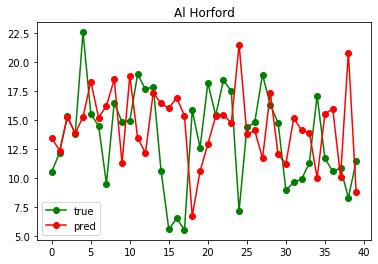

RMSE for the first 10 games
10/10 [==============================] - 0s 314us/step
3.634700030473414
RMSE for the the whole test set
72/72 [==============================] - 0s 62us/step
5.663002437619095


In [581]:
model_2.fit(data_train, label_train, epochs=100000, batch_size=32)

pred = model_2.predict(data_test).T.flatten()

plt.plot(label_test[:40], color="green", label ="true", marker='o')
plt.plot(pred[:40], color="red", label="pred", marker='o')
plt.legend()
plt.title(player_name)
plt.show()

print("RMSE for the first 10 games")
print(np.sqrt(model_2.evaluate(data_test[:10], label_test[:10])))
print("RMSE for the the whole test set")
print(np.sqrt(model_2.evaluate(data_test, label_test)))

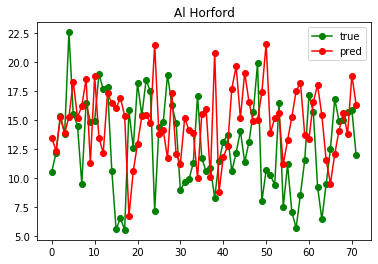

In [583]:
plt.plot(label_test, color="green", label ="true", marker='o')
plt.plot(pred, color="red", label="pred", marker='o')
plt.legend()
plt.title(player_name)
plt.show()

(362, 10)
(362,)
(82, 10)
(82,)
Model: "sequential_163"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_735 (Dense)            (None, 32)                352       
_________________________________________________________________
dense_736 (Dense)            (None, 64)                2112      
_________________________________________________________________
dense_737 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_738 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_739 (Dense)            (None, 1)                 17        
Total params: 5,089
Trainable params: 5,089
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
362/362 [==============================] - 0s 386us/step - loss: 162.705

362/362 [==============================] - 0s 42us/step - loss: 35.7498
Epoch 86/100
362/362 [==============================] - 0s 41us/step - loss: 35.1594
Epoch 87/100
362/362 [==============================] - 0s 41us/step - loss: 35.2218
Epoch 88/100
362/362 [==============================] - 0s 46us/step - loss: 34.3163
Epoch 89/100
362/362 [==============================] - 0s 41us/step - loss: 34.2729
Epoch 90/100
362/362 [==============================] - 0s 41us/step - loss: 36.2887
Epoch 91/100
362/362 [==============================] - 0s 40us/step - loss: 31.6493
Epoch 92/100
362/362 [==============================] - 0s 40us/step - loss: 33.8202
Epoch 93/100
362/362 [==============================] - 0s 42us/step - loss: 33.9583
Epoch 94/100
362/362 [==============================] - 0s 41us/step - loss: 32.9061
Epoch 95/100
362/362 [==============================] - 0s 40us/step - loss: 31.4068
Epoch 96/100
362/362 [==============================] - 0s 40us/step - loss: 3

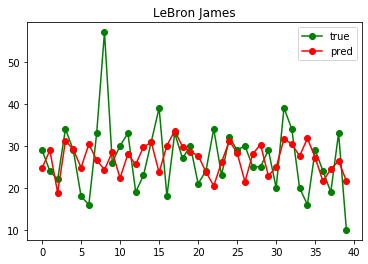

RMSE for the first 10 games
10/10 [==============================] - 0s 2ms/step
11.956761982430368
RMSE for the the whole test set
82/82 [==============================] - 0s 35us/step
9.206050461700322


In [612]:
player_name = player_list_1[2]

trainDate = "2017-08-01"
size=10
# num_of_features=1
############
player_stat = stats_game[stats_game.Player == player_name]
player_stat.index= player_stat.date
trainDF = player_stat[player_stat.index < trainDate].iloc[:,5:]
testDF = player_stat[player_stat.index >= trainDate].iloc[:,5:]
testDF = pd.concat([trainDF[-size:], testDF])

data_train = np.array([[]])
data_train.shape = (0,size)
for i in range(trainDF.shape[0]-size):
    data_train = np.vstack((data_train,trainDF["PTS_G"].values[i:i+size]))

label_train = trainDF.iloc[size:].PTS_G.values

data_test = np.array([[[]]])
data_test.shape = (0,size)
for i in range(testDF.shape[0]-size):
    data_test = np.vstack((data_test, testDF["PTS_G"].values[i:i+size]))

label_test = testDF.iloc[size:].PTS_G.values

print(data_train.shape)
print(label_train.shape)
print(data_test.shape)
print(label_test.shape)

model_2_re = Sequential([
    Dense(32, activation = 'relu', input_shape = (size,)),
    Dense(64, activation = 'relu'),
#     Dropout(0.2),
    Dense(32, activation = 'relu'),
    Dense(16, activation ='relu'),
    Dense(1, activation = 'relu')
])

# For a mean squared error regression problem
model_2_re.compile(optimizer='rmsprop',loss='mse')

model_2_re.summary()
model_2_re.fit(data_train, label_train, epochs=100, batch_size=32)

pred = model_2_re.predict(data_test).T.flatten()

plt.plot(label_test[:40], color="green", label ="true", marker='o')
plt.plot(pred[:40], color="red", label="pred", marker='o')
plt.legend()
plt.title(player_name)
plt.show()

print("RMSE for the first 10 games")
print(np.sqrt(model_2_re.evaluate(data_test[:10], label_test[:10])))
print("RMSE for the the whole test set")
print(np.sqrt(model_2_re.evaluate(data_test, label_test)))

In [627]:
top20_players = stats_game[(stats_game.date<"2016-08-01") & (stats_game.date>"2015-08-01")].groupby("Player").mean().PTS_G.sort_values(ascending=False)[:20].index.to_list()


(384, 10)
(384,)
(51, 10)
(51,)


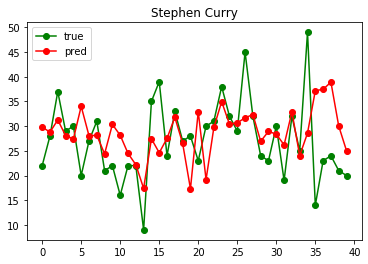

51/51 [==============================] - 0s 46us/step
RMSE for the first 10 games
6.236336076960167
RMSE for the the whole test set
10.3650859972853
(385, 10)
(385,)
(72, 10)
(72,)


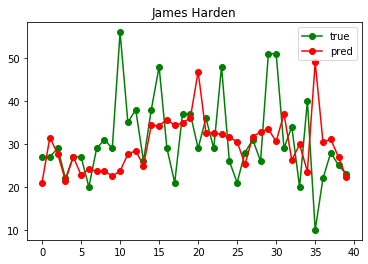

72/72 [==============================] - 0s 35us/step
RMSE for the first 10 games
4.651915305497456
RMSE for the the whole test set
10.89788067791752
(313, 10)
(313,)
(68, 10)
(68,)


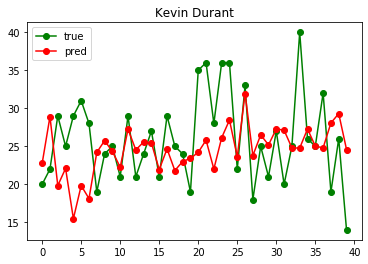

68/68 [==============================] - 0s 37us/step
RMSE for the first 10 games
7.63807033276096
RMSE for the the whole test set
8.46309647207688
(332, 10)
(332,)
(48, 10)
(48,)


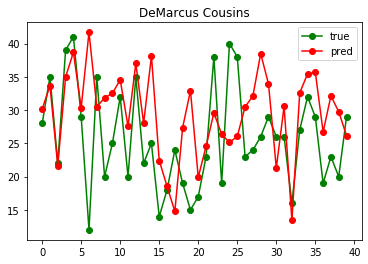

48/48 [==============================] - 0s 60us/step
RMSE for the first 10 games
10.624601468858506
RMSE for the the whole test set
9.093062856609857
(362, 10)
(362,)
(82, 10)
(82,)


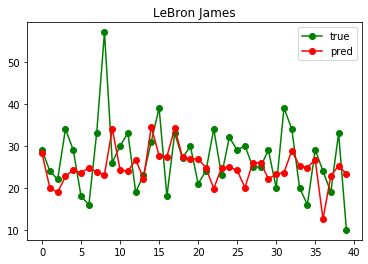

82/82 [==============================] - 0s 29us/step
RMSE for the first 10 games
12.576630952610643
RMSE for the the whole test set
9.303597940356926
(386, 10)
(386,)
(73, 10)
(73,)


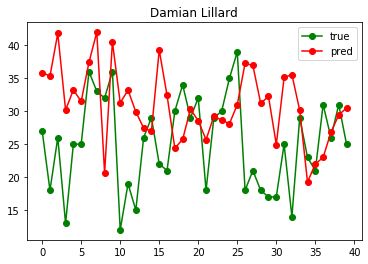

73/73 [==============================] - 0s 36us/step
RMSE for the first 10 games
11.247303279217089
RMSE for the the whole test set
10.234585150763326
(325, 10)
(325,)
(75, 10)
(75,)


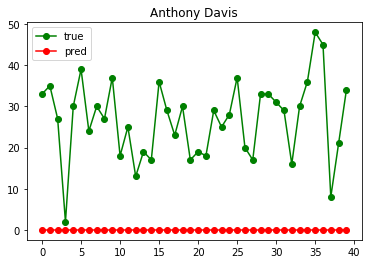

75/75 [==============================] - 0s 37us/step
RMSE for the first 10 games
30.06991872631237
RMSE for the the whole test set
29.69174966842466
(346, 10)
(346,)
(80, 10)
(80,)


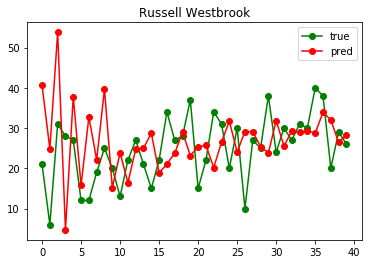

80/80 [==============================] - 0s 45us/step
RMSE for the first 10 games
16.157913092895942
RMSE for the the whole test set
10.731251109083738
(363, 10)
(363,)
(80, 10)
(80,)


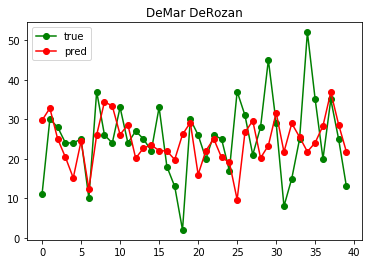

80/80 [==============================] - 0s 32us/step
RMSE for the first 10 games
8.6178479602971
RMSE for the the whole test set
10.5967693515957
(311, 10)
(311,)
(79, 10)
(79,)


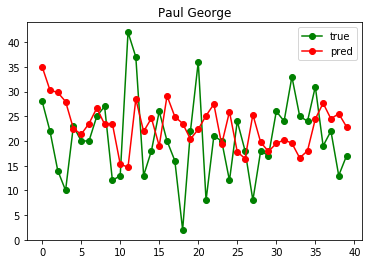

79/79 [==============================] - 0s 34us/step
RMSE for the first 10 games
9.231429971375304
RMSE for the the whole test set
9.514914458334685
(366, 10)
(366,)
(33, 10)
(33,)


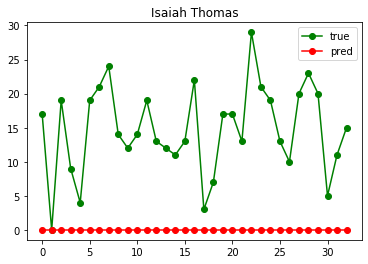

33/33 [==============================] - 0s 70us/step
RMSE for the first 10 games
15.700318468107582
RMSE for the the whole test set
16.073693924037386
(388, 10)
(388,)
(73, 10)
(73,)


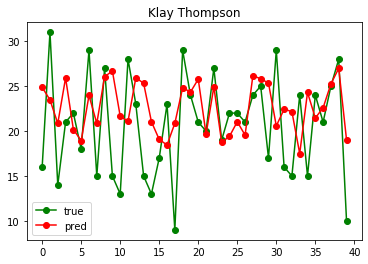

73/73 [==============================] - 0s 35us/step
RMSE for the first 10 games
6.384450452510882
RMSE for the the whole test set
7.65579934013602
(320, 10)
(320,)
(78, 10)
(78,)


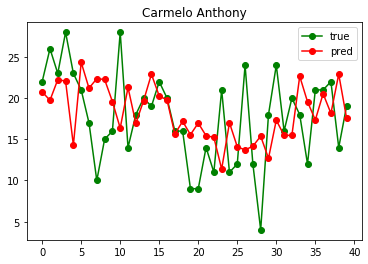

78/78 [==============================] - 0s 37us/step
RMSE for the first 10 games
6.32363664611819
RMSE for the the whole test set
7.2228712609142
(313, 10)
(313,)
(58, 10)
(58,)


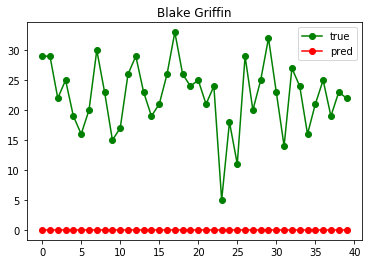

58/58 [==============================] - 0s 32us/step
RMSE for the first 10 games
23.37092236534603
RMSE for the the whole test set
22.327499572723973
(344, 10)
(344,)
(78, 10)
(78,)


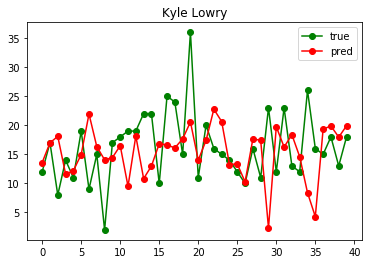

78/78 [==============================] - 0s 33us/step
RMSE for the first 10 games
6.697769693410397
RMSE for the the whole test set
8.200869331298051
(324, 10)
(324,)
(9, 10)
(9,)


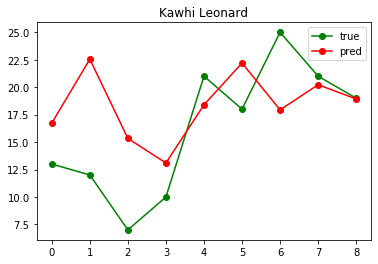

9/9 [==============================] - 0s 84us/step
RMSE for the first 10 games
5.569234992591888
RMSE for the the whole test set
5.569234992591888
(367, 10)
(367,)
(80, 10)
(80,)


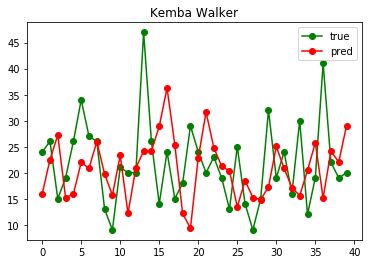

80/80 [==============================] - 0s 39us/step
RMSE for the first 10 games
7.855325493627864
RMSE for the the whole test set
9.893818137054145
(250, 10)
(250,)
(81, 10)
(81,)


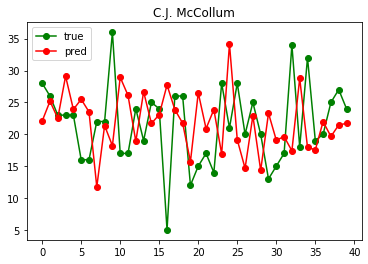

81/81 [==============================] - 0s 39us/step
RMSE for the first 10 games
8.018366710990092
RMSE for the the whole test set
9.111537308274327
(235, 10)
(235,)
(82, 10)
(82,)


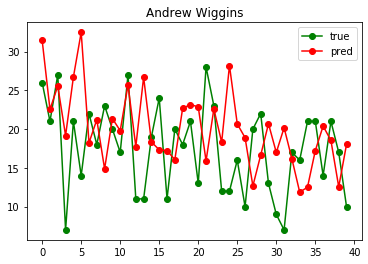

82/82 [==============================] - 0s 34us/step
RMSE for the first 10 games
8.053445152281151
RMSE for the the whole test set
7.633997151693087
(348, 10)
(348,)
(59, 10)
(59,)


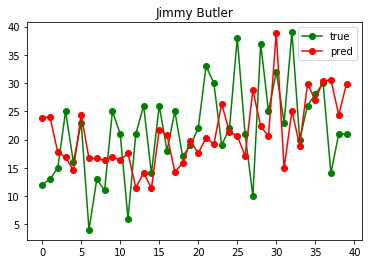

59/59 [==============================] - 0s 37us/step
RMSE for the first 10 games
7.792261627927811
RMSE for the the whole test set
9.080849167593481


In [636]:
trainDate = "2017-08-01"
size=10
# num_of_features=1
############

rmse10_list = []
rmseall_list = []
for player_name in top20_players:

    player_stat = stats_game[stats_game.Player == player_name]
    player_stat.index= player_stat.date
    trainDF = player_stat[player_stat.index < trainDate].iloc[:,5:]
    testDF = player_stat[player_stat.index >= trainDate].iloc[:,5:]
    testDF = pd.concat([trainDF[-size:], testDF])

    data_train = np.array([[]])
    data_train.shape = (0,size)
    for i in range(trainDF.shape[0]-size):
        data_train = np.vstack((data_train,trainDF["PTS_G"].values[i:i+size]))

    label_train = trainDF.iloc[size:].PTS_G.values

    data_test = np.array([[[]]])
    data_test.shape = (0,size)
    for i in range(testDF.shape[0]-size):
        data_test = np.vstack((data_test, testDF["PTS_G"].values[i:i+size]))

    label_test = testDF.iloc[size:].PTS_G.values

    print(data_train.shape)
    print(label_train.shape)
    print(data_test.shape)
    print(label_test.shape)

    model_2_re = Sequential([
        Dense(32, activation = 'relu', input_shape = (size,)),
        Dense(64, activation = 'relu'),
    #     Dropout(0.2),
        Dense(32, activation = 'relu'),
        Dense(16, activation ='relu'),
        Dense(1, activation = 'relu')
    ])

    # For a mean squared error regression problem
    model_2_re.compile(optimizer='rmsprop',loss='mse')

#     model_2_re.summary()
    model_2_re.fit(data_train, label_train, epochs=100, batch_size=32, verbose=0)

    pred = model_2_re.predict(data_test).T.flatten()

    plt.plot(label_test[:40], color="green", label ="true", marker='o')
    plt.plot(pred[:40], color="red", label="pred", marker='o')
    plt.legend()
    plt.title(player_name)
    plt.show()

    rmse10 = np.sqrt(model_2_re.evaluate(data_test[:10], label_test[:10]))
    rmseall = np.sqrt(model_2_re.evaluate(data_test, label_test))
    rmse10_list.append(rmse10)
    rmseall_list.append(rmseall)
    print("RMSE for the first 10 games")
    print(rmse10)
    print("RMSE for the the whole test set")
    print(rmseall)

In [639]:
np.mean(rmse10_list)

10.64088493848487

In [640]:
np.mean(rmseall_list)

11.083108193438258

# third model
- same as second, but with EWMA data

In [668]:
# player_name = "LeBron James"
trainDate = "2017-08-01"
size=5
# num_of_features=1
############
player_stat = stats_game[stats_game.Player == player_name]
player_stat.index= player_stat.date
trainDF = player_stat[player_stat.index < trainDate].iloc[:,5:]
testDF = player_stat[player_stat.index >= trainDate].iloc[:,5:]
testDF = pd.concat([trainDF[-size:], testDF])

data_train = np.array([[]])
data_train.shape = (0,size)
for i in range(trainDF.shape[0]-size):
    new_data = trainDF["PTS_G"].iloc[i:i+size].ewm(com=0.5).mean()    
    data_train = np.vstack((data_train,new_data))

label_train = trainDF.ewm(com=0.5).mean().iloc[size:].PTS_G.values

data_test = np.array([[[]]])
data_test.shape = (0,size)
for i in range(testDF.shape[0]-size):
    new_data = testDF["PTS_G"].iloc[i:i+size].ewm(com=0.5).mean()    
    data_test = np.vstack((data_test, new_data))

label_test = testDF.ewm(com=0.5).mean().iloc[size:].PTS_G.values

print(data_train.shape)
print(label_train.shape)
print(data_test.shape)
print(label_test.shape)

model_3 = Sequential([
    Dense(32, activation = 'relu', input_shape = (size,)),
    Dense(64, activation = 'relu'),
#     Dropout(0.2),
    Dense(32, activation = 'relu'),
    Dense(16, activation ='relu'),
    Dense(1, activation = 'relu')
])

# For a mean squared error regression problem
model_3.compile(optimizer='rmsprop',loss='mse')

model_3.summary()

(324, 5)
(324,)
(72, 5)
(72,)
Model: "sequential_226"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1050 (Dense)           (None, 32)                192       
_________________________________________________________________
dense_1051 (Dense)           (None, 64)                2112      
_________________________________________________________________
dense_1052 (Dense)           (None, 32)                2080      
_________________________________________________________________
dense_1053 (Dense)           (None, 16)                528       
_________________________________________________________________
dense_1054 (Dense)           (None, 1)                 17        
Total params: 4,929
Trainable params: 4,929
Non-trainable params: 0
_________________________________________________________________


Epoch 1/100
324/324 [==============================] - 0s 54us/step - loss: 13.9743
Epoch 2/100
324/324 [==============================] - 0s 44us/step - loss: 13.9567
Epoch 3/100
324/324 [==============================] - 0s 41us/step - loss: 14.7252
Epoch 4/100
324/324 [==============================] - 0s 47us/step - loss: 13.7349
Epoch 5/100
324/324 [==============================] - 0s 42us/step - loss: 14.0984
Epoch 6/100
324/324 [==============================] - 0s 46us/step - loss: 14.9001
Epoch 7/100
324/324 [==============================] - 0s 43us/step - loss: 14.0488
Epoch 8/100
324/324 [==============================] - 0s 53us/step - loss: 13.8502
Epoch 9/100
324/324 [==============================] - 0s 42us/step - loss: 15.0791
Epoch 10/100
324/324 [==============================] - 0s 44us/step - loss: 13.6185
Epoch 11/100
324/324 [==============================] - 0s 53us/step - loss: 14.4433
Epoch 12/100
324/324 [==============================] - 0s 41us/step - los

324/324 [==============================] - 0s 43us/step - loss: 11.8292
Epoch 98/100
324/324 [==============================] - 0s 39us/step - loss: 12.1338
Epoch 99/100
324/324 [==============================] - 0s 40us/step - loss: 12.6675
Epoch 100/100
324/324 [==============================] - 0s 44us/step - loss: 11.7843


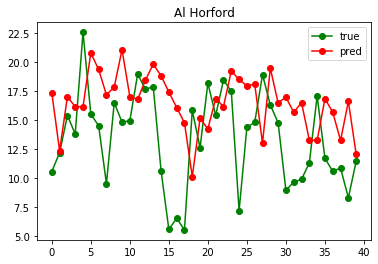

RMSE for the first 10 games
10/10 [==============================] - 0s 97us/step
4.979961869120637
RMSE for the the whole test set
72/72 [==============================] - 0s 36us/step
5.132877901029304


In [670]:
model_3.fit(data_train, label_train, epochs=100, batch_size=32)

pred = model_3.predict(data_test).T.flatten()

plt.plot(label_test[:40], color="green", label ="true", marker='o')
plt.plot(pred[:40], color="red", label="pred", marker='o')
plt.legend()
plt.title(player_name)
plt.show()

print("RMSE for the first 10 games")
print(np.sqrt(model_3.evaluate(data_test[:10], label_test[:10])))
print("RMSE for the the whole test set")
print(np.sqrt(model_3.evaluate(data_test, label_test)))

# fourth model
- using all 9 metrics
- data: 50 games * 9 metrics
- label: next game's PTS_G
- 1d convolution with kernel size = 3

In [605]:
player_name = "LeBron James"
trainDate = "2017-08-01"
size=50
num_of_features=9
############
player_stat = stats_game[stats_game.Player == player_name]
player_stat.index= player_stat.date
trainDF = player_stat[player_stat.index < trainDate].iloc[:,5:]
testDF = player_stat[player_stat.index >= trainDate].iloc[:,5:]
testDF = pd.concat([trainDF[-size:], testDF])

data_train = np.array([[[]]])
data_train.shape = (size,num_of_features,0)
for i in range(trainDF.shape[0]-size):
    data_train = np.dstack((data_train,trainDF.values[i: i+size,:]))
data_train = np.swapaxes(data_train,0,2)
data_train = np.swapaxes(data_train,1,2)

label_train = trainDF.iloc[size:].PTS_G.values

data_test = np.array([[[]]])
data_test.shape = (size,num_of_features,0)
for i in range(testDF.shape[0]-size):
    data_test = np.dstack((data_test,testDF.values[i: i+size,:]))
data_test = np.swapaxes(data_test,0,2)
data_test = np.swapaxes(data_test,1,2)

label_test = testDF.iloc[size:].PTS_G.values

print(data_train.shape)
print(label_train.shape)
print(data_test.shape)
print(label_test.shape)

model = Sequential([
    Conv1D(1, kernel_size=3, input_shape = (size, 9)),
    Dense(32, activation = 'relu'),
    Dense(64, activation = 'relu'),
#     Dropout(0.2),
    Dense(32, activation = 'relu'),
    Flatten(),
    Dense(16, activation ='relu'),
    Dense(1, activation = 'relu')
])

# For a mean squared error regression problem
model.compile(optimizer='rmsprop',loss='mse')

model.summary()

(322, 50, 9)
(322,)
(82, 50, 9)
(82,)
Model: "sequential_160"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_98 (Conv1D)           (None, 48, 1)             28        
_________________________________________________________________
dense_720 (Dense)            (None, 48, 32)            64        
_________________________________________________________________
dense_721 (Dense)            (None, 48, 64)            2112      
_________________________________________________________________
dense_722 (Dense)            (None, 48, 32)            2080      
_________________________________________________________________
flatten_77 (Flatten)         (None, 1536)              0         
_________________________________________________________________
dense_723 (Dense)            (None, 16)                24592     
_________________________________________________________________
dense_724 (Den

In [647]:
model.fit(data_train, label_train, epochs=10, batch_size=32)
pred = model.predict(data_test).T.flatten()

plt.plot(label_test[:40], color="green", label ="true", marker='o')
plt.plot(pred[:40], color="red", label="pred", marker='o')
plt.legend()
plt.title(player_name)
plt.show()

print("RMSE for the first 10 games")
print(np.sqrt(model.evaluate(data_test[:10], label_test[:10])))
print("RMSE for the the whole test set")
print(np.sqrt(model.evaluate(data_test, label_test)))

ValueError: Error when checking input: expected conv1d_98_input to have 3 dimensions, but got array with shape (323, 6)